# PunctaFinder: preserved 5/7/9 px detection with 10 px and 3 px rescue, LC3-GFP ring flags, and Parkin analysis

This notebook deliberately returns to the earlier, conservative detection hierarchy:

1. **5, 7, and 9 px** standard searches establish the baseline punctum calls.
2. A **10 px large-object rescue** can add only unmatched objects whose measured diameter is in the large class.
3. A **3 px very-small-object rescue** runs last and can add only unmatched objects in its configured small-diameter interval.

The annular/circular analysis is **post-detection and non-destructive**. It is performed on zero-based **channel 1 (LC3-GFP)** after the punctum labels are finalized, so ring classification cannot remove, replace, resize, or reassign any punctum found by the preserved detector. The punctum overlays are also displayed on channel 1. Zero-based **channel 2 remains mCherry-Parkin** and is used only for replicate-specific Parkin-recruitment analysis. One threshold is calibrated within each matched replicate from its CCCP cells and then applied to all groups in that replicate. Raw mean intensities are additionally reported as a percentage of the matched replicate's DMSO whole-cell mean for the same channel.


In [1]:
print('hello world')

hello world


## Folder layout, path resolution, and outputs

The safest arrangement is:

```text
project_folder/
├── this_notebook.ipynb
├── input_image/
│   ├── CCCP_2hrs_biorep1_techrep1_field1_all_channels.tif
│   └── DMSO_2hrs_biorep1_techrep1_field1_all_channels.tif
└── input_mask/
    ├── CCCP_2hrs_biorep1_techrep1_field1_cellpose3ch_cp_masks.png
    └── DMSO_2hrs_biorep1_techrep1_field1_cellpose3ch_cp_masks.png
```

The default output folder is:

```text
puncta_output_preserved_5_7_9_plus_10_3_replicate_threshold_DMSO_normalized/
├── tables/
│   ├── puncta_measurements.csv
│   ├── cell_summary.csv
│   ├── cell_puncta_density.csv
│   ├── field_summary.csv
│   ├── parkin_mask_cell_analysis.csv
│   ├── parkin_mask_field_analysis.csv
│   ├── parkin_mask_processing_log.csv
│   ├── parkin_threshold_calibration_cell_otsu.csv
│   ├── parkin_threshold_calibration_summary.csv
│   ├── parkin_threshold_calibration_log.csv
│   ├── parkin_puncta_partition_cell_analysis.csv
│   ├── parkin_puncta_partition_field_analysis.csv
│   ├── parkin_puncta_partition_processing_log.csv
│   ├── raw_channel_cell_analysis.csv
│   ├── raw_channel_field_analysis.csv
│   ├── raw_channel_intensity_processing_log.csv
│   ├── filename_metadata_audit.csv
│   ├── replicate_control_whole_cell_intensity_references.csv
│   ├── replicate_control_intensity_normalization_audit.csv
│   ├── replicate_control_intensity_normalization_design.csv
│   ├── candidate_audit.csv
│   ├── file_pairs.csv
│   ├── pairing_audit.csv
│   ├── processing_log.csv
│   └── run_parameters.csv
├── puncta_masks/
├── overlays/
├── parkin_masks/
├── parkin_overlays/
├── parkin_puncta_partition_masks/
├── parkin_puncta_partition_overlays/
└── figures/
    ├── CCCP_vs_DMSO_punctum_equivalent_diameter_um_histogram.pdf
    └── CCCP_vs_DMSO_punctum_area_um2_histogram.pdf
```

With the default skip policies, missing folders, empty folders, unmatched files, ambiguous names, missing optional correlation channels, and individual Parkin-analysis failures are logged rather than stopping valid fields from being processed. A missing or unusable CCCP calibration set skips only Parkin-mask analysis; punctum analysis and physical-area outputs are still written.
The partition masks are exhaustive within each cell: their union equals the cleaned Parkin recruitment mask and their intersection is empty. The cell-labeled TIFFs retain the original cell identifiers for downstream spatial analysis.


`cell_summary.csv` and `field_summary.csv` contain the new raw whole-cell channel measurements in addition to the dedicated compact raw-channel tables. At field level, `within_all_cell_masks_raw_*` columns are pixel-weighted measurements over the union of all labeled cell masks, whereas `cell_mean_across_cells_raw_*` columns summarize the distribution of per-cell mean intensities and therefore weight each cell equally.


In [ ]:
# Run this once only if the required packages are not already installed.
# Uncomment the next line, execute it, and then restart the kernel.
# %pip install numpy pandas scipy scikit-image tifffile imageio pillow matplotlib


## Imports, robust project discovery, fault-tolerant pairing, and image loading

The code normalizes supported microscopy files to channel–y–x order and requires a two-dimensional labeled cell mask. Pairing remains conservative: it accepts an exact normalized-stem match, a unique prefix match, or an explicit override. It never guesses among multiple masks.

Under the default skip policy, missing/empty input folders, unmatched images, ambiguous matches, and invalid overrides are represented in `pairing_audit.csv` rather than stopping the notebook. Strict behavior remains available with `PAIRING_ERROR_POLICY = "raise"`.

In [2]:
from __future__ import annotations

import json
import math
import re
import time
import traceback
from pathlib import Path
from typing import Any, Iterable

import imageio.v3 as iio
import numpy as np
import pandas as pd
import tifffile
from PIL import Image, ImageDraw
from scipy import ndimage as ndi
from skimage import filters, segmentation
from skimage.segmentation import find_boundaries

IMAGE_EXTENSIONS = {".tif", ".tiff", ".png", ".jpg", ".jpeg"}
MASK_EXTENSIONS = {".tif", ".tiff", ".png"}


def _remove_image_extension(name: str) -> str:
    lower = name.lower()
    for ext in (".ome.tiff", ".ome.tif", ".tiff", ".tif", ".png", ".jpeg", ".jpg"):
        if lower.endswith(ext):
            return name[: -len(ext)]
    return Path(name).stem


def _image_stem(path: Path) -> str:
    return _remove_image_extension(path.name)


def canonical_pairing_key(path: Path) -> str:
    """Create a conservative key for names such as *_all_channels and *_cp_masks."""
    stem = _remove_image_extension(path.name)
    patterns = [
        r"(?:[\s_-]*(?:cellpose(?:[\s_-]*3ch)?(?:[\s_-]*cp)?[\s_-]*masks?))$",
        r"(?:[\s_-]*(?:cellpose[\s_-]*masks?))$",
        r"(?:[\s_-]*(?:cellpose(?:[\s_-]*3ch)?))$",
        r"(?:[\s_-]*(?:segmentation|segmented|instance[\s_-]*labels?))$",
        r"(?:[\s_-]*(?:cp[\s_-]*masks?))$",
        r"(?:[\s_-]*(?:cell[\s_-]*masks?))$",
        r"(?:[\s_-]*(?:labels?))$",
        r"(?:[\s_-]*(?:masks?))$",
        r"(?:[\s_-]*(?:all[\s_-]*channels?))$",
        r"(?:[\s_-]*(?:merged|composite))$",
        r"(?:[\s_-]*(?:images?|imgs?))$",
    ]
    previous = None
    while stem != previous:
        previous = stem
        for pattern in patterns:
            stem = re.sub(pattern, "", stem, flags=re.IGNORECASE)
    return re.sub(r"[^a-z0-9]+", "", stem.lower())


def _deduplicate_paths(paths: Iterable[Path]) -> list[Path]:
    unique: list[Path] = []
    seen: set[str] = set()
    for path in paths:
        try:
            resolved = path.expanduser().resolve()
        except OSError:
            resolved = path.expanduser().absolute()
        key = str(resolved).casefold()
        if key not in seen:
            seen.add(key)
            unique.append(resolved)
    return unique


def resolve_project_directory(
    override: str | Path | None = None,
    *,
    start_dir: str | Path | None = None,
    auto_discover: bool = True,
    image_folder_name: str = "input_image",
    mask_folder_name: str = "input_mask",
) -> tuple[Path, dict[str, Any]]:
    """Resolve a project directory without assuming that Jupyter was launched there.

    Discovery is intentionally shallow and conservative. It checks the current directory,
    its parent, and their immediate child directories. A discovered directory is used only
    when exactly one candidate contains both expected input folders.
    """
    start = Path(start_dir if start_dir is not None else Path.cwd()).expanduser().resolve()

    if override is not None and str(override).strip():
        project = Path(override).expanduser().resolve()
        return project, {
            "method": "explicit PROJECT_DIR_OVERRIDE",
            "start_directory": str(start),
            "project_directory": str(project),
            "candidate_project_directories": json.dumps([str(project)]),
            "message": "Using the explicit project-directory override.",
        }

    def contains_both(folder: Path) -> bool:
        return (folder / image_folder_name).is_dir() and (folder / mask_folder_name).is_dir()

    # When either expected folder already exists in the current directory, do not search
    # elsewhere; this avoids switching away from a partially prepared project.
    if (start / image_folder_name).exists() or (start / mask_folder_name).exists():
        return start, {
            "method": "current working directory",
            "start_directory": str(start),
            "project_directory": str(start),
            "candidate_project_directories": json.dumps([str(start)]),
            "message": "The current working directory already contains at least one input folder.",
        }

    candidates: list[Path] = []
    if auto_discover:
        search_roots = _deduplicate_paths([start, start.parent])
        for root in search_roots:
            if contains_both(root):
                candidates.append(root)
            try:
                children = [child for child in root.iterdir() if child.is_dir() and not child.name.startswith(".")]
            except (OSError, PermissionError):
                children = []
            for child in children:
                if contains_both(child):
                    candidates.append(child)

    candidates = _deduplicate_paths(candidates)
    if len(candidates) == 1:
        project = candidates[0]
        return project, {
            "method": "unique nearby project auto-discovery",
            "start_directory": str(start),
            "project_directory": str(project),
            "candidate_project_directories": json.dumps([str(project)]),
            "message": "Found one nearby directory containing both input folders.",
        }

    if len(candidates) > 1:
        message = (
            "Multiple nearby directories contain both input folders, so the notebook did not "
            "guess. Set PROJECT_DIR_OVERRIDE to the intended project."
        )
    else:
        message = (
            "No nearby directory containing both input folders was found. Using the current "
            "working directory; missing folders can be created under the skip policy."
        )
    return start, {
        "method": "current working directory fallback",
        "start_directory": str(start),
        "project_directory": str(start),
        "candidate_project_directories": json.dumps([str(path) for path in candidates]),
        "message": message,
    }


def list_supported_files(
    folder: Path,
    extensions: set[str],
    *,
    error_policy: str = "skip",
) -> list[Path]:
    """Return supported files; under ``skip`` a missing/unreadable folder yields an empty list."""
    if error_policy not in {"skip", "raise"}:
        raise ValueError("error_policy must be either 'skip' or 'raise'.")
    folder = Path(folder).expanduser()
    if not folder.exists():
        if error_policy == "raise":
            raise FileNotFoundError(f"Required folder does not exist: {folder}")
        return []
    if not folder.is_dir():
        if error_policy == "raise":
            raise NotADirectoryError(f"Input path is not a directory: {folder}")
        return []
    try:
        return [
            path
            for path in sorted(folder.iterdir())
            if path.is_file()
            and path.suffix.lower() in extensions
            and not path.name.startswith(".")
        ]
    except (OSError, PermissionError):
        if error_policy == "raise":
            raise
        return []


PAIR_TABLE_COLUMNS = [
    "image_path",
    "mask_path",
    "image_file",
    "mask_file",
    "pairing_key",
    "match_method",
]

PAIRING_AUDIT_COLUMNS = [
    "record_type",
    "image_path",
    "mask_path",
    "image_file",
    "mask_file",
    "pairing_key",
    "status",
    "action",
    "match_method",
    "candidate_masks",
    "message",
]


def _paths_to_json(paths: Iterable[Path]) -> str:
    return json.dumps([path.name for path in paths])


def pair_images_and_masks(
    image_dir: Path,
    mask_dir: Path,
    pairing_overrides: dict[str, str] | None = None,
    error_policy: str = "skip",
    create_missing_directories: bool = True,
) -> tuple[pd.DataFrame, pd.DataFrame]:
    """Pair images and masks conservatively and return both pairs and a complete audit.

    Under ``error_policy='skip'`` this function never raises merely because an input folder is
    missing/empty or because an image lacks a unique mask. Missing folders can be created so
    the expected location is explicit. Under ``error_policy='raise'`` strict exceptions are
    retained for finalized datasets.
    """
    pairing_overrides = pairing_overrides or {}
    if error_policy not in {"skip", "raise"}:
        raise ValueError("PAIRING_ERROR_POLICY must be either 'skip' or 'raise'.")

    image_dir = Path(image_dir).expanduser().resolve()
    mask_dir = Path(mask_dir).expanduser().resolve()
    rows: list[dict[str, Any]] = []
    audit_rows: list[dict[str, Any]] = []
    used_masks: set[Path] = set()
    strict_errors: list[str] = []
    strict_directory_error = False

    def audit_directory(
        role: str,
        folder: Path,
        *,
        status: str,
        action: str,
        message: str,
    ) -> None:
        audit_rows.append(
            {
                "record_type": f"{role}_directory",
                "image_path": str(folder) if role == "image" else "",
                "mask_path": str(folder) if role == "mask" else "",
                "image_file": "",
                "mask_file": "",
                "pairing_key": "",
                "status": status,
                "action": action,
                "match_method": "",
                "candidate_masks": "[]",
                "message": message,
            }
        )

    def prepare_directory(
        folder: Path,
        role: str,
        extensions: set[str],
    ) -> list[Path]:
        nonlocal strict_directory_error
        role_plural = "images" if role == "image" else "masks"

        if folder.exists() and not folder.is_dir():
            message = f"Configured {role} path exists but is not a directory: {folder}"
            audit_directory(
                role,
                folder,
                status=f"invalid_{role}_directory_path",
                action="skip",
                message=message,
            )
            strict_errors.append(message)
            strict_directory_error = True
            return []

        if not folder.exists():
            if create_missing_directories and error_policy == "skip":
                try:
                    folder.mkdir(parents=True, exist_ok=True)
                except (OSError, PermissionError) as exc:
                    message = f"Could not create missing {role} directory {folder}: {exc}"
                    audit_directory(
                        role,
                        folder,
                        status=f"{role}_directory_creation_failed",
                        action="skip",
                        message=message,
                    )
                    strict_errors.append(message)
                    strict_directory_error = True
                    return []
                message = (
                    f"The {role} directory was missing and has been created at {folder}. "
                    f"It currently contains no supported {role_plural}."
                )
                audit_directory(
                    role,
                    folder,
                    status=f"missing_{role}_directory_created",
                    action="created_empty_directory",
                    message=message,
                )
                return []

            message = f"Required {role} directory does not exist: {folder}"
            audit_directory(
                role,
                folder,
                status=f"missing_{role}_directory",
                action="skip",
                message=message,
            )
            strict_errors.append(message)
            strict_directory_error = True
            return []

        try:
            files = list_supported_files(folder, extensions, error_policy="raise")
        except (OSError, PermissionError, FileNotFoundError, NotADirectoryError) as exc:
            message = f"Could not read {role} directory {folder}: {exc}"
            audit_directory(
                role,
                folder,
                status=f"unreadable_{role}_directory",
                action="skip",
                message=message,
            )
            strict_errors.append(message)
            strict_directory_error = True
            return []

        if not files:
            message = f"No supported {role_plural} were found in {folder}."
            audit_directory(
                role,
                folder,
                status=f"no_supported_{role_plural}",
                action="skip" if role == "image" else "no_masks_available",
                message=message,
            )
            if role == "image":
                strict_errors.append(message)
        return files

    images = prepare_directory(image_dir, "image", IMAGE_EXTENSIONS)
    masks = prepare_directory(mask_dir, "mask", MASK_EXTENSIONS)

    masks_by_name = {path.name: path for path in masks}
    masks_by_key: dict[str, list[Path]] = {}
    for path in masks:
        masks_by_key.setdefault(canonical_pairing_key(path), []).append(path)

    def audit_image(
        image_path: Path,
        *,
        mask_path: Path | None,
        status: str,
        action: str,
        match_method: str,
        candidates: Iterable[Path],
        message: str,
        mask_file_override: str = "",
    ) -> None:
        audit_rows.append(
            {
                "record_type": "image",
                "image_path": str(image_path),
                "mask_path": str(mask_path) if mask_path is not None else "",
                "image_file": image_path.name,
                "mask_file": mask_path.name if mask_path is not None else mask_file_override,
                "pairing_key": canonical_pairing_key(image_path),
                "status": status,
                "action": action,
                "match_method": match_method,
                "candidate_masks": _paths_to_json(candidates),
                "message": message,
            }
        )

    for image_path in images:
        key = canonical_pairing_key(image_path)
        mask_path: Path | None = None
        match_method = ""
        candidate_paths: list[Path] = []
        issue_status = ""
        issue_message = ""
        override_mask_name = ""

        if image_path.name in pairing_overrides:
            override_mask_name = str(pairing_overrides[image_path.name])
            candidate = masks_by_name.get(override_mask_name)
            if candidate is None:
                issue_status = "invalid_override"
                issue_message = (
                    f"Override points to {override_mask_name!r}, which is not present in "
                    f"{mask_dir}."
                )
            elif candidate in used_masks:
                candidate_paths = [candidate]
                issue_status = "mask_already_used"
                issue_message = (
                    f"Override mask {candidate.name!r} has already been paired with another image."
                )
            else:
                mask_path = candidate
                candidate_paths = [candidate]
                match_method = "override"
        else:
            exact_all = list(masks_by_key.get(key, []))
            exact_unused = [mask for mask in exact_all if mask not in used_masks]
            if len(exact_unused) == 1:
                mask_path = exact_unused[0]
                candidate_paths = exact_unused
                match_method = "normalized stem"
            elif len(exact_unused) > 1:
                candidate_paths = exact_unused
                issue_status = "ambiguous_match"
                issue_message = (
                    "Multiple masks have the same normalized stem; add an exact entry to "
                    "PAIRING_OVERRIDES."
                )
            elif exact_all:
                candidate_paths = exact_all
                issue_status = "mask_already_used"
                issue_message = "The normalized-stem mask candidate has already been used."
            else:
                prefix_all = [
                    mask
                    for mask in masks
                    if (
                        canonical_pairing_key(mask).startswith(key)
                        or key.startswith(canonical_pairing_key(mask))
                    )
                ]
                prefix_unused = [mask for mask in prefix_all if mask not in used_masks]
                if len(prefix_unused) == 1:
                    mask_path = prefix_unused[0]
                    candidate_paths = prefix_unused
                    match_method = "unique prefix"
                elif len(prefix_unused) > 1:
                    candidate_paths = prefix_unused
                    issue_status = "ambiguous_match"
                    issue_message = (
                        "Multiple prefix-compatible masks were found; add an exact entry to "
                        "PAIRING_OVERRIDES."
                    )
                elif prefix_all:
                    candidate_paths = prefix_all
                    issue_status = "mask_already_used"
                    issue_message = "All prefix-compatible masks have already been used."
                else:
                    issue_status = "unmatched_image"
                    issue_message = (
                        "No normalized-stem or unique-prefix mask was found. The image will be "
                        "skipped; add the corresponding mask or an exact override to process it."
                    )

        if mask_path is not None:
            used_masks.add(mask_path)
            rows.append(
                {
                    "image_path": image_path,
                    "mask_path": mask_path,
                    "image_file": image_path.name,
                    "mask_file": mask_path.name,
                    "pairing_key": key,
                    "match_method": match_method,
                }
            )
            audit_image(
                image_path,
                mask_path=mask_path,
                status="paired",
                action="process",
                match_method=match_method,
                candidates=candidate_paths,
                message=f"Paired by {match_method}.",
            )
        else:
            candidate_text = [path.name for path in candidate_paths]
            strict_message = (
                f"Could not uniquely pair {image_path.name!r}. "
                f"Status: {issue_status}. Candidate masks: {candidate_text or 'none'}. "
                f"{issue_message}"
            )
            strict_errors.append(strict_message)
            audit_image(
                image_path,
                mask_path=None,
                status=issue_status,
                action="skip",
                match_method="",
                candidates=candidate_paths,
                message=issue_message,
                mask_file_override=override_mask_name,
            )

    for mask_path in masks:
        if mask_path in used_masks:
            continue
        audit_rows.append(
            {
                "record_type": "mask",
                "image_path": "",
                "mask_path": str(mask_path),
                "image_file": "",
                "mask_file": mask_path.name,
                "pairing_key": canonical_pairing_key(mask_path),
                "status": "unused_mask",
                "action": "not_processed",
                "match_method": "",
                "candidate_masks": "[]",
                "message": "No image was paired with this mask.",
            }
        )

    pairs = pd.DataFrame(rows, columns=PAIR_TABLE_COLUMNS)
    audit = pd.DataFrame(audit_rows, columns=PAIRING_AUDIT_COLUMNS)

    if strict_errors and error_policy == "raise":
        message = "\n".join(strict_errors)
        if strict_directory_error:
            raise FileNotFoundError(message)
        raise ValueError(message)
    return pairs, audit

def _infer_cyx_without_axes(array: np.ndarray) -> tuple[np.ndarray, str]:
    array = np.squeeze(np.asarray(array))
    if array.ndim == 2:
        return array[np.newaxis, :, :], "YX inferred as CYX"
    if array.ndim != 3:
        raise ValueError(
            f"Cannot infer channel axis for shape {array.shape}. Supply 2-D or 3-D image data, "
            "or use a TIFF/OME-TIFF with axis metadata."
        )

    first_is_channel = array.shape[0] <= 32 and array.shape[1] > 32 and array.shape[2] > 32
    last_is_channel = array.shape[2] <= 32 and array.shape[0] > 32 and array.shape[1] > 32
    if first_is_channel and not last_is_channel:
        return array, "CYX inferred"
    if last_is_channel and not first_is_channel:
        return np.moveaxis(array, -1, 0), "YXC inferred and transposed to CYX"
    raise ValueError(
        f"Ambiguous 3-D shape {array.shape}; neither the first nor last axis is an "
        "unambiguous channel axis. Convert to CYX/YXC or use TIFF axis metadata."
    )


def normalize_to_cyx(
    array: np.ndarray,
    axes: str | None,
    extra_axis_reduction: str = "max",
) -> tuple[np.ndarray, dict[str, Any]]:
    """Normalize a microscopy array to (channel, y, x)."""
    original_shape = tuple(array.shape)
    original_axes = axes
    array = np.asarray(array)
    reduction_notes: list[str] = []

    if axes is None or len(axes) != array.ndim:
        cyx, note = _infer_cyx_without_axes(array)
        return cyx, {
            "original_shape": original_shape,
            "original_axes": original_axes,
            "normalized_shape": tuple(cyx.shape),
            "axis_notes": note,
        }

    axes_list = list(axes.upper())
    if "C" not in axes_list and "S" in axes_list:
        axes_list[axes_list.index("S")] = "C"

    if "C" not in axes_list and "Y" in axes_list and "X" in axes_list:
        non_spatial = [i for i, axis in enumerate(axes_list) if axis not in {"Y", "X"}]
        if len(non_spatial) == 1 and array.shape[non_spatial[0]] <= 32:
            axes_list[non_spatial[0]] = "C"
            reduction_notes.append("single small non-spatial axis interpreted as channels")

    for axis_index in range(array.ndim - 1, -1, -1):
        axis_name = axes_list[axis_index]
        if axis_name in {"C", "Y", "X"}:
            continue
        if extra_axis_reduction == "max":
            array = np.max(array, axis=axis_index)
        elif extra_axis_reduction == "mean":
            array = np.mean(array, axis=axis_index)
        elif extra_axis_reduction == "first":
            array = np.take(array, 0, axis=axis_index)
        else:
            raise ValueError("EXTRA_AXIS_REDUCTION must be 'max', 'mean', or 'first'.")
        reduction_notes.append(f"{axis_name} reduced with {extra_axis_reduction}")
        axes_list.pop(axis_index)

    if "Y" not in axes_list or "X" not in axes_list:
        cyx, note = _infer_cyx_without_axes(array)
        reduction_notes.append(note)
    else:
        if "C" not in axes_list:
            array = np.expand_dims(array, axis=0)
            axes_list.insert(0, "C")
        if axes_list.count("C") != 1 or axes_list.count("Y") != 1 or axes_list.count("X") != 1:
            raise ValueError(f"Unsupported axes after normalization: {''.join(axes_list)}")
        order = [axes_list.index("C"), axes_list.index("Y"), axes_list.index("X")]
        cyx = np.transpose(array, order)

    return cyx, {
        "original_shape": original_shape,
        "original_axes": original_axes,
        "normalized_shape": tuple(cyx.shape),
        "axis_notes": "; ".join(reduction_notes) if reduction_notes else "none",
    }


def load_multichannel_image(
    path: Path,
    extra_axis_reduction: str = "max",
) -> tuple[np.ndarray, dict[str, Any]]:
    if path.suffix.lower() in {".tif", ".tiff"}:
        with tifffile.TiffFile(path) as tif:
            series = tif.series[0]
            array = series.asarray()
            axes = getattr(series, "axes", None)
    else:
        array = iio.imread(path)
        axes = None
    cyx, metadata = normalize_to_cyx(array, axes, extra_axis_reduction)
    if not np.issubdtype(cyx.dtype, np.number):
        raise TypeError(f"Image {path.name} has non-numeric dtype {cyx.dtype}.")
    if not np.all(np.isfinite(cyx)):
        raise ValueError(f"Image {path.name} contains NaN or infinite values.")
    metadata["dtype"] = str(cyx.dtype)
    return cyx, metadata


def load_label_mask(path: Path) -> np.ndarray:
    if path.suffix.lower() in {".tif", ".tiff"}:
        mask = tifffile.imread(path)
    else:
        mask = iio.imread(path)
    mask = np.squeeze(np.asarray(mask))

    if mask.ndim == 3:
        if mask.shape[-1] in {3, 4} and np.all(mask == mask[..., :1]):
            mask = mask[..., 0]
        elif mask.shape[0] in {3, 4} and np.all(mask == mask[:1, ...]):
            mask = mask[0]
        else:
            raise ValueError(
                f"Mask {path.name} has shape {mask.shape}. A labeled 2-D mask is required; "
                "colorized masks do not preserve label IDs."
            )
    if mask.ndim != 2:
        raise ValueError(f"Mask {path.name} must be 2-D after squeezing; got {mask.shape}.")

    if np.issubdtype(mask.dtype, np.floating):
        if not np.all(np.isfinite(mask)):
            raise ValueError(f"Mask {path.name} contains NaN or infinite values.")
        if not np.allclose(mask, np.rint(mask)):
            raise ValueError(f"Mask {path.name} contains non-integer floating-point labels.")
        mask = np.rint(mask)

    unique = np.unique(mask)
    positive = unique[unique > 0]
    if positive.size <= 1:
        labeled, _ = ndi.label(mask > 0)
        return labeled.astype(np.uint32)
    if np.min(mask) < 0:
        raise ValueError(f"Mask {path.name} contains negative labels.")
    return mask.astype(np.uint32, copy=False)


## Configuration

Punctum detection and annular/circular flagging use Python zero-based **channel 1 (LC3-GFP)**. The Parkin-recruitment mask uses zero-based **channel 2 (mCherry-Parkin)**.

The physical conversion uses the explicitly configured isotropic XY pixel size. The default is `0.10419921875` micrometers per pixel; it is not silently replaced by image metadata.

Parkin thresholding is replicate-specific:

1. treatment group and replicate identifiers are inferred from each filename;
2. within each replicate, an Otsu threshold is calculated independently for every eligible CCCP cell on the identically preprocessed channel-2 image;
3. those cell thresholds are reduced to one absolute value for that replicate, using the median by default;
4. the replicate-specific value is applied without further adjustment to DMSO, CCCP, CCCPandNMS, and any other group in the same replicate.

If a replicate has no usable CCCP calibration cells, the default behavior is to skip only that replicate's Parkin-mask analysis while retaining all punctum and raw-intensity outputs. An equal-replicate fallback can be enabled explicitly, or missing thresholds can be made fatal.

For batch-normalized intensities, the DMSO reference for each replicate and channel is the arithmetic mean of the per-cell raw mean intensities measured in complete cell masks. Raw mean intensities in whole-cell, punctum, Parkin, and Parkin/punctum-partition masks are reported as a percentage of that matched reference. Integrated sums remain raw because a mean-intensity reference is not dimensionally comparable to an area-dependent sum.


In [3]:
# Project location. Set an explicit absolute path when desired; otherwise the notebook
# conservatively discovers a unique nearby project folder or falls back to Path.cwd().
PROJECT_DIR_OVERRIDE = None
# Example on Windows:
# PROJECT_DIR_OVERRIDE = Path(r"C:\Users\name\Desktop\puncta_project")

AUTO_DISCOVER_PROJECT_DIR = True
CREATE_MISSING_INPUT_FOLDERS = True

PROJECT_DIR, PROJECT_DIR_RESOLUTION = resolve_project_directory(
    PROJECT_DIR_OVERRIDE,
    auto_discover=AUTO_DISCOVER_PROJECT_DIR,
)
IMAGE_DIR = PROJECT_DIR / "input_image"
MASK_DIR = PROJECT_DIR / "input_mask"
OUTPUT_DIR = PROJECT_DIR / "puncta_output_preserved_5_7_9_plus_10_3_replicate_threshold_DMSO_normalized"

# Punctum detection and the standard punctum overlays use Python zero-based channel 1 (LC3-GFP).
# This is intentionally separate from PARKIN_MASK_CHANNEL, which remains zero-based channel 2.
DETECTION_CHANNEL = 1

# Isotropic XY calibration. One pixel has area PIXEL_SIZE_UM ** 2.
PIXEL_SIZE_UM = 0.10419921875
PHYSICAL_DENSITY_REFERENCE_AREA_UM2 = 100.0

# Channel identities used in column names and the mCherry-Parkin targeted-area analysis.
CHANNEL_LABELS = {
    0: "DAPI",
    1: "LC3-GFP",
    2: "mCherry-Parkin",
    3: "MFN2-Halo JF646",
}

# Filename-derived experimental metadata. Patterns are evaluated in this order, so
# compound treatment names are consumed before shorter names such as "CCCP".
# The first item is deliberately tolerant of CCCPandNMS, CCCP_and_NMS,
# CCCP-and-NMS, and CCCP and NMS.
FILENAME_GROUP_PATTERNS = (
    ("CCCPandNMS", r"CCCP(?:[\s_-]*and[\s_-]*)NMS"),
    ("CCCP", r"CCCP"),
    ("DMSO", r"DMSO"),
)

# When no explicit biorep/bio-replicate token is present, a standalone token such
# as rep1, rep_1, replicate1, or replicate_1 is treated as the biological replicate.
# Explicit technical-replicate tokens are masked before this fallback is evaluated.
ALLOW_GENERIC_REP_AS_BIOLOGICAL_REPLICATE = True

# Optional exact filename/stem overrides when a replicate token is absent or nonstandard.
# Example: {"sample_without_rep_all_channels.tif": "rep1"}
BATCH_REPLICATE_ID_OVERRIDES = {}

# Treatment groups shown in descriptive plots. Additional recognized groups can be
# appended automatically when PLOT_INCLUDE_UNLISTED_GROUPS is True.
PLOT_GROUP_ORDER = ("DMSO", "CCCP", "CCCPandNMS")
PLOT_INCLUDE_UNLISTED_GROUPS = True
PLOT_GROUP_COLORS = {
    "DMSO": "#a7a9ac",
    "CCCP": "#f04337",
    "CCCPandNMS": "#3100ff",
}
PLOT_GROUP_MARKERS = {
    "DMSO": "o",
    "CCCP": "^",
    "CCCPandNMS": "s",
}

# Replicate-specific mCherry-Parkin recruitment threshold calibrated from matched treated cells.
PARKIN_MASK_CHANNEL = 2
PARKIN_THRESHOLD_CALIBRATION_GROUP = "CCCP"
PARKIN_THRESHOLD_CALIBRATION_AGGREGATION = "median"  # "median" or "mean"
PARKIN_THRESHOLD_CALIBRATION_MIN_CELL_AREA_PX = 20
PARKIN_THRESHOLD_CALIBRATION_ERROR_POLICY = "skip"  # "skip" or "raise"
# Missing replicate threshold behavior: use an equal-replicate fallback, skip, or raise.
PARKIN_THRESHOLD_MISSING_REPLICATE_POLICY = "skip"
# Optional per-replicate overrides keyed by the generated batch_replicate_id, for example
# {"rep1": 420.0, "biorep1_techrep2": 395.0}.
PARKIN_THRESHOLD_MANUAL_REPLICATE_OVERRIDES = {}

# Legacy finite override applied to every replicate. Leave None for replicate calibration.
PARKIN_THRESHOLD_MANUAL_ABSOLUTE_OVERRIDE = None

# Identical preprocessing is used for CCCP calibration and threshold application.
PARKIN_MASK_GAUSSIAN_SIGMA_PX = 1.0
PARKIN_MASK_THRESHOLD_SCALE = 1.0
PARKIN_MASK_THRESHOLD_OFFSET = 0.0
PARKIN_MASK_MIN_OBJECT_AREA_PX = 9
PARKIN_MASK_MAX_HOLE_AREA_PX = 16

# None measures every available channel except channel 2 inside the Parkin mask.
PARKIN_INTENSITY_CHANNELS = None
CORRELATION_CHANNEL_X = 1  # LC3-GFP
CORRELATION_CHANNEL_Y = 3  # MFN2-Halo JF646
PARKIN_MASK_OVERLAY_COLOR = (1.00, 0.00, 1.00)

# Partition the final Parkin mask by overlap with the final punctum mask, then compare
# raw MFN2-Halo JF646 intensity between the two compartments.
PARKIN_PUNCTA_COMPARISON_CHANNEL = 3
PARKIN_PUNCTA_PARTITION_ERROR_POLICY = "skip"  # "skip" or "raise"
PARKIN_PUNCTA_POSITIVE_COLOR = (1.00, 0.18, 0.18)  # warm red
PARKIN_PUNCTA_NEGATIVE_COLOR = (0.00, 0.72, 1.00)  # cyan-blue


# Whole-cell raw-channel measurement. Every available channel is measured inside every
# complete labeled cell mask and across the union of cell masks in each field.
RAW_CELL_MASK_INTENSITY_ERROR_POLICY = "skip"  # "skip" or "raise"

# Replicate-matched intensity normalization. DMSO is the within-replicate reference.
CONTROL_NORMALIZATION_GROUP = "DMSO"
CONTROL_NORMALIZATION_ERROR_POLICY = "skip"  # "skip" or "raise"

# Standard 5/7/9 px detections are processed first.
# The 10 px large-support pass is processed second and can add only measured-large objects.
# The 3 px very-small-support pass is processed last and can add only measured 2.0-4.5 px objects.
# This ordering preserves all prior standard and large-support calls before considering a tiny rescue event.
VERY_SMALL_SUPPORT_MIN_DIAMETER_PX = 2.0
VERY_SMALL_SUPPORT_MAX_DIAMETER_PX = 4.5

SCALE_SETTINGS = {
    3: {
        "threshold_ratio_local": 1.50,
        "threshold_ratio_overall": 2.00,
        # A 3 x 3 window contains only nine pixels, so modestly more CV is expected.
        "threshold_cv": 0.75,
        "detection_role": "very_small_support",
        "merge_priority": 2,
        "minimum_segmented_equivalent_diameter_px": VERY_SMALL_SUPPORT_MIN_DIAMETER_PX,
        "maximum_segmented_equivalent_diameter_px": VERY_SMALL_SUPPORT_MAX_DIAMETER_PX,
    },
    5: {
        "threshold_ratio_local": 1.50,
        "threshold_ratio_overall": 2.00,
        "threshold_cv": 0.60,
        "detection_role": "standard",
        "merge_priority": 0,
        "minimum_segmented_equivalent_diameter_px": 0.0,
        "maximum_segmented_equivalent_diameter_px": None,
    },
    7: {
        "threshold_ratio_local": 1.50,
        "threshold_ratio_overall": 2.00,
        "threshold_cv": 0.60,
        "detection_role": "standard",
        "merge_priority": 0,
        "minimum_segmented_equivalent_diameter_px": 0.0,
        "maximum_segmented_equivalent_diameter_px": None,
    },
    9: {
        "threshold_ratio_local": 1.50,
        "threshold_ratio_overall": 2.00,
        "threshold_cv": 0.60,
        "detection_role": "standard",
        "merge_priority": 0,
        "minimum_segmented_equivalent_diameter_px": 0.0,
        "maximum_segmented_equivalent_diameter_px": None,
    },
    10: {
        "threshold_ratio_local": 1.50,
        "threshold_ratio_overall": 2.00,
        "threshold_cv": 0.60,
        "detection_role": "large_support",
        "merge_priority": 1,
        "minimum_segmented_equivalent_diameter_px": 8.0,
        "maximum_segmented_equivalent_diameter_px": None,
    },
}

# Candidate geometry and local-background estimation.
# Default: closest to the supplied square-window PunctaFinder logic.
CANDIDATE_GEOMETRY = "square"
BACKGROUND_GAP_PX = 0
BACKGROUND_RING_WIDTH_PX = 2

# Optional circular alternative; validate thresholds before quantitative use:
# CANDIDATE_GEOMETRY = "disk_annulus"
# BACKGROUND_GAP_PX = 1
# BACKGROUND_RING_WIDTH_PX = 3

# Permit partial windows for puncta near a cell boundary, but require enough valid pixels.
MIN_INNER_FRACTION = 0.25
MIN_SURROUNDING_FRACTION = 0.10

# Source-style same-scale suppression and variable-size segmentation.
OVERLAP_PX = 0
SIZE_ROI_EXTRA_PX = 2
MIN_FINAL_AREA_PX = 3

# Mild smoothing is used for detection and mask estimation only; measurements remain raw.
DETECTION_GAUSSIAN_SIGMA_PX = 0.6



# Non-destructive annular/circular classification of already retained puncta.
# The classifier runs after all punctum masks are finalized and therefore cannot alter counts.
RING_FLAG_CHANNEL = 1  # LC3-GFP, zero-based
RING_FLAG_GAUSSIAN_SIGMA_PX = 0.6
RING_FLAG_MINIMUM_EVENT_DIAMETER_PX = 4.5  # rings below this size are not considered resolvable
RING_FLAG_RADII_PX = tuple(np.arange(2.0, 6.01, 1.0))
RING_FLAG_CENTER_SEARCH_PX = 2
RING_FLAG_CENTER_RADIUS_PX = 0.85
RING_FLAG_RIM_HALF_WIDTH_PX = 0.75
RING_FLAG_BACKGROUND_INNER_OFFSET_PX = 1.5
RING_FLAG_BACKGROUND_OUTER_OFFSET_PX = 3.0
RING_FLAG_MINIMUM_BACKGROUND_NOISE = 15.0
RING_FLAG_SECTOR_COUNT = 48
RING_FLAG_ACTIVE_SECTOR_FRACTION = 0.25

# Annular-event thresholds allow incomplete rings/crescents; strict ring thresholds require
# a substantially complete and balanced circumference.
RING_FLAG_MINIMUM_ANNULAR_SCORE = 1.00
RING_FLAG_MINIMUM_ACTIVE_COVERAGE = 0.45
RING_FLAG_MINIMUM_ANGULAR_VALID_FRACTION = 0.50
RING_FLAG_CIRCLE_MINIMUM_COVERAGE = 0.75
RING_FLAG_CIRCLE_MAXIMUM_GAP_FRACTION = 0.25
RING_FLAG_CIRCLE_MAXIMUM_RESULTANT = 0.45
RING_FLAG_MINIMUM_MASK_RIM_OVERLAP = 0.20
RING_FLAG_MASK_OVERLAP_DILATION_PX = 1

# Orange outlines mark annular/crescent-like events; cyan fitted circles mark strict rings.
RING_FLAG_ANNULAR_OUTLINE_COLOR = (1.00, 0.20, 0.20)
RING_FLAG_CIRCLE_OUTLINE_COLOR = (0.00, 1.00, 1.00)
RING_FLAG_OUTLINE_WIDTH_PX = 2
RING_FLAG_OUTLINE_RADIUS_PADDING_PX = 0.75
RING_FLAG_ERROR_POLICY = "skip"  # "skip" or "raise"

# Cross-scale duplicate removal.
CROSS_SCALE_SEED_DISTANCE_PX = 2.0
CROSS_SCALE_OVERLAP_COEFFICIENT = 0.50

# Expected range and three measured equivalent-diameter classes.
# The lower bound now includes the dedicated 3 px rescue population.
EXPECTED_DIAMETER_MIN_PX = VERY_SMALL_SUPPORT_MIN_DIAMETER_PX
EXPECTED_DIAMETER_MAX_PX = 11.5
EXCLUDE_OUTSIDE_EXPECTED_SIZE = False
SMALL_MEDIUM_BOUNDARY_PX = 6.0
MEDIUM_LARGE_BOUNDARY_PX = 8.0

# Image handling and overlay contrast.
MIN_CELL_AREA_PX = 20
EXTRA_AXIS_REDUCTION = "max"  # for extra Z/T axes: "max", "mean", or "first"
OVERLAY_LOW_PERCENTILE = 1.0
OVERLAY_HIGH_PERCENTILE = 99.8

# Measured-size overlay: small=green, medium=orange, large=magenta.
SIZE_CLASS_COLORS = {
    "small": (0.20, 1.00, 0.20),
    "medium": (1.00, 0.60, 0.00),
    "large": (1.00, 0.00, 1.00),
}

# Diagnostic detection-scale overlay: 3=teal, 5=blue, 7=yellow, 9=red, 10=violet.
SCALE_COLORS = {
    3: (0.00, 0.90, 0.65),
    5: (0.00, 0.65, 1.00),
    7: (1.00, 0.85, 0.00),
    9: (1.00, 0.15, 0.15),
    10: (0.65, 0.15, 1.00),
}

# Pairing behavior. "skip" continues with valid pairs and logs problems; "raise" is strict.
PAIRING_ERROR_POLICY = "skip"

# Exact filename pairings only when automatic matching is ambiguous.
# Example: {"field_001_all_channels.tif": "field_001_cellpose3ch_cp_masks.png"}
PAIRING_OVERRIDES = {}


## Preserved multiscale candidate detection with conservative 10 px and 3 px rescue

The detector itself is the earlier 5/7/9 strategy. The 10 px and 3 px branches have lower merge precedence and can only add unmatched events in their configured measured-size ranges. Annular/circular classification is not used to select or reject puncta; it is applied later to the final masks on LC3-GFP.


In [4]:
def _safe_otsu(values: np.ndarray) -> float:
    values = np.asarray(values)
    if values.size == 0:
        return float("nan")
    if np.unique(values).size < 2:
        return float(values.flat[0])
    return float(filters.threshold_otsu(values))


def _safe_ratio(numerator: float, denominator: float, epsilon: float = 1e-12) -> float:
    if not np.isfinite(denominator) or abs(denominator) <= epsilon:
        denominator = epsilon
    return float(numerator / denominator)


def _connected_component_above_threshold(
    roi: np.ndarray,
    roi_cell_mask: np.ndarray,
    seed: tuple[int, int],
    threshold: float,
) -> np.ndarray:
    binary = (roi > threshold) & roi_cell_mask
    binary[seed] = True
    component = segmentation.flood(binary, seed, connectivity=1)
    return component & roi_cell_mask


def estimate_punctum_mask_from_seed(
    detection_image: np.ndarray,
    cell_mask: np.ndarray,
    seed_y: int,
    seed_x: int,
    punctum_diameter: int,
    size_roi_extra_px: int = 2,
    max_otsu_iterations: int = 20,
) -> tuple[np.ndarray, tuple[int, int, int, int]]:
    """Estimate variable punctum size with PunctaFinder-style Otsu/multi-Otsu flooding."""
    d_floor = math.floor(punctum_diameter / 2)
    d_ceiling = math.ceil(punctum_diameter / 2)
    top = d_floor + 2 + size_roi_extra_px
    bottom = d_ceiling + 2 + size_roi_extra_px

    y1, y2 = seed_y - top, seed_y + bottom
    x1, x2 = seed_x - top, seed_x + bottom
    roi = detection_image[y1:y2, x1:x2]
    roi_cell = cell_mask[y1:y2, x1:x2]
    seed = (top, top)

    if roi.shape != roi_cell.shape or roi.ndim != 2:
        raise RuntimeError("Invalid punctum ROI shape; increase crop padding.")
    if seed[0] >= roi.shape[0] or seed[1] >= roi.shape[1]:
        raise RuntimeError("Seed is outside the punctum ROI; increase crop padding.")

    valid_values = roi[roi_cell]
    if valid_values.size == 0:
        empty = np.zeros_like(roi_cell, dtype=bool)
        empty[seed] = True
        return empty, (y1, y2, x1, x2)

    working_values = valid_values.copy()
    threshold = _safe_otsu(working_values)
    lenient = _connected_component_above_threshold(roi, roi_cell, seed, threshold)

    iteration = 0
    while (
        int(lenient.sum()) == 1
        and iteration < max_otsu_iterations
        and np.unique(working_values).size >= 2
    ):
        reduced = working_values[working_values <= threshold]
        if reduced.size < 2 or np.unique(reduced).size < 2:
            break
        new_threshold = _safe_otsu(reduced)
        if not np.isfinite(new_threshold) or new_threshold == threshold:
            break
        working_values = reduced
        threshold = new_threshold
        lenient = _connected_component_above_threshold(roi, roi_cell, seed, threshold)
        iteration += 1

    if int(lenient.sum()) == 0:
        lenient[seed] = True
    punctum_values = roi[lenient]

    strict_threshold = threshold
    if np.unique(working_values).size >= 4:
        try:
            strict_threshold = float(filters.threshold_multiotsu(working_values, classes=3)[-1])
        except ValueError:
            strict_threshold = threshold
        if strict_threshold <= threshold and np.unique(punctum_values).size >= 2:
            strict_threshold = _safe_otsu(punctum_values)

    strict = _connected_component_above_threshold(roi, roi_cell, seed, strict_threshold)

    inner_cell = cell_mask[
        seed_y - d_floor : seed_y + d_ceiling,
        seed_x - d_floor : seed_x + d_ceiling,
    ]
    punctum_min_size = d_floor**2 if not np.all(inner_cell) else d_ceiling**2

    mid_values = punctum_values[punctum_values <= strict_threshold]
    high_values = punctum_values[punctum_values > strict_threshold]
    background_values = valid_values[valid_values <= threshold]
    chosen = lenient

    def value_range(values: np.ndarray) -> float:
        return float(np.max(values) - np.min(values)) if values.size else 0.0

    # PF_multicat relaxes the strict-vs-lenient choice as the segmentation ROI grows.
    if size_roi_extra_px <= 0:
        threshold_factor = 1.0
    elif size_roi_extra_px == 1:
        threshold_factor = 0.9
    elif size_roi_extra_px == 2:
        threshold_factor = 0.75
    else:
        threshold_factor = 0.5

    if mid_values.size > 0 and int(strict.sum()) >= max(1, punctum_min_size):
        delta_mid = value_range(mid_values)
        if delta_mid == 0:
            if high_values.size:
                delta_mid = float(np.min(high_values) - np.max(mid_values))
            elif background_values.size:
                delta_mid = float(np.max(mid_values) - np.max(background_values))

        peak_roi = _safe_ratio(len(working_values), value_range(working_values))
        peak_mid = _safe_ratio(len(mid_values), delta_mid)

        if mid_values.size > 2:
            alternative_mid = np.sort(mid_values)[:-1]
            alternative_delta = value_range(alternative_mid) or delta_mid
            alternative_peak = _safe_ratio(len(alternative_mid), alternative_delta)
            if _safe_ratio(alternative_peak, peak_mid) >= max(
                float(np.mean(mid_values)) / 50.0, 1.5
            ):
                peak_mid = alternative_peak

        if high_values.size > 1:
            delta_high = value_range(high_values)
            if delta_high == 0:
                delta_high = float(np.max(high_values) - np.max(mid_values))
        else:
            delta_high = value_range(punctum_values)

        peak_punctum_1 = _safe_ratio(len(punctum_values), value_range(punctum_values))
        peak_punctum_2 = (
            _safe_ratio(len(high_values), delta_high) if high_values.size else 0.0
        )
        mid_to_roi = _safe_ratio(peak_mid, peak_roi)
        punctum_1_to_roi = _safe_ratio(peak_punctum_1, peak_roi)

        if mid_to_roi >= 2:
            chosen = strict
        elif mid_to_roi >= threshold_factor:
            if punctum_1_to_roi >= 1:
                chosen = strict
            elif (
                punctum_1_to_roi >= threshold_factor * 0.4
                and peak_punctum_1 > peak_punctum_2
            ):
                chosen = strict

    chosen = chosen & roi_cell
    if int(chosen.sum()) == 0:
        chosen[seed] = True
    return chosen, (y1, y2, x1, x2)


def _candidate_kernels(
    punctum_diameter: int,
    geometry: str,
    background_gap_px: int,
    background_ring_width_px: int,
) -> tuple[np.ndarray, np.ndarray]:
    """Return inner punctum and surrounding-background kernels."""
    if punctum_diameter < 1:
        raise ValueError("Punctum diameter must be at least 1 pixel.")
    if background_gap_px < 0 or background_ring_width_px < 1:
        raise ValueError("Background gap must be >=0 and ring width must be >=1.")

    geometry = geometry.lower()
    if geometry == "square":
        inner_size = punctum_diameter
        excluded_size = inner_size + 2 * background_gap_px
        outer_size = excluded_size + 2 * background_ring_width_px
        inner = np.zeros((outer_size, outer_size), dtype=np.float64)
        start = background_gap_px + background_ring_width_px
        inner[start : start + inner_size, start : start + inner_size] = 1.0
        excluded = np.zeros_like(inner)
        excluded_start = background_ring_width_px
        excluded[
            excluded_start : excluded_start + excluded_size,
            excluded_start : excluded_start + excluded_size,
        ] = 1.0
        surrounding = 1.0 - excluded
    elif geometry == "disk_annulus":
        inner_radius = punctum_diameter / 2.0
        outer_radius = inner_radius + background_gap_px + background_ring_width_px
        half = int(math.ceil(outer_radius))
        yy, xx = np.mgrid[-half : half + 1, -half : half + 1]
        distance = np.sqrt(xx**2 + yy**2)
        inner = (distance <= inner_radius).astype(np.float64)
        surrounding = (
            (distance > inner_radius + background_gap_px)
            & (distance <= outer_radius)
        ).astype(np.float64)
    else:
        raise ValueError("CANDIDATE_GEOMETRY must be 'square' or 'disk_annulus'.")

    if int(inner.sum()) == 0 or int(surrounding.sum()) == 0:
        raise ValueError("Candidate kernels are empty; check geometry parameters.")
    return inner, surrounding


def identify_candidate_puncta(
    detection_image: np.ndarray,
    cell_mask: np.ndarray,
    punctum_diameter: int,
    threshold_ratio_local: float,
    threshold_ratio_overall: float,
    threshold_cv: float,
    candidate_geometry: str = "square",
    background_gap_px: int = 0,
    background_ring_width_px: int = 2,
    min_inner_fraction: float = 0.25,
    min_surrounding_fraction: float = 0.10,
) -> tuple[pd.DataFrame, float]:
    """Compute local/global intensity ratios and CV at every possible seed in a cell."""
    y, x = np.nonzero(cell_mask)
    cell_values = detection_image[cell_mask]
    average_cell_intensity = float(np.mean(cell_values)) if cell_values.size else float("nan")

    columns = [
        "seed_y",
        "seed_x",
        "intensity_ratio_local",
        "intensity_ratio_overall",
        "punctum_cv",
        "set_window_detection_mean",
        "set_window_detection_std",
        "surrounding_detection_mean",
        "set_window_area_px",
        "surrounding_area_px",
        "normalized_detection_score",
    ]
    if y.size == 0 or not np.isfinite(average_cell_intensity) or average_cell_intensity <= 0:
        return pd.DataFrame(columns=columns), average_cell_intensity

    inner_kernel, surrounding_kernel = _candidate_kernels(
        punctum_diameter,
        candidate_geometry,
        background_gap_px,
        background_ring_width_px,
    )
    mask_float = cell_mask.astype(np.float64)
    values = detection_image.astype(np.float64, copy=False) * mask_float

    inner_sum_map = ndi.convolve(values, inner_kernel, mode="constant", cval=0.0)
    inner_square_sum_map = ndi.convolve(values * values, inner_kernel, mode="constant", cval=0.0)
    inner_count_map = ndi.convolve(mask_float, inner_kernel, mode="constant", cval=0.0)
    surrounding_sum_map = ndi.convolve(values, surrounding_kernel, mode="constant", cval=0.0)
    surrounding_count_map = ndi.convolve(mask_float, surrounding_kernel, mode="constant", cval=0.0)

    inner_sum = inner_sum_map[y, x]
    inner_square_sum = inner_square_sum_map[y, x]
    inner_count = inner_count_map[y, x]
    surrounding_sum = surrounding_sum_map[y, x]
    surrounding_count = surrounding_count_map[y, x]

    with np.errstate(divide="ignore", invalid="ignore"):
        inner_mean = inner_sum / inner_count
        inner_variance = inner_square_sum / inner_count - inner_mean**2
        inner_std = np.sqrt(np.maximum(inner_variance, 0))
        surrounding_mean = surrounding_sum / surrounding_count
        ratio_local = inner_mean / surrounding_mean
        ratio_overall = inner_mean / average_cell_intensity
        coefficient_variation = inner_std / inner_mean
        normalized_score = np.minimum.reduce(
            [
                ratio_local / threshold_ratio_local,
                ratio_overall / threshold_ratio_overall,
                threshold_cv / np.maximum(coefficient_variation, 1e-12),
            ]
        )

    min_inner_count = max(1.0, float(inner_kernel.sum()) * min_inner_fraction)
    min_surrounding_count = max(
        1.0, float(surrounding_kernel.sum()) * min_surrounding_fraction
    )
    accepted = (
        np.isfinite(ratio_local)
        & np.isfinite(ratio_overall)
        & np.isfinite(coefficient_variation)
        & np.isfinite(normalized_score)
        & (inner_count >= min_inner_count)
        & (surrounding_count >= min_surrounding_count)
        & (inner_mean > 0)
        & (surrounding_mean > 0)
        & (ratio_local >= threshold_ratio_local)
        & (ratio_overall >= threshold_ratio_overall)
        & (coefficient_variation <= threshold_cv)
    )

    candidates = pd.DataFrame(
        {
            "seed_y": y[accepted].astype(int),
            "seed_x": x[accepted].astype(int),
            "intensity_ratio_local": ratio_local[accepted],
            "intensity_ratio_overall": ratio_overall[accepted],
            "punctum_cv": coefficient_variation[accepted],
            "set_window_detection_mean": inner_mean[accepted],
            "set_window_detection_std": inner_std[accepted],
            "surrounding_detection_mean": surrounding_mean[accepted],
            "set_window_area_px": inner_count[accepted].astype(int),
            "surrounding_area_px": surrounding_count[accepted].astype(int),
            "normalized_detection_score": normalized_score[accepted],
        }
    )
    if len(candidates):
        candidates = candidates.sort_values(
            ["normalized_detection_score", "intensity_ratio_overall"],
            ascending=False,
        ).reset_index(drop=True)
    return candidates, average_cell_intensity


def suppress_overlapping_candidates(
    candidates: pd.DataFrame,
    punctum_diameter: int,
    overlap: int,
) -> pd.DataFrame:
    """Source-style within-scale suppression, retaining the best-ranked seed."""
    if candidates.empty:
        return candidates.copy()

    selected_rows: list[int] = []
    selected_coordinates: list[tuple[int, int]] = []
    for row_index, row in candidates.iterrows():
        y = int(row["seed_y"])
        x = int(row["seed_x"])
        too_close = False
        for previous_y, previous_x in selected_coordinates:
            delta_x = abs(previous_x - x)
            delta_y = abs(previous_y - y)
            max_delta = max(delta_x, delta_y)
            summed_delta = delta_x + delta_y
            if overlap <= 0:
                far_enough = max_delta >= punctum_diameter - overlap
            else:
                far_enough = (
                    max_delta >= punctum_diameter
                    or summed_delta >= 2 * (punctum_diameter - overlap)
                )
            if not far_enough:
                too_close = True
                break
        if not too_close:
            selected_rows.append(row_index)
            selected_coordinates.append((y, x))
    return candidates.loc[selected_rows].reset_index(drop=True)


def _bbox_intersection_slices(
    bbox_a: tuple[int, int, int, int],
    bbox_b: tuple[int, int, int, int],
) -> tuple[tuple[slice, slice], tuple[slice, slice]] | None:
    ay1, ay2, ax1, ax2 = bbox_a
    by1, by2, bx1, bx2 = bbox_b
    y1, y2 = max(ay1, by1), min(ay2, by2)
    x1, x2 = max(ax1, bx1), min(ax2, bx2)
    if y1 >= y2 or x1 >= x2:
        return None
    return (
        (slice(y1 - ay1, y2 - ay1), slice(x1 - ax1, x2 - ax1)),
        (slice(y1 - by1, y2 - by1), slice(x1 - bx1, x2 - bx1)),
    )


def _mask_overlap_coefficient(candidate_a: dict[str, Any], candidate_b: dict[str, Any]) -> float:
    slices = _bbox_intersection_slices(candidate_a["bbox"], candidate_b["bbox"])
    if slices is None:
        return 0.0
    slices_a, slices_b = slices
    intersection = int(
        np.count_nonzero(candidate_a["mask"][slices_a] & candidate_b["mask"][slices_b])
    )
    minimum_area = min(candidate_a["segmented_area_before_overlap"], candidate_b["segmented_area_before_overlap"])
    return float(intersection / minimum_area) if minimum_area else 0.0


def _cross_scale_duplicate(
    candidate: dict[str, Any],
    accepted: dict[str, Any],
    seed_distance_px: float,
    overlap_coefficient_threshold: float,
) -> tuple[bool, float, float]:
    seed_distance = math.hypot(
        candidate["seed_y"] - accepted["seed_y"],
        candidate["seed_x"] - accepted["seed_x"],
    )
    overlap_coefficient = _mask_overlap_coefficient(candidate, accepted)
    duplicate = (
        seed_distance <= seed_distance_px
        or overlap_coefficient >= overlap_coefficient_threshold
    )
    return duplicate, float(seed_distance), float(overlap_coefficient)


def size_class_from_diameter(
    equivalent_diameter_px: float,
    small_medium_boundary_px: float,
    medium_large_boundary_px: float,
) -> str:
    if equivalent_diameter_px < small_medium_boundary_px:
        return "small"
    if equivalent_diameter_px < medium_large_boundary_px:
        return "medium"
    return "large"


def detect_multiscale_puncta_in_cell_crop(
    detection_image: np.ndarray,
    cell_mask: np.ndarray,
    scale_settings: dict[int, dict[str, float]],
    overlap_px: int,
    size_roi_extra_px: int,
    candidate_geometry: str,
    background_gap_px: int,
    background_ring_width_px: int,
    min_inner_fraction: float,
    min_surrounding_fraction: float,
    cross_scale_seed_distance_px: float,
    cross_scale_overlap_coefficient: float,
    min_final_area_px: int,
    expected_diameter_min_px: float,
    expected_diameter_max_px: float,
    exclude_outside_expected_size: bool,
    small_medium_boundary_px: float,
    medium_large_boundary_px: float,
) -> tuple[pd.DataFrame, np.ndarray, pd.DataFrame, dict[str, Any]]:
    """Run multiscale detection, merge duplicate scales, and create unique punctum masks."""
    proposed: list[dict[str, Any]] = []
    audit_rows: list[dict[str, Any]] = []
    counts: dict[str, Any] = {}
    candidate_sequence = 0
    average_cell_intensity = float(np.mean(detection_image[cell_mask]))

    for scale in sorted(scale_settings):
        settings = scale_settings[scale]
        detection_role = str(settings.get("detection_role", "standard"))
        merge_priority = int(settings.get("merge_priority", 0))
        minimum_segmented_equivalent_diameter_px = float(
            settings.get("minimum_segmented_equivalent_diameter_px", 0.0)
        )
        maximum_segmented_equivalent_diameter_raw = settings.get(
            "maximum_segmented_equivalent_diameter_px", None
        )
        maximum_segmented_equivalent_diameter_px = (
            float("inf")
            if maximum_segmented_equivalent_diameter_raw is None
            else float(maximum_segmented_equivalent_diameter_raw)
        )
        candidates, _ = identify_candidate_puncta(
            detection_image=detection_image,
            cell_mask=cell_mask,
            punctum_diameter=int(scale),
            threshold_ratio_local=float(settings["threshold_ratio_local"]),
            threshold_ratio_overall=float(settings["threshold_ratio_overall"]),
            threshold_cv=float(settings["threshold_cv"]),
            candidate_geometry=candidate_geometry,
            background_gap_px=background_gap_px,
            background_ring_width_px=background_ring_width_px,
            min_inner_fraction=min_inner_fraction,
            min_surrounding_fraction=min_surrounding_fraction,
        )
        selected = suppress_overlapping_candidates(candidates, int(scale), overlap_px)
        counts[f"scale_{scale}_candidate_count_before_within_scale_suppression"] = int(len(candidates))
        counts[f"scale_{scale}_candidate_count_after_within_scale_suppression"] = int(len(selected))

        for row in selected.to_dict(orient="records"):
            candidate_sequence += 1
            seed_y = int(row["seed_y"])
            seed_x = int(row["seed_x"])
            local_mask, bbox = estimate_punctum_mask_from_seed(
                detection_image=detection_image,
                cell_mask=cell_mask,
                seed_y=seed_y,
                seed_x=seed_x,
                punctum_diameter=int(scale),
                size_roi_extra_px=size_roi_extra_px,
            )
            area = int(np.count_nonzero(local_mask))
            if area == 0:
                audit_rows.append(
                    {
                        "candidate_temp_id": candidate_sequence,
                        "detection_scale_px": int(scale),
                        "seed_y_local": seed_y,
                        "seed_x_local": seed_x,
                        "status": "rejected_empty_segmentation",
                    }
                )
                continue
            equivalent_diameter = math.sqrt(4.0 * area / math.pi)
            if equivalent_diameter < minimum_segmented_equivalent_diameter_px:
                audit_rows.append(
                    {
                        "candidate_temp_id": candidate_sequence,
                        "detection_scale_px": int(scale),
                        "detection_role": detection_role,
                        "seed_y_local": seed_y,
                        "seed_x_local": seed_x,
                        "status": "rejected_below_scale_specific_minimum_diameter",
                        "segmented_equivalent_diameter_px": equivalent_diameter,
                        "minimum_segmented_equivalent_diameter_px": minimum_segmented_equivalent_diameter_px,
                    }
                )
                continue
            if equivalent_diameter > maximum_segmented_equivalent_diameter_px:
                audit_rows.append(
                    {
                        "candidate_temp_id": candidate_sequence,
                        "detection_scale_px": int(scale),
                        "detection_role": detection_role,
                        "seed_y_local": seed_y,
                        "seed_x_local": seed_x,
                        "status": "rejected_above_scale_specific_maximum_diameter",
                        "segmented_equivalent_diameter_px": equivalent_diameter,
                        "maximum_segmented_equivalent_diameter_px": maximum_segmented_equivalent_diameter_px,
                    }
                )
                continue
            proposed.append(
                {
                    "candidate_temp_id": candidate_sequence,
                    "detection_scale_px": int(scale),
                    "detection_role": detection_role,
                    "large_support_only": detection_role == "large_support",
                    "very_small_support_only": detection_role == "very_small_support",
                    "merge_priority": merge_priority,
                    "minimum_segmented_equivalent_diameter_px": minimum_segmented_equivalent_diameter_px,
                    "maximum_segmented_equivalent_diameter_px": (
                        float("nan")
                        if not np.isfinite(maximum_segmented_equivalent_diameter_px)
                        else maximum_segmented_equivalent_diameter_px
                    ),
                    "support_scales": {int(scale)},
                    "cross_scale_duplicate_detections": 0,
                    "best_duplicate_overlap_coefficient": 0.0,
                    "seed_y": seed_y,
                    "seed_x": seed_x,
                    "mask": local_mask,
                    "bbox": bbox,
                    "segmented_area_before_overlap": area,
                    "segmented_equivalent_diameter_before_overlap_px": equivalent_diameter,
                    "scale_fit_error_px": abs(equivalent_diameter - float(scale)),
                    "threshold_ratio_local_used": float(settings["threshold_ratio_local"]),
                    "threshold_ratio_overall_used": float(settings["threshold_ratio_overall"]),
                    "threshold_cv_used": float(settings["threshold_cv"]),
                    **row,
                }
            )

    proposed.sort(
        key=lambda c: (
            int(c.get("merge_priority", 0)),
            -float(c["normalized_detection_score"]),
            -float(c["intensity_ratio_overall"]),
            float(c["scale_fit_error_px"]),
            int(c["detection_scale_px"]),
        )
    )

    accepted: list[dict[str, Any]] = []
    for candidate in proposed:
        duplicate_matches: list[tuple[float, float, int]] = []
        for accepted_index, previous in enumerate(accepted):
            duplicate, seed_distance, overlap_coefficient = _cross_scale_duplicate(
                candidate,
                previous,
                seed_distance_px=cross_scale_seed_distance_px,
                overlap_coefficient_threshold=cross_scale_overlap_coefficient,
            )
            if duplicate:
                # Prefer the greatest mask overlap, then the shortest seed distance.
                duplicate_matches.append((overlap_coefficient, -seed_distance, accepted_index))

        if not duplicate_matches:
            accepted.append(candidate)
            audit_rows.append(
                {
                    "candidate_temp_id": candidate["candidate_temp_id"],
                    "detection_scale_px": candidate["detection_scale_px"],
                    "detection_role": candidate.get("detection_role", "standard"),
                    "seed_y_local": candidate["seed_y"],
                    "seed_x_local": candidate["seed_x"],
                    "normalized_detection_score": candidate["normalized_detection_score"],
                    "status": "accepted_after_cross_scale_merge",
                }
            )
            continue

        best_overlap, negative_seed_distance, best_index = max(duplicate_matches)
        duplicate_of = accepted[best_index]
        duplicate_of["support_scales"].update(candidate["support_scales"])
        duplicate_of["cross_scale_duplicate_detections"] += 1
        duplicate_of["best_duplicate_overlap_coefficient"] = max(
            float(duplicate_of["best_duplicate_overlap_coefficient"]),
            float(best_overlap),
        )
        audit_rows.append(
            {
                "candidate_temp_id": candidate["candidate_temp_id"],
                "detection_scale_px": candidate["detection_scale_px"],
                "seed_y_local": candidate["seed_y"],
                "seed_x_local": candidate["seed_x"],
                "normalized_detection_score": candidate["normalized_detection_score"],
                "status": "rejected_cross_scale_duplicate",
                "duplicate_of_candidate_temp_id": duplicate_of["candidate_temp_id"],
                "duplicate_seed_distance_px": -negative_seed_distance,
                "duplicate_mask_overlap_coefficient": best_overlap,
            }
        )

    counts["candidate_count_all_scales_after_within_scale_suppression"] = int(len(proposed))
    counts["candidate_count_after_cross_scale_merge"] = int(len(accepted))
    counts["cross_scale_duplicate_count"] = int(len(proposed) - len(accepted))

    labels = np.zeros(cell_mask.shape, dtype=np.uint32)
    output_rows: list[dict[str, Any]] = []
    next_local_id = 0

    for candidate in accepted:
        y1, y2, x1, x2 = candidate["bbox"]
        existing = labels[y1:y2, x1:x2]
        available = candidate["mask"] & (existing == 0)
        seed_relative = (
            int(candidate["seed_y"]) - int(y1),
            int(candidate["seed_x"]) - int(x1),
        )

        if not (
            0 <= seed_relative[0] < available.shape[0]
            and 0 <= seed_relative[1] < available.shape[1]
            and bool(available[seed_relative])
        ):
            audit_rows.append(
                {
                    "candidate_temp_id": candidate["candidate_temp_id"],
                    "detection_scale_px": candidate["detection_scale_px"],
                    "detection_role": candidate.get("detection_role", "standard"),
                    "seed_y_local": candidate["seed_y"],
                    "seed_x_local": candidate["seed_x"],
                    "status": "rejected_seed_claimed_during_final_pixel_assignment",
                }
            )
            continue

        # Keep only the remaining component connected to this candidate's seed.
        available = segmentation.flood(available, seed_relative, connectivity=1) & available
        area_after = int(np.count_nonzero(available))
        removed = int(candidate["segmented_area_before_overlap"] - area_after)

        if area_after < min_final_area_px:
            audit_rows.append(
                {
                    "candidate_temp_id": candidate["candidate_temp_id"],
                    "detection_scale_px": candidate["detection_scale_px"],
                    "detection_role": candidate.get("detection_role", "standard"),
                    "seed_y_local": candidate["seed_y"],
                    "seed_x_local": candidate["seed_x"],
                    "status": "rejected_too_few_nonoverlapping_pixels",
                    "segmented_area_after_overlap_px": area_after,
                }
            )
            continue

        equivalent_diameter = math.sqrt(4.0 * area_after / math.pi)
        scale_minimum_diameter = float(
            candidate.get("minimum_segmented_equivalent_diameter_px", 0.0)
        )
        scale_maximum_raw = candidate.get(
            "maximum_segmented_equivalent_diameter_px", float("nan")
        )
        scale_maximum_diameter = (
            float("inf")
            if scale_maximum_raw is None or not np.isfinite(float(scale_maximum_raw))
            else float(scale_maximum_raw)
        )
        if not (
            scale_minimum_diameter
            <= equivalent_diameter
            <= scale_maximum_diameter
        ):
            audit_rows.append(
                {
                    "candidate_temp_id": candidate["candidate_temp_id"],
                    "detection_scale_px": candidate["detection_scale_px"],
                    "detection_role": candidate.get("detection_role", "standard"),
                    "seed_y_local": candidate["seed_y"],
                    "seed_x_local": candidate["seed_x"],
                    "status": "rejected_after_final_assignment_outside_scale_specific_diameter_range",
                    "equivalent_diameter_px": equivalent_diameter,
                    "minimum_segmented_equivalent_diameter_px": scale_minimum_diameter,
                    "maximum_segmented_equivalent_diameter_px": (
                        float("nan")
                        if not np.isfinite(scale_maximum_diameter)
                        else scale_maximum_diameter
                    ),
                }
            )
            continue

        within_expected = expected_diameter_min_px <= equivalent_diameter <= expected_diameter_max_px
        if exclude_outside_expected_size and not within_expected:
            audit_rows.append(
                {
                    "candidate_temp_id": candidate["candidate_temp_id"],
                    "detection_scale_px": candidate["detection_scale_px"],
                    "detection_role": candidate.get("detection_role", "standard"),
                    "seed_y_local": candidate["seed_y"],
                    "seed_x_local": candidate["seed_x"],
                    "status": "rejected_outside_expected_size",
                    "equivalent_diameter_px": equivalent_diameter,
                }
            )
            continue

        next_local_id += 1
        existing[available] = next_local_id
        labels[y1:y2, x1:x2] = existing
        size_class = size_class_from_diameter(
            equivalent_diameter,
            small_medium_boundary_px,
            medium_large_boundary_px,
        )
        support_scales = sorted(int(scale) for scale in candidate["support_scales"])
        output_rows.append(
            {
                "cell_punctum_id": next_local_id,
                "candidate_temp_id": candidate["candidate_temp_id"],
                "detection_scale_px": candidate["detection_scale_px"],
                "detection_role": candidate.get("detection_role", "standard"),
                "large_support_only": bool(candidate.get("large_support_only", False)),
                "very_small_support_only": bool(candidate.get("very_small_support_only", False)),
                "minimum_segmented_equivalent_diameter_px": float(
                    candidate.get("minimum_segmented_equivalent_diameter_px", 0.0)
                ),
                "maximum_segmented_equivalent_diameter_px": candidate.get(
                    "maximum_segmented_equivalent_diameter_px", float("nan")
                ),
                "detected_scales_px": ";".join(str(scale) for scale in support_scales),
                "number_detection_scales_supporting": int(len(support_scales)),
                "cross_scale_duplicate_detections": int(candidate["cross_scale_duplicate_detections"]),
                "best_duplicate_overlap_coefficient": float(candidate["best_duplicate_overlap_coefficient"]),
                "seed_y_local": candidate["seed_y"],
                "seed_x_local": candidate["seed_x"],
                "normalized_detection_score": float(candidate["normalized_detection_score"]),
                "intensity_ratio_local": float(candidate["intensity_ratio_local"]),
                "intensity_ratio_overall": float(candidate["intensity_ratio_overall"]),
                "punctum_cv": float(candidate["punctum_cv"]),
                "set_window_detection_mean": float(candidate["set_window_detection_mean"]),
                "set_window_detection_std": float(candidate["set_window_detection_std"]),
                "surrounding_detection_mean": float(candidate["surrounding_detection_mean"]),
                "set_window_area_px": int(candidate["set_window_area_px"]),
                "surrounding_area_px": int(candidate["surrounding_area_px"]),
                "threshold_ratio_local_used": candidate["threshold_ratio_local_used"],
                "threshold_ratio_overall_used": candidate["threshold_ratio_overall_used"],
                "threshold_cv_used": candidate["threshold_cv_used"],
                "segmented_area_before_overlap_px": int(candidate["segmented_area_before_overlap"]),
                "segmented_area_after_overlap_px": area_after,
                "segmentation_overlap_pixels_removed": removed,
                "equivalent_diameter_px": equivalent_diameter,
                "size_class": size_class,
                "within_expected_diameter_range": bool(within_expected),
            }
        )
        audit_rows.append(
            {
                "candidate_temp_id": candidate["candidate_temp_id"],
                "detection_scale_px": candidate["detection_scale_px"],
                "detection_role": candidate.get("detection_role", "standard"),
                "large_support_only": bool(candidate.get("large_support_only", False)),
                "very_small_support_only": bool(candidate.get("very_small_support_only", False)),
                "seed_y_local": candidate["seed_y"],
                "seed_x_local": candidate["seed_x"],
                "status": "retained_final_punctum",
                "cell_punctum_id": next_local_id,
                "detected_scales_px": ";".join(str(scale) for scale in support_scales),
                "segmented_area_after_overlap_px": area_after,
                "equivalent_diameter_px": equivalent_diameter,
                "size_class": size_class,
            }
        )

    counts["final_puncta_count"] = int(next_local_id)
    counts["average_cell_detection_intensity"] = average_cell_intensity
    audit = pd.DataFrame(audit_rows)
    return pd.DataFrame(output_rows), labels, audit, counts


## Measurement, masks, overlays, per-cell density, and batch processing

The core detection stage now includes the last-in 3 px very-small rescue pass while preserving the prior standard and 10 px large-support detections. It produces punctum masks, measured-size and detection-scale overlays, per-punctum raw-channel statistics, per-cell counts, and pixel-area-normalized densities.

A separate enrichment stage then adds filename metadata and physical units, calibrates one absolute Parkin threshold from the valid CCCP cell-Otsu values within each replicate, and applies that value to every treatment group in the same replicate. Keeping this stage separate means that changing pixel calibration, Parkin calibration, or normalization settings does not alter which puncta were detected.
A final post-processing stage intersects the already-generated Parkin and punctum masks inside each labeled cell. This stage writes dedicated compartment masks and MFN2 comparison tables without changing threshold calibration, Parkin recruitment calls, or punctum detection.


The compact cell and field tables include `puncta_count_very_small_support_only` and `puncta_count_detection_scale_3px`. Per-punctum rows include the 3 px detection role, scale-specific minimum/maximum segmented-diameter limits, and a Boolean rescue flag.


In [5]:
def _channel_statistics(values: np.ndarray, prefix: str) -> dict[str, float]:
    if values.size == 0:
        return {
            f"{prefix}_mean": float("nan"),
            f"{prefix}_median": float("nan"),
            f"{prefix}_std": float("nan"),
            f"{prefix}_min": float("nan"),
            f"{prefix}_max": float("nan"),
            f"{prefix}_sum": float("nan"),
        }
    values = values.astype(np.float64, copy=False)
    return {
        f"{prefix}_mean": float(np.mean(values)),
        f"{prefix}_median": float(np.median(values)),
        f"{prefix}_std": float(np.std(values)),
        f"{prefix}_min": float(np.min(values)),
        f"{prefix}_max": float(np.max(values)),
        f"{prefix}_sum": float(np.sum(values)),
    }


def _count_density(
    count: int | float,
    area_px2: int | float,
    normalization_area_px2: float = 1.0,
) -> float:
    """Return count normalized to a requested number of square pixels."""
    area = float(area_px2)
    normalization = float(normalization_area_px2)
    if not np.isfinite(area) or area <= 0:
        return float("nan")
    if not np.isfinite(normalization) or normalization <= 0:
        raise ValueError("normalization_area_px2 must be positive and finite.")
    return float(float(count) * normalization / area)


def _contrast_stretch(image: np.ndarray, low_percentile: float, high_percentile: float) -> np.ndarray:
    image = image.astype(np.float64, copy=False)
    low, high = np.percentile(image, [low_percentile, high_percentile])
    if not np.isfinite(low) or not np.isfinite(high) or high <= low:
        low = float(np.min(image))
        high = float(np.max(image))
    if high <= low:
        return np.zeros_like(image, dtype=np.float64)
    return np.clip((image - low) / (high - low), 0, 1)


def _rgb_overlay(
    base_image: np.ndarray,
    cell_labels: np.ndarray,
    class_codes: np.ndarray,
    colors: dict[int, tuple[float, float, float]],
    low_percentile: float,
    high_percentile: float,
    alpha: float = 0.45,
) -> np.ndarray:
    gray = _contrast_stretch(base_image, low_percentile, high_percentile)
    rgb = np.repeat(gray[..., np.newaxis], 3, axis=2)
    for code, color in colors.items():
        pixels = class_codes == int(code)
        if not np.any(pixels):
            continue
        color_array = np.asarray(color, dtype=float)
        rgb[pixels] = (1.0 - alpha) * rgb[pixels] + alpha * color_array
        boundary = find_boundaries(pixels, mode="inner")
        rgb[boundary] = color_array
    cell_boundary = find_boundaries(cell_labels, mode="outer")
    rgb[cell_boundary] = np.array([1.0, 1.0, 1.0])
    return np.round(np.clip(rgb, 0, 1) * 255).astype(np.uint8)


def _append_legend(
    rgb: np.ndarray,
    entries: list[tuple[str, tuple[float, float, float]]],
    title: str,
) -> np.ndarray:
    image = Image.fromarray(rgb)
    width, height = image.size
    legend_height = 42
    canvas = Image.new("RGB", (width, height + legend_height), (0, 0, 0))
    canvas.paste(image, (0, 0))
    draw = ImageDraw.Draw(canvas)
    draw.text((8, height + 4), title, fill=(255, 255, 255))
    x = 8 + max(90, len(title) * 7)
    for label, color in entries:
        color_255 = tuple(int(round(c * 255)) for c in color)
        draw.rectangle((x, height + 8, x + 18, height + 26), fill=color_255, outline=(255, 255, 255))
        draw.text((x + 24, height + 8), label, fill=(255, 255, 255))
        x += 24 + max(54, len(label) * 7)
    return np.asarray(canvas)


def _color_mask(codes: np.ndarray, colors: dict[int, tuple[float, float, float]]) -> np.ndarray:
    rgb = np.zeros((*codes.shape, 3), dtype=np.uint8)
    for code, color in colors.items():
        rgb[codes == code] = np.round(np.asarray(color) * 255).astype(np.uint8)
    return rgb


def save_overlays_and_masks(
    detection_image: np.ndarray,
    cell_labels: np.ndarray,
    puncta_labels: np.ndarray,
    size_class_codes: np.ndarray,
    detection_scale_codes: np.ndarray,
    output_stem: str,
    overlay_dir: Path,
    mask_dir: Path,
    low_percentile: float,
    high_percentile: float,
    size_class_colors: dict[str, tuple[float, float, float]],
    scales: list[int],
    scale_colors: dict[int, tuple[float, float, float]],
) -> dict[str, str]:
    overlay_dir.mkdir(parents=True, exist_ok=True)
    mask_dir.mkdir(parents=True, exist_ok=True)

    size_name_to_code = {"small": 1, "medium": 2, "large": 3}
    size_colors_by_code = {
        size_name_to_code[name]: color for name, color in size_class_colors.items()
    }
    scale_to_code = {scale: index + 1 for index, scale in enumerate(scales)}
    scale_colors_by_code = {scale_to_code[scale]: scale_colors[scale] for scale in scales}

    size_overlay = _rgb_overlay(
        detection_image,
        cell_labels,
        size_class_codes,
        size_colors_by_code,
        low_percentile,
        high_percentile,
    )
    size_overlay = _append_legend(
        size_overlay,
        [(name, size_class_colors[name]) for name in ("small", "medium", "large")],
        "segmented size:",
    )
    scale_overlay = _rgb_overlay(
        detection_image,
        cell_labels,
        detection_scale_codes,
        scale_colors_by_code,
        low_percentile,
        high_percentile,
    )
    scale_overlay = _append_legend(
        scale_overlay,
        [(f"{scale}px", scale_colors[scale]) for scale in scales],
        "detection scale:",
    )

    puncta = puncta_labels > 0
    size_overlay_path = overlay_dir / f"{output_stem}_puncta_size_overlay.png"
    scale_overlay_path = overlay_dir / f"{output_stem}_puncta_detection_scale_overlay.png"
    binary_png_path = mask_dir / f"{output_stem}_puncta_binary.png"
    binary_tif_path = mask_dir / f"{output_stem}_puncta_binary.tif"
    label_tif_path = mask_dir / f"{output_stem}_puncta_labels.tif"
    size_class_tif_path = mask_dir / f"{output_stem}_puncta_size_classes.tif"
    size_class_png_path = mask_dir / f"{output_stem}_puncta_size_classes_rgb.png"
    scale_tif_path = mask_dir / f"{output_stem}_puncta_detection_scales.tif"
    scale_png_path = mask_dir / f"{output_stem}_puncta_detection_scales_rgb.png"

    iio.imwrite(size_overlay_path, size_overlay)
    iio.imwrite(scale_overlay_path, scale_overlay)
    iio.imwrite(binary_png_path, puncta.astype(np.uint8) * 255)
    tifffile.imwrite(binary_tif_path, puncta.astype(np.uint8), photometric="minisblack")
    tifffile.imwrite(label_tif_path, puncta_labels.astype(np.uint32), photometric="minisblack")
    tifffile.imwrite(size_class_tif_path, size_class_codes.astype(np.uint8), photometric="minisblack")
    iio.imwrite(size_class_png_path, _color_mask(size_class_codes, size_colors_by_code))
    tifffile.imwrite(scale_tif_path, detection_scale_codes.astype(np.uint8), photometric="minisblack")
    iio.imwrite(scale_png_path, _color_mask(detection_scale_codes, scale_colors_by_code))

    paths: dict[str, str] = {
        "size_overlay_file": str(size_overlay_path),
        "detection_scale_overlay_file": str(scale_overlay_path),
        "binary_mask_png": str(binary_png_path),
        "binary_mask_tif": str(binary_tif_path),
        "label_mask_tif": str(label_tif_path),
        "size_class_mask_tif": str(size_class_tif_path),
        "size_class_mask_rgb_png": str(size_class_png_path),
        "detection_scale_mask_tif": str(scale_tif_path),
        "detection_scale_mask_rgb_png": str(scale_png_path),
    }

    for name, code in size_name_to_code.items():
        class_mask = size_class_codes == code
        png_path = mask_dir / f"{output_stem}_puncta_{name}_binary.png"
        tif_path = mask_dir / f"{output_stem}_puncta_{name}_binary.tif"
        iio.imwrite(png_path, class_mask.astype(np.uint8) * 255)
        tifffile.imwrite(tif_path, class_mask.astype(np.uint8), photometric="minisblack")
        paths[f"{name}_binary_mask_png"] = str(png_path)
        paths[f"{name}_binary_mask_tif"] = str(tif_path)

    return paths


def process_field(
    image_path: Path,
    mask_path: Path,
    detection_channel: int,
    scale_settings: dict[int, dict[str, float]],
    overlap_px: int,
    size_roi_extra_px: int,
    candidate_geometry: str,
    background_gap_px: int,
    background_ring_width_px: int,
    min_inner_fraction: float,
    min_surrounding_fraction: float,
    detection_gaussian_sigma_px: float,
    cross_scale_seed_distance_px: float,
    cross_scale_overlap_coefficient: float,
    min_final_area_px: int,
    expected_diameter_min_px: float,
    expected_diameter_max_px: float,
    exclude_outside_expected_size: bool,
    small_medium_boundary_px: float,
    medium_large_boundary_px: float,
    min_cell_area_px: int,
    extra_axis_reduction: str,
    overlay_low_percentile: float,
    overlay_high_percentile: float,
    size_class_colors: dict[str, tuple[float, float, float]],
    scale_colors: dict[int, tuple[float, float, float]],
    overlay_dir: Path,
    puncta_mask_dir: Path,
) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, dict[str, Any], dict[str, Any]]:
    start_time = time.perf_counter()
    channels, image_metadata = load_multichannel_image(image_path, extra_axis_reduction)
    cell_labels = load_label_mask(mask_path)

    if channels.shape[1:] != cell_labels.shape:
        raise ValueError(
            f"Image spatial shape {channels.shape[1:]} and mask shape {cell_labels.shape} do not match."
        )
    if detection_channel < 0 or detection_channel >= channels.shape[0]:
        raise IndexError(
            f"DETECTION_CHANNEL={detection_channel} is invalid for {image_path.name}, "
            f"which has {channels.shape[0]} channels indexed 0..{channels.shape[0] - 1}."
        )
    if not scale_settings:
        raise ValueError("SCALE_SETTINGS must contain at least one detection scale.")
    scales = sorted(int(scale) for scale in scale_settings)
    if any(scale < 1 for scale in scales):
        raise ValueError("All detection scales must be positive integers.")
    if set(scales) != set(scale_colors):
        raise ValueError("SCALE_COLORS must contain exactly the same scales as SCALE_SETTINGS.")

    channels_float = channels.astype(np.float64, copy=False)
    raw_detection_image = channels_float[detection_channel]
    if detection_gaussian_sigma_px > 0:
        detection_image = ndi.gaussian_filter(
            raw_detection_image,
            sigma=float(detection_gaussian_sigma_px),
            mode="nearest",
        )
    else:
        detection_image = raw_detection_image.copy()

    full_puncta_labels = np.zeros(cell_labels.shape, dtype=np.uint32)
    full_size_class_codes = np.zeros(cell_labels.shape, dtype=np.uint8)
    full_detection_scale_codes = np.zeros(cell_labels.shape, dtype=np.uint8)
    size_name_to_code = {"small": 1, "medium": 2, "large": 3}
    scale_to_code = {scale: index + 1 for index, scale in enumerate(scales)}

    punctum_rows: list[dict[str, Any]] = []
    cell_rows: list[dict[str, Any]] = []
    audit_frames: list[pd.DataFrame] = []
    global_punctum_id = 0
    output_stem = _image_stem(image_path)
    cell_ids = [int(v) for v in np.unique(cell_labels) if v > 0]
    cell_error_count = 0

    maximum_scale = max(scales)
    d_floor = math.floor(maximum_scale / 2)
    d_ceiling = math.ceil(maximum_scale / 2)
    kernel_radius = int(
        math.ceil(maximum_scale / 2 + background_gap_px + background_ring_width_px)
    )
    pad_before = max(d_floor + 2 + size_roi_extra_px, kernel_radius + 1)
    pad_after = max(d_ceiling + 2 + size_roi_extra_px, kernel_radius + 1)

    for cell_id in cell_ids:
        cell_mask_full = cell_labels == cell_id
        cell_y, cell_x = np.nonzero(cell_mask_full)
        cell_area = int(cell_y.size)
        summary: dict[str, Any] = {
            "image_file": image_path.name,
            "mask_file": mask_path.name,
            "field_id": output_stem,
            "cell_id": cell_id,
            # Both names are retained: cell_area_px is backward compatible;
            # cell_area_px2 states explicitly that this is an area.
            "cell_area_px": cell_area,
            "cell_area_px2": cell_area,
            "detection_channel_zero_based": detection_channel,
            "puncta_count_total": 0,
            "puncta_per_cell": float("nan"),
            "puncta_per_px2": float("nan"),
            "puncta_per_1000_px2": float("nan"),
            "puncta_count_small": 0,
            "puncta_count_medium": 0,
            "puncta_count_large": 0,
            "puncta_count_very_small_support_only": 0,
            "puncta_count_large_support_only": 0,
            "puncta_count_outside_expected_size": 0,
            "puncta_area_total_px": 0,
            "puncta_area_fraction": 0.0,
            "status": "ok",
        }
        for size_class in ("small", "medium", "large"):
            summary[f"puncta_{size_class}_per_px2"] = float("nan")
            summary[f"puncta_{size_class}_per_1000_px2"] = float("nan")
        for scale in scales:
            summary[f"puncta_count_detection_scale_{scale}px"] = 0
            summary[f"scale_{scale}_candidate_count_before_within_scale_suppression"] = 0
            summary[f"scale_{scale}_candidate_count_after_within_scale_suppression"] = 0

        try:
            if cell_area < min_cell_area_px:
                summary["status"] = "skipped: cell smaller than MIN_CELL_AREA_PX"
                for channel_index in range(channels_float.shape[0]):
                    values = channels_float[channel_index][cell_mask_full]
                    summary[f"ch{channel_index}_cell_mean"] = float(np.mean(values)) if values.size else float("nan")
                    summary[f"ch{channel_index}_cell_median"] = float(np.median(values)) if values.size else float("nan")
                    summary[f"ch{channel_index}_cell_sum"] = float(np.sum(values)) if values.size else float("nan")
                    summary[f"ch{channel_index}_cytoplasm_mean"] = summary[f"ch{channel_index}_cell_mean"]
                    summary[f"ch{channel_index}_puncta_union_mean"] = float("nan")
                    summary[f"ch{channel_index}_puncta_union_sum"] = float("nan")
                    for size_class in ("small", "medium", "large"):
                        summary[f"ch{channel_index}_{size_class}_puncta_union_mean"] = float("nan")
                        summary[f"ch{channel_index}_{size_class}_puncta_union_sum"] = float("nan")
                cell_rows.append(summary)
                continue

            y_min, y_max = int(cell_y.min()), int(cell_y.max())
            x_min, x_max = int(cell_x.min()), int(cell_x.max())
            bbox_channels = channels_float[:, y_min : y_max + 1, x_min : x_max + 1]
            bbox_detection = detection_image[y_min : y_max + 1, x_min : x_max + 1]
            bbox_cell = cell_mask_full[y_min : y_max + 1, x_min : x_max + 1]
            crop_channels = np.pad(
                bbox_channels,
                ((0, 0), (pad_before, pad_after), (pad_before, pad_after)),
                mode="constant",
                constant_values=0,
            )
            crop_detection = np.pad(
                bbox_detection,
                ((pad_before, pad_after), (pad_before, pad_after)),
                mode="edge",
            )
            crop_cell = np.pad(
                bbox_cell,
                ((pad_before, pad_after), (pad_before, pad_after)),
                mode="constant",
                constant_values=False,
            )
            # Set outside-cell values to zero for segmentation while keeping edge padding stable.
            crop_detection = np.where(crop_cell, crop_detection, 0.0)
            origin_y = y_min - pad_before
            origin_x = x_min - pad_before

            detected, crop_puncta_labels, audit, counts = detect_multiscale_puncta_in_cell_crop(
                detection_image=crop_detection,
                cell_mask=crop_cell,
                scale_settings=scale_settings,
                overlap_px=overlap_px,
                size_roi_extra_px=size_roi_extra_px,
                candidate_geometry=candidate_geometry,
                background_gap_px=background_gap_px,
                background_ring_width_px=background_ring_width_px,
                min_inner_fraction=min_inner_fraction,
                min_surrounding_fraction=min_surrounding_fraction,
                cross_scale_seed_distance_px=cross_scale_seed_distance_px,
                cross_scale_overlap_coefficient=cross_scale_overlap_coefficient,
                min_final_area_px=min_final_area_px,
                expected_diameter_min_px=expected_diameter_min_px,
                expected_diameter_max_px=expected_diameter_max_px,
                exclude_outside_expected_size=exclude_outside_expected_size,
                small_medium_boundary_px=small_medium_boundary_px,
                medium_large_boundary_px=medium_large_boundary_px,
            )
            summary.update(counts)
            if not audit.empty:
                audit = audit.copy()
                audit.insert(0, "cell_id", cell_id)
                audit.insert(0, "field_id", output_stem)
                audit.insert(0, "mask_file", mask_path.name)
                audit.insert(0, "image_file", image_path.name)
                audit_frames.append(audit)

            cell_global_ids: list[int] = []
            cell_size_codes: dict[int, int] = {}
            cell_scale_codes: dict[int, int] = {}
            cell_outside_expected_count = 0
            for detected_row in detected.to_dict(orient="records"):
                local_id = int(detected_row["cell_punctum_id"])
                local_y, local_x = np.nonzero(crop_puncta_labels == local_id)
                global_y = local_y + origin_y
                global_x = local_x + origin_x
                valid = (
                    (global_y >= 0)
                    & (global_y < cell_labels.shape[0])
                    & (global_x >= 0)
                    & (global_x < cell_labels.shape[1])
                )
                global_y = global_y[valid]
                global_x = global_x[valid]
                inside_cell = cell_labels[global_y, global_x] == cell_id
                global_y = global_y[inside_cell]
                global_x = global_x[inside_cell]
                if global_y.size == 0:
                    continue

                global_punctum_id += 1
                cell_global_ids.append(global_punctum_id)
                full_puncta_labels[global_y, global_x] = global_punctum_id

                seed_x = int(detected_row["seed_x_local"] + origin_x)
                seed_y = int(detected_row["seed_y_local"] + origin_y)
                area = int(global_y.size)
                equivalent_diameter = float(math.sqrt(4.0 * area / math.pi))
                size_class = size_class_from_diameter(
                    equivalent_diameter,
                    small_medium_boundary_px,
                    medium_large_boundary_px,
                )
                size_code = size_name_to_code[size_class]
                scale = int(detected_row["detection_scale_px"])
                scale_code = scale_to_code[scale]
                full_size_class_codes[global_y, global_x] = size_code
                full_detection_scale_codes[global_y, global_x] = scale_code
                cell_size_codes[global_punctum_id] = size_code
                cell_scale_codes[global_punctum_id] = scale_code

                within_expected = (
                    expected_diameter_min_px
                    <= equivalent_diameter
                    <= expected_diameter_max_px
                )
                if not within_expected:
                    cell_outside_expected_count += 1

                record: dict[str, Any] = {
                    "image_file": image_path.name,
                    "mask_file": mask_path.name,
                    "field_id": output_stem,
                    "cell_id": cell_id,
                    "cell_punctum_id": local_id,
                    "global_punctum_id": global_punctum_id,
                    "punctum_uid": f"{output_stem}__cell_{cell_id}__punctum_{local_id}",
                    "detection_channel_zero_based": detection_channel,
                    "detection_scale_px": scale,
                    "detection_role": detected_row.get("detection_role", "standard"),
                    "very_small_support_only": bool(
                        detected_row.get("very_small_support_only", False)
                    ),
                    "large_support_only": bool(detected_row.get("large_support_only", False)),
                    "minimum_segmented_equivalent_diameter_px": detected_row.get(
                        "minimum_segmented_equivalent_diameter_px", float("nan")
                    ),
                    "maximum_segmented_equivalent_diameter_px": detected_row.get(
                        "maximum_segmented_equivalent_diameter_px", float("nan")
                    ),
                    "detected_scales_px": detected_row["detected_scales_px"],
                    "number_detection_scales_supporting": int(
                        detected_row["number_detection_scales_supporting"]
                    ),
                    "cross_scale_duplicate_detections": int(
                        detected_row["cross_scale_duplicate_detections"]
                    ),
                    "best_duplicate_overlap_coefficient": float(
                        detected_row["best_duplicate_overlap_coefficient"]
                    ),
                    "size_class": size_class,
                    "within_expected_diameter_range": bool(within_expected),
                    "seed_x_px": seed_x,
                    "seed_y_px": seed_y,
                    "centroid_x_px": float(np.mean(global_x)),
                    "centroid_y_px": float(np.mean(global_y)),
                    "bbox_min_x_px": int(np.min(global_x)),
                    "bbox_max_x_px": int(np.max(global_x)),
                    "bbox_min_y_px": int(np.min(global_y)),
                    "bbox_max_y_px": int(np.max(global_y)),
                    "punctum_area_px": area,
                    "equivalent_diameter_px": equivalent_diameter,
                    "normalized_detection_score": detected_row["normalized_detection_score"],
                    "intensity_ratio_local": detected_row["intensity_ratio_local"],
                    "intensity_ratio_overall": detected_row["intensity_ratio_overall"],
                    "punctum_cv": detected_row["punctum_cv"],
                    "set_window_detection_mean": detected_row["set_window_detection_mean"],
                    "set_window_detection_std": detected_row["set_window_detection_std"],
                    "surrounding_detection_mean": detected_row["surrounding_detection_mean"],
                    "set_window_area_px": detected_row["set_window_area_px"],
                    "surrounding_area_px": detected_row["surrounding_area_px"],
                    "threshold_ratio_local_used": detected_row["threshold_ratio_local_used"],
                    "threshold_ratio_overall_used": detected_row["threshold_ratio_overall_used"],
                    "threshold_cv_used": detected_row["threshold_cv_used"],
                    "segmented_area_before_overlap_px": detected_row["segmented_area_before_overlap_px"],
                    "segmented_area_after_overlap_px": detected_row["segmented_area_after_overlap_px"],
                    "segmentation_overlap_pixels_removed": detected_row["segmentation_overlap_pixels_removed"],
                    "candidate_geometry": candidate_geometry,
                    "detection_gaussian_sigma_px": detection_gaussian_sigma_px,
                }
                for channel_index in range(channels_float.shape[0]):
                    channel_values = channels_float[channel_index, global_y, global_x]
                    record.update(_channel_statistics(channel_values, f"ch{channel_index}"))
                punctum_rows.append(record)

            cell_puncta = cell_mask_full & np.isin(full_puncta_labels, cell_global_ids)
            summary["puncta_count_total"] = int(len(cell_global_ids))
            summary["puncta_area_total_px"] = int(np.count_nonzero(cell_puncta))
            summary["puncta_area_fraction"] = (
                float(summary["puncta_area_total_px"] / cell_area) if cell_area else 0.0
            )
            for size_class, code in size_name_to_code.items():
                class_ids = [pid for pid, current_code in cell_size_codes.items() if current_code == code]
                summary[f"puncta_count_{size_class}"] = int(len(class_ids))
            summary["puncta_count_outside_expected_size"] = int(cell_outside_expected_count)
            summary["puncta_count_very_small_support_only"] = int(
                sum(
                    1
                    for row in punctum_rows
                    if row.get("field_id") == output_stem
                    and int(row.get("cell_id", -1)) == cell_id
                    and bool(row.get("very_small_support_only", False))
                )
            )
            summary["puncta_count_large_support_only"] = int(
                sum(
                    1
                    for row in punctum_rows
                    if row.get("field_id") == output_stem
                    and int(row.get("cell_id", -1)) == cell_id
                    and bool(row.get("large_support_only", False))
                )
            )

            # Count and count-density are both calculated per labeled cell.
            # A successfully analyzed cell with no puncta receives true zero values.
            summary["puncta_per_cell"] = int(summary["puncta_count_total"])
            summary["puncta_per_px2"] = _count_density(
                summary["puncta_count_total"], cell_area, 1.0
            )
            summary["puncta_per_1000_px2"] = _count_density(
                summary["puncta_count_total"], cell_area, 1000.0
            )
            for size_class in ("small", "medium", "large"):
                class_count = int(summary[f"puncta_count_{size_class}"])
                summary[f"puncta_{size_class}_per_px2"] = _count_density(
                    class_count, cell_area, 1.0
                )
                summary[f"puncta_{size_class}_per_1000_px2"] = _count_density(
                    class_count, cell_area, 1000.0
                )

            for scale, code in scale_to_code.items():
                scale_ids = [pid for pid, current_code in cell_scale_codes.items() if current_code == code]
                summary[f"puncta_count_detection_scale_{scale}px"] = int(len(scale_ids))

            for channel_index in range(channels_float.shape[0]):
                channel = channels_float[channel_index]
                cell_values = channel[cell_mask_full]
                cytoplasm_values = channel[cell_mask_full & ~cell_puncta]
                puncta_union_values = channel[cell_puncta]
                summary[f"ch{channel_index}_cell_mean"] = float(np.mean(cell_values))
                summary[f"ch{channel_index}_cell_median"] = float(np.median(cell_values))
                summary[f"ch{channel_index}_cell_sum"] = float(np.sum(cell_values))
                summary[f"ch{channel_index}_cytoplasm_mean"] = (
                    float(np.mean(cytoplasm_values)) if cytoplasm_values.size else float("nan")
                )
                summary[f"ch{channel_index}_puncta_union_mean"] = (
                    float(np.mean(puncta_union_values)) if puncta_union_values.size else float("nan")
                )
                summary[f"ch{channel_index}_puncta_union_sum"] = (
                    float(np.sum(puncta_union_values)) if puncta_union_values.size else float("nan")
                )
                for size_class, code in size_name_to_code.items():
                    class_pixels = cell_mask_full & (full_size_class_codes == code)
                    class_values = channel[class_pixels]
                    summary[f"ch{channel_index}_{size_class}_puncta_union_mean"] = (
                        float(np.mean(class_values)) if class_values.size else float("nan")
                    )
                    summary[f"ch{channel_index}_{size_class}_puncta_union_sum"] = (
                        float(np.sum(class_values)) if class_values.size else float("nan")
                    )

        except Exception as exc:
            cell_error_count += 1
            summary["status"] = f"error: {type(exc).__name__}: {exc}"
            summary["traceback"] = traceback.format_exc(limit=5)
        cell_rows.append(summary)

    output_paths = save_overlays_and_masks(
        detection_image=raw_detection_image,
        cell_labels=cell_labels,
        puncta_labels=full_puncta_labels,
        size_class_codes=full_size_class_codes,
        detection_scale_codes=full_detection_scale_codes,
        output_stem=output_stem,
        overlay_dir=overlay_dir,
        mask_dir=puncta_mask_dir,
        low_percentile=overlay_low_percentile,
        high_percentile=overlay_high_percentile,
        size_class_colors=size_class_colors,
        scales=scales,
        scale_colors=scale_colors,
    )
    elapsed = time.perf_counter() - start_time

    puncta_df = pd.DataFrame(punctum_rows)
    cells_df = pd.DataFrame(cell_rows)
    audit_df = pd.concat(audit_frames, ignore_index=True, sort=False) if audit_frames else pd.DataFrame()
    size_counts = puncta_df["size_class"].value_counts() if not puncta_df.empty else pd.Series(dtype=int)
    scale_counts = puncta_df["detection_scale_px"].value_counts() if not puncta_df.empty else pd.Series(dtype=int)
    field_summary: dict[str, Any] = {
        "image_file": image_path.name,
        "mask_file": mask_path.name,
        "field_id": output_stem,
        "n_cells": len(cell_ids),
        "puncta_count_total": int(len(puncta_df)),
        "puncta_count_small": int(size_counts.get("small", 0)),
        "puncta_count_medium": int(size_counts.get("medium", 0)),
        "puncta_count_large": int(size_counts.get("large", 0)),
        "puncta_count_very_small_support_only": int(
            puncta_df["very_small_support_only"].astype(bool).sum()
        ) if (not puncta_df.empty and "very_small_support_only" in puncta_df) else 0,
        "puncta_count_large_support_only": int(
            puncta_df["large_support_only"].astype(bool).sum()
        ) if (not puncta_df.empty and "large_support_only" in puncta_df) else 0,
        "puncta_count_outside_expected_size": int(
            (~puncta_df["within_expected_diameter_range"]).sum()
        ) if not puncta_df.empty else 0,
        "runtime_seconds": float(elapsed),
    }
    for scale in scales:
        field_summary[f"puncta_count_detection_scale_{scale}px"] = int(scale_counts.get(scale, 0))

    log_row: dict[str, Any] = {
        **field_summary,
        "status": "ok" if cell_error_count == 0 else "completed with cell errors",
        "n_channels": int(channels.shape[0]),
        "height_px": int(channels.shape[1]),
        "width_px": int(channels.shape[2]),
        "cell_error_count": cell_error_count,
        "original_image_shape": str(image_metadata["original_shape"]),
        "original_image_axes": str(image_metadata["original_axes"]),
        "normalized_image_shape": str(image_metadata["normalized_shape"]),
        "axis_notes": image_metadata["axis_notes"],
        "image_dtype": image_metadata["dtype"],
        **output_paths,
    }
    return puncta_df, cells_df, audit_df, field_summary, log_row


def run_batch_analysis(
    image_dir: Path,
    mask_dir: Path,
    output_dir: Path,
    detection_channel: int,
    scale_settings: dict[int, dict[str, float]],
    overlap_px: int = 0,
    size_roi_extra_px: int = 2,
    candidate_geometry: str = "square",
    background_gap_px: int = 0,
    background_ring_width_px: int = 2,
    min_inner_fraction: float = 0.25,
    min_surrounding_fraction: float = 0.10,
    detection_gaussian_sigma_px: float = 0.6,
    cross_scale_seed_distance_px: float = 2.0,
    cross_scale_overlap_coefficient: float = 0.50,
    min_final_area_px: int = 3,
    expected_diameter_min_px: float = 4.5,
    expected_diameter_max_px: float = 11.5,
    exclude_outside_expected_size: bool = False,
    small_medium_boundary_px: float = 6.5,
    medium_large_boundary_px: float = 8.5,
    min_cell_area_px: int = 20,
    extra_axis_reduction: str = "max",
    overlay_low_percentile: float = 1.0,
    overlay_high_percentile: float = 99.8,
    size_class_colors: dict[str, tuple[float, float, float]] | None = None,
    scale_colors: dict[int, tuple[float, float, float]] | None = None,
    pairing_overrides: dict[str, str] | None = None,
    pairing_error_policy: str = "skip",
    create_missing_input_directories: bool = True,
) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    size_class_colors = size_class_colors or {
        "small": (1.0, 0.0, 1.0),
        "medium": (1.0, 0.85, 0.0),
        "large": (0.0, 1.0, 1.0),
    }
    scales = sorted(int(scale) for scale in scale_settings)
    if scale_colors is None:
        default_palette = [
            (1.0, 0.0, 1.0),
            (1.0, 0.85, 0.0),
            (0.0, 1.0, 1.0),
            (1.0, 0.35, 0.0),
            (0.3, 1.0, 0.3),
        ]
        scale_colors = {scale: default_palette[i % len(default_palette)] for i, scale in enumerate(scales)}

    tables_dir = output_dir / "tables"
    overlay_dir = output_dir / "overlays"
    puncta_mask_dir = output_dir / "puncta_masks"
    for folder in (tables_dir, overlay_dir, puncta_mask_dir):
        folder.mkdir(parents=True, exist_ok=True)

    pairs, pairing_audit = pair_images_and_masks(
        image_dir,
        mask_dir,
        pairing_overrides,
        error_policy=pairing_error_policy,
        create_missing_directories=create_missing_input_directories,
    )
    pairs_to_save = pairs.copy()
    for path_column in ("image_path", "mask_path"):
        pairs_to_save[path_column] = pairs_to_save[path_column].map(str)
    pairs_to_save.to_csv(tables_dir / "file_pairs.csv", index=False)
    pairing_audit.to_csv(tables_dir / "pairing_audit.csv", index=False)

    all_puncta: list[pd.DataFrame] = []
    all_cells: list[pd.DataFrame] = []
    all_audits: list[pd.DataFrame] = []
    field_rows: list[dict[str, Any]] = []
    log_rows: list[dict[str, Any]] = []

    directory_issue_rows = pairing_audit[
        pairing_audit["record_type"].isin(["image_directory", "mask_directory"])
    ]
    for issue in directory_issue_rows.itertuples(index=False):
        log_rows.append(
            {
                "image_file": "",
                "mask_file": "",
                "field_id": "",
                "status": f"input directory: {issue.status}",
                "pairing_message": issue.message,
                "candidate_masks": "[]",
                "traceback": "",
            }
        )

    skipped_pairing_rows = pairing_audit[
        (pairing_audit["record_type"] == "image")
        & (pairing_audit["status"] != "paired")
    ]
    for issue in skipped_pairing_rows.itertuples(index=False):
        log_rows.append(
            {
                "image_file": issue.image_file,
                "mask_file": issue.mask_file,
                "field_id": _image_stem(Path(issue.image_file)),
                "status": f"skipped during pairing: {issue.status}",
                "pairing_message": issue.message,
                "candidate_masks": issue.candidate_masks,
                "traceback": "",
            }
        )

    if not directory_issue_rows.empty:
        print(f"Input audit: {len(directory_issue_rows)} directory notice(s); see pairing_audit.csv.")
    if not skipped_pairing_rows.empty:
        print(
            f"Pairing audit: {len(skipped_pairing_rows)} image(s) skipped; "
            f"{len(pairs)} valid pair(s) will be processed."
        )
    if pairs.empty:
        print(
            "No valid image–mask pairs were found. The batch will write audit files and "
            "correctly headed empty result tables without attempting field analysis."
        )

    for pair in pairs.itertuples(index=False):
        print(f"Processing {pair.image_file} with {pair.mask_file} ...")
        try:
            puncta_df, cells_df, audit_df, field_summary, log_row = process_field(
                image_path=Path(pair.image_path),
                mask_path=Path(pair.mask_path),
                detection_channel=detection_channel,
                scale_settings=scale_settings,
                overlap_px=overlap_px,
                size_roi_extra_px=size_roi_extra_px,
                candidate_geometry=candidate_geometry,
                background_gap_px=background_gap_px,
                background_ring_width_px=background_ring_width_px,
                min_inner_fraction=min_inner_fraction,
                min_surrounding_fraction=min_surrounding_fraction,
                detection_gaussian_sigma_px=detection_gaussian_sigma_px,
                cross_scale_seed_distance_px=cross_scale_seed_distance_px,
                cross_scale_overlap_coefficient=cross_scale_overlap_coefficient,
                min_final_area_px=min_final_area_px,
                expected_diameter_min_px=expected_diameter_min_px,
                expected_diameter_max_px=expected_diameter_max_px,
                exclude_outside_expected_size=exclude_outside_expected_size,
                small_medium_boundary_px=small_medium_boundary_px,
                medium_large_boundary_px=medium_large_boundary_px,
                min_cell_area_px=min_cell_area_px,
                extra_axis_reduction=extra_axis_reduction,
                overlay_low_percentile=overlay_low_percentile,
                overlay_high_percentile=overlay_high_percentile,
                size_class_colors=size_class_colors,
                scale_colors=scale_colors,
                overlay_dir=overlay_dir,
                puncta_mask_dir=puncta_mask_dir,
            )
            all_puncta.append(puncta_df)
            all_cells.append(cells_df)
            if not audit_df.empty:
                all_audits.append(audit_df)
            field_rows.append(field_summary)
            log_rows.append(log_row)
            print(
                f"  finished: {field_summary['n_cells']} cells, "
                f"{field_summary['puncta_count_total']} puncta "
                f"(small {field_summary['puncta_count_small']}, "
                f"medium {field_summary['puncta_count_medium']}, "
                f"large {field_summary['puncta_count_large']}; "
                f"3px rescue {field_summary.get('puncta_count_very_small_support_only', 0)}), "
                f"{field_summary['runtime_seconds']:.2f} s"
            )
        except Exception as exc:
            log_rows.append(
                {
                    "image_file": pair.image_file,
                    "mask_file": pair.mask_file,
                    "field_id": _image_stem(Path(pair.image_path)),
                    "status": f"failed: {type(exc).__name__}: {exc}",
                    "traceback": traceback.format_exc(),
                }
            )
            print(f"  FAILED: {type(exc).__name__}: {exc}")

    # Core schemas ensure that even a completely empty/invalid input batch produces usable
    # CSV files with headers instead of zero-byte files.
    puncta_core_columns = [
        "image_file", "mask_file", "field_id", "cell_id", "punctum_uid",
        "size_class", "punctum_area_px", "equivalent_diameter_px",
        "detection_role", "very_small_support_only", "large_support_only", "detection_scale_px",
        "seed_x_px", "seed_y_px", "centroid_x_px", "centroid_y_px",
        "intensity_ratio_local", "intensity_ratio_overall", "punctum_cv",
    ]
    cell_density_columns = [
        "image_file",
        "mask_file",
        "field_id",
        "cell_id",
        "status",
        "cell_area_px2",
        "puncta_per_cell",
        "puncta_per_px2",
        "puncta_per_1000_px2",
        "puncta_count_small",
        "puncta_small_per_px2",
        "puncta_small_per_1000_px2",
        "puncta_count_medium",
        "puncta_medium_per_px2",
        "puncta_medium_per_1000_px2",
        "puncta_count_large",
        "puncta_large_per_px2",
        "puncta_large_per_1000_px2",
        "puncta_count_very_small_support_only",
        "puncta_count_large_support_only",
        "puncta_count_outside_expected_size",
    ]
    field_core_columns = [
        "image_file", "mask_file", "field_id", "n_cells", "puncta_count_total",
        "puncta_count_small", "puncta_count_medium", "puncta_count_large",
        "puncta_count_very_small_support_only", "puncta_count_large_support_only",
        "puncta_count_outside_expected_size",
        "runtime_seconds",
    ]
    candidate_audit_core_columns = [
        "image_file", "mask_file", "field_id", "cell_id", "detection_scale_px",
        "seed_x_local", "seed_y_local", "candidate_status", "decision_reason",
    ]
    processing_log_core_columns = [
        "image_file", "mask_file", "field_id", "status", "pairing_message",
        "candidate_masks", "traceback",
    ]

    puncta_table = (
        pd.concat(all_puncta, ignore_index=True, sort=False)
        if all_puncta
        else pd.DataFrame(columns=puncta_core_columns)
    )
    cell_table = (
        pd.concat(all_cells, ignore_index=True, sort=False)
        if all_cells
        else pd.DataFrame(columns=cell_density_columns)
    )
    audit_table = (
        pd.concat(all_audits, ignore_index=True, sort=False)
        if all_audits
        else pd.DataFrame(columns=candidate_audit_core_columns)
    )
    field_table = (
        pd.DataFrame(field_rows)
        if field_rows
        else pd.DataFrame(columns=field_core_columns)
    )
    processing_log = (
        pd.DataFrame(log_rows)
        if log_rows
        else pd.DataFrame(columns=processing_log_core_columns)
    )

    # Compact one-row-per-cell count and density output. The full cell_summary.csv
    # contains these same columns plus candidate and intensity summaries.
    cell_density_table = cell_table.reindex(columns=cell_density_columns).copy()

    parameters_rows: list[dict[str, Any]] = []
    for scale in scales:
        settings = scale_settings[scale]
        parameters_rows.append(
            {
                "detection_scale_px": scale,
                "threshold_ratio_local": settings["threshold_ratio_local"],
                "threshold_ratio_overall": settings["threshold_ratio_overall"],
                "threshold_cv": settings["threshold_cv"],
                "detection_role": settings.get("detection_role", "standard"),
                "merge_priority": int(settings.get("merge_priority", 0)),
                "minimum_segmented_equivalent_diameter_px": float(
                    settings.get("minimum_segmented_equivalent_diameter_px", 0.0)
                ),
                "maximum_segmented_equivalent_diameter_px": (
                    float("nan")
                    if settings.get("maximum_segmented_equivalent_diameter_px", None) is None
                    else float(settings["maximum_segmented_equivalent_diameter_px"])
                ),
                "scale_color_rgb_0_to_1": str(scale_colors[scale]),
            }
        )
    parameters = pd.DataFrame(parameters_rows)
    shared_parameters = {
        "detection_channel_zero_based": detection_channel,
        "overlap_px": overlap_px,
        "size_roi_extra_px": size_roi_extra_px,
        "candidate_geometry": candidate_geometry,
        "background_gap_px": background_gap_px,
        "background_ring_width_px": background_ring_width_px,
        "min_inner_fraction": min_inner_fraction,
        "min_surrounding_fraction": min_surrounding_fraction,
        "detection_gaussian_sigma_px": detection_gaussian_sigma_px,
        "cross_scale_seed_distance_px": cross_scale_seed_distance_px,
        "cross_scale_overlap_coefficient": cross_scale_overlap_coefficient,
        "min_final_area_px": min_final_area_px,
        "expected_diameter_min_px": expected_diameter_min_px,
        "expected_diameter_max_px": expected_diameter_max_px,
        "exclude_outside_expected_size": exclude_outside_expected_size,
        "small_medium_boundary_px": small_medium_boundary_px,
        "medium_large_boundary_px": medium_large_boundary_px,
        "min_cell_area_px": min_cell_area_px,
        "extra_axis_reduction": extra_axis_reduction,
        "overlay_low_percentile": overlay_low_percentile,
        "overlay_high_percentile": overlay_high_percentile,
        "small_color_rgb_0_to_1": str(size_class_colors["small"]),
        "medium_color_rgb_0_to_1": str(size_class_colors["medium"]),
        "large_color_rgb_0_to_1": str(size_class_colors["large"]),
        "very_small_support_logic": (
            "3 px candidates processed after standard and 10 px support; only unmatched "
            "segmentations within the configured min/max diameter interval are added"
        ),
        "channel_indexing_note": "zero-based: channel 2 is the third channel",
        "pairing_error_policy": pairing_error_policy,
        "create_missing_input_directories": create_missing_input_directories,
        "resolved_image_directory": str(Path(image_dir).expanduser().resolve()),
        "resolved_mask_directory": str(Path(mask_dir).expanduser().resolve()),
        "pairing_audit_file": "tables/pairing_audit.csv",
        "cell_density_formula_per_px2": "puncta_per_cell / cell_area_px2",
        "cell_density_formula_per_1000_px2": "1000 * puncta_per_cell / cell_area_px2",
        "cell_density_file": "tables/cell_puncta_density.csv",
    }
    for key, value in shared_parameters.items():
        parameters[key] = value

    puncta_table.to_csv(tables_dir / "puncta_measurements.csv", index=False)
    cell_table.to_csv(tables_dir / "cell_summary.csv", index=False)
    cell_density_table.to_csv(tables_dir / "cell_puncta_density.csv", index=False)
    field_table.to_csv(tables_dir / "field_summary.csv", index=False)
    audit_table.to_csv(tables_dir / "candidate_audit.csv", index=False)
    processing_log.to_csv(tables_dir / "processing_log.csv", index=False)
    parameters.to_csv(tables_dir / "run_parameters.csv", index=False)

    print(f"\nOutputs written to: {output_dir.resolve()}")
    return (
        puncta_table,
        cell_table,
        field_table,
        audit_table,
        processing_log,
        pairs_to_save,
        pairing_audit,
    )


## Physical calibration, filename parsing, and Parkin analysis helper definitions

The following legacy helper cell provides the shared physical-unit, metadata, Parkin-mask, and output-merging functions. Its original single-threshold entry point is intentionally overridden by the next **Replicate-specific Parkin threshold override** cell; punctum detection is not changed.

The replicate-aware calibration writes every eligible CCCP cell Otsu value and exclusion reason, aggregates values within `batch_replicate_id`, and applies the resulting absolute threshold to every group in that replicate. Raw image pixels continue to be used for all intensity and correlation measurements.


In [6]:
FILENAME_METADATA_COLUMNS = [
    "group",
    "biological_replicate",
    "technical_replicate",
    "filename_metadata_status",
]


def _sanitize_column_token(value: object) -> str:
    text = re.sub(r"[^A-Za-z0-9]+", "_", str(value)).strip("_")
    return text or "unnamed"


def _unique_regex_integer(text: str, pattern: str) -> tuple[object, str]:
    matches = sorted({int(match) for match in re.findall(pattern, text, flags=re.IGNORECASE)})
    if len(matches) == 1:
        return matches[0], "recognized"
    if len(matches) > 1:
        return pd.NA, "ambiguous_multiple_values"
    return pd.NA, "not_found"



def _infer_configured_filename_group(text: object) -> tuple[object, str]:
    """Return one canonical configured group label without substring collisions."""
    value = "" if pd.isna(text) else str(text)
    configured = globals().get(
        "FILENAME_GROUP_PATTERNS",
        (
            ("CCCPandNMS", r"CCCP(?:[\s_-]*and[\s_-]*)NMS"),
            ("CCCP", r"CCCP"),
            ("DMSO", r"DMSO"),
        ),
    )
    items = list(configured.items()) if isinstance(configured, dict) else list(configured)

    # Remove each recognized token before evaluating shorter patterns. This prevents
    # a compound label such as CCCP_and_NMS from also being called standalone CCCP.
    remaining = value
    found: list[str] = []
    for item in items:
        if not isinstance(item, (tuple, list)) or len(item) != 2:
            continue
        canonical, raw_pattern = str(item[0]), str(item[1])
        token_pattern = rf"(?<![A-Za-z0-9])(?:{raw_pattern})(?![A-Za-z0-9])"
        if re.search(token_pattern, remaining, flags=re.IGNORECASE):
            found.append(canonical)
            remaining = re.sub(
                token_pattern,
                lambda match: " " * (match.end() - match.start()),
                remaining,
                flags=re.IGNORECASE,
            )

    unique = list(dict.fromkeys(found))
    if len(unique) == 1:
        return unique[0], "recognized"
    if len(unique) > 1:
        return pd.NA, "ambiguous_multiple_groups"
    return pd.NA, "not_found"


def infer_filename_metadata(image_name: object) -> dict[str, Any]:
    """Infer treatment group and replicate identifiers from a filename.

    Group parsing is case-insensitive and uses ``FILENAME_GROUP_PATTERNS`` in
    longest/specific-first order. Biological replicate parsing recognizes explicit
    forms such as ``biorep1`` and ``biological_replicate1``. When enabled, a
    standalone ``rep1``/``replicate1`` token is used as a biological-replicate
    fallback. Missing or ambiguous tokens remain nullable and do not stop the batch.
    """
    text = "" if pd.isna(image_name) else str(image_name)
    stem = _remove_image_extension(Path(text).name)

    group, group_status = _infer_configured_filename_group(stem)

    explicit_biological_pattern = (
        r"(?<![A-Za-z0-9])"
        r"(?:bio(?:logical)?(?:[\s_-]*rep(?:licate)?)?|biorep)"
        r"[\s_-]*(\d+)(?!\d)"
    )
    technical_pattern = (
        r"(?<![A-Za-z0-9])"
        r"(?:tech(?:nical)?(?:[\s_-]*rep(?:licate)?)?|techrep)"
        r"[\s_-]*(\d+)(?!\d)"
    )
    technical_token_with_value_pattern = (
        r"(?<![A-Za-z0-9])"
        r"(?:tech(?:nical)?(?:[\s_-]*rep(?:licate)?)?|techrep)"
        r"[\s_-]*\d+(?!\d)"
    )
    generic_replicate_pattern = (
        r"(?<![A-Za-z0-9])rep(?:licate)?[\s_-]*(\d+)(?!\d)"
    )

    biological_replicate, biological_status = _unique_regex_integer(
        stem, explicit_biological_pattern
    )
    if (
        biological_status == "not_found"
        and bool(globals().get("ALLOW_GENERIC_REP_AS_BIOLOGICAL_REPLICATE", True))
    ):
        # Prevent rep1 inside tech_rep1 from being interpreted as a biological replicate.
        generic_search_text = re.sub(
            technical_token_with_value_pattern,
            " ",
            stem,
            flags=re.IGNORECASE,
        )
        biological_replicate, generic_status = _unique_regex_integer(
            generic_search_text, generic_replicate_pattern
        )
        biological_status = (
            "recognized_generic_rep" if generic_status == "recognized" else generic_status
        )

    technical_replicate, technical_status = _unique_regex_integer(
        stem, technical_pattern
    )

    status_parts = [
        f"group:{group_status}",
        f"biological_replicate:{biological_status}",
        f"technical_replicate:{technical_status}",
    ]
    biological_ok = biological_status in {"recognized", "recognized_generic_rep"}
    technical_ok = technical_status in {"recognized", "not_found"}
    overall_status = (
        "ok"
        if group_status == "recognized" and biological_ok and technical_ok
        else "; ".join(status_parts)
    )
    return {
        "image_file": Path(text).name if text else "",
        "group": group,
        "biological_replicate": biological_replicate,
        "technical_replicate": technical_replicate,
        "group_inference_status": group_status,
        "biological_replicate_inference_status": biological_status,
        "technical_replicate_inference_status": technical_status,
        "filename_metadata_status": overall_status,
    }


def _add_filename_metadata(table: pd.DataFrame) -> pd.DataFrame:
    result = table.copy()
    for column in FILENAME_METADATA_COLUMNS:
        if column in result.columns:
            result = result.drop(columns=column)
    if result.empty:
        for column in FILENAME_METADATA_COLUMNS:
            result[column] = pd.Series(dtype="object")
        return result

    if "image_file" in result.columns:
        source_names = result["image_file"].fillna("").astype(str)
    elif "field_id" in result.columns:
        source_names = result["field_id"].fillna("").astype(str)
    else:
        for column in FILENAME_METADATA_COLUMNS:
            result[column] = pd.NA
        return result

    metadata = [infer_filename_metadata(name) for name in source_names]
    result["group"] = [row["group"] for row in metadata]
    result["biological_replicate"] = pd.array(
        [row["biological_replicate"] for row in metadata], dtype="Int64"
    )
    result["technical_replicate"] = pd.array(
        [row["technical_replicate"] for row in metadata], dtype="Int64"
    )
    result["filename_metadata_status"] = [row["filename_metadata_status"] for row in metadata]
    return result


def _metadata_audit_from_tables(*tables: pd.DataFrame) -> pd.DataFrame:
    names: set[str] = set()
    for table in tables:
        if isinstance(table, pd.DataFrame) and "image_file" in table.columns:
            names.update(
                name
                for name in table["image_file"].dropna().astype(str).str.strip().tolist()
                if name
            )
    rows = [infer_filename_metadata(name) for name in sorted(names)]
    columns = [
        "image_file",
        "group",
        "biological_replicate",
        "technical_replicate",
        "group_inference_status",
        "biological_replicate_inference_status",
        "technical_replicate_inference_status",
        "filename_metadata_status",
    ]
    audit = pd.DataFrame(rows, columns=columns)
    if not audit.empty:
        audit["biological_replicate"] = pd.array(audit["biological_replicate"], dtype="Int64")
        audit["technical_replicate"] = pd.array(audit["technical_replicate"], dtype="Int64")
    return audit


def _pixel_area_um2(pixel_size_um: float) -> float:
    pixel_size = float(pixel_size_um)
    if not np.isfinite(pixel_size) or pixel_size <= 0:
        raise ValueError("PIXEL_SIZE_UM must be positive and finite.")
    return float(pixel_size * pixel_size)


def _density_per_physical_area(
    count: int | float,
    area_um2: int | float,
    reference_area_um2: float = 1.0,
) -> float:
    try:
        count_value = float(count)
        area_value = float(area_um2)
        reference_value = float(reference_area_um2)
    except (TypeError, ValueError):
        return float("nan")
    if not np.isfinite(count_value) or not np.isfinite(area_value) or area_value <= 0:
        return float("nan")
    if not np.isfinite(reference_value) or reference_value <= 0:
        raise ValueError("reference_area_um2 must be positive and finite.")
    return float(count_value * reference_value / area_value)


def _add_physical_units_to_puncta(table: pd.DataFrame, pixel_size_um: float) -> pd.DataFrame:
    result = table.copy()
    pixel_area = _pixel_area_um2(pixel_size_um)
    result["pixel_size_um"] = float(pixel_size_um)
    result["pixel_area_um2"] = pixel_area
    if "punctum_area_px" in result.columns:
        result["punctum_area_um2"] = pd.to_numeric(
            result["punctum_area_px"], errors="coerce"
        ) * pixel_area
    else:
        result["punctum_area_um2"] = np.nan
    if "equivalent_diameter_px" in result.columns:
        result["equivalent_diameter_um"] = pd.to_numeric(
            result["equivalent_diameter_px"], errors="coerce"
        ) * float(pixel_size_um)
    else:
        result["equivalent_diameter_um"] = np.nan
    return result


def _add_physical_units_to_cells(
    table: pd.DataFrame,
    pixel_size_um: float,
    density_reference_area_um2: float,
) -> pd.DataFrame:
    result = table.copy()
    pixel_area = _pixel_area_um2(pixel_size_um)
    result["pixel_size_um"] = float(pixel_size_um)
    result["pixel_area_um2"] = pixel_area
    area_px = pd.to_numeric(result.get("cell_area_px2", np.nan), errors="coerce")
    result["cell_area_um2"] = area_px * pixel_area

    if "puncta_area_total_px" in result.columns:
        result["puncta_area_total_um2"] = pd.to_numeric(
            result["puncta_area_total_px"], errors="coerce"
        ) * pixel_area
    else:
        result["puncta_area_total_um2"] = np.nan

    count_values = pd.to_numeric(result.get("puncta_per_cell", np.nan), errors="coerce")
    area_values = pd.to_numeric(result["cell_area_um2"], errors="coerce")
    valid = np.isfinite(count_values) & np.isfinite(area_values) & (area_values > 0)
    result["puncta_per_um2"] = np.nan
    result["puncta_per_100_um2"] = np.nan
    result.loc[valid, "puncta_per_um2"] = count_values[valid] / area_values[valid]
    result.loc[valid, "puncta_per_100_um2"] = (
        count_values[valid] * float(density_reference_area_um2) / area_values[valid]
    )

    for size_class in ("small", "medium", "large"):
        count_column = f"puncta_count_{size_class}"
        class_counts = pd.to_numeric(result.get(count_column, np.nan), errors="coerce")
        class_valid = valid & np.isfinite(class_counts)
        result[f"puncta_{size_class}_per_um2"] = np.nan
        result[f"puncta_{size_class}_per_100_um2"] = np.nan
        result.loc[class_valid, f"puncta_{size_class}_per_um2"] = (
            class_counts[class_valid] / area_values[class_valid]
        )
        result.loc[class_valid, f"puncta_{size_class}_per_100_um2"] = (
            class_counts[class_valid]
            * float(density_reference_area_um2)
            / area_values[class_valid]
        )
    return result


def _add_physical_units_to_fields(
    field_table: pd.DataFrame,
    cell_table: pd.DataFrame,
    pixel_size_um: float,
    density_reference_area_um2: float,
) -> pd.DataFrame:
    result = field_table.copy()
    pixel_area = _pixel_area_um2(pixel_size_um)
    result["pixel_size_um"] = float(pixel_size_um)
    result["pixel_area_um2"] = pixel_area

    keys = [column for column in ("image_file", "mask_file", "field_id") if column in result.columns]
    if not keys or cell_table.empty:
        for column in (
            "cell_mask_area_total_px2",
            "cell_mask_area_total_um2",
            "cell_mask_area_analyzed_px2",
            "cell_mask_area_analyzed_um2",
            "puncta_per_um2",
            "puncta_per_100_um2",
        ):
            result[column] = np.nan
        for size_class in ("small", "medium", "large"):
            result[f"puncta_{size_class}_per_um2"] = np.nan
            result[f"puncta_{size_class}_per_100_um2"] = np.nan
        return result

    cells = cell_table.copy()
    cells["_cell_area_px2_numeric"] = pd.to_numeric(cells.get("cell_area_px2", np.nan), errors="coerce")
    if "status" in cells.columns:
        cells["_analysis_ok"] = (
            cells["status"].fillna("").astype(str).str.strip().str.lower().str.startswith("ok")
        )
    else:
        cells["_analysis_ok"] = np.isfinite(
            pd.to_numeric(cells.get("puncta_per_cell", np.nan), errors="coerce")
        )
    cells["_analyzed_area_px2"] = cells["_cell_area_px2_numeric"].where(cells["_analysis_ok"], 0.0)

    summary = (
        cells.groupby(keys, dropna=False, observed=True)
        .agg(
            cell_mask_area_total_px2=("_cell_area_px2_numeric", "sum"),
            cell_mask_area_analyzed_px2=("_analyzed_area_px2", "sum"),
        )
        .reset_index()
    )
    result = result.merge(summary, on=keys, how="left", validate="one_to_one")
    result["cell_mask_area_total_um2"] = result["cell_mask_area_total_px2"] * pixel_area
    result["cell_mask_area_analyzed_um2"] = result["cell_mask_area_analyzed_px2"] * pixel_area

    analyzed_area = pd.to_numeric(result["cell_mask_area_analyzed_um2"], errors="coerce")
    for count_column, density_prefix in [
        ("puncta_count_total", "puncta"),
        ("puncta_count_small", "puncta_small"),
        ("puncta_count_medium", "puncta_medium"),
        ("puncta_count_large", "puncta_large"),
    ]:
        counts = pd.to_numeric(result.get(count_column, np.nan), errors="coerce")
        valid = np.isfinite(counts) & np.isfinite(analyzed_area) & (analyzed_area > 0)
        result[f"{density_prefix}_per_um2"] = np.nan
        result[f"{density_prefix}_per_100_um2"] = np.nan
        result.loc[valid, f"{density_prefix}_per_um2"] = counts[valid] / analyzed_area[valid]
        result.loc[valid, f"{density_prefix}_per_100_um2"] = (
            counts[valid] * float(density_reference_area_um2) / analyzed_area[valid]
        )
    return result


def _safe_pearson_correlation(x: np.ndarray, y: np.ndarray) -> tuple[float, int, str]:
    x_values = np.asarray(x, dtype=np.float64).ravel()
    y_values = np.asarray(y, dtype=np.float64).ravel()
    valid = np.isfinite(x_values) & np.isfinite(y_values)
    x_values = x_values[valid]
    y_values = y_values[valid]
    n = int(x_values.size)
    if n < 3:
        return float("nan"), n, "insufficient_pixels"
    if float(np.std(x_values)) == 0.0 or float(np.std(y_values)) == 0.0:
        return float("nan"), n, "constant_channel_values"
    return float(np.corrcoef(x_values, y_values)[0, 1]), n, "ok"


def _clean_parkin_mask_per_cell(
    binary_mask: np.ndarray,
    cell_labels: np.ndarray,
    min_object_area_px: int,
    max_hole_area_px: int,
) -> np.ndarray:
    """Remove tiny components and fill only small enclosed holes, per cell.

    This uses scipy.ndimage directly so behavior remains stable across scikit-image
    versions whose morphology cleanup keyword names have changed.
    """
    cleaned = np.zeros(binary_mask.shape, dtype=bool)
    structure = np.ones((3, 3), dtype=bool)
    for cell_id in [int(value) for value in np.unique(cell_labels) if value > 0]:
        cell_part = np.asarray(binary_mask & (cell_labels == cell_id), dtype=bool)
        if min_object_area_px > 1 and np.any(cell_part):
            component_labels, component_count = ndi.label(cell_part, structure=structure)
            component_sizes = np.bincount(component_labels.ravel())
            keep = component_sizes >= int(min_object_area_px)
            if keep.size:
                keep[0] = False
            cell_part = keep[component_labels] if component_count else np.zeros_like(cell_part)
        if max_hole_area_px > 0 and np.any(cell_part):
            fully_filled = ndi.binary_fill_holes(cell_part)
            holes = fully_filled & ~cell_part
            hole_labels, hole_count = ndi.label(holes, structure=structure)
            if hole_count:
                hole_sizes = np.bincount(hole_labels.ravel())
                fill = hole_sizes <= int(max_hole_area_px)
                fill[0] = False
                cell_part |= fill[hole_labels]
        cleaned |= cell_part
    return cleaned


def _otsu_threshold_or_nan(values: np.ndarray) -> tuple[float, str]:
    finite = np.asarray(values, dtype=np.float64)
    finite = finite[np.isfinite(finite)]
    if finite.size == 0:
        return float("nan"), "no_finite_pixels"
    unique = np.unique(finite)
    if unique.size < 2:
        return float(unique[0]), "constant_values"
    try:
        return float(filters.threshold_otsu(finite)), "ok"
    except Exception as exc:
        return float(np.median(finite)), f"otsu_fallback_median:{type(exc).__name__}"


def create_parkin_target_mask(
    parkin_channel_image: np.ndarray,
    cell_labels: np.ndarray,
    threshold_mode: str,
    absolute_threshold: float | None,
    gaussian_sigma_px: float,
    threshold_scale: float,
    threshold_offset: float,
    min_object_area_px: int,
    max_hole_area_px: int,
) -> tuple[np.ndarray, dict[int, float], dict[str, Any]]:
    """Create one field mask restricted to labeled cells.

    ``field_otsu`` applies one Otsu threshold estimated from all labeled-cell pixels.
    ``cell_otsu`` estimates a separate Otsu threshold for each cell and unions the results.
    ``absolute`` applies PARKIN_MASK_ABSOLUTE_THRESHOLD to every cell.
    """
    if threshold_mode not in {"field_otsu", "cell_otsu", "absolute"}:
        raise ValueError(
            "PARKIN_MASK_THRESHOLD_MODE must be 'field_otsu', 'cell_otsu', or 'absolute'."
        )
    if gaussian_sigma_px < 0:
        raise ValueError("PARKIN_MASK_GAUSSIAN_SIGMA_PX cannot be negative.")
    if not np.isfinite(float(threshold_scale)) or float(threshold_scale) <= 0:
        raise ValueError("PARKIN_MASK_THRESHOLD_SCALE must be positive and finite.")
    if not np.isfinite(float(threshold_offset)):
        raise ValueError("PARKIN_MASK_THRESHOLD_OFFSET must be finite.")

    source = np.asarray(parkin_channel_image, dtype=np.float64)
    if gaussian_sigma_px > 0:
        detection = ndi.gaussian_filter(source, sigma=float(gaussian_sigma_px), mode="nearest")
    else:
        detection = source.copy()
    cell_union = cell_labels > 0
    cell_ids = [int(value) for value in np.unique(cell_labels) if value > 0]
    thresholds_by_cell: dict[int, float] = {}
    threshold_statuses: list[str] = []
    raw_mask = np.zeros(source.shape, dtype=bool)

    if threshold_mode == "field_otsu":
        raw_threshold, status = _otsu_threshold_or_nan(detection[cell_union])
        used_threshold = raw_threshold * float(threshold_scale) + float(threshold_offset)
        threshold_statuses.append(status)
        if np.isfinite(used_threshold):
            raw_mask = cell_union & (detection > used_threshold)
        for cell_id in cell_ids:
            thresholds_by_cell[cell_id] = float(used_threshold)
        field_threshold = float(used_threshold)
    elif threshold_mode == "absolute":
        if absolute_threshold is None or not np.isfinite(float(absolute_threshold)):
            raise ValueError(
                "PARKIN_MASK_ABSOLUTE_THRESHOLD must be finite when threshold mode is 'absolute'."
            )
        field_threshold = float(absolute_threshold)
        raw_mask = cell_union & (detection > field_threshold)
        thresholds_by_cell = {cell_id: field_threshold for cell_id in cell_ids}
        threshold_statuses.append("absolute")
    else:
        used_thresholds: list[float] = []
        for cell_id in cell_ids:
            cell = cell_labels == cell_id
            raw_threshold, status = _otsu_threshold_or_nan(detection[cell])
            used_threshold = raw_threshold * float(threshold_scale) + float(threshold_offset)
            thresholds_by_cell[cell_id] = float(used_threshold)
            used_thresholds.append(float(used_threshold))
            threshold_statuses.append(f"cell_{cell_id}:{status}")
            if np.isfinite(used_threshold):
                raw_mask |= cell & (detection > used_threshold)
        field_threshold = float(np.nanmedian(used_thresholds)) if used_thresholds else float("nan")

    cleaned = _clean_parkin_mask_per_cell(
        raw_mask,
        cell_labels,
        min_object_area_px=int(min_object_area_px),
        max_hole_area_px=int(max_hole_area_px),
    )
    threshold_values = np.asarray(list(thresholds_by_cell.values()), dtype=float)
    threshold_values = threshold_values[np.isfinite(threshold_values)]
    info = {
        "parkin_mask_threshold_mode": threshold_mode,
        "parkin_mask_threshold_field_or_median": field_threshold,
        "parkin_mask_threshold_min": (
            float(np.min(threshold_values)) if threshold_values.size else float("nan")
        ),
        "parkin_mask_threshold_max": (
            float(np.max(threshold_values)) if threshold_values.size else float("nan")
        ),
        "parkin_mask_threshold_status": " | ".join(threshold_statuses),
        "parkin_mask_pixels_before_cleanup": int(np.count_nonzero(raw_mask)),
        "parkin_mask_pixels_after_cleanup": int(np.count_nonzero(cleaned)),
    }
    return cleaned, thresholds_by_cell, info


def _channel_measurement_prefix(channel_index: int, channel_labels: dict[int, str]) -> str:
    label = _sanitize_column_token(channel_labels.get(channel_index, f"channel_{channel_index}"))
    return f"ch{channel_index}_{label}_within_parkin_mask"


def save_parkin_mask_and_overlay(
    parkin_image: np.ndarray,
    cell_labels: np.ndarray,
    parkin_mask: np.ndarray,
    output_stem: str,
    mask_dir: Path,
    overlay_dir: Path,
    overlay_color: tuple[float, float, float],
    low_percentile: float,
    high_percentile: float,
) -> dict[str, str]:
    mask_dir.mkdir(parents=True, exist_ok=True)
    overlay_dir.mkdir(parents=True, exist_ok=True)
    binary_tif = mask_dir / f"{output_stem}_mCherry_Parkin_target_mask.tif"
    binary_png = mask_dir / f"{output_stem}_mCherry_Parkin_target_mask.png"
    overlay_png = overlay_dir / f"{output_stem}_mCherry_Parkin_target_mask_overlay.png"

    tifffile.imwrite(binary_tif, parkin_mask.astype(np.uint8), photometric="minisblack")
    iio.imwrite(binary_png, parkin_mask.astype(np.uint8) * 255)
    overlay = _rgb_overlay(
        parkin_image,
        cell_labels,
        parkin_mask.astype(np.uint8),
        {1: overlay_color},
        low_percentile,
        high_percentile,
        alpha=0.38,
    )
    overlay = _append_legend(overlay, [("mCherry-Parkin target", overlay_color)], "mask:")
    iio.imwrite(overlay_png, overlay)
    return {
        "parkin_mask_binary_tif": str(binary_tif),
        "parkin_mask_binary_png": str(binary_png),
        "parkin_mask_overlay_png": str(overlay_png),
    }


def analyze_parkin_targeted_area_for_field(
    image_path: Path,
    mask_path: Path,
    pixel_size_um: float,
    parkin_mask_channel: int,
    threshold_mode: str,
    absolute_threshold: float | None,
    gaussian_sigma_px: float,
    threshold_scale: float,
    threshold_offset: float,
    min_object_area_px: int,
    max_hole_area_px: int,
    intensity_channels: list[int] | tuple[int, ...] | None,
    correlation_channel_x: int,
    correlation_channel_y: int,
    channel_labels: dict[int, str],
    extra_axis_reduction: str,
    overlay_low_percentile: float,
    overlay_high_percentile: float,
    overlay_color: tuple[float, float, float],
    parkin_mask_dir: Path,
    parkin_overlay_dir: Path,
) -> tuple[pd.DataFrame, dict[str, Any]]:
    channels, _ = load_multichannel_image(image_path, extra_axis_reduction)
    cell_labels = load_label_mask(mask_path)
    if channels.shape[1:] != cell_labels.shape:
        raise ValueError(
            f"Image spatial shape {channels.shape[1:]} and mask shape {cell_labels.shape} do not match."
        )
    n_channels = int(channels.shape[0])
    if parkin_mask_channel < 0 or parkin_mask_channel >= n_channels:
        raise IndexError(
            f"PARKIN_MASK_CHANNEL={parkin_mask_channel} is invalid for {image_path.name}, "
            f"which has {n_channels} channels indexed 0..{n_channels - 1}."
        )

    channels_float = channels.astype(np.float64, copy=False)
    parkin_image = channels_float[parkin_mask_channel]
    parkin_mask, thresholds_by_cell, threshold_info = create_parkin_target_mask(
        parkin_image,
        cell_labels,
        threshold_mode=threshold_mode,
        absolute_threshold=absolute_threshold,
        gaussian_sigma_px=gaussian_sigma_px,
        threshold_scale=threshold_scale,
        threshold_offset=threshold_offset,
        min_object_area_px=min_object_area_px,
        max_hole_area_px=max_hole_area_px,
    )

    output_stem = _image_stem(image_path)
    output_paths = save_parkin_mask_and_overlay(
        parkin_image=parkin_image,
        cell_labels=cell_labels,
        parkin_mask=parkin_mask,
        output_stem=output_stem,
        mask_dir=parkin_mask_dir,
        overlay_dir=parkin_overlay_dir,
        overlay_color=overlay_color,
        low_percentile=overlay_low_percentile,
        high_percentile=overlay_high_percentile,
    )

    pixel_area = _pixel_area_um2(pixel_size_um)
    requested_channels = (
        [index for index in range(n_channels) if index != parkin_mask_channel]
        if intensity_channels is None
        else sorted({int(index) for index in intensity_channels})
    )
    available_intensity_channels = [
        index for index in requested_channels if 0 <= index < n_channels and index != parkin_mask_channel
    ]
    missing_intensity_channels = [
        index for index in requested_channels if index not in available_intensity_channels
    ]

    common = {
        "image_file": image_path.name,
        "mask_file": mask_path.name,
        "field_id": output_stem,
        "pixel_size_um": float(pixel_size_um),
        "pixel_area_um2": pixel_area,
        "parkin_mask_channel_zero_based": int(parkin_mask_channel),
        "parkin_mask_channel_name": channel_labels.get(parkin_mask_channel, f"channel_{parkin_mask_channel}"),
        "parkin_mask_threshold_mode": threshold_mode,
        "parkin_mask_gaussian_sigma_px": float(gaussian_sigma_px),
        "parkin_mask_threshold_scale": float(threshold_scale),
        "parkin_mask_threshold_offset": float(threshold_offset),
        "parkin_mask_min_object_area_px": int(min_object_area_px),
        "parkin_mask_max_hole_area_px": int(max_hole_area_px),
        "parkin_intensity_channels_requested": json.dumps(requested_channels),
        "parkin_intensity_channels_missing": json.dumps(missing_intensity_channels),
        "correlation_channel_x_zero_based": int(correlation_channel_x),
        "correlation_channel_y_zero_based": int(correlation_channel_y),
        "correlation_channel_x_name": channel_labels.get(correlation_channel_x, f"channel_{correlation_channel_x}"),
        "correlation_channel_y_name": channel_labels.get(correlation_channel_y, f"channel_{correlation_channel_y}"),
    }

    cell_rows: list[dict[str, Any]] = []
    for cell_id in [int(value) for value in np.unique(cell_labels) if value > 0]:
        cell = cell_labels == cell_id
        target = cell & parkin_mask
        cell_area_px2 = int(np.count_nonzero(cell))
        target_area_px2 = int(np.count_nonzero(target))
        row: dict[str, Any] = {
            **common,
            "cell_id": cell_id,
            "cell_area_px2": cell_area_px2,
            "cell_area_um2": float(cell_area_px2 * pixel_area),
            "parkin_mask_threshold_used": float(thresholds_by_cell.get(cell_id, np.nan)),
            "parkin_mask_area_px2": target_area_px2,
            "parkin_mask_area_um2": float(target_area_px2 * pixel_area),
            "parkin_mask_fraction_of_cell": (
                float(target_area_px2 / cell_area_px2) if cell_area_px2 > 0 else float("nan")
            ),
            "parkin_analysis_status": "ok" if target_area_px2 > 0 else "no_target_pixels",
        }
        for channel_index in available_intensity_channels:
            values = channels_float[channel_index][target]
            row.update(
                _channel_statistics(
                    values,
                    _channel_measurement_prefix(channel_index, channel_labels),
                )
            )
        # The mask-source channel is included as a QC measurement, while the requested
        # biological readouts remain the other channels.
        row.update(
            _channel_statistics(
                channels_float[parkin_mask_channel][target],
                _channel_measurement_prefix(parkin_mask_channel, channel_labels),
            )
        )

        if 0 <= correlation_channel_x < n_channels and 0 <= correlation_channel_y < n_channels:
            correlation_r, correlation_n, correlation_status = _safe_pearson_correlation(
                channels_float[correlation_channel_x][target],
                channels_float[correlation_channel_y][target],
            )
        else:
            correlation_r, correlation_n, correlation_status = (
                float("nan"),
                0,
                "required_channel_missing",
            )
        row["ch1_ch3_pearson_r_within_parkin_mask"] = correlation_r
        row["ch1_ch3_correlation_pixel_count"] = correlation_n
        row["ch1_ch3_correlation_status"] = correlation_status
        cell_rows.append(row)

    cell_analysis = pd.DataFrame(cell_rows)
    cell_union = cell_labels > 0
    target = parkin_mask & cell_union
    total_cell_area_px2 = int(np.count_nonzero(cell_union))
    target_area_px2 = int(np.count_nonzero(target))
    field_row: dict[str, Any] = {
        **common,
        **threshold_info,
        **output_paths,
        "n_channels": n_channels,
        "n_cells": int(len([value for value in np.unique(cell_labels) if value > 0])),
        "cell_mask_area_px2": total_cell_area_px2,
        "cell_mask_area_um2": float(total_cell_area_px2 * pixel_area),
        "parkin_mask_area_px2": target_area_px2,
        "parkin_mask_area_um2": float(target_area_px2 * pixel_area),
        "parkin_mask_fraction_of_cell_area": (
            float(target_area_px2 / total_cell_area_px2)
            if total_cell_area_px2 > 0
            else float("nan")
        ),
        "parkin_analysis_status": "ok" if target_area_px2 > 0 else "no_target_pixels",
    }
    for channel_index in available_intensity_channels:
        field_row.update(
            _channel_statistics(
                channels_float[channel_index][target],
                _channel_measurement_prefix(channel_index, channel_labels),
            )
        )
    field_row.update(
        _channel_statistics(
            channels_float[parkin_mask_channel][target],
            _channel_measurement_prefix(parkin_mask_channel, channel_labels),
        )
    )
    if 0 <= correlation_channel_x < n_channels and 0 <= correlation_channel_y < n_channels:
        correlation_r, correlation_n, correlation_status = _safe_pearson_correlation(
            channels_float[correlation_channel_x][target],
            channels_float[correlation_channel_y][target],
        )
    else:
        correlation_r, correlation_n, correlation_status = (
            float("nan"),
            0,
            "required_channel_missing",
        )
    field_row["ch1_ch3_pearson_r_within_parkin_mask"] = correlation_r
    field_row["ch1_ch3_correlation_pixel_count"] = correlation_n
    field_row["ch1_ch3_correlation_status"] = correlation_status
    return cell_analysis, field_row


def _merge_analysis_columns(
    base: pd.DataFrame,
    addon: pd.DataFrame,
    keys: list[str],
) -> pd.DataFrame:
    if base.empty or addon.empty or not all(key in base.columns and key in addon.columns for key in keys):
        return base.copy()
    # Drop prior versions of analysis columns so rerunning this cell with new mask settings
    # replaces values instead of creating suffixes or retaining stale results.
    overlapping = [
        column for column in addon.columns if column not in keys and column in base.columns
    ]
    clean_base = base.drop(columns=overlapping, errors="ignore")
    return clean_base.merge(
        addon,
        on=keys,
        how="left",
        validate="many_to_one",
    )


def _reorder_output_columns(table: pd.DataFrame, preferred: list[str]) -> pd.DataFrame:
    first = [column for column in preferred if column in table.columns]
    remainder = [column for column in table.columns if column not in first]
    return table[first + remainder]


def enrich_batch_outputs_with_physical_metadata_and_parkin_analysis(
    puncta_table: pd.DataFrame,
    cell_table: pd.DataFrame,
    field_table: pd.DataFrame,
    candidate_audit: pd.DataFrame,
    processing_log: pd.DataFrame,
    file_pairs: pd.DataFrame,
    pairing_audit: pd.DataFrame,
    output_dir: Path,
    pixel_size_um: float,
    density_reference_area_um2: float,
    parkin_mask_channel: int,
    parkin_mask_threshold_mode: str,
    parkin_mask_absolute_threshold: float | None,
    parkin_mask_gaussian_sigma_px: float,
    parkin_mask_threshold_scale: float,
    parkin_mask_threshold_offset: float,
    parkin_mask_min_object_area_px: int,
    parkin_mask_max_hole_area_px: int,
    parkin_intensity_channels: list[int] | tuple[int, ...] | None,
    correlation_channel_x: int,
    correlation_channel_y: int,
    channel_labels: dict[int, str],
    extra_axis_reduction: str,
    overlay_low_percentile: float,
    overlay_high_percentile: float,
    parkin_mask_overlay_color: tuple[float, float, float],
) -> dict[str, pd.DataFrame]:
    """Enrich the detection outputs without changing punctum detection itself."""
    output_dir = Path(output_dir)
    tables_dir = output_dir / "tables"
    parkin_mask_dir = output_dir / "parkin_masks"
    parkin_overlay_dir = output_dir / "parkin_overlays"
    for folder in (tables_dir, parkin_mask_dir, parkin_overlay_dir):
        folder.mkdir(parents=True, exist_ok=True)

    metadata_audit = _metadata_audit_from_tables(
        puncta_table,
        cell_table,
        field_table,
        candidate_audit,
        processing_log,
        file_pairs,
        pairing_audit,
    )

    puncta = _add_filename_metadata(puncta_table)
    cells = _add_filename_metadata(cell_table)
    fields = _add_filename_metadata(field_table)
    audit = _add_filename_metadata(candidate_audit)
    log = _add_filename_metadata(processing_log)
    pairs = _add_filename_metadata(file_pairs)
    pairing = _add_filename_metadata(pairing_audit)

    puncta = _add_physical_units_to_puncta(puncta, pixel_size_um)
    cells = _add_physical_units_to_cells(cells, pixel_size_um, density_reference_area_um2)
    fields = _add_physical_units_to_fields(
        fields,
        cells,
        pixel_size_um,
        density_reference_area_um2,
    )

    parkin_cell_frames: list[pd.DataFrame] = []
    parkin_field_rows: list[dict[str, Any]] = []
    parkin_log_rows: list[dict[str, Any]] = []

    for pair in pairs.itertuples(index=False):
        image_path = Path(str(pair.image_path))
        mask_path = Path(str(pair.mask_path))
        print(f"Parkin-mask analysis: {image_path.name} ...")
        try:
            cell_analysis, field_analysis = analyze_parkin_targeted_area_for_field(
                image_path=image_path,
                mask_path=mask_path,
                pixel_size_um=pixel_size_um,
                parkin_mask_channel=parkin_mask_channel,
                threshold_mode=parkin_mask_threshold_mode,
                absolute_threshold=parkin_mask_absolute_threshold,
                gaussian_sigma_px=parkin_mask_gaussian_sigma_px,
                threshold_scale=parkin_mask_threshold_scale,
                threshold_offset=parkin_mask_threshold_offset,
                min_object_area_px=parkin_mask_min_object_area_px,
                max_hole_area_px=parkin_mask_max_hole_area_px,
                intensity_channels=parkin_intensity_channels,
                correlation_channel_x=correlation_channel_x,
                correlation_channel_y=correlation_channel_y,
                channel_labels=channel_labels,
                extra_axis_reduction=extra_axis_reduction,
                overlay_low_percentile=overlay_low_percentile,
                overlay_high_percentile=overlay_high_percentile,
                overlay_color=parkin_mask_overlay_color,
                parkin_mask_dir=parkin_mask_dir,
                parkin_overlay_dir=parkin_overlay_dir,
            )
            parkin_cell_frames.append(cell_analysis)
            parkin_field_rows.append(field_analysis)
            parkin_log_rows.append(
                {
                    "image_file": image_path.name,
                    "mask_file": mask_path.name,
                    "field_id": _image_stem(image_path),
                    "parkin_analysis_status": field_analysis.get("parkin_analysis_status", "ok"),
                    "message": "",
                    "traceback": "",
                }
            )
            print(
                f"  target area: {field_analysis['parkin_mask_area_px2']:,} px² "
                f"({field_analysis['parkin_mask_area_um2']:.3f} µm²); "
                f"ch1/ch3 r={field_analysis['ch1_ch3_pearson_r_within_parkin_mask']:.4g}"
            )
        except Exception as exc:
            parkin_log_rows.append(
                {
                    "image_file": image_path.name,
                    "mask_file": mask_path.name,
                    "field_id": _image_stem(image_path),
                    "parkin_analysis_status": f"failed: {type(exc).__name__}: {exc}",
                    "message": str(exc),
                    "traceback": traceback.format_exc(),
                }
            )
            print(f"  Parkin-mask analysis FAILED: {type(exc).__name__}: {exc}")

    parkin_cell_columns = [
        "image_file",
        "mask_file",
        "field_id",
        "cell_id",
        "cell_area_px2",
        "cell_area_um2",
        "parkin_mask_area_px2",
        "parkin_mask_area_um2",
        "parkin_mask_fraction_of_cell",
        "parkin_mask_threshold_used",
        "ch1_ch3_pearson_r_within_parkin_mask",
        "ch1_ch3_correlation_pixel_count",
        "ch1_ch3_correlation_status",
        "parkin_analysis_status",
    ]
    parkin_field_columns = [
        "image_file",
        "mask_file",
        "field_id",
        "n_cells",
        "cell_mask_area_px2",
        "cell_mask_area_um2",
        "parkin_mask_area_px2",
        "parkin_mask_area_um2",
        "parkin_mask_fraction_of_cell_area",
        "parkin_mask_threshold_mode",
        "parkin_mask_threshold_field_or_median",
        "ch1_ch3_pearson_r_within_parkin_mask",
        "ch1_ch3_correlation_pixel_count",
        "ch1_ch3_correlation_status",
        "parkin_analysis_status",
    ]
    parkin_cells = (
        pd.concat(parkin_cell_frames, ignore_index=True, sort=False)
        if parkin_cell_frames
        else pd.DataFrame(columns=parkin_cell_columns)
    )
    parkin_fields = (
        pd.DataFrame(parkin_field_rows)
        if parkin_field_rows
        else pd.DataFrame(columns=parkin_field_columns)
    )
    parkin_processing_log = pd.DataFrame(
        parkin_log_rows,
        columns=[
            "image_file",
            "mask_file",
            "field_id",
            "parkin_analysis_status",
            "message",
            "traceback",
        ],
    )

    parkin_cells = _add_filename_metadata(parkin_cells)
    parkin_fields = _add_filename_metadata(parkin_fields)
    parkin_processing_log = _add_filename_metadata(parkin_processing_log)

    cells = _merge_analysis_columns(
        cells,
        parkin_cells,
        ["image_file", "mask_file", "field_id", "cell_id"],
    )
    fields = _merge_analysis_columns(
        fields,
        parkin_fields,
        ["image_file", "mask_file", "field_id"],
    )

    if not log.empty and not parkin_fields.empty and "image_file" in log.columns:
        log_addon_columns = [
            column
            for column in (
                "image_file",
                "parkin_analysis_status",
                "parkin_mask_binary_tif",
                "parkin_mask_binary_png",
                "parkin_mask_overlay_png",
            )
            if column in parkin_fields.columns
        ]
        clean_log = log.drop(
            columns=[column for column in log_addon_columns if column != "image_file"],
            errors="ignore",
        )
        log = clean_log.merge(
            parkin_fields[log_addon_columns].drop_duplicates("image_file"),
            on="image_file",
            how="left",
            validate="many_to_one",
        )

    preferred = [
        "group",
        "biological_replicate",
        "technical_replicate",
        "filename_metadata_status",
        "image_file",
        "mask_file",
        "field_id",
        "cell_id",
    ]
    puncta = _reorder_output_columns(puncta, preferred)
    cells = _reorder_output_columns(cells, preferred)
    fields = _reorder_output_columns(fields, preferred[:-1])
    audit = _reorder_output_columns(audit, preferred)
    log = _reorder_output_columns(log, preferred[:-1])
    pairs = _reorder_output_columns(pairs, preferred[:-1])
    pairing = _reorder_output_columns(pairing, preferred[:-1])
    parkin_cells = _reorder_output_columns(parkin_cells, preferred)
    parkin_fields = _reorder_output_columns(parkin_fields, preferred[:-1])
    parkin_processing_log = _reorder_output_columns(parkin_processing_log, preferred[:-1])

    compact_density_columns = [
        "group",
        "biological_replicate",
        "technical_replicate",
        "filename_metadata_status",
        "image_file",
        "mask_file",
        "field_id",
        "cell_id",
        "status",
        "pixel_size_um",
        "pixel_area_um2",
        "cell_area_px2",
        "cell_area_um2",
        "puncta_per_cell",
        "puncta_per_px2",
        "puncta_per_1000_px2",
        "puncta_per_um2",
        "puncta_per_100_um2",
        "puncta_count_small",
        "puncta_small_per_px2",
        "puncta_small_per_1000_px2",
        "puncta_small_per_um2",
        "puncta_small_per_100_um2",
        "puncta_count_medium",
        "puncta_medium_per_px2",
        "puncta_medium_per_1000_px2",
        "puncta_medium_per_um2",
        "puncta_medium_per_100_um2",
        "puncta_count_large",
        "puncta_large_per_px2",
        "puncta_large_per_1000_px2",
        "puncta_large_per_um2",
        "puncta_large_per_100_um2",
        "puncta_count_large_support_only",
        "puncta_count_outside_expected_size",
    ]
    cell_density = cells.reindex(columns=compact_density_columns).copy()

    puncta.to_csv(tables_dir / "puncta_measurements.csv", index=False)
    cells.to_csv(tables_dir / "cell_summary.csv", index=False)
    cell_density.to_csv(tables_dir / "cell_puncta_density.csv", index=False)
    fields.to_csv(tables_dir / "field_summary.csv", index=False)
    audit.to_csv(tables_dir / "candidate_audit.csv", index=False)
    log.to_csv(tables_dir / "processing_log.csv", index=False)
    pairs.to_csv(tables_dir / "file_pairs.csv", index=False)
    pairing.to_csv(tables_dir / "pairing_audit.csv", index=False)
    metadata_audit.to_csv(tables_dir / "filename_metadata_audit.csv", index=False)
    parkin_cells.to_csv(tables_dir / "parkin_mask_cell_analysis.csv", index=False)
    parkin_fields.to_csv(tables_dir / "parkin_mask_field_analysis.csv", index=False)
    parkin_processing_log.to_csv(tables_dir / "parkin_mask_processing_log.csv", index=False)

    parameters_path = tables_dir / "run_parameters.csv"
    try:
        parameters = pd.read_csv(parameters_path) if parameters_path.is_file() else pd.DataFrame([{}])
    except Exception:
        parameters = pd.DataFrame([{}])
    if parameters.empty:
        parameters = pd.DataFrame([{}])
    parameter_updates = {
        "pixel_size_um": float(pixel_size_um),
        "pixel_area_um2": _pixel_area_um2(pixel_size_um),
        "physical_density_reference_area_um2": float(density_reference_area_um2),
        "cell_density_formula_per_um2": "puncta_per_cell / cell_area_um2",
        "cell_density_formula_per_100_um2": (
            f"{float(density_reference_area_um2):g} * puncta_per_cell / cell_area_um2"
        ),
        "parkin_mask_channel_zero_based": int(parkin_mask_channel),
        "parkin_mask_channel_name": channel_labels.get(parkin_mask_channel, f"channel_{parkin_mask_channel}"),
        "parkin_mask_threshold_mode": parkin_mask_threshold_mode,
        "parkin_mask_absolute_threshold": parkin_mask_absolute_threshold,
        "parkin_mask_gaussian_sigma_px": float(parkin_mask_gaussian_sigma_px),
        "parkin_mask_threshold_scale": float(parkin_mask_threshold_scale),
        "parkin_mask_threshold_offset": float(parkin_mask_threshold_offset),
        "parkin_mask_min_object_area_px": int(parkin_mask_min_object_area_px),
        "parkin_mask_max_hole_area_px": int(parkin_mask_max_hole_area_px),
        "parkin_intensity_channels_zero_based": json.dumps(
            None if parkin_intensity_channels is None else list(parkin_intensity_channels)
        ),
        "correlation_channels_zero_based": json.dumps(
            [int(correlation_channel_x), int(correlation_channel_y)]
        ),
        "correlation_definition": (
            "Pearson correlation of raw pixel intensities for channel 1 and channel 3 "
            "within the binary mCherry-Parkin target mask"
        ),
        "channel_labels": json.dumps(channel_labels, sort_keys=True),
        "parkin_cell_analysis_file": "tables/parkin_mask_cell_analysis.csv",
        "parkin_field_analysis_file": "tables/parkin_mask_field_analysis.csv",
        "filename_metadata_audit_file": "tables/filename_metadata_audit.csv",
    }
    for key, value in parameter_updates.items():
        parameters[key] = value
    parameters.to_csv(parameters_path, index=False)

    print(f"Enriched physical-unit and mCherry-Parkin outputs written to: {tables_dir.resolve()}")
    return {
        "puncta_table": puncta,
        "cell_table": cells,
        "cell_density_table": cell_density,
        "field_table": fields,
        "candidate_audit": audit,
        "processing_log": log,
        "file_pairs": pairs,
        "pairing_audit": pairing,
        "filename_metadata_audit": metadata_audit,
        "parkin_cell_analysis": parkin_cells,
        "parkin_field_analysis": parkin_fields,
        "parkin_processing_log": parkin_processing_log,
    }


# Uniform treated-group calibration extension
PARKIN_CALIBRATION_CELL_COLUMNS = [
    "group",
    "biological_replicate",
    "technical_replicate",
    "filename_metadata_status",
    "image_file",
    "mask_file",
    "field_id",
    "cell_id",
    "cell_area_px2",
    "cell_otsu_threshold_raw",
    "cell_otsu_threshold_scaled",
    "cell_otsu_status",
    "used_for_calibration",
    "calibration_exclusion_reason",
]

PARKIN_CALIBRATION_LOG_COLUMNS = [
    "group",
    "biological_replicate",
    "technical_replicate",
    "filename_metadata_status",
    "image_file",
    "mask_file",
    "field_id",
    "calibration_field_status",
    "candidate_cell_count",
    "valid_cell_otsu_count",
    "message",
    "traceback",
]

PARKIN_CALIBRATION_SUMMARY_COLUMNS = [
    "calibration_group",
    "calibration_strategy",
    "calibration_aggregation",
    "calibration_status",
    "calibration_message",
    "parkin_mask_channel_zero_based",
    "parkin_mask_channel_name",
    "gaussian_sigma_px",
    "threshold_scale",
    "threshold_offset",
    "minimum_cell_area_px",
    "calibration_pair_count",
    "calibration_field_count_successful",
    "calibration_cell_count_candidate",
    "calibration_cell_count_valid",
    "cell_otsu_threshold_raw_min",
    "cell_otsu_threshold_raw_q25",
    "cell_otsu_threshold_raw_mean",
    "cell_otsu_threshold_raw_median",
    "cell_otsu_threshold_raw_q75",
    "cell_otsu_threshold_raw_max",
    "cell_otsu_threshold_raw_std",
    "calibrated_raw_threshold",
    "calibrated_absolute_threshold",
    "absolute_threshold_source",
    "manual_absolute_threshold_override",
]


def _normalized_group_token(value: object) -> str:
    if pd.isna(value):
        return ""
    return str(value).strip().upper()


def _aggregate_cell_otsu_thresholds(values: np.ndarray, aggregation: str) -> float:
    finite = np.asarray(values, dtype=np.float64)
    finite = finite[np.isfinite(finite)]
    if finite.size == 0:
        return float("nan")
    if aggregation == "median":
        return float(np.median(finite))
    if aggregation == "mean":
        return float(np.mean(finite))
    raise ValueError("PARKIN_THRESHOLD_CALIBRATION_AGGREGATION must be 'median' or 'mean'.")


def calibrate_parkin_absolute_threshold_from_treated_cells(
    file_pairs: pd.DataFrame,
    calibration_group: str,
    aggregation: str,
    parkin_mask_channel: int,
    gaussian_sigma_px: float,
    threshold_scale: float,
    threshold_offset: float,
    minimum_cell_area_px: int,
    channel_labels: dict[int, str],
    extra_axis_reduction: str,
    manual_absolute_threshold_override: float | None = None,
    error_policy: str = "skip",
) -> tuple[float, pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """Derive one absolute Parkin threshold from per-cell Otsu thresholds in treated cells.

    Every eligible cell in every paired image whose inferred group matches ``calibration_group``
    contributes one Otsu threshold. The default aggregation is the median, giving each cell equal
    weight while limiting the influence of unusually bright or dim cells. The resulting single
    scalar is then used for every cell in every field, including untreated controls.
    """
    if aggregation not in {"median", "mean"}:
        raise ValueError("aggregation must be 'median' or 'mean'.")
    if error_policy not in {"skip", "raise"}:
        raise ValueError("error_policy must be 'skip' or 'raise'.")
    if not str(calibration_group).strip():
        raise ValueError("calibration_group cannot be blank.")
    if int(minimum_cell_area_px) < 1:
        raise ValueError("minimum_cell_area_px must be at least 1.")
    if float(gaussian_sigma_px) < 0:
        raise ValueError("gaussian_sigma_px cannot be negative.")
    if not np.isfinite(float(threshold_scale)) or float(threshold_scale) <= 0:
        raise ValueError("threshold_scale must be positive and finite.")
    if not np.isfinite(float(threshold_offset)):
        raise ValueError("threshold_offset must be finite.")

    pairs = _add_filename_metadata(file_pairs)
    target_group = _normalized_group_token(calibration_group)
    if "group" in pairs.columns:
        selected = pairs[
            pairs["group"].map(_normalized_group_token).eq(target_group)
        ].copy()
    else:
        selected = pairs.iloc[0:0].copy()

    cell_rows: list[dict[str, Any]] = []
    field_log_rows: list[dict[str, Any]] = []
    successful_fields = 0

    for pair in selected.itertuples(index=False):
        image_path = Path(str(pair.image_path))
        mask_path = Path(str(pair.mask_path))
        metadata = infer_filename_metadata(image_path.name)
        common = {
            "group": metadata["group"],
            "biological_replicate": metadata["biological_replicate"],
            "technical_replicate": metadata["technical_replicate"],
            "filename_metadata_status": metadata["filename_metadata_status"],
            "image_file": image_path.name,
            "mask_file": mask_path.name,
            "field_id": _image_stem(image_path),
        }
        candidate_count = 0
        valid_count = 0
        try:
            channels, _ = load_multichannel_image(image_path, extra_axis_reduction)
            cell_labels = load_label_mask(mask_path)
            if channels.shape[1:] != cell_labels.shape:
                raise ValueError(
                    f"Image spatial shape {channels.shape[1:]} and mask shape "
                    f"{cell_labels.shape} do not match."
                )
            n_channels = int(channels.shape[0])
            if parkin_mask_channel < 0 or parkin_mask_channel >= n_channels:
                raise IndexError(
                    f"PARKIN_MASK_CHANNEL={parkin_mask_channel} is invalid for "
                    f"{image_path.name}, which has {n_channels} channels."
                )

            source = channels[parkin_mask_channel].astype(np.float64, copy=False)
            detection = (
                ndi.gaussian_filter(source, sigma=float(gaussian_sigma_px), mode="nearest")
                if gaussian_sigma_px > 0
                else source.copy()
            )
            cell_ids = [int(value) for value in np.unique(cell_labels) if value > 0]
            candidate_count = len(cell_ids)
            for cell_id in cell_ids:
                cell = cell_labels == cell_id
                cell_area_px2 = int(np.count_nonzero(cell))
                row: dict[str, Any] = {
                    **common,
                    "cell_id": cell_id,
                    "cell_area_px2": cell_area_px2,
                    "cell_otsu_threshold_raw": float("nan"),
                    "cell_otsu_threshold_scaled": float("nan"),
                    "cell_otsu_status": "not_evaluated",
                    "used_for_calibration": False,
                    "calibration_exclusion_reason": "",
                }
                if cell_area_px2 < int(minimum_cell_area_px):
                    row["cell_otsu_status"] = "excluded_small_cell"
                    row["calibration_exclusion_reason"] = (
                        f"cell_area_px2<{int(minimum_cell_area_px)}"
                    )
                    cell_rows.append(row)
                    continue

                raw_threshold, otsu_status = _otsu_threshold_or_nan(detection[cell])
                scaled_threshold = (
                    raw_threshold * float(threshold_scale) + float(threshold_offset)
                    if np.isfinite(raw_threshold)
                    else float("nan")
                )
                # Only a genuine Otsu result contributes. Constant cells and fallback values
                # remain in the audit table but cannot determine the global threshold.
                use_threshold = bool(otsu_status == "ok" and np.isfinite(scaled_threshold))
                row.update(
                    {
                        "cell_otsu_threshold_raw": float(raw_threshold),
                        "cell_otsu_threshold_scaled": float(scaled_threshold),
                        "cell_otsu_status": otsu_status,
                        "used_for_calibration": use_threshold,
                        "calibration_exclusion_reason": (
                            "" if use_threshold else f"cell_otsu_status={otsu_status}"
                        ),
                    }
                )
                if use_threshold:
                    valid_count += 1
                cell_rows.append(row)

            successful_fields += 1
            field_log_rows.append(
                {
                    **common,
                    "calibration_field_status": "ok",
                    "candidate_cell_count": candidate_count,
                    "valid_cell_otsu_count": valid_count,
                    "message": "",
                    "traceback": "",
                }
            )
        except Exception as exc:
            field_log_rows.append(
                {
                    **common,
                    "calibration_field_status": f"failed: {type(exc).__name__}: {exc}",
                    "candidate_cell_count": candidate_count,
                    "valid_cell_otsu_count": valid_count,
                    "message": str(exc),
                    "traceback": traceback.format_exc(),
                }
            )
            if error_policy == "raise":
                raise

    calibration_cells = pd.DataFrame(cell_rows, columns=PARKIN_CALIBRATION_CELL_COLUMNS)
    calibration_log = pd.DataFrame(field_log_rows, columns=PARKIN_CALIBRATION_LOG_COLUMNS)
    if not calibration_cells.empty:
        calibration_cells["biological_replicate"] = pd.array(
            calibration_cells["biological_replicate"], dtype="Int64"
        )
        calibration_cells["technical_replicate"] = pd.array(
            calibration_cells["technical_replicate"], dtype="Int64"
        )
        calibration_cells["cell_id"] = pd.array(calibration_cells["cell_id"], dtype="Int64")
    if not calibration_log.empty:
        calibration_log["biological_replicate"] = pd.array(
            calibration_log["biological_replicate"], dtype="Int64"
        )
        calibration_log["technical_replicate"] = pd.array(
            calibration_log["technical_replicate"], dtype="Int64"
        )

    if calibration_cells.empty:
        raw_values = np.asarray([], dtype=float)
    else:
        use = calibration_cells["used_for_calibration"].fillna(False).astype(bool)
        raw_values = pd.to_numeric(
            calibration_cells.loc[use, "cell_otsu_threshold_raw"], errors="coerce"
        ).to_numpy(dtype=float)
        raw_values = raw_values[np.isfinite(raw_values)]

    calibrated_raw = _aggregate_cell_otsu_thresholds(raw_values, aggregation)
    calibrated_from_cells = (
        calibrated_raw * float(threshold_scale) + float(threshold_offset)
        if np.isfinite(calibrated_raw)
        else float("nan")
    )

    override_is_valid = (
        manual_absolute_threshold_override is not None
        and np.isfinite(float(manual_absolute_threshold_override))
    )
    if override_is_valid:
        calibrated_absolute = float(manual_absolute_threshold_override)
        threshold_source = "manual_absolute_threshold_override"
        calibration_status = "ok_manual_override"
        calibration_message = (
            "A finite manual absolute threshold override was used. Per-cell CCCP Otsu values "
            "were still written for audit when CCCP pairs were available."
        )
    elif np.isfinite(calibrated_from_cells):
        calibrated_absolute = float(calibrated_from_cells)
        threshold_source = f"{aggregation}_of_{target_group}_cell_otsu_thresholds"
        calibration_status = "ok"
        calibration_message = (
            f"One absolute threshold was derived from {raw_values.size} valid per-cell Otsu "
            f"thresholds in group {target_group}."
        )
    else:
        calibrated_absolute = float("nan")
        threshold_source = "unavailable"
        calibration_status = "no_valid_calibration_threshold"
        calibration_message = (
            f"No valid per-cell Otsu thresholds were available for group {target_group}. "
            "Punctum analysis remains valid, but Parkin-mask analysis will be skipped unless "
            "a manual absolute threshold override is provided."
        )
        if error_policy == "raise":
            raise RuntimeError(calibration_message)

    def stat_or_nan(function: Any) -> float:
        return float(function(raw_values)) if raw_values.size else float("nan")

    summary_row = {
        "calibration_group": target_group,
        "calibration_strategy": "per_cell_otsu_in_treated_group_then_uniform_absolute_threshold",
        "calibration_aggregation": aggregation,
        "calibration_status": calibration_status,
        "calibration_message": calibration_message,
        "parkin_mask_channel_zero_based": int(parkin_mask_channel),
        "parkin_mask_channel_name": channel_labels.get(
            parkin_mask_channel, f"channel_{parkin_mask_channel}"
        ),
        "gaussian_sigma_px": float(gaussian_sigma_px),
        "threshold_scale": float(threshold_scale),
        "threshold_offset": float(threshold_offset),
        "minimum_cell_area_px": int(minimum_cell_area_px),
        "calibration_pair_count": int(len(selected)),
        "calibration_field_count_successful": int(successful_fields),
        "calibration_cell_count_candidate": int(len(calibration_cells)),
        "calibration_cell_count_valid": int(raw_values.size),
        "cell_otsu_threshold_raw_min": stat_or_nan(np.min),
        "cell_otsu_threshold_raw_q25": (
            float(np.quantile(raw_values, 0.25)) if raw_values.size else float("nan")
        ),
        "cell_otsu_threshold_raw_mean": stat_or_nan(np.mean),
        "cell_otsu_threshold_raw_median": stat_or_nan(np.median),
        "cell_otsu_threshold_raw_q75": (
            float(np.quantile(raw_values, 0.75)) if raw_values.size else float("nan")
        ),
        "cell_otsu_threshold_raw_max": stat_or_nan(np.max),
        "cell_otsu_threshold_raw_std": stat_or_nan(np.std),
        "calibrated_raw_threshold": float(calibrated_raw),
        "calibrated_absolute_threshold": float(calibrated_absolute),
        "absolute_threshold_source": threshold_source,
        "manual_absolute_threshold_override": (
            float(manual_absolute_threshold_override) if override_is_valid else float("nan")
        ),
    }
    calibration_summary = pd.DataFrame(
        [summary_row], columns=PARKIN_CALIBRATION_SUMMARY_COLUMNS
    )
    return calibrated_absolute, calibration_cells, calibration_summary, calibration_log


def _add_parkin_recruitment_area_columns(
    cell_analysis: pd.DataFrame,
    field_analysis: dict[str, Any],
    calibrated_absolute_threshold: float,
    calibration_summary: pd.DataFrame,
) -> tuple[pd.DataFrame, dict[str, Any]]:
    """Add explicit recruitment-area names while retaining prior mask-area columns."""
    cells = cell_analysis.copy()
    field = dict(field_analysis)
    if calibration_summary.empty:
        summary = {}
    else:
        summary = calibration_summary.iloc[0].to_dict()

    cells["parkin_recruited_area_px2"] = pd.to_numeric(
        cells.get("parkin_mask_area_px2", np.nan), errors="coerce"
    )
    cells["parkin_recruited_area_um2"] = pd.to_numeric(
        cells.get("parkin_mask_area_um2", np.nan), errors="coerce"
    )
    cells["parkin_recruited_fraction_of_cell_area"] = pd.to_numeric(
        cells.get("parkin_mask_fraction_of_cell", np.nan), errors="coerce"
    )
    cells["parkin_recruited_percent_of_cell_area"] = (
        100.0 * cells["parkin_recruited_fraction_of_cell_area"]
    )
    cells["parkin_calibrated_absolute_threshold"] = float(calibrated_absolute_threshold)
    cells["parkin_threshold_uniform_across_samples"] = True
    cells["parkin_threshold_calibration_group"] = summary.get("calibration_group", pd.NA)
    cells["parkin_threshold_calibration_aggregation"] = summary.get(
        "calibration_aggregation", pd.NA
    )
    cells["parkin_threshold_source"] = summary.get("absolute_threshold_source", pd.NA)

    field["parkin_recruited_area_px2"] = field.get("parkin_mask_area_px2", np.nan)
    field["parkin_recruited_area_um2"] = field.get("parkin_mask_area_um2", np.nan)
    field["parkin_recruited_fraction_of_total_cell_area"] = field.get(
        "parkin_mask_fraction_of_cell_area", np.nan
    )
    field["parkin_recruited_percent_of_total_cell_area"] = (
        100.0 * float(field["parkin_recruited_fraction_of_total_cell_area"])
        if np.isfinite(float(field["parkin_recruited_fraction_of_total_cell_area"]))
        else float("nan")
    )
    per_cell_fraction = pd.to_numeric(
        cells.get("parkin_recruited_fraction_of_cell_area", np.nan), errors="coerce"
    ).to_numpy(dtype=float)
    per_cell_fraction = per_cell_fraction[np.isfinite(per_cell_fraction)]
    field["parkin_recruited_fraction_mean_across_cells"] = (
        float(np.mean(per_cell_fraction)) if per_cell_fraction.size else float("nan")
    )
    field["parkin_recruited_fraction_median_across_cells"] = (
        float(np.median(per_cell_fraction)) if per_cell_fraction.size else float("nan")
    )
    field["parkin_recruited_percent_mean_across_cells"] = (
        100.0 * field["parkin_recruited_fraction_mean_across_cells"]
        if np.isfinite(field["parkin_recruited_fraction_mean_across_cells"])
        else float("nan")
    )
    field["parkin_recruited_percent_median_across_cells"] = (
        100.0 * field["parkin_recruited_fraction_median_across_cells"]
        if np.isfinite(field["parkin_recruited_fraction_median_across_cells"])
        else float("nan")
    )
    field["parkin_calibrated_absolute_threshold"] = float(calibrated_absolute_threshold)
    field["parkin_mask_threshold_used"] = float(calibrated_absolute_threshold)
    field["parkin_threshold_uniform_across_samples"] = True
    field["parkin_threshold_calibration_group"] = summary.get("calibration_group", pd.NA)
    field["parkin_threshold_calibration_aggregation"] = summary.get(
        "calibration_aggregation", pd.NA
    )
    field["parkin_threshold_source"] = summary.get("absolute_threshold_source", pd.NA)
    field["parkin_threshold_calibration_cell_count_valid"] = summary.get(
        "calibration_cell_count_valid", np.nan
    )
    return cells, field


def enrich_batch_outputs_with_physical_metadata_and_calibrated_parkin_analysis(
    puncta_table: pd.DataFrame,
    cell_table: pd.DataFrame,
    field_table: pd.DataFrame,
    candidate_audit: pd.DataFrame,
    processing_log: pd.DataFrame,
    file_pairs: pd.DataFrame,
    pairing_audit: pd.DataFrame,
    output_dir: Path,
    pixel_size_um: float,
    density_reference_area_um2: float,
    parkin_mask_channel: int,
    parkin_threshold_calibration_group: str,
    parkin_threshold_calibration_aggregation: str,
    parkin_threshold_calibration_min_cell_area_px: int,
    parkin_threshold_manual_absolute_override: float | None,
    parkin_threshold_calibration_error_policy: str,
    parkin_mask_gaussian_sigma_px: float,
    parkin_mask_threshold_scale: float,
    parkin_mask_threshold_offset: float,
    parkin_mask_min_object_area_px: int,
    parkin_mask_max_hole_area_px: int,
    parkin_intensity_channels: list[int] | tuple[int, ...] | None,
    correlation_channel_x: int,
    correlation_channel_y: int,
    channel_labels: dict[int, str],
    extra_axis_reduction: str,
    overlay_low_percentile: float,
    overlay_high_percentile: float,
    parkin_mask_overlay_color: tuple[float, float, float],
) -> dict[str, Any]:
    """Add physical units and apply one CCCP-calibrated absolute Parkin threshold to all fields."""
    output_dir = Path(output_dir)
    tables_dir = output_dir / "tables"
    parkin_mask_dir = output_dir / "parkin_masks"
    parkin_overlay_dir = output_dir / "parkin_overlays"
    for folder in (tables_dir, parkin_mask_dir, parkin_overlay_dir):
        folder.mkdir(parents=True, exist_ok=True)

    metadata_audit = _metadata_audit_from_tables(
        puncta_table,
        cell_table,
        field_table,
        candidate_audit,
        processing_log,
        file_pairs,
        pairing_audit,
    )

    puncta = _add_filename_metadata(puncta_table)
    cells = _add_filename_metadata(cell_table)
    fields = _add_filename_metadata(field_table)
    audit = _add_filename_metadata(candidate_audit)
    log = _add_filename_metadata(processing_log)
    pairs = _add_filename_metadata(file_pairs)
    pairing = _add_filename_metadata(pairing_audit)

    puncta = _add_physical_units_to_puncta(puncta, pixel_size_um)
    cells = _add_physical_units_to_cells(cells, pixel_size_um, density_reference_area_um2)
    fields = _add_physical_units_to_fields(
        fields,
        cells,
        pixel_size_um,
        density_reference_area_um2,
    )

    (
        calibrated_absolute_threshold,
        parkin_threshold_calibration_cells,
        parkin_threshold_calibration_summary,
        parkin_threshold_calibration_log,
    ) = calibrate_parkin_absolute_threshold_from_treated_cells(
        file_pairs=pairs,
        calibration_group=parkin_threshold_calibration_group,
        aggregation=parkin_threshold_calibration_aggregation,
        parkin_mask_channel=parkin_mask_channel,
        gaussian_sigma_px=parkin_mask_gaussian_sigma_px,
        threshold_scale=parkin_mask_threshold_scale,
        threshold_offset=parkin_mask_threshold_offset,
        minimum_cell_area_px=parkin_threshold_calibration_min_cell_area_px,
        channel_labels=channel_labels,
        extra_axis_reduction=extra_axis_reduction,
        manual_absolute_threshold_override=parkin_threshold_manual_absolute_override,
        error_policy=parkin_threshold_calibration_error_policy,
    )

    parkin_threshold_calibration_cells.to_csv(
        tables_dir / "parkin_threshold_calibration_cell_otsu.csv", index=False
    )
    parkin_threshold_calibration_summary.to_csv(
        tables_dir / "parkin_threshold_calibration_summary.csv", index=False
    )
    parkin_threshold_calibration_log.to_csv(
        tables_dir / "parkin_threshold_calibration_log.csv", index=False
    )

    parkin_cell_frames: list[pd.DataFrame] = []
    parkin_field_rows: list[dict[str, Any]] = []
    parkin_log_rows: list[dict[str, Any]] = []
    threshold_available = np.isfinite(float(calibrated_absolute_threshold))

    if threshold_available:
        print(
            "Uniform Parkin threshold: "
            f"{float(calibrated_absolute_threshold):.8g} raw intensity units; "
            f"source={parkin_threshold_calibration_summary.iloc[0]['absolute_threshold_source']}"
        )
    else:
        print(
            "Uniform Parkin threshold is unavailable. Parkin-mask analysis will be skipped, "
            "while punctum and physical-area outputs remain available."
        )

    for pair in pairs.itertuples(index=False):
        image_path = Path(str(pair.image_path))
        mask_path = Path(str(pair.mask_path))
        print(f"Parkin-mask analysis: {image_path.name} ...")
        if not threshold_available:
            parkin_log_rows.append(
                {
                    "image_file": image_path.name,
                    "mask_file": mask_path.name,
                    "field_id": _image_stem(image_path),
                    "parkin_analysis_status": "skipped_no_calibrated_absolute_threshold",
                    "message": parkin_threshold_calibration_summary.iloc[0][
                        "calibration_message"
                    ],
                    "traceback": "",
                }
            )
            print("  skipped: no calibrated absolute threshold")
            continue
        try:
            cell_analysis, field_analysis = analyze_parkin_targeted_area_for_field(
                image_path=image_path,
                mask_path=mask_path,
                pixel_size_um=pixel_size_um,
                parkin_mask_channel=parkin_mask_channel,
                threshold_mode="absolute",
                absolute_threshold=float(calibrated_absolute_threshold),
                gaussian_sigma_px=parkin_mask_gaussian_sigma_px,
                threshold_scale=1.0,
                threshold_offset=0.0,
                min_object_area_px=parkin_mask_min_object_area_px,
                max_hole_area_px=parkin_mask_max_hole_area_px,
                intensity_channels=parkin_intensity_channels,
                correlation_channel_x=correlation_channel_x,
                correlation_channel_y=correlation_channel_y,
                channel_labels=channel_labels,
                extra_axis_reduction=extra_axis_reduction,
                overlay_low_percentile=overlay_low_percentile,
                overlay_high_percentile=overlay_high_percentile,
                overlay_color=parkin_mask_overlay_color,
                parkin_mask_dir=parkin_mask_dir,
                parkin_overlay_dir=parkin_overlay_dir,
            )
            cell_analysis, field_analysis = _add_parkin_recruitment_area_columns(
                cell_analysis,
                field_analysis,
                calibrated_absolute_threshold=float(calibrated_absolute_threshold),
                calibration_summary=parkin_threshold_calibration_summary,
            )
            parkin_cell_frames.append(cell_analysis)
            parkin_field_rows.append(field_analysis)
            parkin_log_rows.append(
                {
                    "image_file": image_path.name,
                    "mask_file": mask_path.name,
                    "field_id": _image_stem(image_path),
                    "parkin_analysis_status": field_analysis.get(
                        "parkin_analysis_status", "ok"
                    ),
                    "message": "",
                    "traceback": "",
                }
            )
            print(
                f"  recruited area: {field_analysis['parkin_recruited_area_px2']:,} px2 "
                f"({field_analysis['parkin_recruited_area_um2']:.3f} um2); "
                f"fraction={field_analysis['parkin_recruited_fraction_of_total_cell_area']:.4f}; "
                f"ch1/ch3 r={field_analysis['ch1_ch3_pearson_r_within_parkin_mask']:.4g}"
            )
        except Exception as exc:
            parkin_log_rows.append(
                {
                    "image_file": image_path.name,
                    "mask_file": mask_path.name,
                    "field_id": _image_stem(image_path),
                    "parkin_analysis_status": f"failed: {type(exc).__name__}: {exc}",
                    "message": str(exc),
                    "traceback": traceback.format_exc(),
                }
            )
            print(f"  Parkin-mask analysis FAILED: {type(exc).__name__}: {exc}")

    parkin_cells = (
        pd.concat(parkin_cell_frames, ignore_index=True, sort=False)
        if parkin_cell_frames
        else pd.DataFrame(
            columns=[
                "image_file",
                "mask_file",
                "field_id",
                "cell_id",
                "cell_area_px2",
                "cell_area_um2",
                "parkin_recruited_area_px2",
                "parkin_recruited_area_um2",
                "parkin_recruited_fraction_of_cell_area",
                "parkin_recruited_percent_of_cell_area",
                "parkin_calibrated_absolute_threshold",
                "parkin_analysis_status",
            ]
        )
    )
    parkin_fields = (
        pd.DataFrame(parkin_field_rows)
        if parkin_field_rows
        else pd.DataFrame(
            columns=[
                "image_file",
                "mask_file",
                "field_id",
                "parkin_recruited_area_px2",
                "parkin_recruited_area_um2",
                "parkin_recruited_fraction_of_total_cell_area",
                "parkin_recruited_percent_of_total_cell_area",
                "parkin_calibrated_absolute_threshold",
                "parkin_analysis_status",
            ]
        )
    )
    parkin_processing_log = pd.DataFrame(
        parkin_log_rows,
        columns=[
            "image_file",
            "mask_file",
            "field_id",
            "parkin_analysis_status",
            "message",
            "traceback",
        ],
    )

    parkin_cells = _add_filename_metadata(parkin_cells)
    parkin_fields = _add_filename_metadata(parkin_fields)
    parkin_processing_log = _add_filename_metadata(parkin_processing_log)

    cells = _merge_analysis_columns(
        cells,
        parkin_cells,
        ["image_file", "mask_file", "field_id", "cell_id"],
    )
    fields = _merge_analysis_columns(
        fields,
        parkin_fields,
        ["image_file", "mask_file", "field_id"],
    )

    if not log.empty and not parkin_fields.empty and "image_file" in log.columns:
        log_addon_columns = [
            column
            for column in (
                "image_file",
                "parkin_analysis_status",
                "parkin_mask_binary_tif",
                "parkin_mask_binary_png",
                "parkin_mask_overlay_png",
                "parkin_calibrated_absolute_threshold",
            )
            if column in parkin_fields.columns
        ]
        clean_log = log.drop(
            columns=[column for column in log_addon_columns if column != "image_file"],
            errors="ignore",
        )
        log = clean_log.merge(
            parkin_fields[log_addon_columns].drop_duplicates("image_file"),
            on="image_file",
            how="left",
            validate="many_to_one",
        )

    preferred = [
        "group",
        "biological_replicate",
        "technical_replicate",
        "filename_metadata_status",
        "image_file",
        "mask_file",
        "field_id",
        "cell_id",
    ]
    puncta = _reorder_output_columns(puncta, preferred)
    cells = _reorder_output_columns(cells, preferred)
    fields = _reorder_output_columns(fields, preferred[:-1])
    audit = _reorder_output_columns(audit, preferred)
    log = _reorder_output_columns(log, preferred[:-1])
    pairs = _reorder_output_columns(pairs, preferred[:-1])
    pairing = _reorder_output_columns(pairing, preferred[:-1])
    parkin_cells = _reorder_output_columns(parkin_cells, preferred)
    parkin_fields = _reorder_output_columns(parkin_fields, preferred[:-1])
    parkin_processing_log = _reorder_output_columns(
        parkin_processing_log, preferred[:-1]
    )

    compact_density_columns = [
        "group",
        "biological_replicate",
        "technical_replicate",
        "filename_metadata_status",
        "image_file",
        "mask_file",
        "field_id",
        "cell_id",
        "status",
        "pixel_size_um",
        "pixel_area_um2",
        "cell_area_px2",
        "cell_area_um2",
        "puncta_per_cell",
        "puncta_per_px2",
        "puncta_per_1000_px2",
        "puncta_per_um2",
        "puncta_per_100_um2",
        "puncta_count_small",
        "puncta_small_per_px2",
        "puncta_small_per_1000_px2",
        "puncta_small_per_um2",
        "puncta_small_per_100_um2",
        "puncta_count_medium",
        "puncta_medium_per_px2",
        "puncta_medium_per_1000_px2",
        "puncta_medium_per_um2",
        "puncta_medium_per_100_um2",
        "puncta_count_large",
        "puncta_large_per_px2",
        "puncta_large_per_1000_px2",
        "puncta_large_per_um2",
        "puncta_large_per_100_um2",
        "puncta_count_large_support_only",
        "puncta_count_outside_expected_size",
        "parkin_recruited_area_px2",
        "parkin_recruited_area_um2",
        "parkin_recruited_fraction_of_cell_area",
        "parkin_recruited_percent_of_cell_area",
        "parkin_calibrated_absolute_threshold",
        "parkin_threshold_source",
    ]
    cell_density = cells.reindex(columns=compact_density_columns).copy()

    puncta.to_csv(tables_dir / "puncta_measurements.csv", index=False)
    cells.to_csv(tables_dir / "cell_summary.csv", index=False)
    cell_density.to_csv(tables_dir / "cell_puncta_density.csv", index=False)
    fields.to_csv(tables_dir / "field_summary.csv", index=False)
    audit.to_csv(tables_dir / "candidate_audit.csv", index=False)
    log.to_csv(tables_dir / "processing_log.csv", index=False)
    pairs.to_csv(tables_dir / "file_pairs.csv", index=False)
    pairing.to_csv(tables_dir / "pairing_audit.csv", index=False)
    metadata_audit.to_csv(tables_dir / "filename_metadata_audit.csv", index=False)
    parkin_cells.to_csv(tables_dir / "parkin_mask_cell_analysis.csv", index=False)
    parkin_fields.to_csv(tables_dir / "parkin_mask_field_analysis.csv", index=False)
    parkin_processing_log.to_csv(
        tables_dir / "parkin_mask_processing_log.csv", index=False
    )

    parameters_path = tables_dir / "run_parameters.csv"
    try:
        parameters = (
            pd.read_csv(parameters_path) if parameters_path.is_file() else pd.DataFrame([{}])
        )
    except Exception:
        parameters = pd.DataFrame([{}])
    if parameters.empty:
        parameters = pd.DataFrame([{}])
    summary = (
        parkin_threshold_calibration_summary.iloc[0].to_dict()
        if not parkin_threshold_calibration_summary.empty
        else {}
    )
    parameter_updates = {
        "pixel_size_um": float(pixel_size_um),
        "pixel_area_um2": _pixel_area_um2(pixel_size_um),
        "physical_density_reference_area_um2": float(density_reference_area_um2),
        "cell_density_formula_per_um2": "puncta_per_cell / cell_area_um2",
        "cell_density_formula_per_100_um2": (
            f"{float(density_reference_area_um2):g} * puncta_per_cell / cell_area_um2"
        ),
        "parkin_mask_channel_zero_based": int(parkin_mask_channel),
        "parkin_mask_channel_name": channel_labels.get(
            parkin_mask_channel, f"channel_{parkin_mask_channel}"
        ),
        "parkin_mask_threshold_mode": "uniform_absolute_from_treated_cell_otsu",
        "parkin_threshold_calibration_group": summary.get("calibration_group", ""),
        "parkin_threshold_calibration_aggregation": summary.get(
            "calibration_aggregation", ""
        ),
        "parkin_threshold_calibration_status": summary.get("calibration_status", ""),
        "parkin_threshold_calibration_cell_count_valid": summary.get(
            "calibration_cell_count_valid", 0
        ),
        "parkin_calibrated_absolute_threshold": float(calibrated_absolute_threshold),
        "parkin_absolute_threshold_source": summary.get(
            "absolute_threshold_source", ""
        ),
        "parkin_mask_gaussian_sigma_px": float(parkin_mask_gaussian_sigma_px),
        "parkin_mask_threshold_scale_during_calibration": float(
            parkin_mask_threshold_scale
        ),
        "parkin_mask_threshold_offset_during_calibration": float(
            parkin_mask_threshold_offset
        ),
        "parkin_mask_min_object_area_px": int(parkin_mask_min_object_area_px),
        "parkin_mask_max_hole_area_px": int(parkin_mask_max_hole_area_px),
        "parkin_intensity_channels_zero_based": json.dumps(
            None if parkin_intensity_channels is None else list(parkin_intensity_channels)
        ),
        "correlation_channels_zero_based": json.dumps(
            [int(correlation_channel_x), int(correlation_channel_y)]
        ),
        "correlation_definition": (
            "Pearson correlation of raw channel 1 and channel 3 pixel intensities within "
            "the binary mCherry-Parkin recruitment mask"
        ),
        "channel_labels": json.dumps(channel_labels, sort_keys=True),
        "parkin_cell_analysis_file": "tables/parkin_mask_cell_analysis.csv",
        "parkin_field_analysis_file": "tables/parkin_mask_field_analysis.csv",
        "parkin_threshold_calibration_cell_file": (
            "tables/parkin_threshold_calibration_cell_otsu.csv"
        ),
        "parkin_threshold_calibration_summary_file": (
            "tables/parkin_threshold_calibration_summary.csv"
        ),
        "filename_metadata_audit_file": "tables/filename_metadata_audit.csv",
    }
    for key, value in parameter_updates.items():
        parameters[key] = value
    parameters.to_csv(parameters_path, index=False)

    print(
        "Enriched physical-unit and uniformly thresholded mCherry-Parkin outputs written to: "
        f"{tables_dir.resolve()}"
    )
    return {
        "puncta_table": puncta,
        "cell_table": cells,
        "cell_density_table": cell_density,
        "field_table": fields,
        "candidate_audit": audit,
        "processing_log": log,
        "file_pairs": pairs,
        "pairing_audit": pairing,
        "filename_metadata_audit": metadata_audit,
        "parkin_cell_analysis": parkin_cells,
        "parkin_field_analysis": parkin_fields,
        "parkin_processing_log": parkin_processing_log,
        "parkin_threshold_calibration_cells": parkin_threshold_calibration_cells,
        "parkin_threshold_calibration_summary": parkin_threshold_calibration_summary,
        "parkin_threshold_calibration_log": parkin_threshold_calibration_log,
        "parkin_calibrated_absolute_threshold": float(calibrated_absolute_threshold),
    }


## Replicate-specific Parkin threshold override

This compact override leaves punctum detection unchanged and replaces only the earlier global Parkin-threshold application. It creates one threshold per `batch_replicate_id`, with a transparent fallback policy for missing CCCP calibration data.

In [7]:
# Replicate-specific mCherry-Parkin threshold calibration
#
# This cell overrides the earlier single-threshold helper without altering punctum detection.
# One absolute channel-2 threshold is derived within each matched experimental replicate from
# the CCCP cells belonging to that replicate, then applied to every group in that replicate.

PARKIN_CALIBRATION_CELL_COLUMNS = [
    "group",
    "biological_replicate",
    "technical_replicate",
    "batch_replicate_id",
    "batch_replicate_status",
    "filename_metadata_status",
    "image_file",
    "mask_file",
    "field_id",
    "cell_id",
    "cell_area_px2",
    "cell_otsu_threshold_raw",
    "cell_otsu_threshold_scaled",
    "cell_otsu_status",
    "used_for_calibration",
    "calibration_exclusion_reason",
]

PARKIN_CALIBRATION_LOG_COLUMNS = [
    "group",
    "biological_replicate",
    "technical_replicate",
    "batch_replicate_id",
    "batch_replicate_status",
    "filename_metadata_status",
    "image_file",
    "mask_file",
    "field_id",
    "calibration_field_status",
    "candidate_cell_count",
    "valid_cell_otsu_count",
    "message",
    "traceback",
]

PARKIN_CALIBRATION_SUMMARY_COLUMNS = [
    "summary_scope",
    "batch_replicate_id",
    "calibration_group",
    "calibration_strategy",
    "calibration_aggregation",
    "calibration_status",
    "calibration_message",
    "parkin_mask_channel_zero_based",
    "parkin_mask_channel_name",
    "gaussian_sigma_px",
    "threshold_scale",
    "threshold_offset",
    "minimum_cell_area_px",
    "calibration_pair_count",
    "calibration_field_count_successful",
    "calibration_cell_count_candidate",
    "calibration_cell_count_valid",
    "cell_otsu_threshold_raw_min",
    "cell_otsu_threshold_raw_q25",
    "cell_otsu_threshold_raw_mean",
    "cell_otsu_threshold_raw_median",
    "cell_otsu_threshold_raw_q75",
    "cell_otsu_threshold_raw_max",
    "cell_otsu_threshold_raw_std",
    "calibrated_raw_threshold",
    "calibrated_absolute_threshold",
    "absolute_threshold_source",
    "manual_absolute_threshold_override",
    "global_fallback_absolute_threshold",
    "missing_replicate_policy",
]


def _canonical_replicate_component(value: object) -> object:
    if pd.isna(value):
        return pd.NA
    text = str(value).strip()
    if not text:
        return pd.NA
    try:
        numeric = float(text)
        if np.isfinite(numeric) and numeric.is_integer():
            return str(int(numeric))
    except (TypeError, ValueError):
        pass
    return re.sub(r"[^A-Za-z0-9._-]+", "_", text).strip("_") or pd.NA


def _batch_replicate_id_from_metadata(
    metadata: dict[str, Any],
    image_name: object = "",
) -> tuple[object, str]:
    """Create the replicate key used for threshold calibration and DMSO normalization.

    Exact filename/stem overrides take precedence. Otherwise the key is the combination of
    biological_replicate and technical_replicate when both exist, or the one available value.
    A generic filename token such as rep1 is already parsed as biological_replicate by the
    shared metadata parser.
    """
    overrides = globals().get("BATCH_REPLICATE_ID_OVERRIDES", {})
    if not isinstance(overrides, dict):
        overrides = {}
    filename = Path(str(image_name)).name if str(image_name).strip() else ""
    stem = _remove_image_extension(filename) if filename else ""
    for key in (filename, stem):
        if key and key in overrides:
            value = _canonical_replicate_component(overrides[key])
            if pd.notna(value):
                return str(value), "filename_override"

    biological = _canonical_replicate_component(metadata.get("biological_replicate", pd.NA))
    technical = _canonical_replicate_component(metadata.get("technical_replicate", pd.NA))
    if pd.notna(biological) and pd.notna(technical):
        return f"biorep{biological}_techrep{technical}", "biological_x_technical"
    if pd.notna(biological):
        return f"rep{biological}", "biological_or_generic_rep"
    if pd.notna(technical):
        return f"techrep{technical}", "technical_only"
    return pd.NA, "missing_replicate_identifier"


def _add_batch_replicate_metadata(table: pd.DataFrame) -> pd.DataFrame:
    result = table.copy()
    for column in ("batch_replicate_id", "batch_replicate_status"):
        if column in result.columns:
            result = result.drop(columns=column)
    if result.empty:
        result["batch_replicate_id"] = pd.Series(dtype="object")
        result["batch_replicate_status"] = pd.Series(dtype="object")
        return result

    filename_column = next(
        (column for column in ("image_file", "field_id") if column in result.columns),
        None,
    )
    if filename_column is None:
        result["batch_replicate_id"] = pd.NA
        result["batch_replicate_status"] = "missing_image_name_column"
        return result

    replicate_values: list[object] = []
    replicate_statuses: list[str] = []
    for image_name in result[filename_column].fillna("").astype(str):
        metadata = infer_filename_metadata(image_name)
        replicate_id, status = _batch_replicate_id_from_metadata(metadata, image_name)
        replicate_values.append(replicate_id)
        replicate_statuses.append(status)
    result["batch_replicate_id"] = pd.Series(replicate_values, index=result.index, dtype="object")
    result["batch_replicate_status"] = replicate_statuses
    return result


def _stat_or_nan(values: np.ndarray, function: Any) -> float:
    finite = np.asarray(values, dtype=float)
    finite = finite[np.isfinite(finite)]
    return float(function(finite)) if finite.size else float("nan")


def _replicate_summary_stats(values: np.ndarray) -> dict[str, float]:
    finite = np.asarray(values, dtype=float)
    finite = finite[np.isfinite(finite)]
    return {
        "cell_otsu_threshold_raw_min": _stat_or_nan(finite, np.min),
        "cell_otsu_threshold_raw_q25": (
            float(np.quantile(finite, 0.25)) if finite.size else float("nan")
        ),
        "cell_otsu_threshold_raw_mean": _stat_or_nan(finite, np.mean),
        "cell_otsu_threshold_raw_median": _stat_or_nan(finite, np.median),
        "cell_otsu_threshold_raw_q75": (
            float(np.quantile(finite, 0.75)) if finite.size else float("nan")
        ),
        "cell_otsu_threshold_raw_max": _stat_or_nan(finite, np.max),
        "cell_otsu_threshold_raw_std": _stat_or_nan(finite, np.std),
    }


def calibrate_parkin_absolute_thresholds_by_replicate(
    file_pairs: pd.DataFrame,
    calibration_group: str,
    aggregation: str,
    parkin_mask_channel: int,
    gaussian_sigma_px: float,
    threshold_scale: float,
    threshold_offset: float,
    minimum_cell_area_px: int,
    channel_labels: dict[int, str],
    extra_axis_reduction: str,
    manual_absolute_threshold_override: float | None = None,
    manual_replicate_overrides: dict[str, float] | None = None,
    missing_replicate_policy: str = "skip",
    error_policy: str = "skip",
) -> tuple[dict[str, float], float, pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """Calibrate one channel-2 threshold per replicate from replicate-matched CCCP cells."""
    if aggregation not in {"median", "mean"}:
        raise ValueError("aggregation must be 'median' or 'mean'.")
    if missing_replicate_policy not in {"global_replicate_median", "skip", "raise"}:
        raise ValueError(
            "missing_replicate_policy must be 'global_replicate_median', 'skip', or 'raise'."
        )
    if error_policy not in {"skip", "raise"}:
        raise ValueError("error_policy must be 'skip' or 'raise'.")
    if not str(calibration_group).strip():
        raise ValueError("calibration_group cannot be blank.")
    if int(minimum_cell_area_px) < 1:
        raise ValueError("minimum_cell_area_px must be at least 1.")
    if float(gaussian_sigma_px) < 0:
        raise ValueError("gaussian_sigma_px cannot be negative.")
    if not np.isfinite(float(threshold_scale)) or float(threshold_scale) <= 0:
        raise ValueError("threshold_scale must be positive and finite.")
    if not np.isfinite(float(threshold_offset)):
        raise ValueError("threshold_offset must be finite.")

    manual_replicate_overrides = manual_replicate_overrides or {}
    if not isinstance(manual_replicate_overrides, dict):
        raise ValueError("manual_replicate_overrides must be a dictionary.")
    clean_overrides: dict[str, float] = {}
    for key, value in manual_replicate_overrides.items():
        numeric = float(value)
        if not np.isfinite(numeric):
            raise ValueError(f"Manual Parkin threshold override for {key!r} is not finite.")
        clean_overrides[str(key)] = numeric

    global_manual_override = (
        float(manual_absolute_threshold_override)
        if manual_absolute_threshold_override is not None
        and np.isfinite(float(manual_absolute_threshold_override))
        else float("nan")
    )

    pairs = _add_batch_replicate_metadata(_add_filename_metadata(file_pairs))
    target_group = _normalized_group_token(calibration_group)
    observed_replicates = sorted(
        {
            str(value)
            for value in pairs.get("batch_replicate_id", pd.Series(dtype="object")).dropna()
            if str(value).strip()
        }
    )
    selected = pairs[
        pairs.get("group", pd.Series(index=pairs.index, dtype="object"))
        .map(_normalized_group_token)
        .eq(target_group)
    ].copy()

    cell_rows: list[dict[str, Any]] = []
    field_log_rows: list[dict[str, Any]] = []
    successful_fields_by_replicate: dict[str, int] = {rep: 0 for rep in observed_replicates}
    pair_count_by_replicate: dict[str, int] = {rep: 0 for rep in observed_replicates}

    for pair in selected.itertuples(index=False):
        image_path = Path(str(pair.image_path))
        mask_path = Path(str(pair.mask_path))
        metadata = infer_filename_metadata(image_path.name)
        replicate_id, replicate_status = _batch_replicate_id_from_metadata(
            metadata, image_path.name
        )
        replicate_key = str(replicate_id) if pd.notna(replicate_id) else ""
        if replicate_key:
            pair_count_by_replicate[replicate_key] = pair_count_by_replicate.get(replicate_key, 0) + 1
        common = {
            "group": metadata["group"],
            "biological_replicate": metadata["biological_replicate"],
            "technical_replicate": metadata["technical_replicate"],
            "batch_replicate_id": replicate_id,
            "batch_replicate_status": replicate_status,
            "filename_metadata_status": metadata["filename_metadata_status"],
            "image_file": image_path.name,
            "mask_file": mask_path.name,
            "field_id": _image_stem(image_path),
        }
        candidate_count = 0
        valid_count = 0
        try:
            channels, _ = load_multichannel_image(image_path, extra_axis_reduction)
            cell_labels = load_label_mask(mask_path)
            if channels.shape[1:] != cell_labels.shape:
                raise ValueError(
                    f"Image spatial shape {channels.shape[1:]} and mask shape "
                    f"{cell_labels.shape} do not match."
                )
            n_channels = int(channels.shape[0])
            if parkin_mask_channel < 0 or parkin_mask_channel >= n_channels:
                raise IndexError(
                    f"PARKIN_MASK_CHANNEL={parkin_mask_channel} is invalid for "
                    f"{image_path.name}, which has {n_channels} channels."
                )

            source = channels[parkin_mask_channel].astype(np.float64, copy=False)
            detection = (
                ndi.gaussian_filter(source, sigma=float(gaussian_sigma_px), mode="nearest")
                if gaussian_sigma_px > 0
                else source.copy()
            )
            cell_ids = [int(value) for value in np.unique(cell_labels) if value > 0]
            candidate_count = len(cell_ids)
            for cell_id in cell_ids:
                cell = cell_labels == cell_id
                cell_area_px2 = int(np.count_nonzero(cell))
                row: dict[str, Any] = {
                    **common,
                    "cell_id": cell_id,
                    "cell_area_px2": cell_area_px2,
                    "cell_otsu_threshold_raw": float("nan"),
                    "cell_otsu_threshold_scaled": float("nan"),
                    "cell_otsu_status": "not_evaluated",
                    "used_for_calibration": False,
                    "calibration_exclusion_reason": "",
                }
                if pd.isna(replicate_id):
                    row["cell_otsu_status"] = "excluded_missing_replicate_id"
                    row["calibration_exclusion_reason"] = "missing_batch_replicate_id"
                    cell_rows.append(row)
                    continue
                if cell_area_px2 < int(minimum_cell_area_px):
                    row["cell_otsu_status"] = "excluded_small_cell"
                    row["calibration_exclusion_reason"] = (
                        f"cell_area_px2<{int(minimum_cell_area_px)}"
                    )
                    cell_rows.append(row)
                    continue

                raw_threshold, otsu_status = _otsu_threshold_or_nan(detection[cell])
                scaled_threshold = (
                    raw_threshold * float(threshold_scale) + float(threshold_offset)
                    if np.isfinite(raw_threshold)
                    else float("nan")
                )
                use_threshold = bool(otsu_status == "ok" and np.isfinite(scaled_threshold))
                row.update(
                    {
                        "cell_otsu_threshold_raw": float(raw_threshold),
                        "cell_otsu_threshold_scaled": float(scaled_threshold),
                        "cell_otsu_status": otsu_status,
                        "used_for_calibration": use_threshold,
                        "calibration_exclusion_reason": (
                            "" if use_threshold else f"cell_otsu_status={otsu_status}"
                        ),
                    }
                )
                if use_threshold:
                    valid_count += 1
                cell_rows.append(row)

            if replicate_key:
                successful_fields_by_replicate[replicate_key] = (
                    successful_fields_by_replicate.get(replicate_key, 0) + 1
                )
            field_log_rows.append(
                {
                    **common,
                    "calibration_field_status": "ok",
                    "candidate_cell_count": candidate_count,
                    "valid_cell_otsu_count": valid_count,
                    "message": "",
                    "traceback": "",
                }
            )
        except Exception as exc:
            field_log_rows.append(
                {
                    **common,
                    "calibration_field_status": f"failed: {type(exc).__name__}: {exc}",
                    "candidate_cell_count": candidate_count,
                    "valid_cell_otsu_count": valid_count,
                    "message": str(exc),
                    "traceback": traceback.format_exc(),
                }
            )
            if error_policy == "raise":
                raise

    calibration_cells = pd.DataFrame(cell_rows, columns=PARKIN_CALIBRATION_CELL_COLUMNS)
    calibration_log = pd.DataFrame(field_log_rows, columns=PARKIN_CALIBRATION_LOG_COLUMNS)
    if not calibration_cells.empty:
        calibration_cells["biological_replicate"] = pd.array(
            calibration_cells["biological_replicate"], dtype="Int64"
        )
        calibration_cells["technical_replicate"] = pd.array(
            calibration_cells["technical_replicate"], dtype="Int64"
        )
        calibration_cells["cell_id"] = pd.array(
            calibration_cells["cell_id"], dtype="Int64"
        )
    if not calibration_log.empty:
        calibration_log["biological_replicate"] = pd.array(
            calibration_log["biological_replicate"], dtype="Int64"
        )
        calibration_log["technical_replicate"] = pd.array(
            calibration_log["technical_replicate"], dtype="Int64"
        )

    valid_cells = calibration_cells.iloc[0:0].copy()
    if not calibration_cells.empty:
        valid_cells = calibration_cells[
            calibration_cells["used_for_calibration"].fillna(False).astype(bool)
            & calibration_cells["batch_replicate_id"].notna()
        ].copy()

    preliminary: dict[str, dict[str, Any]] = {}
    for replicate_id in observed_replicates:
        subset = valid_cells[valid_cells["batch_replicate_id"].astype(str).eq(replicate_id)]
        raw_values = pd.to_numeric(
            subset.get("cell_otsu_threshold_raw", pd.Series(dtype=float)), errors="coerce"
        ).to_numpy(dtype=float)
        raw_values = raw_values[np.isfinite(raw_values)]
        raw_aggregate = _aggregate_cell_otsu_thresholds(raw_values, aggregation)
        from_cells = (
            raw_aggregate * float(threshold_scale) + float(threshold_offset)
            if np.isfinite(raw_aggregate)
            else float("nan")
        )

        if replicate_id in clean_overrides:
            final_preliminary = float(clean_overrides[replicate_id])
            source = "manual_replicate_absolute_threshold_override"
            status = "ok_manual_replicate_override"
            message = "A replicate-specific manual absolute threshold override was used."
        elif np.isfinite(global_manual_override):
            final_preliminary = float(global_manual_override)
            source = "manual_global_absolute_threshold_override"
            status = "ok_manual_global_override"
            message = "The legacy global manual absolute threshold override was used."
        elif np.isfinite(from_cells):
            final_preliminary = float(from_cells)
            source = f"{aggregation}_of_{target_group}_cell_otsu_thresholds_in_replicate"
            status = "ok"
            message = (
                f"Replicate-specific threshold derived from {raw_values.size} valid "
                f"{target_group} cell Otsu thresholds."
            )
        else:
            final_preliminary = float("nan")
            source = "unavailable_before_fallback"
            status = "no_valid_replicate_calibration_threshold"
            message = (
                f"No valid {target_group} cell Otsu thresholds were available in this replicate."
            )

        preliminary[replicate_id] = {
            "raw_values": raw_values,
            "raw_aggregate": raw_aggregate,
            "threshold": final_preliminary,
            "source": source,
            "status": status,
            "message": message,
        }

    valid_replicate_thresholds = np.asarray(
        [entry["threshold"] for entry in preliminary.values()], dtype=float
    )
    valid_replicate_thresholds = valid_replicate_thresholds[
        np.isfinite(valid_replicate_thresholds)
    ]
    if np.isfinite(global_manual_override):
        global_fallback = float(global_manual_override)
        global_source = "manual_global_absolute_threshold_override"
    elif valid_replicate_thresholds.size:
        # Equal replicate weighting is deliberate: a replicate with more cells does not dominate.
        global_fallback = _aggregate_cell_otsu_thresholds(
            valid_replicate_thresholds, aggregation
        )
        global_source = f"{aggregation}_of_valid_replicate_absolute_thresholds"
    else:
        global_fallback = float("nan")
        global_source = "unavailable"

    threshold_by_replicate: dict[str, float] = {}
    summary_rows: list[dict[str, Any]] = []
    for replicate_id in observed_replicates:
        entry = preliminary[replicate_id]
        threshold = float(entry["threshold"])
        source = str(entry["source"])
        status = str(entry["status"])
        message = str(entry["message"])
        if not np.isfinite(threshold):
            if missing_replicate_policy == "global_replicate_median" and np.isfinite(global_fallback):
                threshold = float(global_fallback)
                source = f"global_fallback:{global_source}"
                status = "ok_global_fallback"
                message += " The equal-replicate global fallback threshold was used."
            elif missing_replicate_policy == "raise":
                raise RuntimeError(
                    f"No Parkin threshold was available for replicate {replicate_id}."
                )
        threshold_by_replicate[replicate_id] = threshold
        raw_values = np.asarray(entry["raw_values"], dtype=float)
        summary_rows.append(
            {
                "summary_scope": "replicate",
                "batch_replicate_id": replicate_id,
                "calibration_group": target_group,
                "calibration_strategy": (
                    "per_cell_otsu_in_replicate_matched_treated_group_then_"
                    "replicate_specific_absolute_threshold"
                ),
                "calibration_aggregation": aggregation,
                "calibration_status": status,
                "calibration_message": message,
                "parkin_mask_channel_zero_based": int(parkin_mask_channel),
                "parkin_mask_channel_name": channel_labels.get(
                    parkin_mask_channel, f"channel_{parkin_mask_channel}"
                ),
                "gaussian_sigma_px": float(gaussian_sigma_px),
                "threshold_scale": float(threshold_scale),
                "threshold_offset": float(threshold_offset),
                "minimum_cell_area_px": int(minimum_cell_area_px),
                "calibration_pair_count": int(pair_count_by_replicate.get(replicate_id, 0)),
                "calibration_field_count_successful": int(
                    successful_fields_by_replicate.get(replicate_id, 0)
                ),
                "calibration_cell_count_candidate": int(
                    len(
                        calibration_cells[
                            calibration_cells["batch_replicate_id"].astype(str).eq(replicate_id)
                        ]
                    )
                    if not calibration_cells.empty
                    else 0
                ),
                "calibration_cell_count_valid": int(raw_values.size),
                **_replicate_summary_stats(raw_values),
                "calibrated_raw_threshold": float(entry["raw_aggregate"]),
                "calibrated_absolute_threshold": float(threshold),
                "absolute_threshold_source": source,
                "manual_absolute_threshold_override": (
                    float(clean_overrides[replicate_id])
                    if replicate_id in clean_overrides
                    else (
                        float(global_manual_override)
                        if np.isfinite(global_manual_override)
                        else float("nan")
                    )
                ),
                "global_fallback_absolute_threshold": float(global_fallback),
                "missing_replicate_policy": missing_replicate_policy,
            }
        )

    all_raw_values = pd.to_numeric(
        valid_cells.get("cell_otsu_threshold_raw", pd.Series(dtype=float)), errors="coerce"
    ).to_numpy(dtype=float)
    all_raw_values = all_raw_values[np.isfinite(all_raw_values)]
    summary_rows.append(
        {
            "summary_scope": "global_fallback",
            "batch_replicate_id": pd.NA,
            "calibration_group": target_group,
            "calibration_strategy": "equal_replicate_fallback_only",
            "calibration_aggregation": aggregation,
            "calibration_status": "ok" if np.isfinite(global_fallback) else "unavailable",
            "calibration_message": (
                "Global fallback is calculated from valid replicate-level absolute thresholds "
                "with one vote per replicate. It is used only according to the configured "
                "missing-replicate policy."
            ),
            "parkin_mask_channel_zero_based": int(parkin_mask_channel),
            "parkin_mask_channel_name": channel_labels.get(
                parkin_mask_channel, f"channel_{parkin_mask_channel}"
            ),
            "gaussian_sigma_px": float(gaussian_sigma_px),
            "threshold_scale": float(threshold_scale),
            "threshold_offset": float(threshold_offset),
            "minimum_cell_area_px": int(minimum_cell_area_px),
            "calibration_pair_count": int(len(selected)),
            "calibration_field_count_successful": int(
                sum(successful_fields_by_replicate.values())
            ),
            "calibration_cell_count_candidate": int(len(calibration_cells)),
            "calibration_cell_count_valid": int(all_raw_values.size),
            **_replicate_summary_stats(all_raw_values),
            "calibrated_raw_threshold": float("nan"),
            "calibrated_absolute_threshold": float(global_fallback),
            "absolute_threshold_source": global_source,
            "manual_absolute_threshold_override": (
                float(global_manual_override)
                if np.isfinite(global_manual_override)
                else float("nan")
            ),
            "global_fallback_absolute_threshold": float(global_fallback),
            "missing_replicate_policy": missing_replicate_policy,
        }
    )

    calibration_summary = pd.DataFrame(
        summary_rows, columns=PARKIN_CALIBRATION_SUMMARY_COLUMNS
    )
    return (
        threshold_by_replicate,
        float(global_fallback),
        calibration_cells,
        calibration_summary,
        calibration_log,
    )


def _resolve_parkin_threshold_for_image(
    image_name: str,
    threshold_by_replicate: dict[str, float],
    global_fallback_threshold: float,
    missing_replicate_policy: str,
    calibration_summary: pd.DataFrame,
) -> tuple[float, object, str, dict[str, Any]]:
    metadata = infer_filename_metadata(image_name)
    replicate_id, _ = _batch_replicate_id_from_metadata(metadata, image_name)
    replicate_key = str(replicate_id) if pd.notna(replicate_id) else ""
    threshold = (
        float(threshold_by_replicate.get(replicate_key, float("nan")))
        if replicate_key
        else float("nan")
    )
    summary_row: dict[str, Any] = {}
    if replicate_key and not calibration_summary.empty:
        match = calibration_summary[
            calibration_summary["summary_scope"].eq("replicate")
            & calibration_summary["batch_replicate_id"].astype(str).eq(replicate_key)
        ]
        if not match.empty:
            summary_row = match.iloc[0].to_dict()
    if np.isfinite(threshold):
        source = str(summary_row.get("absolute_threshold_source", "replicate_threshold"))
        return threshold, replicate_id, source, summary_row

    if missing_replicate_policy == "global_replicate_median" and np.isfinite(
        global_fallback_threshold
    ):
        return (
            float(global_fallback_threshold),
            replicate_id,
            "global_fallback_for_missing_or_unresolved_replicate",
            summary_row,
        )
    if missing_replicate_policy == "raise":
        raise RuntimeError(
            f"No replicate-specific Parkin threshold is available for {image_name}."
        )
    return float("nan"), replicate_id, "unavailable", summary_row


def _add_parkin_recruitment_area_columns(
    cell_analysis: pd.DataFrame,
    field_analysis: dict[str, Any],
    calibrated_absolute_threshold: float,
    calibration_summary_row: dict[str, Any],
    batch_replicate_id: object,
    threshold_source: str,
    global_fallback_absolute_threshold: float,
) -> tuple[pd.DataFrame, dict[str, Any]]:
    """Add explicit recruited-area and replicate-threshold audit columns."""
    cells = cell_analysis.copy()
    field = dict(field_analysis)
    summary = dict(calibration_summary_row or {})

    cells["parkin_recruited_area_px2"] = pd.to_numeric(
        cells.get("parkin_mask_area_px2", np.nan), errors="coerce"
    )
    cells["parkin_recruited_area_um2"] = pd.to_numeric(
        cells.get("parkin_mask_area_um2", np.nan), errors="coerce"
    )
    cells["parkin_recruited_fraction_of_cell_area"] = pd.to_numeric(
        cells.get("parkin_mask_fraction_of_cell", np.nan), errors="coerce"
    )
    cells["parkin_recruited_percent_of_cell_area"] = (
        100.0 * cells["parkin_recruited_fraction_of_cell_area"]
    )
    cells["batch_replicate_id"] = batch_replicate_id
    cells["parkin_threshold_replicate_id"] = batch_replicate_id
    cells["parkin_calibrated_absolute_threshold"] = float(calibrated_absolute_threshold)
    cells["parkin_threshold_uniform_across_samples"] = False
    cells["parkin_threshold_uniform_within_replicate"] = True
    cells["parkin_threshold_calibration_group"] = summary.get("calibration_group", pd.NA)
    cells["parkin_threshold_calibration_aggregation"] = summary.get(
        "calibration_aggregation", pd.NA
    )
    cells["parkin_threshold_source"] = threshold_source
    cells["parkin_global_fallback_absolute_threshold"] = float(
        global_fallback_absolute_threshold
    )

    field["parkin_recruited_area_px2"] = field.get("parkin_mask_area_px2", np.nan)
    field["parkin_recruited_area_um2"] = field.get("parkin_mask_area_um2", np.nan)
    field["parkin_recruited_fraction_of_total_cell_area"] = field.get(
        "parkin_mask_fraction_of_cell_area", np.nan
    )
    field["parkin_recruited_percent_of_total_cell_area"] = (
        100.0 * float(field["parkin_recruited_fraction_of_total_cell_area"])
        if np.isfinite(float(field["parkin_recruited_fraction_of_total_cell_area"]))
        else float("nan")
    )
    per_cell_fraction = pd.to_numeric(
        cells.get("parkin_recruited_fraction_of_cell_area", np.nan), errors="coerce"
    ).to_numpy(dtype=float)
    per_cell_fraction = per_cell_fraction[np.isfinite(per_cell_fraction)]
    field["parkin_recruited_fraction_mean_across_cells"] = (
        float(np.mean(per_cell_fraction)) if per_cell_fraction.size else float("nan")
    )
    field["parkin_recruited_fraction_median_across_cells"] = (
        float(np.median(per_cell_fraction)) if per_cell_fraction.size else float("nan")
    )
    field["parkin_recruited_percent_mean_across_cells"] = (
        100.0 * field["parkin_recruited_fraction_mean_across_cells"]
        if np.isfinite(field["parkin_recruited_fraction_mean_across_cells"])
        else float("nan")
    )
    field["parkin_recruited_percent_median_across_cells"] = (
        100.0 * field["parkin_recruited_fraction_median_across_cells"]
        if np.isfinite(field["parkin_recruited_fraction_median_across_cells"])
        else float("nan")
    )
    field["batch_replicate_id"] = batch_replicate_id
    field["parkin_threshold_replicate_id"] = batch_replicate_id
    field["parkin_calibrated_absolute_threshold"] = float(calibrated_absolute_threshold)
    field["parkin_mask_threshold_used"] = float(calibrated_absolute_threshold)
    field["parkin_threshold_uniform_across_samples"] = False
    field["parkin_threshold_uniform_within_replicate"] = True
    field["parkin_threshold_calibration_group"] = summary.get("calibration_group", pd.NA)
    field["parkin_threshold_calibration_aggregation"] = summary.get(
        "calibration_aggregation", pd.NA
    )
    field["parkin_threshold_source"] = threshold_source
    field["parkin_threshold_calibration_cell_count_valid"] = summary.get(
        "calibration_cell_count_valid", np.nan
    )
    field["parkin_global_fallback_absolute_threshold"] = float(
        global_fallback_absolute_threshold
    )
    return cells, field


def enrich_batch_outputs_with_physical_metadata_and_calibrated_parkin_analysis(
    puncta_table: pd.DataFrame,
    cell_table: pd.DataFrame,
    field_table: pd.DataFrame,
    candidate_audit: pd.DataFrame,
    processing_log: pd.DataFrame,
    file_pairs: pd.DataFrame,
    pairing_audit: pd.DataFrame,
    output_dir: Path,
    pixel_size_um: float,
    density_reference_area_um2: float,
    parkin_mask_channel: int,
    parkin_threshold_calibration_group: str,
    parkin_threshold_calibration_aggregation: str,
    parkin_threshold_calibration_min_cell_area_px: int,
    parkin_threshold_manual_absolute_override: float | None,
    parkin_threshold_calibration_error_policy: str,
    parkin_threshold_missing_replicate_policy: str,
    parkin_threshold_manual_replicate_overrides: dict[str, float],
    parkin_mask_gaussian_sigma_px: float,
    parkin_mask_threshold_scale: float,
    parkin_mask_threshold_offset: float,
    parkin_mask_min_object_area_px: int,
    parkin_mask_max_hole_area_px: int,
    parkin_intensity_channels: list[int] | tuple[int, ...] | None,
    correlation_channel_x: int,
    correlation_channel_y: int,
    channel_labels: dict[int, str],
    extra_axis_reduction: str,
    overlay_low_percentile: float,
    overlay_high_percentile: float,
    parkin_mask_overlay_color: tuple[float, float, float],
) -> dict[str, Any]:
    """Add physical units and apply a replicate-specific CCCP-calibrated Parkin threshold."""
    output_dir = Path(output_dir)
    tables_dir = output_dir / "tables"
    parkin_mask_dir = output_dir / "parkin_masks"
    parkin_overlay_dir = output_dir / "parkin_overlays"
    for folder in (tables_dir, parkin_mask_dir, parkin_overlay_dir):
        folder.mkdir(parents=True, exist_ok=True)

    metadata_audit = _metadata_audit_from_tables(
        puncta_table,
        cell_table,
        field_table,
        candidate_audit,
        processing_log,
        file_pairs,
        pairing_audit,
    )

    def add_all_metadata(table: pd.DataFrame) -> pd.DataFrame:
        return _add_batch_replicate_metadata(_add_filename_metadata(table))

    puncta = add_all_metadata(puncta_table)
    cells = add_all_metadata(cell_table)
    fields = add_all_metadata(field_table)
    audit = add_all_metadata(candidate_audit)
    log = add_all_metadata(processing_log)
    pairs = add_all_metadata(file_pairs)
    pairing = add_all_metadata(pairing_audit)

    puncta = _add_physical_units_to_puncta(puncta, pixel_size_um)
    cells = _add_physical_units_to_cells(cells, pixel_size_um, density_reference_area_um2)
    fields = _add_physical_units_to_fields(
        fields,
        cells,
        pixel_size_um,
        density_reference_area_um2,
    )

    (
        threshold_by_replicate,
        global_fallback_threshold,
        parkin_threshold_calibration_cells,
        parkin_threshold_calibration_summary,
        parkin_threshold_calibration_log,
    ) = calibrate_parkin_absolute_thresholds_by_replicate(
        file_pairs=pairs,
        calibration_group=parkin_threshold_calibration_group,
        aggregation=parkin_threshold_calibration_aggregation,
        parkin_mask_channel=parkin_mask_channel,
        gaussian_sigma_px=parkin_mask_gaussian_sigma_px,
        threshold_scale=parkin_mask_threshold_scale,
        threshold_offset=parkin_mask_threshold_offset,
        minimum_cell_area_px=parkin_threshold_calibration_min_cell_area_px,
        channel_labels=channel_labels,
        extra_axis_reduction=extra_axis_reduction,
        manual_absolute_threshold_override=parkin_threshold_manual_absolute_override,
        manual_replicate_overrides=parkin_threshold_manual_replicate_overrides,
        missing_replicate_policy=parkin_threshold_missing_replicate_policy,
        error_policy=parkin_threshold_calibration_error_policy,
    )

    parkin_threshold_calibration_cells.to_csv(
        tables_dir / "parkin_threshold_calibration_cell_otsu.csv", index=False
    )
    parkin_threshold_calibration_summary.to_csv(
        tables_dir / "parkin_threshold_calibration_summary.csv", index=False
    )
    parkin_threshold_calibration_log.to_csv(
        tables_dir / "parkin_threshold_calibration_log.csv", index=False
    )

    print("Replicate-specific Parkin thresholds:")
    for replicate_id, threshold in sorted(threshold_by_replicate.items()):
        value = f"{threshold:.8g}" if np.isfinite(threshold) else "unavailable"
        print(f"  {replicate_id}: {value}")
    if np.isfinite(global_fallback_threshold):
        print(f"  global fallback: {global_fallback_threshold:.8g}")

    parkin_cell_frames: list[pd.DataFrame] = []
    parkin_field_rows: list[dict[str, Any]] = []
    parkin_log_rows: list[dict[str, Any]] = []

    for pair in pairs.itertuples(index=False):
        image_path = Path(str(pair.image_path))
        mask_path = Path(str(pair.mask_path))
        print(f"Parkin-mask analysis: {image_path.name} ...")
        try:
            (
                threshold,
                replicate_id,
                threshold_source,
                replicate_summary_row,
            ) = _resolve_parkin_threshold_for_image(
                image_name=image_path.name,
                threshold_by_replicate=threshold_by_replicate,
                global_fallback_threshold=global_fallback_threshold,
                missing_replicate_policy=parkin_threshold_missing_replicate_policy,
                calibration_summary=parkin_threshold_calibration_summary,
            )
            if not np.isfinite(threshold):
                parkin_log_rows.append(
                    {
                        "image_file": image_path.name,
                        "mask_file": mask_path.name,
                        "field_id": _image_stem(image_path),
                        "batch_replicate_id": replicate_id,
                        "parkin_calibrated_absolute_threshold": float("nan"),
                        "parkin_threshold_source": threshold_source,
                        "parkin_analysis_status": "skipped_no_replicate_threshold",
                        "message": (
                            "No replicate-specific Parkin threshold was available. "
                            "Punctum analysis remains valid."
                        ),
                        "traceback": "",
                    }
                )
                print("  skipped: no replicate-specific threshold")
                continue

            cell_analysis, field_analysis = analyze_parkin_targeted_area_for_field(
                image_path=image_path,
                mask_path=mask_path,
                pixel_size_um=pixel_size_um,
                parkin_mask_channel=parkin_mask_channel,
                threshold_mode="absolute",
                absolute_threshold=float(threshold),
                gaussian_sigma_px=parkin_mask_gaussian_sigma_px,
                threshold_scale=1.0,
                threshold_offset=0.0,
                min_object_area_px=parkin_mask_min_object_area_px,
                max_hole_area_px=parkin_mask_max_hole_area_px,
                intensity_channels=parkin_intensity_channels,
                correlation_channel_x=correlation_channel_x,
                correlation_channel_y=correlation_channel_y,
                channel_labels=channel_labels,
                extra_axis_reduction=extra_axis_reduction,
                overlay_low_percentile=overlay_low_percentile,
                overlay_high_percentile=overlay_high_percentile,
                overlay_color=parkin_mask_overlay_color,
                parkin_mask_dir=parkin_mask_dir,
                parkin_overlay_dir=parkin_overlay_dir,
            )
            cell_analysis, field_analysis = _add_parkin_recruitment_area_columns(
                cell_analysis,
                field_analysis,
                calibrated_absolute_threshold=float(threshold),
                calibration_summary_row=replicate_summary_row,
                batch_replicate_id=replicate_id,
                threshold_source=threshold_source,
                global_fallback_absolute_threshold=global_fallback_threshold,
            )
            parkin_cell_frames.append(cell_analysis)
            parkin_field_rows.append(field_analysis)
            parkin_log_rows.append(
                {
                    "image_file": image_path.name,
                    "mask_file": mask_path.name,
                    "field_id": _image_stem(image_path),
                    "batch_replicate_id": replicate_id,
                    "parkin_calibrated_absolute_threshold": float(threshold),
                    "parkin_threshold_source": threshold_source,
                    "parkin_analysis_status": field_analysis.get(
                        "parkin_analysis_status", "ok"
                    ),
                    "message": "",
                    "traceback": "",
                }
            )
            print(
                f"  replicate={replicate_id}; threshold={threshold:.8g}; "
                f"recruited area={field_analysis['parkin_recruited_area_px2']:,} px2; "
                f"fraction={field_analysis['parkin_recruited_fraction_of_total_cell_area']:.4f}"
            )
        except Exception as exc:
            parkin_log_rows.append(
                {
                    "image_file": image_path.name,
                    "mask_file": mask_path.name,
                    "field_id": _image_stem(image_path),
                    "batch_replicate_id": getattr(pair, "batch_replicate_id", pd.NA),
                    "parkin_calibrated_absolute_threshold": float("nan"),
                    "parkin_threshold_source": "failed_before_or_during_application",
                    "parkin_analysis_status": f"failed: {type(exc).__name__}: {exc}",
                    "message": str(exc),
                    "traceback": traceback.format_exc(),
                }
            )
            print(f"  Parkin-mask analysis FAILED: {type(exc).__name__}: {exc}")
            if parkin_threshold_calibration_error_policy == "raise":
                raise

    parkin_cells = (
        pd.concat(parkin_cell_frames, ignore_index=True, sort=False)
        if parkin_cell_frames
        else pd.DataFrame(
            columns=[
                "image_file",
                "mask_file",
                "field_id",
                "cell_id",
                "batch_replicate_id",
                "parkin_recruited_area_px2",
                "parkin_recruited_area_um2",
                "parkin_recruited_fraction_of_cell_area",
                "parkin_recruited_percent_of_cell_area",
                "parkin_calibrated_absolute_threshold",
                "parkin_analysis_status",
            ]
        )
    )
    parkin_fields = (
        pd.DataFrame(parkin_field_rows)
        if parkin_field_rows
        else pd.DataFrame(
            columns=[
                "image_file",
                "mask_file",
                "field_id",
                "batch_replicate_id",
                "parkin_recruited_area_px2",
                "parkin_recruited_area_um2",
                "parkin_recruited_fraction_of_total_cell_area",
                "parkin_recruited_percent_of_total_cell_area",
                "parkin_calibrated_absolute_threshold",
                "parkin_analysis_status",
            ]
        )
    )
    parkin_processing_log = pd.DataFrame(parkin_log_rows)

    parkin_cells = add_all_metadata(parkin_cells)
    parkin_fields = add_all_metadata(parkin_fields)
    parkin_processing_log = add_all_metadata(parkin_processing_log)

    cells = _merge_analysis_columns(
        cells,
        parkin_cells,
        ["image_file", "mask_file", "field_id", "cell_id"],
    )
    fields = _merge_analysis_columns(
        fields,
        parkin_fields,
        ["image_file", "mask_file", "field_id"],
    )

    if not log.empty and not parkin_fields.empty and "image_file" in log.columns:
        log_addon_columns = [
            column
            for column in (
                "image_file",
                "batch_replicate_id",
                "parkin_analysis_status",
                "parkin_mask_binary_tif",
                "parkin_mask_binary_png",
                "parkin_mask_overlay_png",
                "parkin_calibrated_absolute_threshold",
                "parkin_threshold_source",
            )
            if column in parkin_fields.columns
        ]
        clean_log = log.drop(
            columns=[column for column in log_addon_columns if column != "image_file"],
            errors="ignore",
        )
        log = clean_log.merge(
            parkin_fields[log_addon_columns].drop_duplicates("image_file"),
            on="image_file",
            how="left",
            validate="many_to_one",
        )

    preferred = [
        "group",
        "biological_replicate",
        "technical_replicate",
        "batch_replicate_id",
        "batch_replicate_status",
        "filename_metadata_status",
        "image_file",
        "mask_file",
        "field_id",
        "cell_id",
    ]
    puncta = _reorder_output_columns(puncta, preferred)
    cells = _reorder_output_columns(cells, preferred)
    fields = _reorder_output_columns(fields, preferred[:-1])
    audit = _reorder_output_columns(audit, preferred)
    log = _reorder_output_columns(log, preferred[:-1])
    pairs = _reorder_output_columns(pairs, preferred[:-1])
    pairing = _reorder_output_columns(pairing, preferred[:-1])
    parkin_cells = _reorder_output_columns(parkin_cells, preferred)
    parkin_fields = _reorder_output_columns(parkin_fields, preferred[:-1])
    parkin_processing_log = _reorder_output_columns(
        parkin_processing_log, preferred[:-1]
    )

    compact_density_columns = [
        "group",
        "biological_replicate",
        "technical_replicate",
        "batch_replicate_id",
        "batch_replicate_status",
        "filename_metadata_status",
        "image_file",
        "mask_file",
        "field_id",
        "cell_id",
        "status",
        "pixel_size_um",
        "pixel_area_um2",
        "cell_area_px2",
        "cell_area_um2",
        "puncta_per_cell",
        "puncta_per_px2",
        "puncta_per_1000_px2",
        "puncta_per_um2",
        "puncta_per_100_um2",
        "puncta_count_small",
        "puncta_small_per_px2",
        "puncta_small_per_1000_px2",
        "puncta_small_per_um2",
        "puncta_small_per_100_um2",
        "puncta_count_medium",
        "puncta_medium_per_px2",
        "puncta_medium_per_1000_px2",
        "puncta_medium_per_um2",
        "puncta_medium_per_100_um2",
        "puncta_count_large",
        "puncta_large_per_px2",
        "puncta_large_per_1000_px2",
        "puncta_large_per_um2",
        "puncta_large_per_100_um2",
        "puncta_count_large_support_only",
        "puncta_count_outside_expected_size",
        "parkin_recruited_area_px2",
        "parkin_recruited_area_um2",
        "parkin_recruited_fraction_of_cell_area",
        "parkin_recruited_percent_of_cell_area",
        "parkin_threshold_replicate_id",
        "parkin_calibrated_absolute_threshold",
        "parkin_threshold_source",
    ]
    cell_density = cells.reindex(columns=compact_density_columns).copy()

    puncta.to_csv(tables_dir / "puncta_measurements.csv", index=False)
    cells.to_csv(tables_dir / "cell_summary.csv", index=False)
    cell_density.to_csv(tables_dir / "cell_puncta_density.csv", index=False)
    fields.to_csv(tables_dir / "field_summary.csv", index=False)
    audit.to_csv(tables_dir / "candidate_audit.csv", index=False)
    log.to_csv(tables_dir / "processing_log.csv", index=False)
    pairs.to_csv(tables_dir / "file_pairs.csv", index=False)
    pairing.to_csv(tables_dir / "pairing_audit.csv", index=False)
    metadata_audit.to_csv(tables_dir / "filename_metadata_audit.csv", index=False)
    parkin_cells.to_csv(tables_dir / "parkin_mask_cell_analysis.csv", index=False)
    parkin_fields.to_csv(tables_dir / "parkin_mask_field_analysis.csv", index=False)
    parkin_processing_log.to_csv(
        tables_dir / "parkin_mask_processing_log.csv", index=False
    )

    parameters_path = tables_dir / "run_parameters.csv"
    try:
        parameters = (
            pd.read_csv(parameters_path) if parameters_path.is_file() else pd.DataFrame([{}])
        )
    except Exception:
        parameters = pd.DataFrame([{}])
    if parameters.empty:
        parameters = pd.DataFrame([{}])
    parameter_updates = {
        "pixel_size_um": float(pixel_size_um),
        "pixel_area_um2": _pixel_area_um2(pixel_size_um),
        "physical_density_reference_area_um2": float(density_reference_area_um2),
        "cell_density_formula_per_um2": "puncta_per_cell / cell_area_um2",
        "cell_density_formula_per_100_um2": (
            f"{float(density_reference_area_um2):g} * puncta_per_cell / cell_area_um2"
        ),
        "batch_replicate_id_definition": (
            "biological_replicate x technical_replicate; otherwise the one available "
            "replicate identifier; exact filename overrides supported"
        ),
        "parkin_mask_channel_zero_based": int(parkin_mask_channel),
        "parkin_mask_channel_name": channel_labels.get(
            parkin_mask_channel, f"channel_{parkin_mask_channel}"
        ),
        "parkin_mask_threshold_mode": "replicate_specific_absolute_from_treated_cell_otsu",
        "parkin_threshold_calibration_group": str(parkin_threshold_calibration_group),
        "parkin_threshold_calibration_aggregation": str(
            parkin_threshold_calibration_aggregation
        ),
        "parkin_threshold_missing_replicate_policy": str(
            parkin_threshold_missing_replicate_policy
        ),
        "parkin_thresholds_by_replicate_json": json.dumps(
            threshold_by_replicate, sort_keys=True
        ),
        "parkin_global_fallback_absolute_threshold": float(global_fallback_threshold),
        "parkin_mask_gaussian_sigma_px": float(parkin_mask_gaussian_sigma_px),
        "parkin_mask_threshold_scale_during_calibration": float(
            parkin_mask_threshold_scale
        ),
        "parkin_mask_threshold_offset_during_calibration": float(
            parkin_mask_threshold_offset
        ),
        "parkin_mask_min_object_area_px": int(parkin_mask_min_object_area_px),
        "parkin_mask_max_hole_area_px": int(parkin_mask_max_hole_area_px),
        "parkin_intensity_channels_zero_based": json.dumps(
            None if parkin_intensity_channels is None else list(parkin_intensity_channels)
        ),
        "correlation_channels_zero_based": json.dumps(
            [int(correlation_channel_x), int(correlation_channel_y)]
        ),
        "channel_labels": json.dumps(channel_labels, sort_keys=True),
        "parkin_cell_analysis_file": "tables/parkin_mask_cell_analysis.csv",
        "parkin_field_analysis_file": "tables/parkin_mask_field_analysis.csv",
        "parkin_threshold_calibration_cell_file": (
            "tables/parkin_threshold_calibration_cell_otsu.csv"
        ),
        "parkin_threshold_calibration_summary_file": (
            "tables/parkin_threshold_calibration_summary.csv"
        ),
        "filename_metadata_audit_file": "tables/filename_metadata_audit.csv",
    }
    for key, value in parameter_updates.items():
        parameters[key] = value
    parameters.to_csv(parameters_path, index=False)

    print(
        "Enriched physical-unit and replicate-thresholded mCherry-Parkin outputs written to: "
        f"{tables_dir.resolve()}"
    )
    return {
        "puncta_table": puncta,
        "cell_table": cells,
        "cell_density_table": cell_density,
        "field_table": fields,
        "candidate_audit": audit,
        "processing_log": log,
        "file_pairs": pairs,
        "pairing_audit": pairing,
        "filename_metadata_audit": metadata_audit,
        "parkin_cell_analysis": parkin_cells,
        "parkin_field_analysis": parkin_fields,
        "parkin_processing_log": parkin_processing_log,
        "parkin_threshold_calibration_cells": parkin_threshold_calibration_cells,
        "parkin_threshold_calibration_summary": parkin_threshold_calibration_summary,
        "parkin_threshold_calibration_log": parkin_threshold_calibration_log,
        "parkin_calibrated_thresholds_by_replicate": threshold_by_replicate,
        "parkin_global_fallback_absolute_threshold": float(global_fallback_threshold),
        # Backward-compatible scalar: this is the fallback only, not the per-replicate value.
        "parkin_calibrated_absolute_threshold": float(global_fallback_threshold),
    }


## Partition Parkin recruitment by final punctum-mask overlap and compare MFN2

For every labeled cell, the saved replicate-thresholded Parkin mask is split into two disjoint masks:

```text
puncta-positive Parkin = cell mask AND Parkin mask AND final punctum mask
puncta-negative Parkin = cell mask AND Parkin mask AND NOT final punctum mask
```

Their union exactly reconstructs the Parkin recruitment mask in that cell. Raw channel 3 (MFN2-Halo JF646) pixel intensities are summarized independently in both masks. The output includes mean and median differences (`positive - negative`), positive-to-negative ratios, and log2 ratios. Undefined comparisons, such as a cell with no positive pixels, are retained with `NaN` values and an explicit status rather than stopping the batch.

In [8]:
# Parkin recruitment partitioned by punctum-mask overlap


def _read_binary_mask_for_partition(
    path: Path,
    expected_shape: tuple[int, int],
    mask_description: str,
) -> np.ndarray:
    path = Path(path)
    if not path.is_file():
        raise FileNotFoundError(f"{mask_description} does not exist: {path}")
    array = np.asarray(tifffile.imread(path))
    array = np.squeeze(array)
    if array.ndim != 2:
        raise ValueError(
            f"{mask_description} must be two-dimensional after squeezing; got shape {array.shape}."
        )
    if tuple(array.shape) != tuple(expected_shape):
        raise ValueError(
            f"{mask_description} shape {array.shape} does not match expected shape {expected_shape}."
        )
    return array > 0


def _path_from_analysis_table(
    table: pd.DataFrame,
    image_file: str,
    column: str,
    fallback: Path,
) -> Path:
    if isinstance(table, pd.DataFrame) and not table.empty:
        if "image_file" in table.columns and column in table.columns:
            rows = table[table["image_file"].astype(str).eq(str(image_file))]
            if not rows.empty:
                value = rows.iloc[0][column]
                if pd.notna(value) and str(value).strip():
                    candidate = Path(str(value)).expanduser()
                    if candidate.is_file():
                        return candidate
    return Path(fallback)


def _safe_difference_and_ratio(
    positive_value: float,
    negative_value: float,
) -> tuple[float, float, float]:
    positive = float(positive_value) if np.isfinite(positive_value) else float("nan")
    negative = float(negative_value) if np.isfinite(negative_value) else float("nan")
    difference = (
        float(positive - negative)
        if np.isfinite(positive) and np.isfinite(negative)
        else float("nan")
    )
    ratio = (
        float(positive / negative)
        if np.isfinite(positive) and np.isfinite(negative) and negative != 0.0
        else float("nan")
    )
    log2_ratio = float(np.log2(ratio)) if np.isfinite(ratio) and ratio > 0.0 else float("nan")
    return difference, ratio, log2_ratio


def _parkin_partition_channel_prefix(
    channel_index: int,
    channel_labels: dict[int, str],
    partition_name: str,
) -> str:
    label = _sanitize_column_token(channel_labels.get(channel_index, f"channel_{channel_index}"))
    return f"ch{int(channel_index)}_{label}_within_parkin_puncta_{partition_name}"


def _parkin_partition_comparison_prefix(
    channel_index: int,
    channel_labels: dict[int, str],
) -> str:
    label = _sanitize_column_token(channel_labels.get(channel_index, f"channel_{channel_index}"))
    return f"ch{int(channel_index)}_{label}_parkin_puncta_positive_vs_negative"


def _parkin_partition_status(
    comparison_channel_available: bool,
    parkin_area_px2: int,
    positive_area_px2: int,
    negative_area_px2: int,
) -> str:
    if not comparison_channel_available:
        return "comparison_channel_missing"
    if parkin_area_px2 == 0:
        return "no_parkin_recruited_pixels"
    if positive_area_px2 == 0 and negative_area_px2 > 0:
        return "no_parkin_puncta_positive_pixels"
    if negative_area_px2 == 0 and positive_area_px2 > 0:
        return "no_parkin_puncta_negative_pixels"
    if positive_area_px2 == 0 and negative_area_px2 == 0:
        return "no_partition_pixels"
    return "ok"


def save_parkin_puncta_partition_masks_and_overlay(
    base_image: np.ndarray,
    cell_labels: np.ndarray,
    parkin_puncta_positive: np.ndarray,
    parkin_puncta_negative: np.ndarray,
    output_stem: str,
    mask_dir: Path,
    overlay_dir: Path,
    positive_color: tuple[float, float, float],
    negative_color: tuple[float, float, float],
    low_percentile: float,
    high_percentile: float,
    overlay_channel_index: int,
) -> dict[str, str]:
    mask_dir = Path(mask_dir)
    overlay_dir = Path(overlay_dir)
    mask_dir.mkdir(parents=True, exist_ok=True)
    overlay_dir.mkdir(parents=True, exist_ok=True)

    positive = np.asarray(parkin_puncta_positive, dtype=bool)
    negative = np.asarray(parkin_puncta_negative, dtype=bool)
    if np.any(positive & negative):
        raise ValueError("Parkin puncta-positive and puncta-negative masks must be disjoint.")

    positive_labels = np.where(positive, cell_labels, 0).astype(np.uint32)
    negative_labels = np.where(negative, cell_labels, 0).astype(np.uint32)
    partition_codes = np.zeros(cell_labels.shape, dtype=np.uint8)
    partition_codes[negative] = 1
    partition_codes[positive] = 2

    positive_tif = mask_dir / f"{output_stem}_mCherry_Parkin_puncta_positive_mask.tif"
    positive_png = mask_dir / f"{output_stem}_mCherry_Parkin_puncta_positive_mask.png"
    positive_labels_tif = (
        mask_dir / f"{output_stem}_mCherry_Parkin_puncta_positive_cell_labels.tif"
    )
    negative_tif = mask_dir / f"{output_stem}_mCherry_Parkin_puncta_negative_mask.tif"
    negative_png = mask_dir / f"{output_stem}_mCherry_Parkin_puncta_negative_mask.png"
    negative_labels_tif = (
        mask_dir / f"{output_stem}_mCherry_Parkin_puncta_negative_cell_labels.tif"
    )
    partition_tif = mask_dir / f"{output_stem}_mCherry_Parkin_puncta_partition_codes.tif"
    partition_png = mask_dir / f"{output_stem}_mCherry_Parkin_puncta_partition_rgb.png"
    overlay_png = (
        overlay_dir
        / f"{output_stem}_mCherry_Parkin_puncta_partition_overlay_on_ch{int(overlay_channel_index)}.png"
    )

    tifffile.imwrite(positive_tif, positive.astype(np.uint8), photometric="minisblack")
    iio.imwrite(positive_png, positive.astype(np.uint8) * 255)
    tifffile.imwrite(positive_labels_tif, positive_labels, photometric="minisblack")
    tifffile.imwrite(negative_tif, negative.astype(np.uint8), photometric="minisblack")
    iio.imwrite(negative_png, negative.astype(np.uint8) * 255)
    tifffile.imwrite(negative_labels_tif, negative_labels, photometric="minisblack")
    tifffile.imwrite(partition_tif, partition_codes, photometric="minisblack")
    iio.imwrite(
        partition_png,
        _color_mask(partition_codes, {1: negative_color, 2: positive_color}),
    )

    overlay = _rgb_overlay(
        base_image,
        cell_labels,
        partition_codes,
        {1: negative_color, 2: positive_color},
        low_percentile,
        high_percentile,
        alpha=0.42,
    )
    overlay = _append_legend(
        overlay,
        [
            ("Parkin puncta-negative", negative_color),
            ("Parkin puncta-positive", positive_color),
        ],
        "Parkin partition:",
    )
    iio.imwrite(overlay_png, overlay)

    return {
        "parkin_puncta_positive_mask_tif": str(positive_tif),
        "parkin_puncta_positive_mask_png": str(positive_png),
        "parkin_puncta_positive_cell_labels_tif": str(positive_labels_tif),
        "parkin_puncta_negative_mask_tif": str(negative_tif),
        "parkin_puncta_negative_mask_png": str(negative_png),
        "parkin_puncta_negative_cell_labels_tif": str(negative_labels_tif),
        "parkin_puncta_partition_codes_tif": str(partition_tif),
        "parkin_puncta_partition_rgb_png": str(partition_png),
        "parkin_puncta_partition_overlay_png": str(overlay_png),
    }


def analyze_parkin_puncta_partition_for_field(
    image_path: Path,
    mask_path: Path,
    puncta_binary_mask_path: Path,
    parkin_binary_mask_path: Path,
    pixel_size_um: float,
    parkin_mask_channel: int,
    comparison_channel: int,
    channel_labels: dict[int, str],
    extra_axis_reduction: str,
    overlay_low_percentile: float,
    overlay_high_percentile: float,
    positive_color: tuple[float, float, float],
    negative_color: tuple[float, float, float],
    partition_mask_dir: Path,
    partition_overlay_dir: Path,
) -> tuple[pd.DataFrame, dict[str, Any]]:
    """Partition recruited Parkin pixels by intersection with the final punctum mask.

    Puncta-positive Parkin pixels are ``Parkin mask AND punctum mask``. Puncta-negative
    Parkin pixels are ``Parkin mask AND NOT punctum mask``. The two masks are calculated
    independently inside every labeled cell, and their union exactly reconstructs the
    cleaned Parkin recruitment mask inside labeled cells.
    """
    image_path = Path(image_path)
    mask_path = Path(mask_path)
    channels, _ = load_multichannel_image(image_path, extra_axis_reduction)
    cell_labels = load_label_mask(mask_path)
    if channels.shape[1:] != cell_labels.shape:
        raise ValueError(
            f"Image spatial shape {channels.shape[1:]} and mask shape {cell_labels.shape} do not match."
        )

    expected_shape = tuple(cell_labels.shape)
    parkin_mask = _read_binary_mask_for_partition(
        parkin_binary_mask_path,
        expected_shape,
        "mCherry-Parkin recruitment mask",
    )
    puncta_mask = _read_binary_mask_for_partition(
        puncta_binary_mask_path,
        expected_shape,
        "final punctum binary mask",
    )

    cell_union = cell_labels > 0
    parkin_mask &= cell_union
    puncta_mask &= cell_union
    parkin_puncta_positive = parkin_mask & puncta_mask
    parkin_puncta_negative = parkin_mask & ~puncta_mask
    if np.any(parkin_puncta_positive & parkin_puncta_negative):
        raise RuntimeError("Internal error: Parkin partition masks overlap.")
    if not np.array_equal(
        parkin_puncta_positive | parkin_puncta_negative,
        parkin_mask,
    ):
        raise RuntimeError("Internal error: Parkin partition masks do not reconstruct the Parkin mask.")

    channels_float = channels.astype(np.float64, copy=False)
    n_channels = int(channels_float.shape[0])
    comparison_available = 0 <= int(comparison_channel) < n_channels
    parkin_available = 0 <= int(parkin_mask_channel) < n_channels
    if not parkin_available:
        raise IndexError(
            f"PARKIN_MASK_CHANNEL={parkin_mask_channel} is invalid for {image_path.name}, "
            f"which has {n_channels} channels indexed 0..{n_channels - 1}."
        )
    overlay_channel = int(comparison_channel) if comparison_available else int(parkin_mask_channel)
    overlay_base = channels_float[overlay_channel]

    output_stem = _image_stem(image_path)
    output_paths = save_parkin_puncta_partition_masks_and_overlay(
        base_image=overlay_base,
        cell_labels=cell_labels,
        parkin_puncta_positive=parkin_puncta_positive,
        parkin_puncta_negative=parkin_puncta_negative,
        output_stem=output_stem,
        mask_dir=partition_mask_dir,
        overlay_dir=partition_overlay_dir,
        positive_color=positive_color,
        negative_color=negative_color,
        low_percentile=overlay_low_percentile,
        high_percentile=overlay_high_percentile,
        overlay_channel_index=overlay_channel,
    )

    pixel_area = _pixel_area_um2(pixel_size_um)
    comparison_name = channel_labels.get(comparison_channel, f"channel_{comparison_channel}")
    positive_prefix = _parkin_partition_channel_prefix(
        comparison_channel, channel_labels, "positive"
    )
    negative_prefix = _parkin_partition_channel_prefix(
        comparison_channel, channel_labels, "negative"
    )
    comparison_prefix = _parkin_partition_comparison_prefix(
        comparison_channel, channel_labels
    )

    common: dict[str, Any] = {
        "image_file": image_path.name,
        "mask_file": mask_path.name,
        "field_id": output_stem,
        "pixel_size_um": float(pixel_size_um),
        "pixel_area_um2": float(pixel_area),
        "parkin_mask_channel_zero_based": int(parkin_mask_channel),
        "parkin_mask_channel_name": channel_labels.get(
            parkin_mask_channel, f"channel_{parkin_mask_channel}"
        ),
        "parkin_puncta_partition_comparison_channel_zero_based": int(comparison_channel),
        "parkin_puncta_partition_comparison_channel_name": comparison_name,
        "parkin_puncta_partition_definition_positive": (
            "cleaned Parkin recruitment mask AND final punctum binary mask, within cell"
        ),
        "parkin_puncta_partition_definition_negative": (
            "cleaned Parkin recruitment mask AND NOT final punctum binary mask, within cell"
        ),
        "parkin_puncta_partition_puncta_mask_source": str(puncta_binary_mask_path),
        "parkin_puncta_partition_parkin_mask_source": str(parkin_binary_mask_path),
    }

    cell_rows: list[dict[str, Any]] = []
    cell_ids = [int(value) for value in np.unique(cell_labels) if value > 0]
    for cell_id in cell_ids:
        cell = cell_labels == cell_id
        cell_parkin = cell & parkin_mask
        cell_puncta = cell & puncta_mask
        positive = cell & parkin_puncta_positive
        negative = cell & parkin_puncta_negative

        cell_area_px2 = int(np.count_nonzero(cell))
        parkin_area_px2 = int(np.count_nonzero(cell_parkin))
        puncta_area_px2 = int(np.count_nonzero(cell_puncta))
        positive_area_px2 = int(np.count_nonzero(positive))
        negative_area_px2 = int(np.count_nonzero(negative))

        row: dict[str, Any] = {
            **common,
            "cell_id": cell_id,
            "cell_area_px2": cell_area_px2,
            "cell_area_um2": float(cell_area_px2 * pixel_area),
            "puncta_mask_area_px2": puncta_area_px2,
            "puncta_mask_area_um2": float(puncta_area_px2 * pixel_area),
            "parkin_recruited_area_px2": parkin_area_px2,
            "parkin_recruited_area_um2": float(parkin_area_px2 * pixel_area),
            "parkin_puncta_positive_area_px2": positive_area_px2,
            "parkin_puncta_positive_area_um2": float(positive_area_px2 * pixel_area),
            "parkin_puncta_negative_area_px2": negative_area_px2,
            "parkin_puncta_negative_area_um2": float(negative_area_px2 * pixel_area),
            "parkin_puncta_positive_fraction_of_parkin_recruited_area": (
                float(positive_area_px2 / parkin_area_px2)
                if parkin_area_px2 > 0
                else float("nan")
            ),
            "parkin_puncta_negative_fraction_of_parkin_recruited_area": (
                float(negative_area_px2 / parkin_area_px2)
                if parkin_area_px2 > 0
                else float("nan")
            ),
            "parkin_puncta_positive_percent_of_parkin_recruited_area": (
                float(100.0 * positive_area_px2 / parkin_area_px2)
                if parkin_area_px2 > 0
                else float("nan")
            ),
            "parkin_puncta_negative_percent_of_parkin_recruited_area": (
                float(100.0 * negative_area_px2 / parkin_area_px2)
                if parkin_area_px2 > 0
                else float("nan")
            ),
            "parkin_puncta_positive_fraction_of_cell_area": (
                float(positive_area_px2 / cell_area_px2)
                if cell_area_px2 > 0
                else float("nan")
            ),
            "parkin_puncta_negative_fraction_of_cell_area": (
                float(negative_area_px2 / cell_area_px2)
                if cell_area_px2 > 0
                else float("nan")
            ),
            "parkin_puncta_partition_area_balance_px2": int(
                parkin_area_px2 - positive_area_px2 - negative_area_px2
            ),
        }

        if comparison_available:
            positive_values = channels_float[int(comparison_channel)][positive]
            negative_values = channels_float[int(comparison_channel)][negative]
        else:
            positive_values = np.asarray([], dtype=float)
            negative_values = np.asarray([], dtype=float)
        row.update(_channel_statistics(positive_values, positive_prefix))
        row.update(_channel_statistics(negative_values, negative_prefix))
        row[f"{positive_prefix}_pixel_count"] = int(positive_values.size)
        row[f"{negative_prefix}_pixel_count"] = int(negative_values.size)

        mean_difference, mean_ratio, log2_mean_ratio = _safe_difference_and_ratio(
            row[f"{positive_prefix}_mean"],
            row[f"{negative_prefix}_mean"],
        )
        median_difference, median_ratio, log2_median_ratio = _safe_difference_and_ratio(
            row[f"{positive_prefix}_median"],
            row[f"{negative_prefix}_median"],
        )
        row[f"{comparison_prefix}_mean_difference_positive_minus_negative"] = mean_difference
        row[f"{comparison_prefix}_mean_ratio_positive_to_negative"] = mean_ratio
        row[f"{comparison_prefix}_log2_mean_ratio_positive_to_negative"] = log2_mean_ratio
        row[f"{comparison_prefix}_median_difference_positive_minus_negative"] = median_difference
        row[f"{comparison_prefix}_median_ratio_positive_to_negative"] = median_ratio
        row[f"{comparison_prefix}_log2_median_ratio_positive_to_negative"] = log2_median_ratio
        row["parkin_puncta_partition_intensity_comparison_status"] = _parkin_partition_status(
            comparison_available,
            parkin_area_px2,
            positive_area_px2,
            negative_area_px2,
        )
        cell_rows.append(row)

    cell_analysis = pd.DataFrame(cell_rows)

    field_parkin_area_px2 = int(np.count_nonzero(parkin_mask))
    field_puncta_area_px2 = int(np.count_nonzero(puncta_mask))
    field_positive_area_px2 = int(np.count_nonzero(parkin_puncta_positive))
    field_negative_area_px2 = int(np.count_nonzero(parkin_puncta_negative))
    total_cell_area_px2 = int(np.count_nonzero(cell_union))

    field_row: dict[str, Any] = {
        **common,
        **output_paths,
        "n_cells": int(len(cell_ids)),
        "cell_mask_area_px2": total_cell_area_px2,
        "cell_mask_area_um2": float(total_cell_area_px2 * pixel_area),
        "puncta_mask_area_px2": field_puncta_area_px2,
        "puncta_mask_area_um2": float(field_puncta_area_px2 * pixel_area),
        "parkin_recruited_area_px2": field_parkin_area_px2,
        "parkin_recruited_area_um2": float(field_parkin_area_px2 * pixel_area),
        "parkin_puncta_positive_area_px2": field_positive_area_px2,
        "parkin_puncta_positive_area_um2": float(field_positive_area_px2 * pixel_area),
        "parkin_puncta_negative_area_px2": field_negative_area_px2,
        "parkin_puncta_negative_area_um2": float(field_negative_area_px2 * pixel_area),
        "parkin_puncta_positive_fraction_of_parkin_recruited_area": (
            float(field_positive_area_px2 / field_parkin_area_px2)
            if field_parkin_area_px2 > 0
            else float("nan")
        ),
        "parkin_puncta_negative_fraction_of_parkin_recruited_area": (
            float(field_negative_area_px2 / field_parkin_area_px2)
            if field_parkin_area_px2 > 0
            else float("nan")
        ),
        "parkin_puncta_positive_fraction_of_total_cell_area": (
            float(field_positive_area_px2 / total_cell_area_px2)
            if total_cell_area_px2 > 0
            else float("nan")
        ),
        "parkin_puncta_negative_fraction_of_total_cell_area": (
            float(field_negative_area_px2 / total_cell_area_px2)
            if total_cell_area_px2 > 0
            else float("nan")
        ),
        "parkin_puncta_partition_area_balance_px2": int(
            field_parkin_area_px2 - field_positive_area_px2 - field_negative_area_px2
        ),
    }

    if comparison_available:
        positive_values = channels_float[int(comparison_channel)][parkin_puncta_positive]
        negative_values = channels_float[int(comparison_channel)][parkin_puncta_negative]
    else:
        positive_values = np.asarray([], dtype=float)
        negative_values = np.asarray([], dtype=float)
    field_row.update(_channel_statistics(positive_values, positive_prefix))
    field_row.update(_channel_statistics(negative_values, negative_prefix))
    field_row[f"{positive_prefix}_pixel_count"] = int(positive_values.size)
    field_row[f"{negative_prefix}_pixel_count"] = int(negative_values.size)

    mean_difference, mean_ratio, log2_mean_ratio = _safe_difference_and_ratio(
        field_row[f"{positive_prefix}_mean"],
        field_row[f"{negative_prefix}_mean"],
    )
    median_difference, median_ratio, log2_median_ratio = _safe_difference_and_ratio(
        field_row[f"{positive_prefix}_median"],
        field_row[f"{negative_prefix}_median"],
    )
    field_row[f"{comparison_prefix}_mean_difference_positive_minus_negative"] = mean_difference
    field_row[f"{comparison_prefix}_mean_ratio_positive_to_negative"] = mean_ratio
    field_row[f"{comparison_prefix}_log2_mean_ratio_positive_to_negative"] = log2_mean_ratio
    field_row[f"{comparison_prefix}_median_difference_positive_minus_negative"] = median_difference
    field_row[f"{comparison_prefix}_median_ratio_positive_to_negative"] = median_ratio
    field_row[f"{comparison_prefix}_log2_median_ratio_positive_to_negative"] = log2_median_ratio
    field_row["parkin_puncta_partition_intensity_comparison_status"] = _parkin_partition_status(
        comparison_available,
        field_parkin_area_px2,
        field_positive_area_px2,
        field_negative_area_px2,
    )

    if not cell_analysis.empty:
        per_cell_mean_differences = pd.to_numeric(
            cell_analysis.get(
                f"{comparison_prefix}_mean_difference_positive_minus_negative",
                np.nan,
            ),
            errors="coerce",
        ).to_numpy(dtype=float)
        per_cell_mean_differences = per_cell_mean_differences[
            np.isfinite(per_cell_mean_differences)
        ]
    else:
        per_cell_mean_differences = np.asarray([], dtype=float)
    field_row[
        f"{comparison_prefix}_cell_mean_difference_mean_across_cells"
    ] = (
        float(np.mean(per_cell_mean_differences))
        if per_cell_mean_differences.size
        else float("nan")
    )
    field_row[
        f"{comparison_prefix}_cell_mean_difference_median_across_cells"
    ] = (
        float(np.median(per_cell_mean_differences))
        if per_cell_mean_differences.size
        else float("nan")
    )
    field_row[
        f"{comparison_prefix}_cell_count_with_both_partition_masks"
    ] = int(per_cell_mean_differences.size)
    return cell_analysis, field_row


def _ensure_analysis_columns(
    table: pd.DataFrame,
    columns: list[str],
) -> pd.DataFrame:
    result = table.copy()
    for column in columns:
        if column not in result.columns:
            result[column] = np.nan
    return result


def add_parkin_puncta_partition_analysis_to_batch(
    cell_table: pd.DataFrame,
    field_table: pd.DataFrame,
    parkin_cell_analysis: pd.DataFrame,
    parkin_field_analysis: pd.DataFrame,
    processing_log: pd.DataFrame,
    file_pairs: pd.DataFrame,
    output_dir: Path,
    pixel_size_um: float,
    parkin_mask_channel: int,
    comparison_channel: int,
    channel_labels: dict[int, str],
    extra_axis_reduction: str,
    overlay_low_percentile: float,
    overlay_high_percentile: float,
    positive_color: tuple[float, float, float],
    negative_color: tuple[float, float, float],
    error_policy: str = "skip",
) -> dict[str, pd.DataFrame]:
    """Run the Parkin puncta-positive versus puncta-negative MFN2 comparison for all pairs."""
    if error_policy not in {"skip", "raise"}:
        raise ValueError("PARKIN_PUNCTA_PARTITION_ERROR_POLICY must be 'skip' or 'raise'.")
    if int(comparison_channel) < 0 or int(parkin_mask_channel) < 0:
        raise ValueError("Parkin and comparison channel indices must be nonnegative.")

    output_dir = Path(output_dir)
    tables_dir = output_dir / "tables"
    puncta_mask_dir = output_dir / "puncta_masks"
    parkin_mask_dir = output_dir / "parkin_masks"
    partition_mask_dir = output_dir / "parkin_puncta_partition_masks"
    partition_overlay_dir = output_dir / "parkin_puncta_partition_overlays"
    for folder in (
        tables_dir,
        partition_mask_dir,
        partition_overlay_dir,
    ):
        folder.mkdir(parents=True, exist_ok=True)

    cells = cell_table.copy()
    fields = field_table.copy()
    parkin_cells = parkin_cell_analysis.copy()
    parkin_fields = parkin_field_analysis.copy()
    log = processing_log.copy()
    pairs = _add_filename_metadata(file_pairs)

    cell_frames: list[pd.DataFrame] = []
    field_rows: list[dict[str, Any]] = []
    log_rows: list[dict[str, Any]] = []

    for pair in pairs.itertuples(index=False):
        image_path = Path(str(pair.image_path))
        mask_path = Path(str(pair.mask_path))
        output_stem = _image_stem(image_path)
        fallback_puncta_path = puncta_mask_dir / f"{output_stem}_puncta_binary.tif"
        fallback_parkin_path = (
            parkin_mask_dir / f"{output_stem}_mCherry_Parkin_target_mask.tif"
        )
        puncta_path = _path_from_analysis_table(
            fields,
            image_path.name,
            "binary_mask_tif",
            fallback_puncta_path,
        )
        parkin_path = _path_from_analysis_table(
            parkin_fields,
            image_path.name,
            "parkin_mask_binary_tif",
            fallback_parkin_path,
        )

        print(f"Parkin puncta-partition analysis: {image_path.name} ...")
        try:
            cell_analysis, field_analysis = analyze_parkin_puncta_partition_for_field(
                image_path=image_path,
                mask_path=mask_path,
                puncta_binary_mask_path=puncta_path,
                parkin_binary_mask_path=parkin_path,
                pixel_size_um=pixel_size_um,
                parkin_mask_channel=parkin_mask_channel,
                comparison_channel=comparison_channel,
                channel_labels=channel_labels,
                extra_axis_reduction=extra_axis_reduction,
                overlay_low_percentile=overlay_low_percentile,
                overlay_high_percentile=overlay_high_percentile,
                positive_color=positive_color,
                negative_color=negative_color,
                partition_mask_dir=partition_mask_dir,
                partition_overlay_dir=partition_overlay_dir,
            )
            cell_frames.append(cell_analysis)
            field_rows.append(field_analysis)
            log_rows.append(
                {
                    "image_file": image_path.name,
                    "mask_file": mask_path.name,
                    "field_id": output_stem,
                    "parkin_puncta_partition_status": field_analysis.get(
                        "parkin_puncta_partition_intensity_comparison_status", "ok"
                    ),
                    "message": "",
                    "traceback": "",
                }
            )
            print(
                "  positive/negative Parkin area: "
                f"{field_analysis['parkin_puncta_positive_area_px2']:,}/"
                f"{field_analysis['parkin_puncta_negative_area_px2']:,} px2; "
                f"status={field_analysis['parkin_puncta_partition_intensity_comparison_status']}"
            )
        except Exception as exc:
            log_rows.append(
                {
                    "image_file": image_path.name,
                    "mask_file": mask_path.name,
                    "field_id": output_stem,
                    "parkin_puncta_partition_status": f"failed: {type(exc).__name__}: {exc}",
                    "message": str(exc),
                    "traceback": traceback.format_exc(),
                }
            )
            print(f"  Parkin puncta-partition analysis FAILED: {type(exc).__name__}: {exc}")
            if error_policy == "raise":
                raise

    positive_prefix = _parkin_partition_channel_prefix(
        comparison_channel, channel_labels, "positive"
    )
    negative_prefix = _parkin_partition_channel_prefix(
        comparison_channel, channel_labels, "negative"
    )
    comparison_prefix = _parkin_partition_comparison_prefix(
        comparison_channel, channel_labels
    )
    statistics_suffixes = ["mean", "median", "std", "min", "max", "sum"]
    cell_columns = [
        "group",
        "biological_replicate",
        "technical_replicate",
        "filename_metadata_status",
        "image_file",
        "mask_file",
        "field_id",
        "cell_id",
        "cell_area_px2",
        "cell_area_um2",
        "puncta_mask_area_px2",
        "puncta_mask_area_um2",
        "parkin_recruited_area_px2",
        "parkin_recruited_area_um2",
        "parkin_puncta_positive_area_px2",
        "parkin_puncta_positive_area_um2",
        "parkin_puncta_negative_area_px2",
        "parkin_puncta_negative_area_um2",
        "parkin_puncta_positive_fraction_of_parkin_recruited_area",
        "parkin_puncta_negative_fraction_of_parkin_recruited_area",
        "parkin_puncta_positive_percent_of_parkin_recruited_area",
        "parkin_puncta_negative_percent_of_parkin_recruited_area",
        "parkin_puncta_positive_fraction_of_cell_area",
        "parkin_puncta_negative_fraction_of_cell_area",
        "parkin_puncta_partition_area_balance_px2",
        *[f"{positive_prefix}_{suffix}" for suffix in statistics_suffixes],
        f"{positive_prefix}_pixel_count",
        *[f"{negative_prefix}_{suffix}" for suffix in statistics_suffixes],
        f"{negative_prefix}_pixel_count",
        f"{comparison_prefix}_mean_difference_positive_minus_negative",
        f"{comparison_prefix}_mean_ratio_positive_to_negative",
        f"{comparison_prefix}_log2_mean_ratio_positive_to_negative",
        f"{comparison_prefix}_median_difference_positive_minus_negative",
        f"{comparison_prefix}_median_ratio_positive_to_negative",
        f"{comparison_prefix}_log2_median_ratio_positive_to_negative",
        "parkin_puncta_partition_intensity_comparison_status",
    ]
    field_columns = [
        column for column in cell_columns if column != "cell_id"
    ] + [
        "n_cells",
        "cell_mask_area_px2",
        "cell_mask_area_um2",
        "parkin_puncta_positive_fraction_of_total_cell_area",
        "parkin_puncta_negative_fraction_of_total_cell_area",
        f"{comparison_prefix}_cell_mean_difference_mean_across_cells",
        f"{comparison_prefix}_cell_mean_difference_median_across_cells",
        f"{comparison_prefix}_cell_count_with_both_partition_masks",
        "parkin_puncta_positive_mask_tif",
        "parkin_puncta_positive_mask_png",
        "parkin_puncta_positive_cell_labels_tif",
        "parkin_puncta_negative_mask_tif",
        "parkin_puncta_negative_mask_png",
        "parkin_puncta_negative_cell_labels_tif",
        "parkin_puncta_partition_codes_tif",
        "parkin_puncta_partition_rgb_png",
        "parkin_puncta_partition_overlay_png",
    ]

    partition_cells = (
        pd.concat(cell_frames, ignore_index=True, sort=False)
        if cell_frames
        else pd.DataFrame(columns=cell_columns)
    )
    partition_fields = (
        pd.DataFrame(field_rows)
        if field_rows
        else pd.DataFrame(columns=field_columns)
    )
    partition_log = pd.DataFrame(
        log_rows,
        columns=[
            "image_file",
            "mask_file",
            "field_id",
            "parkin_puncta_partition_status",
            "message",
            "traceback",
        ],
    )

    partition_cells = _add_filename_metadata(partition_cells)
    partition_fields = _add_filename_metadata(partition_fields)
    partition_log = _add_filename_metadata(partition_log)
    partition_cells = _reorder_output_columns(
        partition_cells,
        [
            "group",
            "biological_replicate",
            "technical_replicate",
            "filename_metadata_status",
            "image_file",
            "mask_file",
            "field_id",
            "cell_id",
        ],
    )
    partition_fields = _reorder_output_columns(
        partition_fields,
        [
            "group",
            "biological_replicate",
            "technical_replicate",
            "filename_metadata_status",
            "image_file",
            "mask_file",
            "field_id",
        ],
    )
    partition_log = _reorder_output_columns(
        partition_log,
        [
            "group",
            "biological_replicate",
            "technical_replicate",
            "filename_metadata_status",
            "image_file",
            "mask_file",
            "field_id",
        ],
    )

    cells = _merge_analysis_columns(
        cells,
        partition_cells,
        ["image_file", "mask_file", "field_id", "cell_id"],
    )
    fields = _merge_analysis_columns(
        fields,
        partition_fields,
        ["image_file", "mask_file", "field_id"],
    )
    parkin_cells = _merge_analysis_columns(
        parkin_cells,
        partition_cells,
        ["image_file", "mask_file", "field_id", "cell_id"],
    )
    parkin_fields = _merge_analysis_columns(
        parkin_fields,
        partition_fields,
        ["image_file", "mask_file", "field_id"],
    )

    cells = _ensure_analysis_columns(cells, [column for column in cell_columns if column not in FILENAME_METADATA_COLUMNS])
    fields = _ensure_analysis_columns(fields, [column for column in field_columns if column not in FILENAME_METADATA_COLUMNS])
    parkin_cells = _ensure_analysis_columns(
        parkin_cells,
        [column for column in cell_columns if column not in FILENAME_METADATA_COLUMNS],
    )
    parkin_fields = _ensure_analysis_columns(
        parkin_fields,
        [column for column in field_columns if column not in FILENAME_METADATA_COLUMNS],
    )

    if not log.empty and not partition_fields.empty and "image_file" in log.columns:
        log_addon_columns = [
            column
            for column in (
                "image_file",
                "parkin_puncta_partition_intensity_comparison_status",
                "parkin_puncta_partition_overlay_png",
                "parkin_puncta_positive_mask_tif",
                "parkin_puncta_negative_mask_tif",
            )
            if column in partition_fields.columns
        ]
        clean_log = log.drop(
            columns=[column for column in log_addon_columns if column != "image_file"],
            errors="ignore",
        )
        log = clean_log.merge(
            partition_fields[log_addon_columns].drop_duplicates("image_file"),
            on="image_file",
            how="left",
            validate="many_to_one",
        )

    cells.to_csv(tables_dir / "cell_summary.csv", index=False)
    fields.to_csv(tables_dir / "field_summary.csv", index=False)
    parkin_cells.to_csv(tables_dir / "parkin_mask_cell_analysis.csv", index=False)
    parkin_fields.to_csv(tables_dir / "parkin_mask_field_analysis.csv", index=False)
    log.to_csv(tables_dir / "processing_log.csv", index=False)
    partition_cells.to_csv(
        tables_dir / "parkin_puncta_partition_cell_analysis.csv", index=False
    )
    partition_fields.to_csv(
        tables_dir / "parkin_puncta_partition_field_analysis.csv", index=False
    )
    partition_log.to_csv(
        tables_dir / "parkin_puncta_partition_processing_log.csv", index=False
    )

    parameters_path = tables_dir / "run_parameters.csv"
    try:
        parameters = (
            pd.read_csv(parameters_path)
            if parameters_path.is_file()
            else pd.DataFrame([{}])
        )
    except Exception:
        parameters = pd.DataFrame([{}])
    if parameters.empty:
        parameters = pd.DataFrame([{}])
    parameter_updates = {
        "parkin_puncta_partition_enabled": True,
        "parkin_puncta_partition_positive_definition": (
            "cleaned Parkin recruitment mask AND final punctum binary mask within each cell"
        ),
        "parkin_puncta_partition_negative_definition": (
            "cleaned Parkin recruitment mask AND NOT final punctum binary mask within each cell"
        ),
        "parkin_puncta_partition_comparison_channel_zero_based": int(comparison_channel),
        "parkin_puncta_partition_comparison_channel_name": channel_labels.get(
            comparison_channel, f"channel_{comparison_channel}"
        ),
        "parkin_puncta_partition_intensity_source": "raw unsmoothed image pixels",
        "parkin_puncta_partition_cell_analysis_file": (
            "tables/parkin_puncta_partition_cell_analysis.csv"
        ),
        "parkin_puncta_partition_field_analysis_file": (
            "tables/parkin_puncta_partition_field_analysis.csv"
        ),
        "parkin_puncta_partition_processing_log_file": (
            "tables/parkin_puncta_partition_processing_log.csv"
        ),
        "parkin_puncta_partition_mask_directory": (
            "parkin_puncta_partition_masks"
        ),
        "parkin_puncta_partition_overlay_directory": (
            "parkin_puncta_partition_overlays"
        ),
        "parkin_puncta_partition_error_policy": error_policy,
    }
    for key, value in parameter_updates.items():
        parameters[key] = value
    parameters.to_csv(parameters_path, index=False)

    print(
        "Parkin puncta-positive versus puncta-negative analysis written to: "
        f"{tables_dir.resolve()}"
    )
    return {
        "cell_table": cells,
        "field_table": fields,
        "parkin_cell_analysis": parkin_cells,
        "parkin_field_analysis": parkin_fields,
        "processing_log": log,
        "parkin_puncta_partition_cell_analysis": partition_cells,
        "parkin_puncta_partition_field_analysis": partition_fields,
        "parkin_puncta_partition_processing_log": partition_log,
    }


## Measure every raw channel inside complete cell masks

This measurement-only stage reloads each paired image and labeled mask after punctum/Parkin processing. For every cell and every available channel, it reports raw pixel count, mean, median, population standard deviation, minimum, maximum, and integrated intensity. Field-level output contains both:

- **pixel-weighted pooled measurements** over the union of all labeled cell-mask pixels; and
- **cell-weighted summaries** of the per-cell mean intensities.

The results are merged into `cell_summary.csv` and `field_summary.csv` and are also written to dedicated compact CSV files. Missing fields or channel-count differences are logged and do not terminate valid fields under the default skip policy.


In [9]:
# Raw intensity of every channel within complete cell masks

RAW_CHANNEL_CELL_ANALYSIS_COLUMNS = [
    "group",
    "biological_replicate",
    "technical_replicate",
    "filename_metadata_status",
    "image_file",
    "mask_file",
    "field_id",
    "cell_id",
    "cell_mask_area_px2",
    "cell_mask_area_um2",
    "raw_cell_mask_intensity_status",
]

RAW_CHANNEL_FIELD_ANALYSIS_COLUMNS = [
    "group",
    "biological_replicate",
    "technical_replicate",
    "filename_metadata_status",
    "image_file",
    "mask_file",
    "field_id",
    "n_labeled_cells",
    "all_cell_masks_area_px2",
    "all_cell_masks_area_um2",
    "raw_cell_mask_intensity_status",
]


def _raw_channel_token(channel_index: int, channel_labels: dict[int, str]) -> str:
    label = _sanitize_column_token(channel_labels.get(channel_index, f"channel_{channel_index}"))
    return f"ch{int(channel_index)}_{label}"


def _raw_cell_mask_prefix(channel_index: int, channel_labels: dict[int, str]) -> str:
    return f"{_raw_channel_token(channel_index, channel_labels)}_within_cell_mask_raw"


def _raw_field_mask_prefix(channel_index: int, channel_labels: dict[int, str]) -> str:
    return f"{_raw_channel_token(channel_index, channel_labels)}_within_all_cell_masks_raw"


def _raw_across_cell_mean_prefix(channel_index: int, channel_labels: dict[int, str]) -> str:
    return f"{_raw_channel_token(channel_index, channel_labels)}_cell_mean_across_cells_raw"


def analyze_raw_channel_intensities_within_cell_masks_for_field(
    image_path: Path,
    mask_path: Path,
    pixel_size_um: float,
    channel_labels: dict[int, str],
    extra_axis_reduction: str,
) -> tuple[pd.DataFrame, dict[str, Any]]:
    """Measure original unsmoothed channel values inside every labeled cell mask."""
    channels, image_metadata = load_multichannel_image(image_path, extra_axis_reduction)
    cell_labels = load_label_mask(mask_path)
    if channels.shape[1:] != cell_labels.shape:
        raise ValueError(
            f"Image spatial shape {channels.shape[1:]} and mask shape {cell_labels.shape} do not match."
        )

    channels_float = channels.astype(np.float64, copy=False)
    pixel_area_um2 = _pixel_area_um2(pixel_size_um)
    field_id = _image_stem(image_path)
    cell_ids = [int(value) for value in np.unique(cell_labels) if int(value) > 0]
    cell_rows: list[dict[str, Any]] = []

    for cell_id in cell_ids:
        cell_mask = cell_labels == cell_id
        area_px2 = int(np.count_nonzero(cell_mask))
        row: dict[str, Any] = {
            "image_file": image_path.name,
            "mask_file": mask_path.name,
            "field_id": field_id,
            "cell_id": int(cell_id),
            "cell_mask_area_px2": area_px2,
            "cell_mask_area_um2": float(area_px2 * pixel_area_um2),
            "raw_cell_mask_intensity_status": "ok",
        }
        for channel_index in range(channels_float.shape[0]):
            values = channels_float[channel_index][cell_mask]
            prefix = _raw_cell_mask_prefix(channel_index, channel_labels)
            row[f"{prefix}_pixel_count"] = int(values.size)
            row.update(_channel_statistics(values, prefix))
        cell_rows.append(row)

    cell_analysis = pd.DataFrame(cell_rows)
    if cell_analysis.empty:
        cell_analysis = pd.DataFrame(columns=RAW_CHANNEL_CELL_ANALYSIS_COLUMNS)
    cell_analysis = _add_filename_metadata(cell_analysis)
    cell_analysis = _reorder_output_columns(cell_analysis, RAW_CHANNEL_CELL_ANALYSIS_COLUMNS)

    all_cell_pixels = cell_labels > 0
    all_cell_area_px2 = int(np.count_nonzero(all_cell_pixels))
    field_row: dict[str, Any] = {
        "image_file": image_path.name,
        "mask_file": mask_path.name,
        "field_id": field_id,
        "n_labeled_cells": int(len(cell_ids)),
        "all_cell_masks_area_px2": all_cell_area_px2,
        "all_cell_masks_area_um2": float(all_cell_area_px2 * pixel_area_um2),
        "n_channels": int(channels_float.shape[0]),
        "height_px": int(channels_float.shape[1]),
        "width_px": int(channels_float.shape[2]),
        "original_image_shape": str(image_metadata.get("original_shape", "")),
        "normalized_image_shape": str(image_metadata.get("normalized_shape", "")),
        "raw_cell_mask_intensity_status": "ok",
    }

    for channel_index in range(channels_float.shape[0]):
        pooled_values = channels_float[channel_index][all_cell_pixels]
        pooled_prefix = _raw_field_mask_prefix(channel_index, channel_labels)
        field_row[f"{pooled_prefix}_pixel_count"] = int(pooled_values.size)
        field_row.update(_channel_statistics(pooled_values, pooled_prefix))

        cell_mean_column = f"{_raw_cell_mask_prefix(channel_index, channel_labels)}_mean"
        if cell_mean_column in cell_analysis.columns:
            per_cell_means = pd.to_numeric(
                cell_analysis[cell_mean_column], errors="coerce"
            ).to_numpy(dtype=float)
            per_cell_means = per_cell_means[np.isfinite(per_cell_means)]
        else:
            per_cell_means = np.asarray([], dtype=float)
        across_prefix = _raw_across_cell_mean_prefix(channel_index, channel_labels)
        field_row[f"{across_prefix}_cell_count"] = int(per_cell_means.size)
        field_row.update(_channel_statistics(per_cell_means, across_prefix))

    field_analysis = _add_filename_metadata(pd.DataFrame([field_row]))
    field_analysis = _reorder_output_columns(
        field_analysis, RAW_CHANNEL_FIELD_ANALYSIS_COLUMNS
    )
    return cell_analysis, field_analysis.iloc[0].to_dict()


def add_raw_cell_mask_channel_intensity_analysis_to_batch(
    cell_table: pd.DataFrame,
    field_table: pd.DataFrame,
    file_pairs: pd.DataFrame,
    output_dir: Path,
    pixel_size_um: float,
    channel_labels: dict[int, str],
    extra_axis_reduction: str,
    error_policy: str = "skip",
) -> dict[str, Any]:
    """Merge all-channel whole-cell raw intensities into the main cell/field CSV files."""
    if error_policy not in {"skip", "raise"}:
        raise ValueError("RAW_CELL_MASK_INTENSITY_ERROR_POLICY must be 'skip' or 'raise'.")

    output_dir = Path(output_dir)
    tables_dir = output_dir / "tables"
    tables_dir.mkdir(parents=True, exist_ok=True)

    cell_frames: list[pd.DataFrame] = []
    field_rows: list[dict[str, Any]] = []
    log_rows: list[dict[str, Any]] = []

    pairs = file_pairs.copy() if isinstance(file_pairs, pd.DataFrame) else pd.DataFrame()
    if pairs.empty:
        print("Raw whole-cell channel analysis: no valid image-mask pairs; writing empty tables.")

    for pair in pairs.itertuples(index=False):
        image_path = Path(str(pair.image_path))
        mask_path = Path(str(pair.mask_path))
        print(f"Raw whole-cell channel analysis: {image_path.name} ...")
        try:
            cell_analysis, field_analysis = (
                analyze_raw_channel_intensities_within_cell_masks_for_field(
                    image_path=image_path,
                    mask_path=mask_path,
                    pixel_size_um=pixel_size_um,
                    channel_labels=channel_labels,
                    extra_axis_reduction=extra_axis_reduction,
                )
            )
            cell_frames.append(cell_analysis)
            field_rows.append(field_analysis)
            log_rows.append(
                {
                    "image_file": image_path.name,
                    "mask_file": mask_path.name,
                    "field_id": _image_stem(image_path),
                    "raw_cell_mask_intensity_status": "ok",
                    "message": "",
                    "traceback": "",
                }
            )
            print(
                f"  finished: {field_analysis.get('n_labeled_cells', 0)} cells; "
                f"{field_analysis.get('n_channels', 0)} channels"
            )
        except Exception as exc:
            log_rows.append(
                {
                    "image_file": image_path.name,
                    "mask_file": mask_path.name,
                    "field_id": _image_stem(image_path),
                    "raw_cell_mask_intensity_status": (
                        f"failed: {type(exc).__name__}: {exc}"
                    ),
                    "message": str(exc),
                    "traceback": traceback.format_exc(),
                }
            )
            print(f"  FAILED: {type(exc).__name__}: {exc}")
            if error_policy == "raise":
                raise

    raw_cells = (
        pd.concat(cell_frames, ignore_index=True, sort=False)
        if cell_frames
        else pd.DataFrame(columns=RAW_CHANNEL_CELL_ANALYSIS_COLUMNS)
    )
    raw_fields = (
        pd.DataFrame(field_rows)
        if field_rows
        else pd.DataFrame(columns=RAW_CHANNEL_FIELD_ANALYSIS_COLUMNS)
    )
    raw_log = pd.DataFrame(
        log_rows,
        columns=[
            "image_file",
            "mask_file",
            "field_id",
            "raw_cell_mask_intensity_status",
            "message",
            "traceback",
        ],
    )
    raw_cells = _add_filename_metadata(raw_cells)
    raw_fields = _add_filename_metadata(raw_fields)
    raw_log = _add_filename_metadata(raw_log)
    raw_cells = _reorder_output_columns(raw_cells, RAW_CHANNEL_CELL_ANALYSIS_COLUMNS)
    raw_fields = _reorder_output_columns(raw_fields, RAW_CHANNEL_FIELD_ANALYSIS_COLUMNS)
    raw_log = _reorder_output_columns(
        raw_log,
        [
            "group",
            "biological_replicate",
            "technical_replicate",
            "filename_metadata_status",
            "image_file",
            "mask_file",
            "field_id",
        ],
    )

    cells = _merge_analysis_columns(
        cell_table,
        raw_cells,
        ["image_file", "mask_file", "field_id", "cell_id"],
    )
    fields = _merge_analysis_columns(
        field_table,
        raw_fields,
        ["image_file", "mask_file", "field_id"],
    )

    preferred_cell = [
        "group",
        "biological_replicate",
        "technical_replicate",
        "filename_metadata_status",
        "image_file",
        "mask_file",
        "field_id",
        "cell_id",
    ]
    preferred_field = preferred_cell[:-1]
    cells = _reorder_output_columns(cells, preferred_cell)
    fields = _reorder_output_columns(fields, preferred_field)

    raw_cells.to_csv(tables_dir / "raw_channel_cell_analysis.csv", index=False)
    raw_fields.to_csv(tables_dir / "raw_channel_field_analysis.csv", index=False)
    raw_log.to_csv(tables_dir / "raw_channel_intensity_processing_log.csv", index=False)
    cells.to_csv(tables_dir / "cell_summary.csv", index=False)
    fields.to_csv(tables_dir / "field_summary.csv", index=False)

    parameters_path = tables_dir / "run_parameters.csv"
    try:
        parameters = (
            pd.read_csv(parameters_path)
            if parameters_path.is_file()
            else pd.DataFrame([{}])
        )
    except Exception:
        parameters = pd.DataFrame([{}])
    if parameters.empty:
        parameters = pd.DataFrame([{}])
    updates = {
        "raw_cell_mask_intensity_measurement": True,
        "raw_cell_mask_intensity_channels": "all available channels",
        "raw_cell_mask_intensity_source": "original unsmoothed image pixels",
        "raw_cell_mask_intensity_statistics": (
            "pixel_count, mean, median, population_std, min, max, integrated_sum"
        ),
        "raw_field_pixel_weighted_definition": (
            "statistics over the union of all labeled cell-mask pixels in each field"
        ),
        "raw_field_cell_weighted_definition": (
            "statistics across the per-cell raw mean intensity values"
        ),
        "raw_channel_cell_analysis_file": "tables/raw_channel_cell_analysis.csv",
        "raw_channel_field_analysis_file": "tables/raw_channel_field_analysis.csv",
        "raw_channel_intensity_processing_log_file": (
            "tables/raw_channel_intensity_processing_log.csv"
        ),
        "raw_cell_mask_intensity_error_policy": error_policy,
    }
    for key, value in updates.items():
        parameters[key] = value
    parameters.to_csv(parameters_path, index=False)

    print(
        "Raw whole-cell channel measurements merged into cell_summary.csv and "
        "field_summary.csv."
    )
    return {
        "cell_table": cells,
        "field_table": fields,
        "raw_channel_cell_analysis": raw_cells,
        "raw_channel_field_analysis": raw_fields,
        "raw_channel_intensity_processing_log": raw_log,
    }


## Replicate-matched DMSO normalization

The reference for each channel is the arithmetic mean of the complete-cell raw mean values from DMSO cells in the matched replicate. The added columns report raw ROI means as percent of that reference. Rows without a matched DMSO reference remain `NaN` and are documented in the audit tables.

In [10]:
# Replicate-matched DMSO normalization of raw whole-cell and punctate-mask intensities
#
# The DMSO reference for each channel is the arithmetic mean of the per-cell raw mean
# intensities in the matched replicate. Each raw mean intensity measured in a whole-cell,
# punctum, Parkin, or Parkin/punctum-partition mask is then reported as a percentage of
# that channel-specific reference. Integrated sums are intentionally not normalized to a
# mean-intensity reference because the units and area dependence differ.


def _control_reference_prefix(
    channel_index: int,
    channel_labels: dict[int, str],
    control_group: str,
) -> str:
    channel_token = _raw_channel_token(channel_index, channel_labels)
    control_token = _sanitize_column_token(control_group)
    return f"{channel_token}_replicate_{control_token}_whole_cell_mean_reference"


def _channel_index_from_raw_mean_column(column: object) -> int | None:
    text = str(column)
    if not text.endswith("_mean"):
        return None
    if "percent_of_replicate_" in text or "whole_cell_mean_reference" in text:
        return None
    match = re.match(r"^ch(\d+)(?:_|$)", text)
    if not match:
        return None
    # Exclude bivariate/correlation columns such as ch1_ch3_... should one end in _mean.
    remainder = text[match.end():]
    if re.match(r"ch\d+(?:_|$)", remainder):
        return None
    return int(match.group(1))


def build_replicate_control_whole_cell_references(
    raw_channel_cell_analysis: pd.DataFrame,
    control_group: str,
    channel_labels: dict[int, str],
) -> pd.DataFrame:
    """Calculate one DMSO whole-cell mean-intensity reference per replicate and channel."""
    raw_cells = _add_batch_replicate_metadata(
        _add_filename_metadata(raw_channel_cell_analysis)
    )
    observed_replicates = sorted(
        {
            str(value)
            for value in raw_cells.get(
                "batch_replicate_id", pd.Series(dtype="object")
            ).dropna()
            if str(value).strip()
        }
    )
    target_group = _normalized_group_token(control_group)
    controls = raw_cells[
        raw_cells.get("group", pd.Series(index=raw_cells.index, dtype="object"))
        .map(_normalized_group_token)
        .eq(target_group)
    ].copy()

    channel_mean_columns: dict[int, str] = {}
    for channel_index in sorted(channel_labels):
        column = f"{_raw_cell_mask_prefix(channel_index, channel_labels)}_mean"
        if column in raw_cells.columns:
            channel_mean_columns[int(channel_index)] = column

    rows: list[dict[str, Any]] = []
    for replicate_id in observed_replicates:
        replicate_controls = controls[
            controls["batch_replicate_id"].astype(str).eq(replicate_id)
        ]
        row: dict[str, Any] = {
            "batch_replicate_id": replicate_id,
            "control_group": control_group,
            "control_cell_count": int(len(replicate_controls)),
            "control_field_count": int(
                replicate_controls["field_id"].nunique()
                if "field_id" in replicate_controls.columns
                else 0
            ),
        }
        valid_reference_count = 0
        for channel_index, mean_column in channel_mean_columns.items():
            values = pd.to_numeric(
                replicate_controls.get(mean_column, pd.Series(dtype=float)),
                errors="coerce",
            ).to_numpy(dtype=float)
            values = values[np.isfinite(values)]
            reference_prefix = _control_reference_prefix(
                channel_index, channel_labels, control_group
            )
            reference = float(np.mean(values)) if values.size else float("nan")
            row[reference_prefix] = reference
            row[f"{reference_prefix}_control_cell_count"] = int(values.size)
            if np.isfinite(reference) and reference != 0:
                valid_reference_count += 1
        if int(len(replicate_controls)) == 0:
            row["replicate_control_reference_status"] = "no_control_cells_in_replicate"
        elif valid_reference_count == len(channel_mean_columns) and valid_reference_count > 0:
            row["replicate_control_reference_status"] = "ok"
        elif valid_reference_count > 0:
            row["replicate_control_reference_status"] = "partial_missing_channel_reference"
        else:
            row["replicate_control_reference_status"] = "no_valid_channel_reference"
        rows.append(row)

    columns = [
        "batch_replicate_id",
        "control_group",
        "control_cell_count",
        "control_field_count",
        "replicate_control_reference_status",
    ]
    for channel_index in sorted(channel_mean_columns):
        prefix = _control_reference_prefix(channel_index, channel_labels, control_group)
        columns.extend([prefix, f"{prefix}_control_cell_count"])
    return pd.DataFrame(rows).reindex(columns=columns)


def add_replicate_control_percent_columns(
    table: pd.DataFrame,
    references: pd.DataFrame,
    control_group: str,
    channel_labels: dict[int, str],
) -> tuple[pd.DataFrame, list[str]]:
    """Normalize every channel-specific raw mean column to its replicate DMSO reference."""
    result = _add_batch_replicate_metadata(_add_filename_metadata(table))
    if result.empty:
        return result, []

    reference_columns = [
        column
        for column in references.columns
        if column not in {"control_group"}
    ]
    for column in reference_columns:
        if column != "batch_replicate_id" and column in result.columns:
            result = result.drop(columns=column)
    if not references.empty:
        result = result.merge(
            references[reference_columns],
            on="batch_replicate_id",
            how="left",
            validate="many_to_one",
        )
    else:
        result["replicate_control_reference_status"] = "no_reference_table"

    control_token = _sanitize_column_token(control_group)
    added_columns: list[str] = []
    original_columns = list(result.columns)
    for measurement_column in original_columns:
        channel_index = _channel_index_from_raw_mean_column(measurement_column)
        if channel_index is None:
            continue
        reference_column = _control_reference_prefix(
            channel_index, channel_labels, control_group
        )
        if reference_column not in result.columns:
            result[reference_column] = np.nan
        numerator = pd.to_numeric(result[measurement_column], errors="coerce")
        denominator = pd.to_numeric(result[reference_column], errors="coerce")
        normalized_column = (
            f"{measurement_column}_percent_of_replicate_{control_token}_whole_cell_mean"
        )
        valid = np.isfinite(numerator) & np.isfinite(denominator) & denominator.ne(0)
        result[normalized_column] = np.where(
            valid,
            100.0 * numerator / denominator,
            np.nan,
        )
        added_columns.append(normalized_column)

    if "batch_replicate_id" not in result.columns:
        result["replicate_control_normalization_status"] = "missing_replicate_id"
    else:
        status = result.get(
            "replicate_control_reference_status",
            pd.Series("no_reference_table", index=result.index),
        ).astype("string")
        result["replicate_control_normalization_status"] = np.where(
            result["batch_replicate_id"].isna(),
            "missing_replicate_id",
            status.fillna("no_control_reference_for_replicate"),
        )
    return result, added_columns


def add_replicate_control_intensity_normalization_to_batch(
    puncta_table: pd.DataFrame,
    cell_table: pd.DataFrame,
    field_table: pd.DataFrame,
    raw_channel_cell_analysis: pd.DataFrame,
    raw_channel_field_analysis: pd.DataFrame,
    parkin_cell_analysis: pd.DataFrame,
    parkin_field_analysis: pd.DataFrame,
    parkin_puncta_partition_cell_analysis: pd.DataFrame,
    parkin_puncta_partition_field_analysis: pd.DataFrame,
    output_dir: Path,
    channel_labels: dict[int, str],
    control_group: str = "DMSO",
    error_policy: str = "skip",
) -> dict[str, Any]:
    """Add replicate-matched control percentages to all raw mean-intensity tables."""
    if error_policy not in {"skip", "raise"}:
        raise ValueError("CONTROL_NORMALIZATION_ERROR_POLICY must be 'skip' or 'raise'.")
    if not str(control_group).strip():
        raise ValueError("CONTROL_NORMALIZATION_GROUP cannot be blank.")

    output_dir = Path(output_dir)
    tables_dir = output_dir / "tables"
    tables_dir.mkdir(parents=True, exist_ok=True)

    try:
        references = build_replicate_control_whole_cell_references(
            raw_channel_cell_analysis=raw_channel_cell_analysis,
            control_group=control_group,
            channel_labels=channel_labels,
        )

        inputs = {
            "puncta_table": puncta_table,
            "cell_table": cell_table,
            "field_table": field_table,
            "raw_channel_cell_analysis": raw_channel_cell_analysis,
            "raw_channel_field_analysis": raw_channel_field_analysis,
            "parkin_cell_analysis": parkin_cell_analysis,
            "parkin_field_analysis": parkin_field_analysis,
            "parkin_puncta_partition_cell_analysis": (
                parkin_puncta_partition_cell_analysis
            ),
            "parkin_puncta_partition_field_analysis": (
                parkin_puncta_partition_field_analysis
            ),
        }
        outputs: dict[str, pd.DataFrame] = {}
        audit_rows: list[dict[str, Any]] = []
        for table_name, table in inputs.items():
            normalized, added = add_replicate_control_percent_columns(
                table=table if isinstance(table, pd.DataFrame) else pd.DataFrame(),
                references=references,
                control_group=control_group,
                channel_labels=channel_labels,
            )
            outputs[table_name] = normalized
            audit_rows.append(
                {
                    "table_name": table_name,
                    "input_row_count": int(len(table)) if isinstance(table, pd.DataFrame) else 0,
                    "output_row_count": int(len(normalized)),
                    "normalized_mean_column_count": int(len(added)),
                    "normalized_mean_columns": ";".join(added),
                    "normalization_status": "ok",
                    "message": "",
                }
            )
        audit = pd.DataFrame(audit_rows)
    except Exception as exc:
        if error_policy == "raise":
            raise
        references = pd.DataFrame()
        audit = pd.DataFrame(
            [
                {
                    "table_name": "all",
                    "input_row_count": 0,
                    "output_row_count": 0,
                    "normalized_mean_column_count": 0,
                    "normalized_mean_columns": "",
                    "normalization_status": f"failed: {type(exc).__name__}",
                    "message": str(exc),
                }
            ]
        )
        outputs = {
            "puncta_table": puncta_table.copy(),
            "cell_table": cell_table.copy(),
            "field_table": field_table.copy(),
            "raw_channel_cell_analysis": raw_channel_cell_analysis.copy(),
            "raw_channel_field_analysis": raw_channel_field_analysis.copy(),
            "parkin_cell_analysis": parkin_cell_analysis.copy(),
            "parkin_field_analysis": parkin_field_analysis.copy(),
            "parkin_puncta_partition_cell_analysis": (
                parkin_puncta_partition_cell_analysis.copy()
            ),
            "parkin_puncta_partition_field_analysis": (
                parkin_puncta_partition_field_analysis.copy()
            ),
        }
        print(f"Replicate-control normalization FAILED: {type(exc).__name__}: {exc}")

    outputs["puncta_table"].to_csv(
        tables_dir / "puncta_measurements.csv", index=False
    )
    outputs["cell_table"].to_csv(tables_dir / "cell_summary.csv", index=False)
    outputs["field_table"].to_csv(tables_dir / "field_summary.csv", index=False)
    outputs["raw_channel_cell_analysis"].to_csv(
        tables_dir / "raw_channel_cell_analysis.csv", index=False
    )
    outputs["raw_channel_field_analysis"].to_csv(
        tables_dir / "raw_channel_field_analysis.csv", index=False
    )
    outputs["parkin_cell_analysis"].to_csv(
        tables_dir / "parkin_mask_cell_analysis.csv", index=False
    )
    outputs["parkin_field_analysis"].to_csv(
        tables_dir / "parkin_mask_field_analysis.csv", index=False
    )
    outputs["parkin_puncta_partition_cell_analysis"].to_csv(
        tables_dir / "parkin_puncta_partition_cell_analysis.csv", index=False
    )
    outputs["parkin_puncta_partition_field_analysis"].to_csv(
        tables_dir / "parkin_puncta_partition_field_analysis.csv", index=False
    )
    references.to_csv(
        tables_dir / "replicate_control_whole_cell_intensity_references.csv",
        index=False,
    )
    audit.to_csv(
        tables_dir / "replicate_control_intensity_normalization_audit.csv",
        index=False,
    )

    design = pd.DataFrame(
        [
            {
                "control_group": control_group,
                "replicate_key": "batch_replicate_id",
                "reference_definition": (
                    "arithmetic mean of per-cell raw mean intensity within complete cell masks "
                    "for control-group cells in the matched replicate"
                ),
                "normalized_value_definition": (
                    "100 * raw mean intensity in the indicated ROI / matched-replicate control "
                    "whole-cell mean reference for the same channel"
                ),
                "normalized_statistics": "channel-specific raw mean intensity columns",
                "not_normalized": (
                    "integrated sums and non-mean statistics are retained raw because a whole-cell "
                    "mean reference is not dimensionally equivalent to area-dependent sums"
                ),
                "missing_control_behavior": (
                    "normalized values are NaN and status/audit columns identify the missing "
                    "replicate-matched control reference"
                ),
            }
        ]
    )
    design.to_csv(
        tables_dir / "replicate_control_intensity_normalization_design.csv",
        index=False,
    )

    parameters_path = tables_dir / "run_parameters.csv"
    try:
        parameters = (
            pd.read_csv(parameters_path)
            if parameters_path.is_file()
            else pd.DataFrame([{}])
        )
    except Exception:
        parameters = pd.DataFrame([{}])
    if parameters.empty:
        parameters = pd.DataFrame([{}])
    updates = {
        "replicate_control_intensity_normalization": True,
        "replicate_control_group": control_group,
        "replicate_control_reference_definition": design.iloc[0][
            "reference_definition"
        ],
        "replicate_control_normalized_value_definition": design.iloc[0][
            "normalized_value_definition"
        ],
        "replicate_control_reference_file": (
            "tables/replicate_control_whole_cell_intensity_references.csv"
        ),
        "replicate_control_normalization_audit_file": (
            "tables/replicate_control_intensity_normalization_audit.csv"
        ),
        "replicate_control_normalization_design_file": (
            "tables/replicate_control_intensity_normalization_design.csv"
        ),
    }
    for key, value in updates.items():
        parameters[key] = value
    parameters.to_csv(parameters_path, index=False)

    print(
        "Replicate-matched control normalization added to whole-cell, punctum, Parkin, "
        "and Parkin/punctum-partition raw mean intensities."
    )
    return {
        **outputs,
        "replicate_control_references": references,
        "replicate_control_normalization_audit": audit,
        "replicate_control_normalization_design": design,
    }


## Non-destructive LC3-GFP annular and circular classification

This stage reads the final punctum-label masks produced by the preserved detector and evaluates each retained event on zero-based channel 1. It reports a broad `annular_event_flag` for ring/crescent-like intensity organization and a stricter `ring_flag` for visually complete, balanced circles. The original punctum labels are treated as immutable and are checked before and after classification.


In [11]:
# Post-detection LC3-GFP annular/circular classification. This code never changes punctum labels.

def _largest_false_gap_fraction(active: np.ndarray, valid: np.ndarray) -> float:
    active = np.asarray(active, dtype=bool)
    valid = np.asarray(valid, dtype=bool)
    if active.size == 0 or not np.any(valid):
        return 1.0
    inactive = ~(active & valid)
    doubled = np.concatenate([inactive, inactive])
    current = 0
    maximum = 0
    for value in doubled:
        current = current + 1 if bool(value) else 0
        maximum = max(maximum, current)
    return float(min(maximum, active.size) / active.size)


def _sample_ring_angular_features(
    image: np.ndarray,
    cell_mask: np.ndarray,
    center_y: float,
    center_x: float,
    radius_px: float,
    center_mean: float,
    rim_mean: float,
    background_mean: float,
    rim_half_width_px: float,
    sector_count: int,
    active_sector_fraction: float,
) -> dict[str, float]:
    angles = np.linspace(0.0, 2.0 * math.pi, int(sector_count), endpoint=False)
    radial_positions = np.asarray(
        [
            max(0.5, radius_px - rim_half_width_px),
            radius_px,
            radius_px + rim_half_width_px,
        ],
        dtype=float,
    )
    yy = center_y + radial_positions[:, None] * np.sin(angles)[None, :]
    xx = center_x + radial_positions[:, None] * np.cos(angles)[None, :]
    sampled = ndi.map_coordinates(
        image,
        [yy.ravel(), xx.ravel()],
        order=1,
        mode="nearest",
    ).reshape(len(radial_positions), len(angles))
    sampled_valid = ndi.map_coordinates(
        cell_mask.astype(float),
        [yy.ravel(), xx.ravel()],
        order=0,
        mode="constant",
        cval=0.0,
    ).reshape(len(radial_positions), len(angles)) > 0.5

    counts = sampled_valid.sum(axis=0)
    sums = np.where(sampled_valid, sampled, 0.0).sum(axis=0)
    sector_values = np.divide(
        sums,
        counts,
        out=np.full(counts.shape, np.nan, dtype=float),
        where=counts > 0,
    )
    valid_sectors = np.isfinite(sector_values)
    valid_fraction = float(valid_sectors.mean()) if valid_sectors.size else 0.0
    baseline = max(float(center_mean), float(background_mean))
    amplitude = max(float(rim_mean) - baseline, 1e-12)
    normalized = (sector_values - baseline) / amplitude
    active = normalized >= float(active_sector_fraction)
    coverage = float(active[valid_sectors].mean()) if np.any(valid_sectors) else 0.0

    weights = np.where(valid_sectors, np.clip(sector_values - baseline, 0.0, None), 0.0)
    weight_sum = float(weights.sum())
    angular_resultant = (
        float(abs(np.sum(weights * np.exp(1j * angles)) / weight_sum))
        if weight_sum > 0
        else 1.0
    )
    return {
        "ring_rim_coverage_fraction": coverage,
        "ring_angular_valid_fraction": valid_fraction,
        "ring_largest_gap_fraction": _largest_false_gap_fraction(active, valid_sectors),
        "ring_angular_resultant": angular_resultant,
    }


def _ring_statistics_at(
    image: np.ndarray,
    cell_mask: np.ndarray,
    center_y: float,
    center_x: float,
    radius_px: float,
    center_radius_px: float,
    rim_half_width_px: float,
    background_inner_offset_px: float,
    background_outer_offset_px: float,
    minimum_background_noise: float,
    sector_count: int,
    active_sector_fraction: float,
) -> dict[str, float] | None:
    outer_radius = radius_px + background_outer_offset_px + 1.0
    y1 = max(0, int(math.floor(center_y - outer_radius)))
    y2 = min(image.shape[0], int(math.ceil(center_y + outer_radius)) + 1)
    x1 = max(0, int(math.floor(center_x - outer_radius)))
    x2 = min(image.shape[1], int(math.ceil(center_x + outer_radius)) + 1)
    yy, xx = np.mgrid[y1:y2, x1:x2]
    distances = np.hypot(xx - center_x, yy - center_y)
    local_cell = cell_mask[y1:y2, x1:x2]
    center_region = (distances <= center_radius_px) & local_cell
    rim_region = (
        (distances >= max(0.5, radius_px - rim_half_width_px))
        & (distances <= radius_px + rim_half_width_px)
        & local_cell
    )
    background_region = (
        (distances >= radius_px + background_inner_offset_px)
        & (distances <= radius_px + background_outer_offset_px)
        & local_cell
    )
    if center_region.sum() < 1 or rim_region.sum() < 3 or background_region.sum() < 3:
        return None

    local_image = image[y1:y2, x1:x2]
    center_mean = float(np.mean(local_image[center_region]))
    rim_mean = float(np.mean(local_image[rim_region]))
    background_mean = float(np.mean(local_image[background_region]))
    background_sd = max(float(np.std(local_image[background_region])), float(minimum_background_noise))
    hollow_center_z = float((rim_mean - center_mean) / background_sd)
    rim_background_z = float((rim_mean - background_mean) / background_sd)
    annular_score = min(hollow_center_z, rim_background_z)
    cell_mean = float(np.mean(image[cell_mask]))
    angular = _sample_ring_angular_features(
        image=image,
        cell_mask=cell_mask,
        center_y=center_y,
        center_x=center_x,
        radius_px=radius_px,
        center_mean=center_mean,
        rim_mean=rim_mean,
        background_mean=background_mean,
        rim_half_width_px=rim_half_width_px,
        sector_count=sector_count,
        active_sector_fraction=active_sector_fraction,
    )
    return {
        "ring_annular_score": float(annular_score),
        "ring_hollow_center_z": hollow_center_z,
        "ring_rim_background_z": rim_background_z,
        "ring_center_mean_intensity": center_mean,
        "ring_rim_mean_intensity": rim_mean,
        "ring_background_mean_intensity": background_mean,
        "ring_background_sd_intensity": background_sd,
        "ring_rim_to_cell_ratio": float(rim_mean / max(cell_mean, 1e-12)),
        "ring_rim_to_background_ratio": float(rim_mean / max(background_mean, 1e-12)),
        "ring_fitted_radius_px": float(radius_px),
        **angular,
    }


def _ring_kernel(
    radius_px: float,
    kind: str,
    center_radius_px: float,
    rim_half_width_px: float,
    background_inner_offset_px: float,
    background_outer_offset_px: float,
) -> np.ndarray:
    outer_radius = float(radius_px) + float(background_outer_offset_px)
    half = int(math.ceil(outer_radius))
    yy, xx = np.mgrid[-half : half + 1, -half : half + 1]
    distance = np.hypot(xx, yy)
    if kind == "center":
        kernel = distance <= float(center_radius_px)
    elif kind == "rim":
        kernel = (
            (distance >= max(0.5, float(radius_px) - float(rim_half_width_px)))
            & (distance <= float(radius_px) + float(rim_half_width_px))
        )
    elif kind == "background":
        kernel = (
            (distance >= float(radius_px) + float(background_inner_offset_px))
            & (distance <= float(radius_px) + float(background_outer_offset_px))
        )
    else:
        raise ValueError(f"Unknown ring-kernel kind: {kind}")
    return kernel.astype(np.float64)


def build_ring_score_stack(
    image: np.ndarray,
    cell_mask: np.ndarray,
    radii_px: Iterable[float],
    center_radius_px: float,
    rim_half_width_px: float,
    background_inner_offset_px: float,
    background_outer_offset_px: float,
    minimum_background_noise: float,
    min_center_fraction: float = 0.80,
    min_rim_fraction: float = 0.70,
    min_background_fraction: float = 0.40,
) -> tuple[np.ndarray, np.ndarray]:
    """Vectorized annular-score maps for one cell crop and all candidate radii."""
    image = np.asarray(image, dtype=np.float64)
    cell_mask = np.asarray(cell_mask, dtype=bool)
    radii = np.asarray([float(value) for value in radii_px], dtype=float)
    if radii.size == 0:
        raise ValueError("At least one ring radius is required.")

    mask_float = cell_mask.astype(np.float64)
    masked_values = image * mask_float
    center_kernel = _ring_kernel(
        1.0,
        "center",
        center_radius_px,
        rim_half_width_px,
        background_inner_offset_px,
        background_outer_offset_px,
    )
    center_count = ndi.convolve(mask_float, center_kernel, mode="constant", cval=0.0)
    center_sum = ndi.convolve(masked_values, center_kernel, mode="constant", cval=0.0)
    center_mean = np.divide(
        center_sum,
        center_count,
        out=np.full_like(center_sum, np.nan),
        where=center_count > 0,
    )
    center_valid = center_count >= max(1.0, float(center_kernel.sum()) * float(min_center_fraction))

    score_maps: list[np.ndarray] = []
    for radius in radii:
        rim_kernel = _ring_kernel(
            radius,
            "rim",
            center_radius_px,
            rim_half_width_px,
            background_inner_offset_px,
            background_outer_offset_px,
        )
        background_kernel = _ring_kernel(
            radius,
            "background",
            center_radius_px,
            rim_half_width_px,
            background_inner_offset_px,
            background_outer_offset_px,
        )

        rim_count = ndi.convolve(mask_float, rim_kernel, mode="constant", cval=0.0)
        rim_sum = ndi.convolve(masked_values, rim_kernel, mode="constant", cval=0.0)
        rim_mean = np.divide(
            rim_sum,
            rim_count,
            out=np.full_like(rim_sum, np.nan),
            where=rim_count > 0,
        )

        background_count = ndi.convolve(mask_float, background_kernel, mode="constant", cval=0.0)
        background_sum = ndi.convolve(masked_values, background_kernel, mode="constant", cval=0.0)
        background_square_sum = ndi.convolve(
            masked_values * image,
            background_kernel,
            mode="constant",
            cval=0.0,
        )
        background_mean = np.divide(
            background_sum,
            background_count,
            out=np.full_like(background_sum, np.nan),
            where=background_count > 0,
        )
        background_variance = np.divide(
            background_square_sum,
            background_count,
            out=np.zeros_like(background_square_sum),
            where=background_count > 0,
        ) - background_mean**2
        background_sd = np.maximum(
            np.sqrt(np.maximum(background_variance, 0.0)),
            float(minimum_background_noise),
        )

        hollow_center_z = (rim_mean - center_mean) / background_sd
        rim_background_z = (rim_mean - background_mean) / background_sd
        score = np.minimum(hollow_center_z, rim_background_z)
        valid = (
            cell_mask
            & center_valid
            & (rim_count >= max(1.0, float(rim_kernel.sum()) * float(min_rim_fraction)))
            & (
                background_count
                >= max(1.0, float(background_kernel.sum()) * float(min_background_fraction))
            )
            & np.isfinite(score)
        )
        score_maps.append(np.where(valid, score, -np.inf).astype(np.float32))

    return np.stack(score_maps, axis=0), radii


def fit_ring_morphology_on_retained_event(
    image: np.ndarray,
    cell_mask: np.ndarray,
    event_mask: np.ndarray,
    score_stack: np.ndarray,
    score_radii_px: np.ndarray,
    suggested_center_y: float,
    suggested_center_x: float,
    outer_diameter_px: float,
    center_search_px: int,
    center_radius_px: float,
    rim_half_width_px: float,
    background_inner_offset_px: float,
    background_outer_offset_px: float,
    minimum_background_noise: float,
    sector_count: int,
    active_sector_fraction: float,
    minimum_annular_score: float,
    minimum_active_coverage: float,
    minimum_angular_valid_fraction: float,
    circle_minimum_coverage: float,
    circle_maximum_gap_fraction: float,
    circle_maximum_resultant: float,
    minimum_mask_rim_overlap: float,
    mask_overlap_dilation_px: int,
) -> dict[str, Any]:
    """Select the best precomputed annular score near one retained event, then classify it."""
    target_radius = max(1.0, float(outer_diameter_px) / 2.0)
    allowed_indices = np.flatnonzero(np.abs(score_radii_px - target_radius) <= 2.5)
    if allowed_indices.size == 0:
        allowed_indices = np.arange(len(score_radii_px), dtype=int)

    center_y_round = int(round(suggested_center_y))
    center_x_round = int(round(suggested_center_x))
    y1 = max(0, center_y_round - int(center_search_px))
    y2 = min(cell_mask.shape[0], center_y_round + int(center_search_px) + 1)
    x1 = max(0, center_x_round - int(center_search_px))
    x2 = min(cell_mask.shape[1], center_x_round + int(center_search_px) + 1)
    search = score_stack[allowed_indices, y1:y2, x1:x2]

    if search.size == 0 or not np.isfinite(search).any():
        return {
            "annular_event_flag": False,
            "ring_flag": False,
            "ring_review_flag": True,
            "ring_confidence": 0.0,
            "ring_center_y_local": float(suggested_center_y),
            "ring_center_x_local": float(suggested_center_x),
            "ring_fitted_radius_px": target_radius,
            "ring_mask_rim_overlap_fraction": float("nan"),
            "ring_classification_status": "no_valid_ring_fit",
        }

    flat_index = int(np.nanargmax(search))
    radius_position, local_y_position, local_x_position = np.unravel_index(flat_index, search.shape)
    radius_index = int(allowed_indices[radius_position])
    center_y = int(y1 + local_y_position)
    center_x = int(x1 + local_x_position)
    radius = float(score_radii_px[radius_index])

    statistics = _ring_statistics_at(
        image=image,
        cell_mask=cell_mask,
        center_y=float(center_y),
        center_x=float(center_x),
        radius_px=radius,
        center_radius_px=center_radius_px,
        rim_half_width_px=rim_half_width_px,
        background_inner_offset_px=background_inner_offset_px,
        background_outer_offset_px=background_outer_offset_px,
        minimum_background_noise=minimum_background_noise,
        sector_count=sector_count,
        active_sector_fraction=active_sector_fraction,
    )
    if statistics is None:
        return {
            "annular_event_flag": False,
            "ring_flag": False,
            "ring_review_flag": True,
            "ring_confidence": 0.0,
            "ring_center_y_local": float(center_y),
            "ring_center_x_local": float(center_x),
            "ring_fitted_radius_px": radius,
            "ring_mask_rim_overlap_fraction": float("nan"),
            "ring_classification_status": "no_valid_ring_statistics",
        }

    best = {
        "ring_center_y_local": float(center_y),
        "ring_center_x_local": float(center_x),
        **statistics,
    }
    yy, xx = np.ogrid[: image.shape[0], : image.shape[1]]
    distance = np.hypot(xx - best["ring_center_x_local"], yy - best["ring_center_y_local"])
    fitted_rim = np.abs(distance - best["ring_fitted_radius_px"]) <= max(0.75, rim_half_width_px)
    fitted_rim &= cell_mask
    event_for_overlap = np.asarray(event_mask, dtype=bool)
    if int(mask_overlap_dilation_px) > 0:
        event_for_overlap = ndi.binary_dilation(
            event_for_overlap,
            iterations=int(mask_overlap_dilation_px),
        )
    rim_pixels = int(np.count_nonzero(fitted_rim))
    rim_overlap = (
        float(np.count_nonzero(fitted_rim & event_for_overlap) / rim_pixels)
        if rim_pixels > 0
        else 0.0
    )

    annular = bool(
        best["ring_annular_score"] >= minimum_annular_score
        and best["ring_hollow_center_z"] >= minimum_annular_score
        and best["ring_rim_background_z"] >= minimum_annular_score
        and best["ring_rim_coverage_fraction"] >= minimum_active_coverage
        and best["ring_angular_valid_fraction"] >= minimum_angular_valid_fraction
        and rim_overlap >= minimum_mask_rim_overlap
    )
    strict_ring = bool(
        annular
        and best["ring_rim_coverage_fraction"] >= circle_minimum_coverage
        and best["ring_largest_gap_fraction"] <= circle_maximum_gap_fraction
        and best["ring_angular_resultant"] <= circle_maximum_resultant
    )
    morphology_class = (
        "circular_ring"
        if strict_ring
        else "annular_or_crescent"
        if annular
        else "non_annular"
    )

    if strict_ring:
        confidence_terms = [
            best["ring_annular_score"] / max(minimum_annular_score, 1e-12),
            best["ring_rim_coverage_fraction"] / max(circle_minimum_coverage, 1e-12),
            (circle_maximum_gap_fraction + 0.1) / (best["ring_largest_gap_fraction"] + 0.1),
            (circle_maximum_resultant + 0.1) / (best["ring_angular_resultant"] + 0.1),
            rim_overlap / max(minimum_mask_rim_overlap, 1e-12),
        ]
        confidence = float(np.clip(np.mean(confidence_terms) / 1.5, 0.0, 1.0))
    else:
        confidence = float(
            np.clip(
                best["ring_annular_score"] / max(minimum_annular_score * 2.0, 1e-12),
                0.0,
                1.0,
            )
        )

    review = bool(
        abs(best["ring_annular_score"] - minimum_annular_score) <= 0.12
        or abs(best["ring_rim_coverage_fraction"] - circle_minimum_coverage) <= 0.07
        or best["ring_angular_valid_fraction"] < 0.80
        or abs(rim_overlap - minimum_mask_rim_overlap) <= 0.05
    )
    status = (
        "fit_rejected_low_overlap_with_retained_punctum_mask"
        if rim_overlap < minimum_mask_rim_overlap
        else "classified"
    )
    return {
        "annular_event_flag": annular,
        "ring_flag": strict_ring,
        "ring_morphology_class": morphology_class,
        "ring_review_flag": review,
        "ring_confidence": confidence,
        "ring_mask_rim_overlap_fraction": rim_overlap,
        "ring_classification_status": status,
        **best,
    }


def _outline_from_label_ids(
    puncta_labels: np.ndarray,
    label_ids: set[int],
    outline_width_px: int,
) -> np.ndarray:
    if not label_ids:
        return np.zeros(puncta_labels.shape, dtype=bool)
    mask = np.isin(puncta_labels, np.asarray(sorted(label_ids), dtype=np.uint32))
    outline = find_boundaries(mask, mode="outer") | find_boundaries(mask, mode="inner")
    if int(outline_width_px) > 1:
        outline = ndi.binary_dilation(outline, iterations=int(outline_width_px) - 1)
    return outline


def _fitted_circle_outline(
    shape: tuple[int, int],
    specifications: list[tuple[float, float, float]],
    outline_width_px: int,
) -> np.ndarray:
    outline = np.zeros(shape, dtype=bool)
    if not specifications:
        return outline
    yy, xx = np.ogrid[: shape[0], : shape[1]]
    half_width = max(0.5, float(outline_width_px) / 2.0)
    for center_y, center_x, radius in specifications:
        distance = np.hypot(xx - float(center_x), yy - float(center_y))
        outline |= np.abs(distance - float(radius)) <= half_width
    return outline


def _apply_outline(rgb: np.ndarray, outline: np.ndarray, color: tuple[float, float, float]) -> np.ndarray:
    result = np.asarray(rgb).copy()
    result[np.asarray(outline, dtype=bool)] = np.round(np.asarray(color) * 255).astype(np.uint8)
    return result


def add_lc3_ring_flag_analysis_to_batch(
    puncta_table: pd.DataFrame,
    cell_table: pd.DataFrame,
    cell_density_table: pd.DataFrame,
    field_table: pd.DataFrame,
    processing_log: pd.DataFrame,
    file_pairs: pd.DataFrame,
    output_dir: Path,
    ring_channel: int,
    channel_labels: dict[int, str],
    extra_axis_reduction: str,
    gaussian_sigma_px: float,
    minimum_event_diameter_px: float,
    radii_px: Iterable[float],
    center_search_px: int,
    center_radius_px: float,
    rim_half_width_px: float,
    background_inner_offset_px: float,
    background_outer_offset_px: float,
    minimum_background_noise: float,
    sector_count: int,
    active_sector_fraction: float,
    minimum_annular_score: float,
    minimum_active_coverage: float,
    minimum_angular_valid_fraction: float,
    circle_minimum_coverage: float,
    circle_maximum_gap_fraction: float,
    circle_maximum_resultant: float,
    minimum_mask_rim_overlap: float,
    mask_overlap_dilation_px: int,
    overlay_low_percentile: float,
    overlay_high_percentile: float,
    size_class_colors: dict[str, tuple[float, float, float]],
    annular_outline_color: tuple[float, float, float],
    circle_outline_color: tuple[float, float, float],
    outline_width_px: int,
    outline_radius_padding_px: float,
    error_policy: str = "skip",
) -> dict[str, pd.DataFrame]:
    """Classify retained puncta on LC3-GFP without modifying any punctum label or mask."""
    if error_policy not in {"skip", "raise"}:
        raise ValueError("RING_FLAG_ERROR_POLICY must be either 'skip' or 'raise'.")

    puncta = puncta_table.copy()
    cells = cell_table.copy()
    cell_density = cell_density_table.copy()
    fields = field_table.copy()
    log = processing_log.copy()
    output_dir = Path(output_dir)
    tables_dir = output_dir / "tables"
    overlay_dir = output_dir / "ring_flag_overlays"
    mask_dir = output_dir / "ring_flag_masks"
    for folder in (tables_dir, overlay_dir, mask_dir):
        folder.mkdir(parents=True, exist_ok=True)

    boolean_columns = ["annular_event_flag", "ring_flag", "ring_review_flag"]
    numeric_columns = [
        "ring_confidence",
        "ring_center_x_px",
        "ring_center_y_px",
        "ring_fitted_radius_px",
        "ring_annular_score",
        "ring_hollow_center_z",
        "ring_rim_background_z",
        "ring_center_mean_intensity",
        "ring_rim_mean_intensity",
        "ring_background_mean_intensity",
        "ring_background_sd_intensity",
        "ring_rim_to_cell_ratio",
        "ring_rim_to_background_ratio",
        "ring_rim_coverage_fraction",
        "ring_angular_valid_fraction",
        "ring_largest_gap_fraction",
        "ring_angular_resultant",
        "ring_mask_rim_overlap_fraction",
    ]
    text_columns = ["ring_morphology_class", "ring_classification_status"]
    for column in boolean_columns:
        if column not in puncta.columns:
            puncta[column] = False
    for column in numeric_columns:
        if column not in puncta.columns:
            puncta[column] = np.nan
    for column in text_columns:
        if column not in puncta.columns:
            puncta[column] = "not_analyzed"
    puncta["ring_flag_channel_zero_based"] = int(ring_channel)
    puncta["ring_flag_channel_name"] = str(channel_labels.get(int(ring_channel), f"channel_{ring_channel}"))
    puncta["ring_flag_gaussian_sigma_px"] = float(gaussian_sigma_px)
    puncta["ring_flag_detection_effect"] = "post_detection_only_no_change_to_punctum_calls"

    processing_rows: list[dict[str, Any]] = []
    field_path_rows: list[dict[str, Any]] = []
    size_to_code = {"small": 1, "medium": 2, "large": 3}
    size_colors_by_code = {
        size_to_code[name]: size_class_colors[name] for name in ("small", "medium", "large")
    }
    ring_class_colors = {1: annular_outline_color, 2: circle_outline_color}

    for pair in file_pairs.itertuples(index=False):
        image_path = Path(pair.image_path)
        mask_path = Path(pair.mask_path)
        field_id = _image_stem(image_path)
        field_indices = puncta.index[puncta.get("field_id", pd.Series(index=puncta.index, dtype=object)).astype(str) == field_id]
        before_uids = tuple(sorted(puncta.loc[field_indices, "punctum_uid"].astype(str))) if len(field_indices) and "punctum_uid" in puncta else tuple()
        row: dict[str, Any] = {
            "image_file": image_path.name,
            "mask_file": mask_path.name,
            "field_id": field_id,
            "ring_flag_channel_zero_based": int(ring_channel),
            "puncta_count_before_ring_classification": int(len(field_indices)),
            "status": "ok",
        }
        try:
            channels, _ = load_multichannel_image(image_path, extra_axis_reduction)
            cell_labels = load_label_mask(mask_path)
            if not (0 <= int(ring_channel) < channels.shape[0]):
                raise IndexError(
                    f"RING_FLAG_CHANNEL={ring_channel} is invalid for {image_path.name}; "
                    f"available channels are 0..{channels.shape[0] - 1}."
                )
            label_path = output_dir / "puncta_masks" / f"{field_id}_puncta_labels.tif"
            if not label_path.exists():
                raise FileNotFoundError(f"Final punctum-label mask not found: {label_path}")
            puncta_labels = np.asarray(tifffile.imread(label_path), dtype=np.uint32)
            if puncta_labels.shape != cell_labels.shape:
                raise ValueError("Punctum-label and cell-label masks have different spatial shapes.")

            raw_ring_image = channels.astype(np.float64, copy=False)[int(ring_channel)]
            ring_image = (
                ndi.gaussian_filter(raw_ring_image, sigma=float(gaussian_sigma_px), mode="nearest")
                if float(gaussian_sigma_px) > 0
                else raw_ring_image.copy()
            )

            ring_ids: set[int] = set()
            annular_ids: set[int] = set()
            circle_specs: list[tuple[float, float, float]] = []
            ring_class_codes = np.zeros(puncta_labels.shape, dtype=np.uint8)
            size_class_codes = np.zeros(puncta_labels.shape, dtype=np.uint8)
            cell_ring_contexts: dict[int, dict[str, Any]] = {}
            maximum_ring_radius = max(float(value) for value in radii_px)
            context_padding = int(
                math.ceil(
                    maximum_ring_radius
                    + float(background_outer_offset_px)
                    + float(center_search_px)
                    + 2.0
                )
            )

            for index in field_indices:
                event = puncta.loc[index]
                label_id = int(event.get("global_punctum_id", 0))
                event_mask = puncta_labels == label_id
                if label_id <= 0 or not np.any(event_mask):
                    puncta.at[index, "ring_classification_status"] = "label_id_missing_from_final_mask"
                    puncta.at[index, "ring_review_flag"] = True
                    continue
                cell_id = int(event["cell_id"])
                cell_mask = cell_labels == cell_id
                yy, xx = np.nonzero(event_mask)
                equivalent_diameter = float(event.get("equivalent_diameter_px", math.sqrt(4.0 * len(xx) / math.pi)))
                extent = float(max(np.ptp(xx) + 1, np.ptp(yy) + 1, equivalent_diameter))
                suggested_center_y = float(event.get("centroid_y_px", np.mean(yy)))
                suggested_center_x = float(event.get("centroid_x_px", np.mean(xx)))
                size_class = str(event.get("size_class", ""))

                if cell_id not in cell_ring_contexts:
                    cell_y, cell_x = np.nonzero(cell_mask)
                    crop_y1 = max(0, int(cell_y.min()) - context_padding)
                    crop_y2 = min(cell_mask.shape[0], int(cell_y.max()) + context_padding + 1)
                    crop_x1 = max(0, int(cell_x.min()) - context_padding)
                    crop_x2 = min(cell_mask.shape[1], int(cell_x.max()) + context_padding + 1)
                    local_ring_image = ring_image[crop_y1:crop_y2, crop_x1:crop_x2]
                    local_cell_mask = cell_mask[crop_y1:crop_y2, crop_x1:crop_x2]
                    score_stack, score_radii = build_ring_score_stack(
                        image=local_ring_image,
                        cell_mask=local_cell_mask,
                        radii_px=radii_px,
                        center_radius_px=center_radius_px,
                        rim_half_width_px=rim_half_width_px,
                        background_inner_offset_px=background_inner_offset_px,
                        background_outer_offset_px=background_outer_offset_px,
                        minimum_background_noise=minimum_background_noise,
                    )
                    cell_ring_contexts[cell_id] = {
                        "origin_y": crop_y1,
                        "origin_x": crop_x1,
                        "image": local_ring_image,
                        "cell_mask": local_cell_mask,
                        "score_stack": score_stack,
                        "score_radii": score_radii,
                    }
                context = cell_ring_contexts[cell_id]
                local_event_mask = event_mask[
                    context["origin_y"] : context["origin_y"] + context["image"].shape[0],
                    context["origin_x"] : context["origin_x"] + context["image"].shape[1],
                ]
                suggested_center_y_local = suggested_center_y - float(context["origin_y"])
                suggested_center_x_local = suggested_center_x - float(context["origin_x"])
                if size_class in size_to_code:
                    size_class_codes[event_mask] = size_to_code[size_class]

                if equivalent_diameter < float(minimum_event_diameter_px):
                    result: dict[str, Any] = {
                        "annular_event_flag": False,
                        "ring_flag": False,
                        "ring_review_flag": False,
                        "ring_confidence": 0.0,
                        "ring_morphology_class": "below_resolvable_ring_size",
                        "ring_classification_status": "not_assessed_below_minimum_event_diameter",
                        "ring_center_y_px": suggested_center_y,
                        "ring_center_x_px": suggested_center_x,
                        "ring_fitted_radius_px": extent / 2.0,
                        "ring_mask_rim_overlap_fraction": float("nan"),
                    }
                else:
                    result = fit_ring_morphology_on_retained_event(
                        image=context["image"],
                        cell_mask=context["cell_mask"],
                        event_mask=local_event_mask,
                        score_stack=context["score_stack"],
                        score_radii_px=context["score_radii"],
                        suggested_center_y=suggested_center_y_local,
                        suggested_center_x=suggested_center_x_local,
                        outer_diameter_px=extent,
                        center_search_px=center_search_px,
                        center_radius_px=center_radius_px,
                        rim_half_width_px=rim_half_width_px,
                        background_inner_offset_px=background_inner_offset_px,
                        background_outer_offset_px=background_outer_offset_px,
                        minimum_background_noise=minimum_background_noise,
                        sector_count=sector_count,
                        active_sector_fraction=active_sector_fraction,
                        minimum_annular_score=minimum_annular_score,
                        minimum_active_coverage=minimum_active_coverage,
                        minimum_angular_valid_fraction=minimum_angular_valid_fraction,
                        circle_minimum_coverage=circle_minimum_coverage,
                        circle_maximum_gap_fraction=circle_maximum_gap_fraction,
                        circle_maximum_resultant=circle_maximum_resultant,
                        minimum_mask_rim_overlap=minimum_mask_rim_overlap,
                        mask_overlap_dilation_px=mask_overlap_dilation_px,
                    )
                    result["ring_center_y_px"] = float(result.pop("ring_center_y_local")) + float(context["origin_y"])
                    result["ring_center_x_px"] = float(result.pop("ring_center_x_local")) + float(context["origin_x"])

                for key, value in result.items():
                    puncta.at[index, key] = value
                if bool(result.get("annular_event_flag", False)):
                    annular_ids.add(label_id)
                    ring_class_codes[event_mask] = 1
                if bool(result.get("ring_flag", False)):
                    ring_ids.add(label_id)
                    ring_class_codes[event_mask] = 2
                    circle_specs.append(
                        (
                            float(result["ring_center_y_px"]),
                            float(result["ring_center_x_px"]),
                            float(result["ring_fitted_radius_px"]) + float(outline_radius_padding_px),
                        )
                    )

            annular_only_ids = annular_ids.difference(ring_ids)
            annular_outline = _outline_from_label_ids(
                puncta_labels,
                annular_only_ids,
                outline_width_px=outline_width_px,
            )
            circle_outline = _fitted_circle_outline(
                puncta_labels.shape,
                circle_specs,
                outline_width_px=outline_width_px,
            )
            cell_boundary = find_boundaries(cell_labels, mode="outer")

            size_overlay = _rgb_overlay(
                raw_ring_image,
                cell_labels,
                size_class_codes,
                size_colors_by_code,
                overlay_low_percentile,
                overlay_high_percentile,
            )
            size_overlay = _apply_outline(size_overlay, annular_outline, annular_outline_color)
            size_overlay = _apply_outline(size_overlay, circle_outline, circle_outline_color)
            size_overlay = _append_legend(
                size_overlay,
                [
                    ("small", size_class_colors["small"]),
                    ("medium", size_class_colors["medium"]),
                    ("large", size_class_colors["large"]),
                    ("annular/crescent", annular_outline_color),
                    ("circular ring", circle_outline_color),
                ],
                "LC3 puncta:",
            )

            gray = _contrast_stretch(raw_ring_image, overlay_low_percentile, overlay_high_percentile)
            ring_overlay = np.round(np.repeat(gray[..., None], 3, axis=2) * 255).astype(np.uint8)
            ring_overlay[cell_boundary] = 255
            ring_overlay = _apply_outline(ring_overlay, annular_outline, annular_outline_color)
            ring_overlay = _apply_outline(ring_overlay, circle_outline, circle_outline_color)
            ring_overlay = _append_legend(
                ring_overlay,
                [
                    ("annular/crescent", annular_outline_color),
                    ("circular ring", circle_outline_color),
                ],
                f"channel {ring_channel} morphology:",
            )

            size_overlay_path = overlay_dir / f"{field_id}_puncta_size_with_LC3_ring_flags_overlay.png"
            ring_overlay_path = overlay_dir / f"{field_id}_LC3_annular_circular_flag_overlay.png"
            class_tif_path = mask_dir / f"{field_id}_LC3_ring_class_codes.tif"
            class_png_path = mask_dir / f"{field_id}_LC3_ring_class_codes_rgb.png"
            annular_tif_path = mask_dir / f"{field_id}_LC3_annular_event_mask.tif"
            annular_png_path = mask_dir / f"{field_id}_LC3_annular_event_mask.png"
            ring_tif_path = mask_dir / f"{field_id}_LC3_strict_ring_mask.tif"
            ring_png_path = mask_dir / f"{field_id}_LC3_strict_ring_mask.png"
            circle_outline_tif_path = mask_dir / f"{field_id}_LC3_strict_ring_outlines.tif"
            circle_outline_png_path = mask_dir / f"{field_id}_LC3_strict_ring_outlines.png"

            iio.imwrite(size_overlay_path, size_overlay)
            iio.imwrite(ring_overlay_path, ring_overlay)
            tifffile.imwrite(class_tif_path, ring_class_codes, photometric="minisblack")
            iio.imwrite(class_png_path, _color_mask(ring_class_codes, ring_class_colors))
            annular_mask = np.isin(puncta_labels, np.asarray(sorted(annular_ids), dtype=np.uint32)) if annular_ids else np.zeros_like(puncta_labels, dtype=bool)
            strict_ring_mask = np.isin(puncta_labels, np.asarray(sorted(ring_ids), dtype=np.uint32)) if ring_ids else np.zeros_like(puncta_labels, dtype=bool)
            tifffile.imwrite(annular_tif_path, annular_mask.astype(np.uint8), photometric="minisblack")
            iio.imwrite(annular_png_path, annular_mask.astype(np.uint8) * 255)
            tifffile.imwrite(ring_tif_path, strict_ring_mask.astype(np.uint8), photometric="minisblack")
            iio.imwrite(ring_png_path, strict_ring_mask.astype(np.uint8) * 255)
            tifffile.imwrite(circle_outline_tif_path, circle_outline.astype(np.uint8), photometric="minisblack")
            iio.imwrite(circle_outline_png_path, circle_outline.astype(np.uint8) * 255)

            after_uids = tuple(sorted(puncta.loc[field_indices, "punctum_uid"].astype(str))) if len(field_indices) and "punctum_uid" in puncta else tuple()
            if before_uids != after_uids:
                raise RuntimeError("Punctum identifiers changed during non-destructive ring classification.")
            retained_label_ids = set(int(v) for v in np.unique(puncta_labels) if v > 0)
            table_label_ids = set(
                int(v) for v in puncta.loc[field_indices, "global_punctum_id"].dropna().astype(int)
            ) if len(field_indices) and "global_punctum_id" in puncta else set()
            labels_match_table = retained_label_ids == table_label_ids

            row.update(
                {
                    "puncta_count_after_ring_classification": int(len(field_indices)),
                    "annular_event_count": int(len(annular_ids)),
                    "strict_ring_count": int(len(ring_ids)),
                    "punctum_identifiers_preserved": True,
                    "final_label_ids_match_puncta_table": bool(labels_match_table),
                    "size_with_ring_overlay_file": str(size_overlay_path),
                    "ring_flag_overlay_file": str(ring_overlay_path),
                    "ring_class_mask_tif": str(class_tif_path),
                    "annular_event_mask_tif": str(annular_tif_path),
                    "strict_ring_mask_tif": str(ring_tif_path),
                    "strict_ring_outline_tif": str(circle_outline_tif_path),
                }
            )
            field_path_rows.append(dict(row))
        except Exception as exc:
            row.update(
                {
                    "status": f"failed: {type(exc).__name__}: {exc}",
                    "traceback": traceback.format_exc(limit=8),
                    "puncta_count_after_ring_classification": int(len(field_indices)),
                    "punctum_identifiers_preserved": True,
                }
            )
            if error_policy == "raise":
                raise
        processing_rows.append(row)

    # Per-cell summaries.
    for column, default in {
        "puncta_count_annular_event": 0,
        "puncta_count_ring": 0,
        "puncta_fraction_annular_event": np.nan,
        "puncta_fraction_ring": np.nan,
        "puncta_annular_event_per_px2": np.nan,
        "puncta_annular_event_per_1000_px2": np.nan,
        "puncta_ring_per_px2": np.nan,
        "puncta_ring_per_1000_px2": np.nan,
        "puncta_annular_event_per_um2": np.nan,
        "puncta_annular_event_per_100_um2": np.nan,
        "puncta_ring_per_um2": np.nan,
        "puncta_ring_per_100_um2": np.nan,
    }.items():
        if column not in cells.columns:
            cells[column] = default
    for size_class in ("small", "medium", "large"):
        column = f"puncta_count_ring_{size_class}"
        if column not in cells.columns:
            cells[column] = 0

    cell_analysis_rows: list[dict[str, Any]] = []
    for index, cell in cells.iterrows():
        field_id = str(cell.get("field_id", ""))
        cell_id = int(cell.get("cell_id", -1))
        events = puncta[
            (puncta.get("field_id", pd.Series(index=puncta.index, dtype=object)).astype(str) == field_id)
            & (pd.to_numeric(puncta.get("cell_id", pd.Series(index=puncta.index, dtype=float)), errors="coerce") == cell_id)
        ]
        total = int(len(events))
        annular_count = int(events.get("annular_event_flag", pd.Series(False, index=events.index)).fillna(False).astype(bool).sum())
        ring_count = int(events.get("ring_flag", pd.Series(False, index=events.index)).fillna(False).astype(bool).sum())
        area_px2 = float(cell.get("cell_area_px2", cell.get("cell_area_px", np.nan)))
        area_um2 = float(cell.get("cell_area_um2", np.nan))
        values = {
            "puncta_count_annular_event": annular_count,
            "puncta_count_ring": ring_count,
            "puncta_fraction_annular_event": float(annular_count / total) if total else 0.0,
            "puncta_fraction_ring": float(ring_count / total) if total else 0.0,
            "puncta_annular_event_per_px2": _count_density(annular_count, area_px2, 1.0),
            "puncta_annular_event_per_1000_px2": _count_density(annular_count, area_px2, 1000.0),
            "puncta_ring_per_px2": _count_density(ring_count, area_px2, 1.0),
            "puncta_ring_per_1000_px2": _count_density(ring_count, area_px2, 1000.0),
            "puncta_annular_event_per_um2": float(annular_count / area_um2) if np.isfinite(area_um2) and area_um2 > 0 else np.nan,
            "puncta_annular_event_per_100_um2": float(100.0 * annular_count / area_um2) if np.isfinite(area_um2) and area_um2 > 0 else np.nan,
            "puncta_ring_per_um2": float(ring_count / area_um2) if np.isfinite(area_um2) and area_um2 > 0 else np.nan,
            "puncta_ring_per_100_um2": float(100.0 * ring_count / area_um2) if np.isfinite(area_um2) and area_um2 > 0 else np.nan,
        }
        for size_class in ("small", "medium", "large"):
            values[f"puncta_count_ring_{size_class}"] = int(
                (
                    events.get("ring_flag", pd.Series(False, index=events.index)).fillna(False).astype(bool)
                    & events.get("size_class", pd.Series("", index=events.index)).astype(str).eq(size_class)
                ).sum()
            )
        for key, value in values.items():
            cells.at[index, key] = value
        record = {
            key: cell.get(key, np.nan)
            for key in ("image_file", "mask_file", "group", "biological_replicate", "technical_replicate", "field_id", "cell_id", "cell_area_px2", "cell_area_um2")
            if key in cells.columns
        }
        record.update(values)
        cell_analysis_rows.append(record)

    # Per-field summaries.
    for column, default in {
        "puncta_count_annular_event": 0,
        "puncta_count_ring": 0,
        "puncta_fraction_annular_event": np.nan,
        "puncta_fraction_ring": np.nan,
    }.items():
        if column not in fields.columns:
            fields[column] = default
    for size_class in ("small", "medium", "large"):
        column = f"puncta_count_ring_{size_class}"
        if column not in fields.columns:
            fields[column] = 0

    field_analysis_rows: list[dict[str, Any]] = []
    for index, field in fields.iterrows():
        field_id = str(field.get("field_id", ""))
        events = puncta[puncta.get("field_id", pd.Series(index=puncta.index, dtype=object)).astype(str) == field_id]
        total = int(len(events))
        annular_count = int(events.get("annular_event_flag", pd.Series(False, index=events.index)).fillna(False).astype(bool).sum())
        ring_count = int(events.get("ring_flag", pd.Series(False, index=events.index)).fillna(False).astype(bool).sum())
        values = {
            "puncta_count_annular_event": annular_count,
            "puncta_count_ring": ring_count,
            "puncta_fraction_annular_event": float(annular_count / total) if total else 0.0,
            "puncta_fraction_ring": float(ring_count / total) if total else 0.0,
        }
        for size_class in ("small", "medium", "large"):
            values[f"puncta_count_ring_{size_class}"] = int(
                (
                    events.get("ring_flag", pd.Series(False, index=events.index)).fillna(False).astype(bool)
                    & events.get("size_class", pd.Series("", index=events.index)).astype(str).eq(size_class)
                ).sum()
            )
        for key, value in values.items():
            fields.at[index, key] = value
        record = {
            key: field.get(key, np.nan)
            for key in ("image_file", "mask_file", "group", "biological_replicate", "technical_replicate", "field_id", "n_cells", "puncta_count_total")
            if key in fields.columns
        }
        record.update(values)
        field_analysis_rows.append(record)

    ring_cell_analysis = pd.DataFrame(cell_analysis_rows)
    ring_field_analysis = pd.DataFrame(field_analysis_rows)
    ring_processing_log = pd.DataFrame(processing_rows)

    # Add ring counts and densities to the compact cell-density table without dropping prior columns.
    density_keys = [key for key in ("image_file", "mask_file", "field_id", "cell_id") if key in cell_density.columns and key in ring_cell_analysis.columns]
    ring_density_columns = [
        column for column in ring_cell_analysis.columns
        if column.startswith("puncta_count_ring")
        or column.startswith("puncta_count_annular")
        or column.startswith("puncta_fraction_ring")
        or column.startswith("puncta_fraction_annular")
        or column.startswith("puncta_ring_per_")
        or column.startswith("puncta_annular_event_per_")
    ]
    if density_keys and not ring_cell_analysis.empty:
        cell_density = cell_density.drop(columns=[column for column in ring_density_columns if column in cell_density.columns], errors="ignore")
        cell_density = cell_density.merge(
            ring_cell_analysis[density_keys + ring_density_columns],
            on=density_keys,
            how="left",
            validate="one_to_one",
        )

    # Attach generated paths to the main processing log.
    for path_row in field_path_rows:
        matches = log.get("field_id", pd.Series(index=log.index, dtype=object)).astype(str) == str(path_row["field_id"])
        for key in (
            "size_with_ring_overlay_file",
            "ring_flag_overlay_file",
            "ring_class_mask_tif",
            "annular_event_mask_tif",
            "strict_ring_mask_tif",
            "strict_ring_outline_tif",
        ):
            if key not in log.columns:
                log[key] = ""
            log.loc[matches, key] = str(path_row.get(key, ""))

    parameters = pd.DataFrame(
        [
            {
                "ring_flag_channel_zero_based": int(ring_channel),
                "ring_flag_channel_name": channel_labels.get(int(ring_channel), f"channel_{ring_channel}"),
                "classification_stage": "post_detection_non_destructive",
                "gaussian_sigma_px": gaussian_sigma_px,
                "minimum_event_diameter_px": minimum_event_diameter_px,
                "radii_px": ";".join(str(float(value)) for value in radii_px),
                "center_search_px": center_search_px,
                "center_radius_px": center_radius_px,
                "rim_half_width_px": rim_half_width_px,
                "background_inner_offset_px": background_inner_offset_px,
                "background_outer_offset_px": background_outer_offset_px,
                "minimum_background_noise": minimum_background_noise,
                "sector_count": sector_count,
                "active_sector_fraction": active_sector_fraction,
                "minimum_annular_score": minimum_annular_score,
                "minimum_active_coverage": minimum_active_coverage,
                "minimum_angular_valid_fraction": minimum_angular_valid_fraction,
                "circle_minimum_coverage": circle_minimum_coverage,
                "circle_maximum_gap_fraction": circle_maximum_gap_fraction,
                "circle_maximum_resultant": circle_maximum_resultant,
                "minimum_mask_rim_overlap": minimum_mask_rim_overlap,
                "mask_overlap_dilation_px": mask_overlap_dilation_px,
                "annular_outline_color": str(annular_outline_color),
                "circle_outline_color": str(circle_outline_color),
            }
        ]
    )

    puncta.to_csv(tables_dir / "puncta_measurements.csv", index=False)
    cells.to_csv(tables_dir / "cell_summary.csv", index=False)
    cell_density.to_csv(tables_dir / "cell_puncta_density.csv", index=False)
    fields.to_csv(tables_dir / "field_summary.csv", index=False)
    log.to_csv(tables_dir / "processing_log.csv", index=False)
    ring_cell_analysis.to_csv(tables_dir / "lc3_ring_flag_cell_analysis.csv", index=False)
    ring_field_analysis.to_csv(tables_dir / "lc3_ring_flag_field_analysis.csv", index=False)
    ring_processing_log.to_csv(tables_dir / "lc3_ring_flag_processing_log.csv", index=False)
    parameters.to_csv(tables_dir / "lc3_ring_flag_parameters.csv", index=False)

    return {
        "puncta_table": puncta,
        "cell_table": cells,
        "cell_density_table": cell_density,
        "field_table": fields,
        "processing_log": log,
        "ring_cell_analysis": ring_cell_analysis,
        "ring_field_analysis": ring_field_analysis,
        "ring_processing_log": ring_processing_log,
        "ring_parameters": parameters,
    }


## Validate settings and preview the input/pairing and filename-metadata audits

This cell validates the detection, physical calibration, CCCP threshold-calibration, Parkin-mask, and channel settings. It prints the resolved paths, previews robust image-mask pairing, and reports how many paired files are eligible for CCCP threshold calibration. Under the skip policies, missing or unmatched inputs are displayed as nonfatal audit records.

It additionally verifies that the 3 px support pass is processed after both the standard and 10 px support passes, and that its measured-diameter interval is finite, positive, increasing, and contained within the measured-small class.


In [12]:
from IPython.display import display

required_scales = [3, 5, 7, 9, 10]
if sorted(SCALE_SETTINGS) != required_scales:
    raise ValueError(f"SCALE_SETTINGS must contain exactly {required_scales}.")
if set(SCALE_COLORS) != set(SCALE_SETTINGS):
    raise ValueError("SCALE_COLORS must contain exactly the same scales as SCALE_SETTINGS.")
if set(SIZE_CLASS_COLORS) != {"small", "medium", "large"}:
    raise ValueError("SIZE_CLASS_COLORS must define small, medium, and large.")
if CANDIDATE_GEOMETRY not in {"square", "disk_annulus"}:
    raise ValueError("CANDIDATE_GEOMETRY must be 'square' or 'disk_annulus'.")
if PAIRING_ERROR_POLICY not in {"skip", "raise"}:
    raise ValueError("PAIRING_ERROR_POLICY must be either 'skip' or 'raise'.")
if not (0 < SMALL_MEDIUM_BOUNDARY_PX < MEDIUM_LARGE_BOUNDARY_PX):
    raise ValueError("Size-class boundaries must be positive and increasing.")
if not (0 < EXPECTED_DIAMETER_MIN_PX < EXPECTED_DIAMETER_MAX_PX):
    raise ValueError("The expected diameter range must be positive and increasing.")
if not (0 <= CROSS_SCALE_OVERLAP_COEFFICIENT <= 1):
    raise ValueError("CROSS_SCALE_OVERLAP_COEFFICIENT must be between 0 and 1.")

if not np.isfinite(float(PIXEL_SIZE_UM)) or float(PIXEL_SIZE_UM) <= 0:
    raise ValueError("PIXEL_SIZE_UM must be positive and finite.")
if not np.isfinite(float(PHYSICAL_DENSITY_REFERENCE_AREA_UM2)) or float(PHYSICAL_DENSITY_REFERENCE_AREA_UM2) <= 0:
    raise ValueError("PHYSICAL_DENSITY_REFERENCE_AREA_UM2 must be positive and finite.")
if PARKIN_THRESHOLD_CALIBRATION_AGGREGATION not in {"median", "mean"}:
    raise ValueError("PARKIN_THRESHOLD_CALIBRATION_AGGREGATION must be 'median' or 'mean'.")
if not str(PARKIN_THRESHOLD_CALIBRATION_GROUP).strip():
    raise ValueError("PARKIN_THRESHOLD_CALIBRATION_GROUP cannot be blank.")
if PARKIN_THRESHOLD_CALIBRATION_ERROR_POLICY not in {"skip", "raise"}:
    raise ValueError("PARKIN_THRESHOLD_CALIBRATION_ERROR_POLICY must be 'skip' or 'raise'.")
if PARKIN_THRESHOLD_MISSING_REPLICATE_POLICY not in {"global_replicate_median", "skip", "raise"}:
    raise ValueError(
        "PARKIN_THRESHOLD_MISSING_REPLICATE_POLICY must be 'global_replicate_median', 'skip', or 'raise'."
    )
if not isinstance(PARKIN_THRESHOLD_MANUAL_REPLICATE_OVERRIDES, dict):
    raise ValueError("PARKIN_THRESHOLD_MANUAL_REPLICATE_OVERRIDES must be a dictionary.")
for replicate_id, threshold in PARKIN_THRESHOLD_MANUAL_REPLICATE_OVERRIDES.items():
    if not np.isfinite(float(threshold)):
        raise ValueError(f"Non-finite Parkin threshold override for {replicate_id!r}.")
if not isinstance(BATCH_REPLICATE_ID_OVERRIDES, dict):
    raise ValueError("BATCH_REPLICATE_ID_OVERRIDES must be a dictionary.")
if not str(CONTROL_NORMALIZATION_GROUP).strip():
    raise ValueError("CONTROL_NORMALIZATION_GROUP cannot be blank.")
if CONTROL_NORMALIZATION_ERROR_POLICY not in {"skip", "raise"}:
    raise ValueError("CONTROL_NORMALIZATION_ERROR_POLICY must be 'skip' or 'raise'.")
if int(PARKIN_THRESHOLD_CALIBRATION_MIN_CELL_AREA_PX) < 1:
    raise ValueError("PARKIN_THRESHOLD_CALIBRATION_MIN_CELL_AREA_PX must be at least 1.")
if PARKIN_THRESHOLD_MANUAL_ABSOLUTE_OVERRIDE is not None and not np.isfinite(
    float(PARKIN_THRESHOLD_MANUAL_ABSOLUTE_OVERRIDE)
):
    raise ValueError("PARKIN_THRESHOLD_MANUAL_ABSOLUTE_OVERRIDE must be finite or None.")
if PARKIN_MASK_CHANNEL < 0 or CORRELATION_CHANNEL_X < 0 or CORRELATION_CHANNEL_Y < 0:
    raise ValueError("Channel indices must be nonnegative zero-based integers.")
if PARKIN_MASK_GAUSSIAN_SIGMA_PX < 0:
    raise ValueError("PARKIN_MASK_GAUSSIAN_SIGMA_PX cannot be negative.")
if PARKIN_MASK_MIN_OBJECT_AREA_PX < 0 or PARKIN_MASK_MAX_HOLE_AREA_PX < 0:
    raise ValueError("Parkin-mask cleanup areas cannot be negative.")
if PARKIN_PUNCTA_PARTITION_ERROR_POLICY not in {"skip", "raise"}:
    raise ValueError("PARKIN_PUNCTA_PARTITION_ERROR_POLICY must be 'skip' or 'raise'.")
if RAW_CELL_MASK_INTENSITY_ERROR_POLICY not in {"skip", "raise"}:
    raise ValueError("RAW_CELL_MASK_INTENSITY_ERROR_POLICY must be 'skip' or 'raise'.")
if RING_FLAG_ERROR_POLICY not in {"skip", "raise"}:
    raise ValueError("RING_FLAG_ERROR_POLICY must be 'skip' or 'raise'.")
if int(DETECTION_CHANNEL) != 1:
    raise ValueError("This preserved notebook is configured to detect LC3 puncta on zero-based channel 1.")
if int(RING_FLAG_CHANNEL) != 1:
    raise ValueError("RING_FLAG_CHANNEL must be zero-based channel 1 (LC3-GFP).")
if int(PARKIN_MASK_CHANNEL) != 2:
    raise ValueError("PARKIN_MASK_CHANNEL must remain zero-based channel 2 (mCherry-Parkin).")
if RING_FLAG_GAUSSIAN_SIGMA_PX < 0:
    raise ValueError("RING_FLAG_GAUSSIAN_SIGMA_PX cannot be negative.")
if RING_FLAG_MINIMUM_EVENT_DIAMETER_PX <= 0:
    raise ValueError("RING_FLAG_MINIMUM_EVENT_DIAMETER_PX must be positive.")
if not tuple(RING_FLAG_RADII_PX) or any(float(value) <= 0 for value in RING_FLAG_RADII_PX):
    raise ValueError("RING_FLAG_RADII_PX must contain positive radii.")
if not (0 <= RING_FLAG_MINIMUM_MASK_RIM_OVERLAP <= 1):
    raise ValueError("RING_FLAG_MINIMUM_MASK_RIM_OVERLAP must be between 0 and 1.")
if int(PARKIN_PUNCTA_COMPARISON_CHANNEL) < 0:
    raise ValueError("PARKIN_PUNCTA_COMPARISON_CHANNEL must be a nonnegative zero-based index.")
for color_name, color_value in {
    "PARKIN_PUNCTA_POSITIVE_COLOR": PARKIN_PUNCTA_POSITIVE_COLOR,
    "PARKIN_PUNCTA_NEGATIVE_COLOR": PARKIN_PUNCTA_NEGATIVE_COLOR,
}.items():
    if len(color_value) != 3 or any((not np.isfinite(float(value))) or float(value) < 0 or float(value) > 1 for value in color_value):
        raise ValueError(f"{color_name} must contain three finite RGB values between 0 and 1.")

for scale, settings in SCALE_SETTINGS.items():
    required_keys = {
        "threshold_ratio_local",
        "threshold_ratio_overall",
        "threshold_cv",
        "detection_role",
        "merge_priority",
        "minimum_segmented_equivalent_diameter_px",
        "maximum_segmented_equivalent_diameter_px",
    }
    missing = required_keys.difference(settings)
    if missing:
        raise ValueError(f"Scale {scale} is missing settings: {sorted(missing)}")

for scale, settings in SCALE_SETTINGS.items():
    minimum_diameter = float(settings["minimum_segmented_equivalent_diameter_px"])
    maximum_raw = settings["maximum_segmented_equivalent_diameter_px"]
    maximum_diameter = float("inf") if maximum_raw is None else float(maximum_raw)
    if not np.isfinite(minimum_diameter) or minimum_diameter < 0:
        raise ValueError(f"Scale {scale} minimum segmented diameter must be finite and >= 0.")
    if maximum_raw is not None and (
        not np.isfinite(maximum_diameter) or maximum_diameter <= minimum_diameter
    ):
        raise ValueError(
            f"Scale {scale} maximum segmented diameter must be finite and greater than its minimum."
        )

if SCALE_SETTINGS[10]["detection_role"] != "large_support":
    raise ValueError("The 10 px scale must use detection_role='large_support'.")
if int(SCALE_SETTINGS[10]["merge_priority"]) <= max(
    int(SCALE_SETTINGS[scale]["merge_priority"]) for scale in (5, 7, 9)
):
    raise ValueError("The 10 px support pass must be processed after the standard scales.")
if float(SCALE_SETTINGS[10]["minimum_segmented_equivalent_diameter_px"]) < MEDIUM_LARGE_BOUNDARY_PX:
    raise ValueError("The 10 px support pass must be restricted to the measured-large class.")

if SCALE_SETTINGS[3]["detection_role"] != "very_small_support":
    raise ValueError("The 3 px scale must use detection_role='very_small_support'.")
if int(SCALE_SETTINGS[3]["merge_priority"]) <= int(SCALE_SETTINGS[10]["merge_priority"]):
    raise ValueError(
        "The 3 px very-small support pass must be processed after standard and 10 px support calls."
    )
if not np.isclose(
    float(SCALE_SETTINGS[3]["minimum_segmented_equivalent_diameter_px"]),
    float(VERY_SMALL_SUPPORT_MIN_DIAMETER_PX),
):
    raise ValueError("The 3 px support minimum must match VERY_SMALL_SUPPORT_MIN_DIAMETER_PX.")
if not np.isclose(
    float(SCALE_SETTINGS[3]["maximum_segmented_equivalent_diameter_px"]),
    float(VERY_SMALL_SUPPORT_MAX_DIAMETER_PX),
):
    raise ValueError("The 3 px support maximum must match VERY_SMALL_SUPPORT_MAX_DIAMETER_PX.")
if not (
    0 < VERY_SMALL_SUPPORT_MIN_DIAMETER_PX
    < VERY_SMALL_SUPPORT_MAX_DIAMETER_PX
    < SMALL_MEDIUM_BOUNDARY_PX
):
    raise ValueError(
        "The 3 px support interval must be positive, increasing, and contained within the small class."
    )

print("Detection scales and thresholds:")
display(pd.DataFrame([
    {"detection_scale_px": scale, **settings}
    for scale, settings in sorted(SCALE_SETTINGS.items())
]))

print("Measured size classes (3 px support events remain in the measured-small class):")
display(pd.DataFrame([
    {"size_class": "small", "diameter_rule_px": f"d < {SMALL_MEDIUM_BOUNDARY_PX}"},
    {"size_class": "medium", "diameter_rule_px": f"{SMALL_MEDIUM_BOUNDARY_PX} <= d < {MEDIUM_LARGE_BOUNDARY_PX}"},
    {"size_class": "large", "diameter_rule_px": f"d >= {MEDIUM_LARGE_BOUNDARY_PX}"},
]))

print("Conservative support-pass rules:")
display(pd.DataFrame([
    {
        "detection_scale_px": 3,
        "role": SCALE_SETTINGS[3]["detection_role"],
        "merge_priority": SCALE_SETTINGS[3]["merge_priority"],
        "allowed_segmented_diameter_px": (
            f"{VERY_SMALL_SUPPORT_MIN_DIAMETER_PX} <= d <= "
            f"{VERY_SMALL_SUPPORT_MAX_DIAMETER_PX}"
        ),
        "new_event_flag": "very_small_support_only",
    },
    {
        "detection_scale_px": 10,
        "role": SCALE_SETTINGS[10]["detection_role"],
        "merge_priority": SCALE_SETTINGS[10]["merge_priority"],
        "allowed_segmented_diameter_px": (
            f"d >= {SCALE_SETTINGS[10]['minimum_segmented_equivalent_diameter_px']}"
        ),
        "new_event_flag": "large_support_only",
    },
]))




print("Punctum and ring channel assignments:")
display(pd.DataFrame([
    {
        "analysis": "punctum detection and standard overlays",
        "channel_zero_based": DETECTION_CHANNEL,
        "channel_name": CHANNEL_LABELS.get(DETECTION_CHANNEL, ""),
        "effect_on_punctum_calls": "defines the preserved 5/7/9 + 10 + 3 detections",
    },
    {
        "analysis": "annular/circular classification",
        "channel_zero_based": RING_FLAG_CHANNEL,
        "channel_name": CHANNEL_LABELS.get(RING_FLAG_CHANNEL, ""),
        "effect_on_punctum_calls": "none; post-detection flags only",
    },
    {
        "analysis": "Parkin recruitment mask",
        "channel_zero_based": PARKIN_MASK_CHANNEL,
        "channel_name": CHANNEL_LABELS.get(PARKIN_MASK_CHANNEL, ""),
        "effect_on_punctum_calls": "none",
    },
]))

print("LC3-GFP annular/circular flag settings:")
display(pd.DataFrame([{
    "channel_zero_based": RING_FLAG_CHANNEL,
    "gaussian_sigma_px": RING_FLAG_GAUSSIAN_SIGMA_PX,
    "minimum_resolvable_event_diameter_px": RING_FLAG_MINIMUM_EVENT_DIAMETER_PX,
    "radii_px": str(tuple(float(value) for value in RING_FLAG_RADII_PX)),
    "minimum_annular_score": RING_FLAG_MINIMUM_ANNULAR_SCORE,
    "annular_minimum_coverage": RING_FLAG_MINIMUM_ACTIVE_COVERAGE,
    "strict_ring_minimum_coverage": RING_FLAG_CIRCLE_MINIMUM_COVERAGE,
    "strict_ring_maximum_gap_fraction": RING_FLAG_CIRCLE_MAXIMUM_GAP_FRACTION,
    "strict_ring_maximum_angular_resultant": RING_FLAG_CIRCLE_MAXIMUM_RESULTANT,
    "minimum_overlap_with_retained_mask": RING_FLAG_MINIMUM_MASK_RIM_OVERLAP,
    "classification_stage": "post-detection; punctum labels immutable",
}]))


print("Physical calibration and mCherry-Parkin analysis settings:")
display(pd.DataFrame([{
    "pixel_size_um": PIXEL_SIZE_UM,
    "pixel_area_um2": PIXEL_SIZE_UM ** 2,
    "density_reference_area_um2": PHYSICAL_DENSITY_REFERENCE_AREA_UM2,
    "parkin_mask_channel_zero_based": PARKIN_MASK_CHANNEL,
    "parkin_threshold_calibration_group": PARKIN_THRESHOLD_CALIBRATION_GROUP,
    "parkin_threshold_calibration_aggregation": PARKIN_THRESHOLD_CALIBRATION_AGGREGATION,
    "parkin_threshold_calibration_min_cell_area_px": PARKIN_THRESHOLD_CALIBRATION_MIN_CELL_AREA_PX,
    "parkin_threshold_missing_replicate_policy": PARKIN_THRESHOLD_MISSING_REPLICATE_POLICY,
    "manual_replicate_threshold_overrides": PARKIN_THRESHOLD_MANUAL_REPLICATE_OVERRIDES,
    "control_normalization_group": CONTROL_NORMALIZATION_GROUP,
    "manual_absolute_threshold_override": PARKIN_THRESHOLD_MANUAL_ABSOLUTE_OVERRIDE,
    "parkin_mask_gaussian_sigma_px": PARKIN_MASK_GAUSSIAN_SIGMA_PX,
    "parkin_mask_min_object_area_px": PARKIN_MASK_MIN_OBJECT_AREA_PX,
    "parkin_mask_max_hole_area_px": PARKIN_MASK_MAX_HOLE_AREA_PX,
    "correlation_channels_zero_based": f"{CORRELATION_CHANNEL_X}, {CORRELATION_CHANNEL_Y}",
    "parkin_puncta_comparison_channel_zero_based": PARKIN_PUNCTA_COMPARISON_CHANNEL,
    "parkin_puncta_partition_error_policy": PARKIN_PUNCTA_PARTITION_ERROR_POLICY,
    "raw_cell_mask_intensity_error_policy": RAW_CELL_MASK_INTENSITY_ERROR_POLICY,
}]))

print("Input path resolution:")
display(pd.DataFrame([PROJECT_DIR_RESOLUTION]))
print(f"Jupyter working directory: {Path.cwd().resolve()}")
print(f"Resolved project directory: {PROJECT_DIR}")
print(f"Image directory: {IMAGE_DIR} (exists={IMAGE_DIR.exists()})")
print(f"Mask directory:  {MASK_DIR} (exists={MASK_DIR.exists()})")

pairs_preview, pairing_audit_preview = pair_images_and_masks(
    IMAGE_DIR,
    MASK_DIR,
    PAIRING_OVERRIDES,
    error_policy=PAIRING_ERROR_POLICY,
    create_missing_directories=CREATE_MISSING_INPUT_FOLDERS,
)

print(f"Accepted image–mask pairs: {len(pairs_preview)}")
display(pairs_preview[["image_file", "mask_file", "match_method"]])

all_image_files_preview = list_supported_files(
    IMAGE_DIR,
    IMAGE_EXTENSIONS,
    error_policy=PAIRING_ERROR_POLICY,
)
if all_image_files_preview:
    print("Filename-derived group and replicate metadata preview (all supported images):")
    display(pd.DataFrame([
        infer_filename_metadata(path.name) for path in all_image_files_preview
    ]))

if not pairs_preview.empty:
    paired_metadata_preview = pd.DataFrame([
        infer_filename_metadata(name) for name in pairs_preview["image_file"].astype(str)
    ])
    calibration_pair_count = int(
        paired_metadata_preview["group"].fillna("").astype(str).str.upper().eq(
            str(PARKIN_THRESHOLD_CALIBRATION_GROUP).upper()
        ).sum()
    )
    print(
        f"Pairs eligible for Parkin threshold calibration "
        f"({PARKIN_THRESHOLD_CALIBRATION_GROUP}): {calibration_pair_count}"
    )

directory_notices_preview = pairing_audit_preview[
    pairing_audit_preview["record_type"].isin(["image_directory", "mask_directory"])
]
if not directory_notices_preview.empty:
    print("Input-directory notices (nonfatal under the skip policy):")
    display(directory_notices_preview[["record_type", "status", "action", "message"]])

skipped_images_preview = pairing_audit_preview[
    (pairing_audit_preview["record_type"] == "image")
    & (pairing_audit_preview["status"] != "paired")
]
if not skipped_images_preview.empty:
    print(
        f"Skipped images: {len(skipped_images_preview)}. "
        "These records will not stop the run under PAIRING_ERROR_POLICY='skip'."
    )
    display(
        skipped_images_preview[
            ["image_file", "mask_file", "status", "candidate_masks", "message"]
        ]
    )

unused_masks_preview = pairing_audit_preview[
    pairing_audit_preview["status"] == "unused_mask"
]
if not unused_masks_preview.empty:
    print(f"Unused masks: {len(unused_masks_preview)}")
    display(unused_masks_preview[["mask_file", "pairing_key", "message"]])

if pairs_preview.empty:
    print(
        "No valid image–mask pairs are currently available. The batch cell will write the "
        "pairing audit and correctly headed empty result tables without attempting field "
        "analysis. If this is an unexpected path, set PROJECT_DIR_OVERRIDE explicitly."
    )

Detection scales and thresholds:


,detection_scale_px,threshold_ratio_local,threshold_ratio_overall,threshold_cv,detection_role,merge_priority,minimum_segmented_equivalent_diameter_px,maximum_segmented_equivalent_diameter_px
0,3,1.5,2.0,0.75,very_small_support,2,2.0,4.5
1,5,1.5,2.0,0.60,standard,0,0.0,NaN
2,7,1.5,2.0,0.60,standard,0,0.0,NaN
3,9,1.5,2.0,0.60,standard,0,0.0,NaN
4,10,1.5,2.0,0.60,large_support,1,8.0,NaN


Measured size classes (3 px support events remain in the measured-small class):


,size_class,diameter_rule_px
0,small,d < 6.0
1,medium,6.0 <= d < 8.0
2,large,d >= 8.0


Conservative support-pass rules:


,detection_scale_px,role,merge_priority,allowed_segmented_diameter_px,new_event_flag
0,3,very_small_support,2,2.0 <= d <= 4.5,very_small_support_only
1,10,large_support,1,d >= 8.0,large_support_only


Punctum and ring channel assignments:


,analysis,channel_zero_based,channel_name,effect_on_punctum_calls
0,punctum detection and standard overlays,1,LC3-GFP,defines the preserved 5/7/9 + 10 + 3 detections
1,annular/circular classification,1,LC3-GFP,none; post-detection flags only
2,Parkin recruitment mask,2,mCherry-Parkin,none


LC3-GFP annular/circular flag settings:


,channel_zero_based,gaussian_sigma_px,minimum_resolvable_event_diameter_px,radii_px,minimum_annular_score,annular_minimum_coverage,strict_ring_minimum_coverage,strict_ring_maximum_gap_fraction,strict_ring_maximum_angular_resultant,minimum_overlap_with_retained_mask,classification_stage
0,1,0.6,4.5,"(2.0, 3.0, 4.0, 5.0, 6.0)",1.0,0.45,0.75,0.25,0.45,0.2,post-detection; punctum labels immutable


Physical calibration and mCherry-Parkin analysis settings:


,pixel_size_um,pixel_area_um2,density_reference_area_um2,parkin_mask_channel_zero_based,parkin_threshold_calibration_group,parkin_threshold_calibration_aggregation,parkin_threshold_calibration_min_cell_area_px,parkin_threshold_missing_replicate_policy,manual_replicate_threshold_overrides,control_normalization_group,manual_absolute_threshold_override,parkin_mask_gaussian_sigma_px,parkin_mask_min_object_area_px,parkin_mask_max_hole_area_px,correlation_channels_zero_based,parkin_puncta_comparison_channel_zero_based,parkin_puncta_partition_error_policy,raw_cell_mask_intensity_error_policy
0,0.104199,0.010857,100.0,2,CCCP,median,20,skip,{},DMSO,None,1.0,9,16,"1, 3",3,skip,skip


Input path resolution:


,method,start_directory,project_directory,candidate_project_directories,message
0,current working directory,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,"[""C:\\Users\\narendradp\\OneDrive - National I...",The current working directory already contains...


Jupyter working directory: C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts
Resolved project directory: C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts
Image directory: C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts\input_image (exists=True)
Mask directory:  C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts\input_mask (exists=True)
Accepted image–mask pairs: 60


,image_file,mask_file,match_method
0,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,normalized stem
1,260803samples_CCCP_2hrs_rep1_cell2_all_channel...,260803samples_CCCP_2hrs_rep1_cell2_cellpose3ch...,normalized stem
2,260803samples_CCCP_2hrs_rep1_cell3_all_channel...,260803samples_CCCP_2hrs_rep1_cell3_cellpose3ch...,normalized stem
3,260803samples_CCCP_2hrs_rep1_cell4_all_channel...,260803samples_CCCP_2hrs_rep1_cell4_cellpose3ch...,normalized stem
4,260803samples_CCCP_2hrs_rep1_cell5_all_channel...,260803samples_CCCP_2hrs_rep1_cell5_cellpose3ch...,normalized stem
5,260803samples_CCCP_2hrs_rep2_cell1_all_channel...,260803samples_CCCP_2hrs_rep2_cell1_cellpose3ch...,normalized stem
6,260803samples_CCCP_2hrs_rep2_cell2_all_channel...,260803samples_CCCP_2hrs_rep2_cell2_cellpose3ch...,normalized stem
7,260803samples_CCCP_2hrs_rep2_cell3_all_channel...,260803samples_CCCP_2hrs_rep2_cell3_cellpose3ch...,normalized stem
8,260803samples_CCCP_2hrs_rep2_cell4_all_channel...,260803samples_CCCP_2hrs_rep2_cell4_cellpose3ch...,normalized stem
9,260803samples_CCCP_2hrs_rep2_cell5_all_channel...,260803samples_CCCP_2hrs_rep2_cell5_cellpose3ch...,normalized stem


Filename-derived group and replicate metadata preview (all supported images):


,image_file,group,biological_replicate,technical_replicate,group_inference_status,biological_replicate_inference_status,technical_replicate_inference_status,filename_metadata_status
0,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,CCCP,1,<NA>,recognized,recognized_generic_rep,not_found,ok
1,260803samples_CCCP_2hrs_rep1_cell2_all_channel...,CCCP,1,<NA>,recognized,recognized_generic_rep,not_found,ok
2,260803samples_CCCP_2hrs_rep1_cell3_all_channel...,CCCP,1,<NA>,recognized,recognized_generic_rep,not_found,ok
3,260803samples_CCCP_2hrs_rep1_cell4_all_channel...,CCCP,1,<NA>,recognized,recognized_generic_rep,not_found,ok
4,260803samples_CCCP_2hrs_rep1_cell5_all_channel...,CCCP,1,<NA>,recognized,recognized_generic_rep,not_found,ok
5,260803samples_CCCP_2hrs_rep2_cell1_all_channel...,CCCP,2,<NA>,recognized,recognized_generic_rep,not_found,ok
6,260803samples_CCCP_2hrs_rep2_cell2_all_channel...,CCCP,2,<NA>,recognized,recognized_generic_rep,not_found,ok
7,260803samples_CCCP_2hrs_rep2_cell3_all_channel...,CCCP,2,<NA>,recognized,recognized_generic_rep,not_found,ok
8,260803samples_CCCP_2hrs_rep2_cell4_all_channel...,CCCP,2,<NA>,recognized,recognized_generic_rep,not_found,ok
9,260803samples_CCCP_2hrs_rep2_cell5_all_channel...,CCCP,2,<NA>,recognized,recognized_generic_rep,not_found,ok


Pairs eligible for Parkin threshold calibration (CCCP): 20


## Run punctum detection, calibrate replicate-specific Parkin thresholds, and normalize intensities

The punctum detector is unchanged. The enrichment pass calculates a separate CCCP cell-Otsu-derived Parkin threshold for every matched replicate and applies that value to every treatment group in the same replicate. After all raw whole-cell, punctum, Parkin, Parkin/punctum-partition, and ring measurements are complete, the final normalization pass adds channel-specific percentages relative to the matched replicate's DMSO whole-cell mean.


In [13]:
(
    puncta_table,
    cell_table,
    field_summary,
    candidate_audit,
    processing_log,
    file_pairs,
    pairing_audit,
) = run_batch_analysis(
    image_dir=IMAGE_DIR,
    mask_dir=MASK_DIR,
    output_dir=OUTPUT_DIR,
    detection_channel=DETECTION_CHANNEL,
    scale_settings=SCALE_SETTINGS,
    overlap_px=OVERLAP_PX,
    size_roi_extra_px=SIZE_ROI_EXTRA_PX,
    candidate_geometry=CANDIDATE_GEOMETRY,
    background_gap_px=BACKGROUND_GAP_PX,
    background_ring_width_px=BACKGROUND_RING_WIDTH_PX,
    min_inner_fraction=MIN_INNER_FRACTION,
    min_surrounding_fraction=MIN_SURROUNDING_FRACTION,
    detection_gaussian_sigma_px=DETECTION_GAUSSIAN_SIGMA_PX,
    cross_scale_seed_distance_px=CROSS_SCALE_SEED_DISTANCE_PX,
    cross_scale_overlap_coefficient=CROSS_SCALE_OVERLAP_COEFFICIENT,
    min_final_area_px=MIN_FINAL_AREA_PX,
    expected_diameter_min_px=EXPECTED_DIAMETER_MIN_PX,
    expected_diameter_max_px=EXPECTED_DIAMETER_MAX_PX,
    exclude_outside_expected_size=EXCLUDE_OUTSIDE_EXPECTED_SIZE,
    small_medium_boundary_px=SMALL_MEDIUM_BOUNDARY_PX,
    medium_large_boundary_px=MEDIUM_LARGE_BOUNDARY_PX,
    min_cell_area_px=MIN_CELL_AREA_PX,
    extra_axis_reduction=EXTRA_AXIS_REDUCTION,
    overlay_low_percentile=OVERLAY_LOW_PERCENTILE,
    overlay_high_percentile=OVERLAY_HIGH_PERCENTILE,
    size_class_colors=SIZE_CLASS_COLORS,
    scale_colors=SCALE_COLORS,
    pairing_overrides=PAIRING_OVERRIDES,
    pairing_error_policy=PAIRING_ERROR_POLICY,
    create_missing_input_directories=CREATE_MISSING_INPUT_FOLDERS,
)

enriched_results = enrich_batch_outputs_with_physical_metadata_and_calibrated_parkin_analysis(
    puncta_table=puncta_table,
    cell_table=cell_table,
    field_table=field_summary,
    candidate_audit=candidate_audit,
    processing_log=processing_log,
    file_pairs=file_pairs,
    pairing_audit=pairing_audit,
    output_dir=OUTPUT_DIR,
    pixel_size_um=PIXEL_SIZE_UM,
    density_reference_area_um2=PHYSICAL_DENSITY_REFERENCE_AREA_UM2,
    parkin_mask_channel=PARKIN_MASK_CHANNEL,
    parkin_threshold_calibration_group=PARKIN_THRESHOLD_CALIBRATION_GROUP,
    parkin_threshold_calibration_aggregation=PARKIN_THRESHOLD_CALIBRATION_AGGREGATION,
    parkin_threshold_calibration_min_cell_area_px=PARKIN_THRESHOLD_CALIBRATION_MIN_CELL_AREA_PX,
    parkin_threshold_manual_absolute_override=PARKIN_THRESHOLD_MANUAL_ABSOLUTE_OVERRIDE,
    parkin_threshold_calibration_error_policy=PARKIN_THRESHOLD_CALIBRATION_ERROR_POLICY,
    parkin_threshold_missing_replicate_policy=PARKIN_THRESHOLD_MISSING_REPLICATE_POLICY,
    parkin_threshold_manual_replicate_overrides=PARKIN_THRESHOLD_MANUAL_REPLICATE_OVERRIDES,
    parkin_mask_gaussian_sigma_px=PARKIN_MASK_GAUSSIAN_SIGMA_PX,
    parkin_mask_threshold_scale=PARKIN_MASK_THRESHOLD_SCALE,
    parkin_mask_threshold_offset=PARKIN_MASK_THRESHOLD_OFFSET,
    parkin_mask_min_object_area_px=PARKIN_MASK_MIN_OBJECT_AREA_PX,
    parkin_mask_max_hole_area_px=PARKIN_MASK_MAX_HOLE_AREA_PX,
    parkin_intensity_channels=PARKIN_INTENSITY_CHANNELS,
    correlation_channel_x=CORRELATION_CHANNEL_X,
    correlation_channel_y=CORRELATION_CHANNEL_Y,
    channel_labels=CHANNEL_LABELS,
    extra_axis_reduction=EXTRA_AXIS_REDUCTION,
    overlay_low_percentile=OVERLAY_LOW_PERCENTILE,
    overlay_high_percentile=OVERLAY_HIGH_PERCENTILE,
    parkin_mask_overlay_color=PARKIN_MASK_OVERLAY_COLOR,
)

puncta_table = enriched_results["puncta_table"]
cell_table = enriched_results["cell_table"]
cell_density_table = enriched_results["cell_density_table"]
field_summary = enriched_results["field_table"]
candidate_audit = enriched_results["candidate_audit"]
processing_log = enriched_results["processing_log"]
file_pairs = enriched_results["file_pairs"]
pairing_audit = enriched_results["pairing_audit"]
filename_metadata_audit = enriched_results["filename_metadata_audit"]
parkin_cell_analysis = enriched_results["parkin_cell_analysis"]
parkin_field_analysis = enriched_results["parkin_field_analysis"]
parkin_processing_log = enriched_results["parkin_processing_log"]
parkin_threshold_calibration_cells = enriched_results["parkin_threshold_calibration_cells"]
parkin_threshold_calibration_summary = enriched_results["parkin_threshold_calibration_summary"]
parkin_threshold_calibration_log = enriched_results["parkin_threshold_calibration_log"]
parkin_calibrated_thresholds_by_replicate = enriched_results[
    "parkin_calibrated_thresholds_by_replicate"
]
parkin_global_fallback_absolute_threshold = enriched_results[
    "parkin_global_fallback_absolute_threshold"
]
# Backward-compatible scalar alias; this is the fallback, not the per-replicate threshold.
parkin_calibrated_absolute_threshold = enriched_results["parkin_calibrated_absolute_threshold"]

partition_results = add_parkin_puncta_partition_analysis_to_batch(
    cell_table=cell_table,
    field_table=field_summary,
    parkin_cell_analysis=parkin_cell_analysis,
    parkin_field_analysis=parkin_field_analysis,
    processing_log=processing_log,
    file_pairs=file_pairs,
    output_dir=OUTPUT_DIR,
    pixel_size_um=PIXEL_SIZE_UM,
    parkin_mask_channel=PARKIN_MASK_CHANNEL,
    comparison_channel=PARKIN_PUNCTA_COMPARISON_CHANNEL,
    channel_labels=CHANNEL_LABELS,
    extra_axis_reduction=EXTRA_AXIS_REDUCTION,
    overlay_low_percentile=OVERLAY_LOW_PERCENTILE,
    overlay_high_percentile=OVERLAY_HIGH_PERCENTILE,
    positive_color=PARKIN_PUNCTA_POSITIVE_COLOR,
    negative_color=PARKIN_PUNCTA_NEGATIVE_COLOR,
    error_policy=PARKIN_PUNCTA_PARTITION_ERROR_POLICY,
)

cell_table = partition_results["cell_table"]
field_summary = partition_results["field_table"]
parkin_cell_analysis = partition_results["parkin_cell_analysis"]
parkin_field_analysis = partition_results["parkin_field_analysis"]
processing_log = partition_results["processing_log"]
parkin_puncta_partition_cell_analysis = partition_results[
    "parkin_puncta_partition_cell_analysis"
]
parkin_puncta_partition_field_analysis = partition_results[
    "parkin_puncta_partition_field_analysis"
]
parkin_puncta_partition_processing_log = partition_results[
    "parkin_puncta_partition_processing_log"
]

raw_intensity_results = add_raw_cell_mask_channel_intensity_analysis_to_batch(
    cell_table=cell_table,
    field_table=field_summary,
    file_pairs=file_pairs,
    output_dir=OUTPUT_DIR,
    pixel_size_um=PIXEL_SIZE_UM,
    channel_labels=CHANNEL_LABELS,
    extra_axis_reduction=EXTRA_AXIS_REDUCTION,
    error_policy=RAW_CELL_MASK_INTENSITY_ERROR_POLICY,
)
cell_table = raw_intensity_results["cell_table"]
field_summary = raw_intensity_results["field_table"]
raw_channel_cell_analysis = raw_intensity_results["raw_channel_cell_analysis"]
raw_channel_field_analysis = raw_intensity_results["raw_channel_field_analysis"]
raw_channel_intensity_processing_log = raw_intensity_results[
    "raw_channel_intensity_processing_log"
]

ring_results = add_lc3_ring_flag_analysis_to_batch(
    puncta_table=puncta_table,
    cell_table=cell_table,
    cell_density_table=cell_density_table,
    field_table=field_summary,
    processing_log=processing_log,
    file_pairs=file_pairs,
    output_dir=OUTPUT_DIR,
    ring_channel=RING_FLAG_CHANNEL,
    channel_labels=CHANNEL_LABELS,
    extra_axis_reduction=EXTRA_AXIS_REDUCTION,
    gaussian_sigma_px=RING_FLAG_GAUSSIAN_SIGMA_PX,
    minimum_event_diameter_px=RING_FLAG_MINIMUM_EVENT_DIAMETER_PX,
    radii_px=RING_FLAG_RADII_PX,
    center_search_px=RING_FLAG_CENTER_SEARCH_PX,
    center_radius_px=RING_FLAG_CENTER_RADIUS_PX,
    rim_half_width_px=RING_FLAG_RIM_HALF_WIDTH_PX,
    background_inner_offset_px=RING_FLAG_BACKGROUND_INNER_OFFSET_PX,
    background_outer_offset_px=RING_FLAG_BACKGROUND_OUTER_OFFSET_PX,
    minimum_background_noise=RING_FLAG_MINIMUM_BACKGROUND_NOISE,
    sector_count=RING_FLAG_SECTOR_COUNT,
    active_sector_fraction=RING_FLAG_ACTIVE_SECTOR_FRACTION,
    minimum_annular_score=RING_FLAG_MINIMUM_ANNULAR_SCORE,
    minimum_active_coverage=RING_FLAG_MINIMUM_ACTIVE_COVERAGE,
    minimum_angular_valid_fraction=RING_FLAG_MINIMUM_ANGULAR_VALID_FRACTION,
    circle_minimum_coverage=RING_FLAG_CIRCLE_MINIMUM_COVERAGE,
    circle_maximum_gap_fraction=RING_FLAG_CIRCLE_MAXIMUM_GAP_FRACTION,
    circle_maximum_resultant=RING_FLAG_CIRCLE_MAXIMUM_RESULTANT,
    minimum_mask_rim_overlap=RING_FLAG_MINIMUM_MASK_RIM_OVERLAP,
    mask_overlap_dilation_px=RING_FLAG_MASK_OVERLAP_DILATION_PX,
    overlay_low_percentile=OVERLAY_LOW_PERCENTILE,
    overlay_high_percentile=OVERLAY_HIGH_PERCENTILE,
    size_class_colors=SIZE_CLASS_COLORS,
    annular_outline_color=RING_FLAG_ANNULAR_OUTLINE_COLOR,
    circle_outline_color=RING_FLAG_CIRCLE_OUTLINE_COLOR,
    outline_width_px=RING_FLAG_OUTLINE_WIDTH_PX,
    outline_radius_padding_px=RING_FLAG_OUTLINE_RADIUS_PADDING_PX,
    error_policy=RING_FLAG_ERROR_POLICY,
)
puncta_table = ring_results["puncta_table"]
cell_table = ring_results["cell_table"]
cell_density_table = ring_results["cell_density_table"]
field_summary = ring_results["field_table"]
processing_log = ring_results["processing_log"]
lc3_ring_flag_cell_analysis = ring_results["ring_cell_analysis"]
lc3_ring_flag_field_analysis = ring_results["ring_field_analysis"]
lc3_ring_flag_processing_log = ring_results["ring_processing_log"]
lc3_ring_flag_parameters = ring_results["ring_parameters"]

normalization_results = add_replicate_control_intensity_normalization_to_batch(
    puncta_table=puncta_table,
    cell_table=cell_table,
    field_table=field_summary,
    raw_channel_cell_analysis=raw_channel_cell_analysis,
    raw_channel_field_analysis=raw_channel_field_analysis,
    parkin_cell_analysis=parkin_cell_analysis,
    parkin_field_analysis=parkin_field_analysis,
    parkin_puncta_partition_cell_analysis=parkin_puncta_partition_cell_analysis,
    parkin_puncta_partition_field_analysis=parkin_puncta_partition_field_analysis,
    output_dir=OUTPUT_DIR,
    channel_labels=CHANNEL_LABELS,
    control_group=CONTROL_NORMALIZATION_GROUP,
    error_policy=CONTROL_NORMALIZATION_ERROR_POLICY,
)
puncta_table = normalization_results["puncta_table"]
cell_table = normalization_results["cell_table"]
field_summary = normalization_results["field_table"]
raw_channel_cell_analysis = normalization_results["raw_channel_cell_analysis"]
raw_channel_field_analysis = normalization_results["raw_channel_field_analysis"]
parkin_cell_analysis = normalization_results["parkin_cell_analysis"]
parkin_field_analysis = normalization_results["parkin_field_analysis"]
parkin_puncta_partition_cell_analysis = normalization_results[
    "parkin_puncta_partition_cell_analysis"
]
parkin_puncta_partition_field_analysis = normalization_results[
    "parkin_puncta_partition_field_analysis"
]
replicate_control_references = normalization_results["replicate_control_references"]
replicate_control_normalization_audit = normalization_results[
    "replicate_control_normalization_audit"
]

print("Pairing audit:")
display(pairing_audit)
print("Filename metadata audit:")
display(filename_metadata_audit)
print("Processing log:")
display(processing_log)
print("Replicate-specific Parkin threshold calibration summary:")
display(parkin_threshold_calibration_summary)
print("Replicate-matched DMSO whole-cell intensity references:")
display(replicate_control_references)
print("Replicate-control normalization audit:")
display(replicate_control_normalization_audit)
print("Parkin threshold calibration field log:")
display(parkin_threshold_calibration_log)
print("mCherry-Parkin processing log:")
display(parkin_processing_log)
print("Parkin puncta-positive/negative partition processing log:")
display(parkin_puncta_partition_processing_log)
print("Raw whole-cell channel intensity processing log:")
display(raw_channel_intensity_processing_log)
print("LC3-GFP annular/circular classification processing log:")
display(lc3_ring_flag_processing_log)
print("LC3-GFP annular/circular field summary:")
display(lc3_ring_flag_field_analysis)
print("Raw whole-cell channel analysis (first rows):")
display(raw_channel_cell_analysis.head())
print("Raw field-level channel analysis:")
display(raw_channel_field_analysis)
print(f"Total cells in table: {len(cell_table):,}")
print(f"Total retained puncta: {len(puncta_table):,}")


Processing 260803samples_CCCP_2hrs_rep1_cell1_all_channels.tif with 260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch_cp_masks.png ...
  finished: 16 cells, 305 puncta (small 168, medium 91, large 46; 3px rescue 43), 6.60 s
Processing 260803samples_CCCP_2hrs_rep1_cell2_all_channels.tif with 260803samples_CCCP_2hrs_rep1_cell2_cellpose3ch_cp_masks.png ...
  finished: 17 cells, 445 puncta (small 247, medium 125, large 73; 3px rescue 62), 7.79 s
Processing 260803samples_CCCP_2hrs_rep1_cell3_all_channels.tif with 260803samples_CCCP_2hrs_rep1_cell3_cellpose3ch_cp_masks.png ...
  finished: 20 cells, 454 puncta (small 247, medium 137, large 70; 3px rescue 52), 7.69 s
Processing 260803samples_CCCP_2hrs_rep1_cell4_all_channels.tif with 260803samples_CCCP_2hrs_rep1_cell4_cellpose3ch_cp_masks.png ...
  finished: 13 cells, 237 puncta (small 150, medium 60, large 27; 3px rescue 45), 5.57 s
Processing 260803samples_CCCP_2hrs_rep1_cell5_all_channels.tif with 260803samples_CCCP_2hrs_rep1_cell5_cellpose3ch

,group,biological_replicate,technical_replicate,batch_replicate_id,batch_replicate_status,filename_metadata_status,image_file,mask_file,record_type,image_path,mask_path,pairing_key,status,action,match_method,candidate_masks,message
0,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,image,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,260803samplescccp2hrsrep1cell1,paired,process,normalized stem,"[""260803samples_CCCP_2hrs_rep1_cell1_cellpose3...",Paired by normalized stem.
1,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell2_all_channel...,260803samples_CCCP_2hrs_rep1_cell2_cellpose3ch...,image,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,260803samplescccp2hrsrep1cell2,paired,process,normalized stem,"[""260803samples_CCCP_2hrs_rep1_cell2_cellpose3...",Paired by normalized stem.
2,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell3_all_channel...,260803samples_CCCP_2hrs_rep1_cell3_cellpose3ch...,image,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,260803samplescccp2hrsrep1cell3,paired,process,normalized stem,"[""260803samples_CCCP_2hrs_rep1_cell3_cellpose3...",Paired by normalized stem.
3,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell4_all_channel...,260803samples_CCCP_2hrs_rep1_cell4_cellpose3ch...,image,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,260803samplescccp2hrsrep1cell4,paired,process,normalized stem,"[""260803samples_CCCP_2hrs_rep1_cell4_cellpose3...",Paired by normalized stem.
4,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell5_all_channel...,260803samples_CCCP_2hrs_rep1_cell5_cellpose3ch...,image,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,260803samplescccp2hrsrep1cell5,paired,process,normalized stem,"[""260803samples_CCCP_2hrs_rep1_cell5_cellpose3...",Paired by normalized stem.
5,CCCP,2,<NA>,rep2,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep2_cell1_all_channel...,260803samples_CCCP_2hrs_rep2_cell1_cellpose3ch...,image,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,260803samplescccp2hrsrep2cell1,paired,process,normalized stem,"[""260803samples_CCCP_2hrs_rep2_cell1_cellpose3...",Paired by normalized stem.
6,CCCP,2,<NA>,rep2,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep2_cell2_all_channel...,260803samples_CCCP_2hrs_rep2_cell2_cellpose3ch...,image,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,260803samplescccp2hrsrep2cell2,paired,process,normalized stem,"[""260803samples_CCCP_2hrs_rep2_cell2_cellpose3...",Paired by normalized stem.
7,CCCP,2,<NA>,rep2,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep2_cell3_all_channel...,260803samples_CCCP_2hrs_rep2_cell3_cellpose3ch...,image,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,260803samplescccp2hrsrep2cell3,paired,process,normalized stem,"[""260803samples_CCCP_2hrs_rep2_cell3_cellpose3...",Paired by normalized stem.
8,CCCP,2,<NA>,rep2,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep2_cell4_all_channel...,260803samples_CCCP_2hrs_rep2_cell4_cellpose3ch...,image,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,260803samplescccp2hrsrep2cell4,paired,process,normalized stem,"[""260803samples_CCCP_2hrs_rep2_cell4_cellpose3...",Paired by normalized stem.
9,CCCP,2,<NA>,rep2,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep2_cell5_all_channel...,260803samples_CCCP_2hrs_rep2_cell5_cellpose3ch...,image,C:\Users\narendradp\OneDrive - National Instit...,

Filename metadata audit:


,image_file,group,biological_replicate,technical_replicate,group_inference_status,biological_replicate_inference_status,technical_replicate_inference_status,filename_metadata_status
0,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,CCCP,1,<NA>,recognized,recognized_generic_rep,not_found,ok
1,260803samples_CCCP_2hrs_rep1_cell2_all_channel...,CCCP,1,<NA>,recognized,recognized_generic_rep,not_found,ok
2,260803samples_CCCP_2hrs_rep1_cell3_all_channel...,CCCP,1,<NA>,recognized,recognized_generic_rep,not_found,ok
3,260803samples_CCCP_2hrs_rep1_cell4_all_channel...,CCCP,1,<NA>,recognized,recognized_generic_rep,not_found,ok
4,260803samples_CCCP_2hrs_rep1_cell5_all_channel...,CCCP,1,<NA>,recognized,recognized_generic_rep,not_found,ok
5,260803samples_CCCP_2hrs_rep2_cell1_all_channel...,CCCP,2,<NA>,recognized,recognized_generic_rep,not_found,ok
6,260803samples_CCCP_2hrs_rep2_cell2_all_channel...,CCCP,2,<NA>,recognized,recognized_generic_rep,not_found,ok
7,260803samples_CCCP_2hrs_rep2_cell3_all_channel...,CCCP,2,<NA>,recognized,recognized_generic_rep,not_found,ok
8,260803samples_CCCP_2hrs_rep2_cell4_all_channel...,CCCP,2,<NA>,recognized,recognized_generic_rep,not_found,ok
9,260803samples_CCCP_2hrs_rep2_cell5_all_channel...,CCCP,2,<NA>,recognized,recognized_generic_rep,not_found,ok


Processing log:


,group,biological_replicate,technical_replicate,batch_replicate_id,batch_replicate_status,filename_metadata_status,image_file,mask_file,field_id,n_cells,...,parkin_puncta_partition_intensity_comparison_status,parkin_puncta_partition_overlay_png,parkin_puncta_positive_mask_tif,parkin_puncta_negative_mask_tif,size_with_ring_overlay_file,ring_flag_overlay_file,ring_class_mask_tif,annular_event_mask_tif,strict_ring_mask_tif,strict_ring_outline_tif
0,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,16,...,ok,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...
1,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell2_all_channel...,260803samples_CCCP_2hrs_rep1_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell2_all_channels,17,...,ok,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...
2,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell3_all_channel...,260803samples_CCCP_2hrs_rep1_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell3_all_channels,20,...,ok,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...
3,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell4_all_channel...,260803samples_CCCP_2hrs_rep1_cell4_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell4_all_channels,13,...,ok,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...
4,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell5_all_channel...,260803samples_CCCP_2hrs_rep1_cell5_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell5_all_channels,12,...,ok,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...
5,CCCP,2,<NA>,rep2,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep2_cell1_all_channel...,260803samples_CCCP_2hrs_rep2_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell1_all_channels,10,...,ok,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendr

Replicate-specific Parkin threshold calibration summary:


,summary_scope,batch_replicate_id,calibration_group,calibration_strategy,calibration_aggregation,calibration_status,calibration_message,parkin_mask_channel_zero_based,parkin_mask_channel_name,gaussian_sigma_px,...,cell_otsu_threshold_raw_median,cell_otsu_threshold_raw_q75,cell_otsu_threshold_raw_max,cell_otsu_threshold_raw_std,calibrated_raw_threshold,calibrated_absolute_threshold,absolute_threshold_source,manual_absolute_threshold_override,global_fallback_absolute_threshold,missing_replicate_policy
0,replicate,rep1,CCCP,per_cell_otsu_in_replicate_matched_treated_gro...,median,ok,Replicate-specific threshold derived from 78 v...,2,mCherry-Parkin,1.0,...,864.793315,1068.715658,1518.770800,267.096174,864.793315,864.793315,median_of_CCCP_cell_otsu_thresholds_in_replicate,NaN,738.504245,skip
1,replicate,rep2,CCCP,per_cell_otsu_in_replicate_matched_treated_gro...,median,ok,Replicate-specific threshold derived from 69 v...,2,mCherry-Parkin,1.0,...,898.780507,1102.252672,1396.674257,277.781133,898.780507,898.780507,median_of_CCCP_cell_otsu_thresholds_in_replicate,NaN,738.504245,skip
2,replicate,rep3,CCCP,per_cell_otsu_in_replicate_matched_treated_gro...,median,ok,Replicate-specific threshold derived from 60 v...,2,mCherry-Parkin,1.0,...,578.663506,732.887322,1047.240969,183.829472,578.663506,578.663506,median_of_CCCP_cell_otsu_thresholds_in_replicate,NaN,738.504245,skip
3,replicate,rep4,CCCP,per_cell_otsu_in_replicate_matched_treated_gro...,median,ok,Replicate-specific threshold derived from 86 v...,2,mCherry-Parkin,1.0,...,612.215175,714.810380,1007.750857,156.228551,612.215175,612.215175,median_of_CCCP_cell_otsu_thresholds_in_replicate,NaN,738.504245,skip
4,global_fallback,NaN,CCCP,equal_replicate_fallback_only,median,ok,Global fallback is calculated from valid repli...,2,mCherry-Parkin,1.0,...,731.680146,921.564727,1518.770800,264.461106,NaN,738.504245,median_of_valid_replicate_absolute_thresholds,NaN,738.504245,skip


Replicate-matched DMSO whole-cell intensity references:


,batch_replicate_id,control_group,control_cell_count,control_field_count,replicate_control_reference_status,ch0_DAPI_replicate_DMSO_whole_cell_mean_reference,ch0_DAPI_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch1_LC3_GFP_replicate_DMSO_whole_cell_mean_reference,ch1_LC3_GFP_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch2_mCherry_Parkin_replicate_DMSO_whole_cell_mean_reference,ch2_mCherry_Parkin_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch3_MFN2_Halo_JF646_replicate_DMSO_whole_cell_mean_reference,ch3_MFN2_Halo_JF646_replicate_DMSO_whole_cell_mean_reference_control_cell_count
0,rep1,DMSO,73,5,ok,183.435719,73,212.843299,73,458.887594,73,302.694791,73
1,rep2,DMSO,54,5,ok,187.649281,54,214.357055,54,484.176620,54,317.826107,54
2,rep3,DMSO,88,5,ok,181.476296,88,190.494369,88,401.339906,88,325.661097,88
3,rep4,DMSO,81,5,ok,180.201979,81,187.613292,81,354.813238,81,342.233518,81


Replicate-control normalization audit:


,table_name,input_row_count,output_row_count,normalized_mean_column_count,normalized_mean_columns,normalization_status,message
0,puncta_table,13177,13177,4,ch0_mean_percent_of_replicate_DMSO_whole_cell_...,ok,
1,cell_table,850,850,34,ch0_cell_mean_percent_of_replicate_DMSO_whole_...,ok,
2,field_table,60,60,14,ch0_DAPI_within_parkin_mask_mean_percent_of_re...,ok,
3,raw_channel_cell_analysis,850,850,4,ch0_DAPI_within_cell_mask_raw_mean_percent_of_...,ok,
4,raw_channel_field_analysis,60,60,8,ch0_DAPI_within_all_cell_masks_raw_mean_percen...,ok,
5,parkin_cell_analysis,850,850,6,ch0_DAPI_within_parkin_mask_mean_percent_of_re...,ok,
6,parkin_field_analysis,60,60,6,ch0_DAPI_within_parkin_mask_mean_percent_of_re...,ok,
7,parkin_puncta_partition_cell_analysis,850,850,2,ch3_MFN2_Halo_JF646_within_parkin_puncta_posit...,ok,
8,parkin_puncta_partition_field_analysis,60,60,2,ch3_MFN2_Halo_JF646_within_parkin_puncta_posit...,ok,


Parkin threshold calibration field log:


,group,biological_replicate,technical_replicate,batch_replicate_id,batch_replicate_status,filename_metadata_status,image_file,mask_file,field_id,calibration_field_status,candidate_cell_count,valid_cell_otsu_count,message,traceback
0,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,ok,16,16,,
1,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell2_all_channel...,260803samples_CCCP_2hrs_rep1_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell2_all_channels,ok,17,17,,
2,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell3_all_channel...,260803samples_CCCP_2hrs_rep1_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell3_all_channels,ok,20,20,,
3,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell4_all_channel...,260803samples_CCCP_2hrs_rep1_cell4_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell4_all_channels,ok,13,13,,
4,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell5_all_channel...,260803samples_CCCP_2hrs_rep1_cell5_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell5_all_channels,ok,12,12,,
5,CCCP,2,<NA>,rep2,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep2_cell1_all_channel...,260803samples_CCCP_2hrs_rep2_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell1_all_channels,ok,10,10,,
6,CCCP,2,<NA>,rep2,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep2_cell2_all_channel...,260803samples_CCCP_2hrs_rep2_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell2_all_channels,ok,17,17,,
7,CCCP,2,<NA>,rep2,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep2_cell3_all_channel...,260803samples_CCCP_2hrs_rep2_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell3_all_channels,ok,18,18,,
8,CCCP,2,<NA>,rep2,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep2_cell4_all_channel...,260803samples_CCCP_2hrs_rep2_cell4_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell4_all_channels,ok,11,11,,
9,CCCP,2,<NA>,rep2,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep2_cell5_all_channel...,260803samples_CCCP_2hrs_rep2_cell5_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell5_all_channels,ok,13,13,,


mCherry-Parkin processing log:


,group,biological_replicate,technical_replicate,batch_replicate_id,batch_replicate_status,filename_metadata_status,image_file,mask_file,field_id,parkin_calibrated_absolute_threshold,parkin_threshold_source,parkin_analysis_status,message,traceback
0,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,864.793315,median_of_CCCP_cell_otsu_thresholds_in_replicate,ok,,
1,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell2_all_channel...,260803samples_CCCP_2hrs_rep1_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell2_all_channels,864.793315,median_of_CCCP_cell_otsu_thresholds_in_replicate,ok,,
2,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell3_all_channel...,260803samples_CCCP_2hrs_rep1_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell3_all_channels,864.793315,median_of_CCCP_cell_otsu_thresholds_in_replicate,ok,,
3,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell4_all_channel...,260803samples_CCCP_2hrs_rep1_cell4_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell4_all_channels,864.793315,median_of_CCCP_cell_otsu_thresholds_in_replicate,ok,,
4,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell5_all_channel...,260803samples_CCCP_2hrs_rep1_cell5_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell5_all_channels,864.793315,median_of_CCCP_cell_otsu_thresholds_in_replicate,ok,,
5,CCCP,2,<NA>,rep2,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep2_cell1_all_channel...,260803samples_CCCP_2hrs_rep2_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell1_all_channels,898.780507,median_of_CCCP_cell_otsu_thresholds_in_replicate,ok,,
6,CCCP,2,<NA>,rep2,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep2_cell2_all_channel...,260803samples_CCCP_2hrs_rep2_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell2_all_channels,898.780507,median_of_CCCP_cell_otsu_thresholds_in_replicate,ok,,
7,CCCP,2,<NA>,rep2,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep2_cell3_all_channel...,260803samples_CCCP_2hrs_rep2_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell3_all_channels,898.780507,median_of_CCCP_cell_otsu_thresholds_in_replicate,ok,,
8,CCCP,2,<NA>,rep2,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep2_cell4_all_channel...,260803samples_CCCP_2hrs_rep2_cell4_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell4_all_channels,898.780507,median_of_CCCP_cell_otsu_thresholds_in_replicate,ok,,
9,CCCP,2,<NA>,rep2,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep2_cell5_all_channel...,260803samples_CCCP_2hrs_rep2_cell5_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell5_all_channels,898.780507,median_of_CCCP_cell_otsu_thresholds_in_replicate,ok,,


Parkin puncta-positive/negative partition processing log:


,group,biological_replicate,technical_replicate,filename_metadata_status,image_file,mask_file,field_id,parkin_puncta_partition_status,message,traceback
0,CCCP,1,<NA>,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,ok,,
1,CCCP,1,<NA>,ok,260803samples_CCCP_2hrs_rep1_cell2_all_channel...,260803samples_CCCP_2hrs_rep1_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell2_all_channels,ok,,
2,CCCP,1,<NA>,ok,260803samples_CCCP_2hrs_rep1_cell3_all_channel...,260803samples_CCCP_2hrs_rep1_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell3_all_channels,ok,,
3,CCCP,1,<NA>,ok,260803samples_CCCP_2hrs_rep1_cell4_all_channel...,260803samples_CCCP_2hrs_rep1_cell4_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell4_all_channels,ok,,
4,CCCP,1,<NA>,ok,260803samples_CCCP_2hrs_rep1_cell5_all_channel...,260803samples_CCCP_2hrs_rep1_cell5_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell5_all_channels,ok,,
5,CCCP,2,<NA>,ok,260803samples_CCCP_2hrs_rep2_cell1_all_channel...,260803samples_CCCP_2hrs_rep2_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell1_all_channels,ok,,
6,CCCP,2,<NA>,ok,260803samples_CCCP_2hrs_rep2_cell2_all_channel...,260803samples_CCCP_2hrs_rep2_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell2_all_channels,ok,,
7,CCCP,2,<NA>,ok,260803samples_CCCP_2hrs_rep2_cell3_all_channel...,260803samples_CCCP_2hrs_rep2_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell3_all_channels,ok,,
8,CCCP,2,<NA>,ok,260803samples_CCCP_2hrs_rep2_cell4_all_channel...,260803samples_CCCP_2hrs_rep2_cell4_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell4_all_channels,ok,,
9,CCCP,2,<NA>,ok,260803samples_CCCP_2hrs_rep2_cell5_all_channel...,260803samples_CCCP_2hrs_rep2_cell5_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell5_all_channels,ok,,


Raw whole-cell channel intensity processing log:


,group,biological_replicate,technical_replicate,filename_metadata_status,image_file,mask_file,field_id,raw_cell_mask_intensity_status,message,traceback
0,CCCP,1,<NA>,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,ok,,
1,CCCP,1,<NA>,ok,260803samples_CCCP_2hrs_rep1_cell2_all_channel...,260803samples_CCCP_2hrs_rep1_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell2_all_channels,ok,,
2,CCCP,1,<NA>,ok,260803samples_CCCP_2hrs_rep1_cell3_all_channel...,260803samples_CCCP_2hrs_rep1_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell3_all_channels,ok,,
3,CCCP,1,<NA>,ok,260803samples_CCCP_2hrs_rep1_cell4_all_channel...,260803samples_CCCP_2hrs_rep1_cell4_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell4_all_channels,ok,,
4,CCCP,1,<NA>,ok,260803samples_CCCP_2hrs_rep1_cell5_all_channel...,260803samples_CCCP_2hrs_rep1_cell5_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell5_all_channels,ok,,
5,CCCP,2,<NA>,ok,260803samples_CCCP_2hrs_rep2_cell1_all_channel...,260803samples_CCCP_2hrs_rep2_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell1_all_channels,ok,,
6,CCCP,2,<NA>,ok,260803samples_CCCP_2hrs_rep2_cell2_all_channel...,260803samples_CCCP_2hrs_rep2_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell2_all_channels,ok,,
7,CCCP,2,<NA>,ok,260803samples_CCCP_2hrs_rep2_cell3_all_channel...,260803samples_CCCP_2hrs_rep2_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell3_all_channels,ok,,
8,CCCP,2,<NA>,ok,260803samples_CCCP_2hrs_rep2_cell4_all_channel...,260803samples_CCCP_2hrs_rep2_cell4_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell4_all_channels,ok,,
9,CCCP,2,<NA>,ok,260803samples_CCCP_2hrs_rep2_cell5_all_channel...,260803samples_CCCP_2hrs_rep2_cell5_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell5_all_channels,ok,,


LC3-GFP annular/circular classification processing log:


,image_file,mask_file,field_id,ring_flag_channel_zero_based,puncta_count_before_ring_classification,status,puncta_count_after_ring_classification,annular_event_count,strict_ring_count,punctum_identifiers_preserved,final_label_ids_match_puncta_table,size_with_ring_overlay_file,ring_flag_overlay_file,ring_class_mask_tif,annular_event_mask_tif,strict_ring_mask_tif,strict_ring_outline_tif
0,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,305,ok,305,26,3,True,True,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...
1,260803samples_CCCP_2hrs_rep1_cell2_all_channel...,260803samples_CCCP_2hrs_rep1_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell2_all_channels,1,445,ok,445,33,10,True,True,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...
2,260803samples_CCCP_2hrs_rep1_cell3_all_channel...,260803samples_CCCP_2hrs_rep1_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell3_all_channels,1,454,ok,454,42,4,True,True,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...
3,260803samples_CCCP_2hrs_rep1_cell4_all_channel...,260803samples_CCCP_2hrs_rep1_cell4_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell4_all_channels,1,237,ok,237,18,3,True,True,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...
4,260803samples_CCCP_2hrs_rep1_cell5_all_channel...,260803samples_CCCP_2hrs_rep1_cell5_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell5_all_channels,1,207,ok,207,25,3,True,True,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...
5,260803samples_CCCP_2hrs_rep2_cell1_all_channel...,260803samples_CCCP_2hrs_rep2_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell1_all_channels,1,176,ok,176,15,2,True,True,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...
6,260803samples_CCCP_2hrs_rep2_cell2_all_channel...,260803samples_CCCP_2hrs_rep2_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell2_all_channels,1,324,ok,324,21,2,True,True,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - National Instit...
7,260803samples_CCCP_2hrs_rep2_cell3_all_channel...,260803samples_CCCP_2hrs_rep2_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell3_all_channels,1,477,ok,477,35,4,True,True,C:\Users\narendradp\OneDrive - National Instit...,C:\Users\narendradp\OneDrive - Nation

LC3-GFP annular/circular field summary:


,image_file,mask_file,group,biological_replicate,technical_replicate,field_id,n_cells,puncta_count_total,puncta_count_annular_event,puncta_count_ring,puncta_fraction_annular_event,puncta_fraction_ring,puncta_count_ring_small,puncta_count_ring_medium,puncta_count_ring_large
0,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,16,305,26,3,0.085246,0.009836,0,0,3
1,260803samples_CCCP_2hrs_rep1_cell2_all_channel...,260803samples_CCCP_2hrs_rep1_cell2_cellpose3ch...,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell2_all_channels,17,445,33,10,0.074157,0.022472,0,1,9
2,260803samples_CCCP_2hrs_rep1_cell3_all_channel...,260803samples_CCCP_2hrs_rep1_cell3_cellpose3ch...,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell3_all_channels,20,454,42,4,0.092511,0.008811,0,2,2
3,260803samples_CCCP_2hrs_rep1_cell4_all_channel...,260803samples_CCCP_2hrs_rep1_cell4_cellpose3ch...,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell4_all_channels,13,237,18,3,0.075949,0.012658,0,1,2
4,260803samples_CCCP_2hrs_rep1_cell5_all_channel...,260803samples_CCCP_2hrs_rep1_cell5_cellpose3ch...,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell5_all_channels,12,207,25,3,0.120773,0.014493,1,0,2
5,260803samples_CCCP_2hrs_rep2_cell1_all_channel...,260803samples_CCCP_2hrs_rep2_cell1_cellpose3ch...,CCCP,2,<NA>,260803samples_CCCP_2hrs_rep2_cell1_all_channels,10,176,15,2,0.085227,0.011364,0,0,2
6,260803samples_CCCP_2hrs_rep2_cell2_all_channel...,260803samples_CCCP_2hrs_rep2_cell2_cellpose3ch...,CCCP,2,<NA>,260803samples_CCCP_2hrs_rep2_cell2_all_channels,17,324,21,2,0.064815,0.006173,1,0,1
7,260803samples_CCCP_2hrs_rep2_cell3_all_channel...,260803samples_CCCP_2hrs_rep2_cell3_cellpose3ch...,CCCP,2,<NA>,260803samples_CCCP_2hrs_rep2_cell3_all_channels,18,477,35,4,0.073375,0.008386,0,0,4
8,260803samples_CCCP_2hrs_rep2_cell4_all_channel...,260803samples_CCCP_2hrs_rep2_cell4_cellpose3ch...,CCCP,2,<NA>,260803samples_CCCP_2hrs_rep2_cell4_all_channels,11,217,20,6,0.092166,0.027650,1,0,5
9,260803samples_CCCP_2hrs_rep2_cell5_all_channel...,260803samples_CCCP_2hrs_rep2_cell5_cellpose3ch...,CCCP,2,<NA>,260803samples_CCCP_2hrs_rep2_cell5_all_channels,13,357,31,4,0.086835,0.011204,0,2,2


Raw whole-cell channel analysis (first rows):


,image_file,mask_file,field_id,cell_id,cell_mask_area_px2,cell_mask_area_um2,raw_cell_mask_intensity_status,ch0_DAPI_within_cell_mask_raw_pixel_count,ch0_DAPI_within_cell_mask_raw_mean,ch0_DAPI_within_cell_mask_raw_median,...,ch1_LC3_GFP_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch2_mCherry_Parkin_replicate_DMSO_whole_cell_mean_reference,ch2_mCherry_Parkin_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch3_MFN2_Halo_JF646_replicate_DMSO_whole_cell_mean_reference,ch3_MFN2_Halo_JF646_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch0_DAPI_within_cell_mask_raw_mean_percent_of_replicate_DMSO_whole_cell_mean,ch1_LC3_GFP_within_cell_mask_raw_mean_percent_of_replicate_DMSO_whole_cell_mean,ch2_mCherry_Parkin_within_cell_mask_raw_mean_percent_of_replicate_DMSO_whole_cell_mean,ch3_MFN2_Halo_JF646_within_cell_mask_raw_mean_percent_of_replicate_DMSO_whole_cell_mean,replicate_control_normalization_status
0,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,97634,1060.058928,ok,97634,203.392220,182.0,...,73,458.887594,73,302.694791,73,110.879289,99.032895,155.790204,38.794496,ok
1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,2,17103,185.695432,ok,17103,170.793545,154.0,...,73,458.887594,73,302.694791,73,93.108118,107.836889,134.542763,52.779985,ok
2,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,3,30250,328.438685,ok,30250,174.502116,158.0,...,73,458.887594,73,302.694791,73,95.129845,111.659673,99.739854,50.286739,ok
3,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,4,26675,289.623204,ok,26675,172.801687,155.0,...,73,458.887594,73,302.694791,73,94.202857,84.262051,110.190868,39.288597,ok
4,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,5,103986,1129.025623,ok,103986,186.084309,168.0,...,73,458.887594,73,302.694791,73,101.443879,113.363628,98.561065,32.378121,ok


Raw field-level channel analysis:


,image_file,mask_file,field_id,n_labeled_cells,all_cell_masks_area_px2,all_cell_masks_area_um2,raw_cell_mask_intensity_status,n_channels,height_px,width_px,...,ch3_MFN2_Halo_JF646_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch0_DAPI_within_all_cell_masks_raw_mean_percent_of_replicate_DMSO_whole_cell_mean,ch0_DAPI_cell_mean_across_cells_raw_mean_percent_of_replicate_DMSO_whole_cell_mean,ch1_LC3_GFP_within_all_cell_masks_raw_mean_percent_of_replicate_DMSO_whole_cell_mean,ch1_LC3_GFP_cell_mean_across_cells_raw_mean_percent_of_replicate_DMSO_whole_cell_mean,ch2_mCherry_Parkin_within_all_cell_masks_raw_mean_percent_of_replicate_DMSO_whole_cell_mean,ch2_mCherry_Parkin_cell_mean_across_cells_raw_mean_percent_of_replicate_DMSO_whole_cell_mean,ch3_MFN2_Halo_JF646_within_all_cell_masks_raw_mean_percent_of_replicate_DMSO_whole_cell_mean,ch3_MFN2_Halo_JF646_cell_mean_across_cells_raw_mean_percent_of_replicate_DMSO_whole_cell_mean,replicate_control_normalization_status
0,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,16,634973,6894.204863,ok,4,1024,1024,...,73,105.786887,99.029180,109.660750,107.703531,129.076128,112.053926,40.104864,40.321238,ok
1,260803samples_CCCP_2hrs_rep1_cell2_all_channel...,260803samples_CCCP_2hrs_rep1_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell2_all_channels,17,663028,7198.811385,ok,4,1024,1024,...,73,109.126177,106.825964,116.547200,117.707375,131.647769,132.654454,56.938239,56.720536,ok
2,260803samples_CCCP_2hrs_rep1_cell3_all_channel...,260803samples_CCCP_2hrs_rep1_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell3_all_channels,20,770587,8366.630774,ok,4,1024,1024,...,73,103.044278,102.709310,113.978171,112.696584,116.489638,112.996970,47.668620,50.622296,ok
3,260803samples_CCCP_2hrs_rep1_cell4_all_channel...,260803samples_CCCP_2hrs_rep1_cell4_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell4_all_channels,13,558132,6059.905458,ok,4,1024,1024,...,73,99.563641,97.305078,104.166422,102.466088,88.035838,85.636524,57.379609,53.682206,ok
4,260803samples_CCCP_2hrs_rep1_cell5_all_channel...,260803samples_CCCP_2hrs_rep1_cell5_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell5_all_channels,12,445425,4836.191777,ok,4,1024,1024,...,73,99.591814,99.519836,102.809360,102.608619,113.325114,106.668677,44.138330,44.066082,ok
5,260803samples_CCCP_2hrs_rep2_cell1_all_channel...,260803samples_CCCP_2hrs_rep2_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell1_all_channels,10,455874,4949.641556,ok,4,1024,1024,...,54,100.222194,99.345115,102.904137,110.042274,96.828274,94.141901,44.575511,47.145934,ok
6,260803samples_CCCP_2hrs_rep2_cell2_all_channel...,260803samples_CCCP_2hrs_rep2_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell2_all_channels,17,545359,5921.222902,ok,4,1024,1024,...,54,102.361311,99.900870,120.283435,116.147311,115.540875,105.562126,45.696960,44.123734,ok
7,260803samples_CCCP_2hrs_rep2_cell3_all_channel...,260803samples_CCCP_2hrs_rep2_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell3_all_channels,18,638568,6933.237493,ok,4,1024,1024,...,54,106.004619,105.664438,122.442769,122.026599,103.166735,99.916318,57.216614,56.125492,ok
8,260803samples_CCCP_2hrs_rep2_cell4_all_channel...,260803samples_CCCP_2hrs_rep2_cell4_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell4_all_channels,11,387195,4203.960880,ok,4,1024,1024,...,54,99.941636,98.374084,118.975384,115.672577,120.084204,109.428430,42.055291,39.620642,ok
9,260803samples_CCCP_2hrs_rep2_cell5_all_channel...,260803samples_CCCP_2hrs_rep2_cell5_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell5_all_channels,13,455096,4941.194438,ok,4,1024,1024,...,54,104.475334,102.386416,129.110572,127.233820,108.356290,116.104792,49.734859,46.828044,ok


Total cells in table: 850
Total retained puncta: 13,177


In [19]:
# Group color palette for all multigroup plotting cells
# Run this cell before rerunning the per-cell and punctum-size plotting cells.

PLOT_GROUP_COLORS = {
    "DMSO": "#a7a9ac",
    "CCCP": "#f04337",
    "CCCPandNMS": "#ffc500",
}

# The independent-replicate histogram cell also accepts this dedicated override.
PUNCTUM_SIZE_REPLICATE_HIST_GROUP_COLORS = dict(PLOT_GROUP_COLORS)

print("Updated plot colors:", PLOT_GROUP_COLORS)

Updated plot colors: {'DMSO': '#a7a9ac', 'CCCP': '#f04337', 'CCCPandNMS': '#ffc500'}


## Inspect preserved LC3 puncta, annular/circular flags, Parkin analyses, physical densities, raw intensities, and overlays

Replicate-specific Parkin threshold calibration summary:


,summary_scope,batch_replicate_id,calibration_group,calibration_strategy,calibration_aggregation,calibration_status,calibration_message,parkin_mask_channel_zero_based,parkin_mask_channel_name,gaussian_sigma_px,...,cell_otsu_threshold_raw_median,cell_otsu_threshold_raw_q75,cell_otsu_threshold_raw_max,cell_otsu_threshold_raw_std,calibrated_raw_threshold,calibrated_absolute_threshold,absolute_threshold_source,manual_absolute_threshold_override,global_fallback_absolute_threshold,missing_replicate_policy
0,replicate,rep1,CCCP,per_cell_otsu_in_replicate_matched_treated_gro...,median,ok,Replicate-specific threshold derived from 78 v...,2,mCherry-Parkin,1.0,...,864.793315,1068.715658,1518.770800,267.096174,864.793315,864.793315,median_of_CCCP_cell_otsu_thresholds_in_replicate,NaN,738.504245,skip
1,replicate,rep2,CCCP,per_cell_otsu_in_replicate_matched_treated_gro...,median,ok,Replicate-specific threshold derived from 69 v...,2,mCherry-Parkin,1.0,...,898.780507,1102.252672,1396.674257,277.781133,898.780507,898.780507,median_of_CCCP_cell_otsu_thresholds_in_replicate,NaN,738.504245,skip
2,replicate,rep3,CCCP,per_cell_otsu_in_replicate_matched_treated_gro...,median,ok,Replicate-specific threshold derived from 60 v...,2,mCherry-Parkin,1.0,...,578.663506,732.887322,1047.240969,183.829472,578.663506,578.663506,median_of_CCCP_cell_otsu_thresholds_in_replicate,NaN,738.504245,skip
3,replicate,rep4,CCCP,per_cell_otsu_in_replicate_matched_treated_gro...,median,ok,Replicate-specific threshold derived from 86 v...,2,mCherry-Parkin,1.0,...,612.215175,714.810380,1007.750857,156.228551,612.215175,612.215175,median_of_CCCP_cell_otsu_thresholds_in_replicate,NaN,738.504245,skip
4,global_fallback,NaN,CCCP,equal_replicate_fallback_only,median,ok,Global fallback is calculated from valid repli...,2,mCherry-Parkin,1.0,...,731.680146,921.564727,1518.770800,264.461106,NaN,738.504245,median_of_valid_replicate_absolute_thresholds,NaN,738.504245,skip


Valid replicate-matched CCCP cell-Otsu thresholds: 293


,group,biological_replicate,technical_replicate,batch_replicate_id,batch_replicate_status,filename_metadata_status,image_file,mask_file,field_id,cell_id,cell_area_px2,cell_otsu_threshold_raw,cell_otsu_threshold_scaled,cell_otsu_status,used_for_calibration,calibration_exclusion_reason
0,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,97634,1243.776708,1243.776708,ok,True,
1,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,2,17103,917.891266,917.891266,ok,True,
2,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,3,30250,738.216646,738.216646,ok,True,
3,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,4,26675,910.489370,910.489370,ok,True,
4,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,5,103986,786.701233,786.701233,ok,True,
5,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,6,13038,924.816381,924.816381,ok,True,
6,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,7,6211,630.958149,630.958149,ok,True,
7,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,8,99607,1518.770800,1518.770800,ok,True,
8,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,9,24404,782.677285,782.677285,ok,True,
9,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,10,28665,1018.320637,1018.320637,ok,True,


Field-level counts, physical density, and mCherry-Parkin recruitment:


,group,biological_replicate,technical_replicate,batch_replicate_id,field_id,puncta_count_total,puncta_count_very_small_support_only,puncta_count_detection_scale_3px,puncta_count_annular_event,puncta_count_ring,...,parkin_puncta_negative_area_um2,parkin_puncta_positive_fraction_of_parkin_recruited_area,ch3_MFN2_Halo_JF646_within_parkin_puncta_positive_mean,ch3_MFN2_Halo_JF646_within_parkin_puncta_negative_mean,ch3_MFN2_Halo_JF646_parkin_puncta_positive_vs_negative_mean_difference_positive_minus_negative,ch3_MFN2_Halo_JF646_parkin_puncta_positive_vs_negative_mean_ratio_positive_to_negative,parkin_puncta_partition_intensity_comparison_status,ch1_ch3_pearson_r_within_parkin_mask,ch1_ch3_correlation_pixel_count,parkin_analysis_status
0,CCCP,1,<NA>,rep1,260803samples_CCCP_2hrs_rep1_cell1_all_channels,305,43,43,26,3,...,1400.657987,0.048243,236.569659,200.768061,35.801598,1.178323,ok,0.079300,135543,ok
1,CCCP,1,<NA>,rep1,260803samples_CCCP_2hrs_rep1_cell2_all_channels,445,62,62,33,10,...,1109.471306,0.090913,307.170858,343.202427,-36.031569,0.895014,ok,-0.043584,112404,ok
2,CCCP,1,<NA>,rep1,260803samples_CCCP_2hrs_rep1_cell3_all_channels,454,52,52,42,4,...,913.124689,0.106031,273.987268,295.680170,-21.692902,0.926634,ok,-0.022569,94076,ok
3,CCCP,1,<NA>,rep1,260803samples_CCCP_2hrs_rep1_cell4_all_channels,237,45,45,18,3,...,308.873511,0.076783,326.090025,392.950893,-66.860867,0.829849,ok,-0.062408,30814,ok
4,CCCP,1,<NA>,rep1,260803samples_CCCP_2hrs_rep1_cell5_all_channels,207,50,50,25,3,...,529.616880,0.062879,265.809044,297.302692,-31.493648,0.894069,ok,-0.015153,52052,ok
5,CCCP,2,<NA>,rep2,260803samples_CCCP_2hrs_rep2_cell1_all_channels,176,27,27,15,2,...,447.284630,0.065914,302.106639,347.577605,-45.470965,0.869178,ok,-0.067087,44103,ok
6,CCCP,2,<NA>,rep2,260803samples_CCCP_2hrs_rep2_cell2_all_channels,324,23,23,21,2,...,732.673418,0.117803,297.578626,320.544257,-22.965631,0.928354,ok,-0.038043,76492,ok
7,CCCP,2,<NA>,rep2,260803samples_CCCP_2hrs_rep2_cell3_all_channels,477,67,67,35,4,...,684.846231,0.090233,304.548114,364.496639,-59.948525,0.835531,ok,-0.082939,69332,ok
8,CCCP,2,<NA>,rep2,260803samples_CCCP_2hrs_rep2_cell4_all_channels,217,30,30,20,6,...,570.212987,0.082062,289.271353,296.319947,-7.048595,0.976213,ok,-0.038163,57213,ok
9,CCCP,2,<NA>,rep2,260803samples_CCCP_2hrs_rep2_cell5_all_channels,357,45,45,31,4,...,511.984337,0.121455,308.853812,312.375379,-3.521567,0.988726,ok,-0.000421,53674,ok


Per-cell puncta density and Parkin-recruited area fraction:


,group,biological_replicate,technical_replicate,field_id,cell_id,cell_area_px2,cell_area_um2,puncta_per_cell,puncta_per_um2,puncta_per_100_um2,...,ch3_MFN2_Halo_JF646_parkin_puncta_positive_vs_negative_mean_difference_positive_minus_negative,ch3_MFN2_Halo_JF646_parkin_puncta_positive_vs_negative_mean_ratio_positive_to_negative,parkin_puncta_partition_intensity_comparison_status,ch1_ch3_pearson_r_within_parkin_mask,ch1_ch3_correlation_pixel_count,puncta_count_very_small_support_only,puncta_count_detection_scale_3px,puncta_count_large_support_only,status,parkin_analysis_status
0,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,97634,1060.058928,35,0.033017,3.301703,...,-3.539675,0.985598,ok,0.022125,21116,2,2,0,ok,ok
1,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,2,17103,185.695432,6,0.032311,3.231097,...,-89.916362,0.727653,ok,-0.120988,3764,0,0,0,ok,ok
2,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,3,30250,328.438685,20,0.060894,6.089417,...,-83.629032,0.783200,ok,-0.100419,3193,2,2,0,ok,ok
3,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,4,26675,289.623204,1,0.003453,0.345276,...,-42.236851,0.847842,ok,0.025139,4185,0,0,0,ok,ok
4,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,5,103986,1129.025623,59,0.052257,5.225745,...,-14.889425,0.936333,ok,-0.037454,10662,9,9,0,ok,ok
5,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,6,13038,141.559788,5,0.035321,3.532077,...,-40.618043,0.876508,ok,-0.096263,1557,0,0,0,ok,ok
6,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,7,6211,67.435791,4,0.059316,5.931568,...,-4.680367,0.987626,ok,-0.031126,570,1,1,0,ok,ok
7,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,8,99607,1081.480730,37,0.034212,3.421235,...,62.042003,1.456276,ok,0.120513,67739,8,8,0,ok,ok
8,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,9,24404,264.965873,19,0.071707,7.170735,...,-26.484701,0.911206,ok,-0.011532,4876,0,0,0,ok,ok
9,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,10,28665,311.229584,15,0.048196,4.819593,...,-17.598080,0.903058,ok,-0.025925,2148,6,6,0,ok,ok


Replicate-matched DMSO whole-cell references:


,batch_replicate_id,control_group,control_cell_count,control_field_count,replicate_control_reference_status,ch0_DAPI_replicate_DMSO_whole_cell_mean_reference,ch0_DAPI_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch1_LC3_GFP_replicate_DMSO_whole_cell_mean_reference,ch1_LC3_GFP_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch2_mCherry_Parkin_replicate_DMSO_whole_cell_mean_reference,ch2_mCherry_Parkin_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch3_MFN2_Halo_JF646_replicate_DMSO_whole_cell_mean_reference,ch3_MFN2_Halo_JF646_replicate_DMSO_whole_cell_mean_reference_control_cell_count
0,rep1,DMSO,73,5,ok,183.435719,73,212.843299,73,458.887594,73,302.694791,73
1,rep2,DMSO,54,5,ok,187.649281,54,214.357055,54,484.176620,54,317.826107,54
2,rep3,DMSO,88,5,ok,181.476296,88,190.494369,88,401.339906,88,325.661097,88
3,rep4,DMSO,81,5,ok,180.201979,81,187.613292,81,354.813238,81,342.233518,81


Dedicated mCherry-Parkin field analysis:


,image_file,mask_file,field_id,parkin_mask_threshold_mode,parkin_mask_gaussian_sigma_px,parkin_mask_threshold_scale,parkin_mask_threshold_offset,parkin_mask_min_object_area_px,parkin_mask_max_hole_area_px,parkin_intensity_channels_requested,...,ch2_mCherry_Parkin_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch3_MFN2_Halo_JF646_replicate_DMSO_whole_cell_mean_reference,ch3_MFN2_Halo_JF646_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch0_DAPI_within_parkin_mask_mean_percent_of_replicate_DMSO_whole_cell_mean,ch1_LC3_GFP_within_parkin_mask_mean_percent_of_replicate_DMSO_whole_cell_mean,ch3_MFN2_Halo_JF646_within_parkin_mask_mean_percent_of_replicate_DMSO_whole_cell_mean,ch2_mCherry_Parkin_within_parkin_mask_mean_percent_of_replicate_DMSO_whole_cell_mean,ch3_MFN2_Halo_JF646_within_parkin_puncta_positive_mean_percent_of_replicate_DMSO_whole_cell_mean,ch3_MFN2_Halo_JF646_within_parkin_puncta_negative_mean_percent_of_replicate_DMSO_whole_cell_mean,replicate_control_normalization_status
0,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,absolute,1.0,1.0,0.0,9,16,"[0, 1, 3]",...,73,302.694791,73,128.252832,140.882233,66.897497,297.046593,78.154519,66.326897,ok
1,260803samples_CCCP_2hrs_rep1_cell2_all_channel...,260803samples_CCCP_2hrs_rep1_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell2_all_channels,absolute,1.0,1.0,0.0,9,16,"[0, 1, 3]",...,73,302.694791,73,127.527968,179.473548,112.300143,328.388153,101.478739,113.382337,ok
2,260803samples_CCCP_2hrs_rep1_cell3_all_channel...,260803samples_CCCP_2hrs_rep1_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell3_all_channels,absolute,1.0,1.0,0.0,9,16,"[0, 1, 3]",...,73,302.694791,73,125.656194,183.798027,96.922726,312.837893,90.516017,97.682609,ok
3,260803samples_CCCP_2hrs_rep1_cell4_all_channel...,260803samples_CCCP_2hrs_rep1_cell4_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell4_all_channels,absolute,1.0,1.0,0.0,9,16,"[0, 1, 3]",...,73,302.694791,73,142.422736,151.021275,128.121496,299.227746,107.728985,129.817527,ok
4,260803samples_CCCP_2hrs_rep1_cell5_all_channel...,260803samples_CCCP_2hrs_rep1_cell5_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell5_all_channels,absolute,1.0,1.0,0.0,9,16,"[0, 1, 3]",...,73,302.694791,73,121.136045,134.963009,97.564411,313.484156,87.814211,98.218635,ok
5,260803samples_CCCP_2hrs_rep2_cell1_all_channel...,260803samples_CCCP_2hrs_rep2_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell1_all_channels,absolute,1.0,1.0,0.0,9,16,"[0, 1, 3]",...,54,317.826107,54,125.292195,148.754618,108.417914,301.466385,95.054066,109.360936,ok
6,260803samples_CCCP_2hrs_rep2_cell2_all_channel...,260803samples_CCCP_2hrs_rep2_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell2_all_channels,absolute,1.0,1.0,0.0,9,16,"[0, 1, 3]",...,54,317.826107,54,119.084934,214.496862,100.004004,309.555601,93.629384,100.855232,ok
7,260803samples_CCCP_2hrs_rep2_cell3_all_channel...,260803samples_CCCP_2hrs_rep2_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell3_all_channels,absolute,1.0,1.0,0.0,9,16,"[0, 1, 3]",...,54,317.826107,54,132.441173,187.778639,112.982327,312.042023,95.822246,114.684298,ok
8,260803samples_CCCP_2hrs_rep2_cell4_all_channel...,260803samples_CCCP_2hrs_rep2_cell4_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell4_all_channels,absolute,1.0,1.0,0.0,9,16,"[0, 1, 3]",...,54,317.826107,54,115.817531,184.626943,93.051364,316.050661,91.015604,93.233356,ok
9,260803samples_CCCP_2hrs_rep2_cell5_all_channel...,260803samples_CCCP_2hrs_rep2_cell5_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell5_all_channels,absolute,1.0,1.0,0.0,9,16,"[0, 1, 3]",...,54,317.826107,54,124.990445,235.697800,98.150422,321.319140,97.176980,98.284997,ok


Dedicated mCherry-Parkin cell analysis excerpt:


,image_file,mask_file,field_id,cell_id,parkin_mask_threshold_mode,parkin_mask_gaussian_sigma_px,parkin_mask_threshold_scale,parkin_mask_threshold_offset,parkin_mask_min_object_area_px,parkin_mask_max_hole_area_px,...,ch2_mCherry_Parkin_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch3_MFN2_Halo_JF646_replicate_DMSO_whole_cell_mean_reference,ch3_MFN2_Halo_JF646_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch0_DAPI_within_parkin_mask_mean_percent_of_replicate_DMSO_whole_cell_mean,ch1_LC3_GFP_within_parkin_mask_mean_percent_of_replicate_DMSO_whole_cell_mean,ch3_MFN2_Halo_JF646_within_parkin_mask_mean_percent_of_replicate_DMSO_whole_cell_mean,ch2_mCherry_Parkin_within_parkin_mask_mean_percent_of_replicate_DMSO_whole_cell_mean,ch3_MFN2_Halo_JF646_within_parkin_puncta_positive_mean_percent_of_replicate_DMSO_whole_cell_mean,ch3_MFN2_Halo_JF646_within_parkin_puncta_negative_mean_percent_of_replicate_DMSO_whole_cell_mean,replicate_control_normalization_status
0,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,absolute,1.0,1.0,0.0,9,16,...,73,302.694791,73,120.430255,126.163607,81.138592,342.704603,80.029125,81.198512,ok
1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,2,absolute,1.0,1.0,0.0,9,16,...,73,302.694791,73,100.853637,125.552371,107.777359,310.139817,79.366349,109.071638,ok
2,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,3,absolute,1.0,1.0,0.0,9,16,...,73,302.694791,73,103.777422,187.701701,123.680649,286.808657,99.807764,127.435934,ok
3,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,4,absolute,1.0,1.0,0.0,9,16,...,73,302.694791,73,104.486711,89.303139,91.484638,324.996986,77.751085,91.704695,ok
4,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,5,absolute,1.0,1.0,0.0,9,16,...,73,302.694791,73,115.582865,203.793335,76.601233,292.128053,72.341551,77.260508,ok
5,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,6,absolute,1.0,1.0,0.0,9,16,...,73,302.694791,73,111.877615,220.638679,106.937938,279.529684,95.242802,108.661613,ok
6,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,7,absolute,1.0,1.0,0.0,9,16,...,73,302.694791,73,106.288967,162.476834,124.889856,267.413269,123.411440,124.957673,ok
7,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,8,absolute,1.0,1.0,0.0,9,16,...,73,302.694791,73,138.412201,117.779836,45.175544,283.552095,65.417930,44.921375,ok
8,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,9,absolute,1.0,1.0,0.0,9,16,...,73,302.694791,73,123.876192,173.308396,97.607165,282.666212,89.788835,98.538474,ok
9,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,10,absolute,1.0,1.0,0.0,9,16,...,73,302.694791,73,108.113315,171.621088,59.284200,334.881368,54.157876,59.971680,ok


Dedicated per-cell Parkin puncta-positive/negative MFN2 comparison:


,image_file,mask_file,field_id,cell_id,pixel_size_um,pixel_area_um2,parkin_mask_channel_zero_based,parkin_mask_channel_name,parkin_puncta_partition_comparison_channel_zero_based,parkin_puncta_partition_comparison_channel_name,...,ch0_DAPI_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch1_LC3_GFP_replicate_DMSO_whole_cell_mean_reference,ch1_LC3_GFP_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch2_mCherry_Parkin_replicate_DMSO_whole_cell_mean_reference,ch2_mCherry_Parkin_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch3_MFN2_Halo_JF646_replicate_DMSO_whole_cell_mean_reference,ch3_MFN2_Halo_JF646_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch3_MFN2_Halo_JF646_within_parkin_puncta_positive_mean_percent_of_replicate_DMSO_whole_cell_mean,ch3_MFN2_Halo_JF646_within_parkin_puncta_negative_mean_percent_of_replicate_DMSO_whole_cell_mean,replicate_control_normalization_status
0,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,...,73,212.843299,73,458.887594,73,302.694791,73,80.029125,81.198512,ok
1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,2,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,...,73,212.843299,73,458.887594,73,302.694791,73,79.366349,109.071638,ok
2,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,3,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,...,73,212.843299,73,458.887594,73,302.694791,73,99.807764,127.435934,ok
3,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,4,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,...,73,212.843299,73,458.887594,73,302.694791,73,77.751085,91.704695,ok
4,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,5,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,...,73,212.843299,73,458.887594,73,302.694791,73,72.341551,77.260508,ok
5,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,6,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,...,73,212.843299,73,458.887594,73,302.694791,73,95.242802,108.661613,ok
6,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,7,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,...,73,212.843299,73,458.887594,73,302.694791,73,123.411440,124.957673,ok
7,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,8,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,...,73,212.843299,73,458.887594,73,302.694791,73,65.417930,44.921375,ok
8,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,9,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,...,73,212.843299,73,458.887594,73,302.694791,73,89.788835,98.538474,ok
9,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,10,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,...,73,212.843299,73,458.887594,73,302.694791,73,54.157876,59.971680,ok


Dedicated field-level Parkin puncta partition summary:


,image_file,mask_file,field_id,pixel_size_um,pixel_area_um2,parkin_mask_channel_zero_based,parkin_mask_channel_name,parkin_puncta_partition_comparison_channel_zero_based,parkin_puncta_partition_comparison_channel_name,parkin_puncta_partition_definition_positive,...,ch0_DAPI_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch1_LC3_GFP_replicate_DMSO_whole_cell_mean_reference,ch1_LC3_GFP_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch2_mCherry_Parkin_replicate_DMSO_whole_cell_mean_reference,ch2_mCherry_Parkin_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch3_MFN2_Halo_JF646_replicate_DMSO_whole_cell_mean_reference,ch3_MFN2_Halo_JF646_replicate_DMSO_whole_cell_mean_reference_control_cell_count,ch3_MFN2_Halo_JF646_within_parkin_puncta_positive_mean_percent_of_replicate_DMSO_whole_cell_mean,ch3_MFN2_Halo_JF646_within_parkin_puncta_negative_mean_percent_of_replicate_DMSO_whole_cell_mean,replicate_control_normalization_status
0,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,cleaned Parkin recruitment mask AND final punc...,...,73,212.843299,73,458.887594,73,302.694791,73,78.154519,66.326897,ok
1,260803samples_CCCP_2hrs_rep1_cell2_all_channel...,260803samples_CCCP_2hrs_rep1_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell2_all_channels,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,cleaned Parkin recruitment mask AND final punc...,...,73,212.843299,73,458.887594,73,302.694791,73,101.478739,113.382337,ok
2,260803samples_CCCP_2hrs_rep1_cell3_all_channel...,260803samples_CCCP_2hrs_rep1_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell3_all_channels,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,cleaned Parkin recruitment mask AND final punc...,...,73,212.843299,73,458.887594,73,302.694791,73,90.516017,97.682609,ok
3,260803samples_CCCP_2hrs_rep1_cell4_all_channel...,260803samples_CCCP_2hrs_rep1_cell4_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell4_all_channels,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,cleaned Parkin recruitment mask AND final punc...,...,73,212.843299,73,458.887594,73,302.694791,73,107.728985,129.817527,ok
4,260803samples_CCCP_2hrs_rep1_cell5_all_channel...,260803samples_CCCP_2hrs_rep1_cell5_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell5_all_channels,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,cleaned Parkin recruitment mask AND final punc...,...,73,212.843299,73,458.887594,73,302.694791,73,87.814211,98.218635,ok
5,260803samples_CCCP_2hrs_rep2_cell1_all_channel...,260803samples_CCCP_2hrs_rep2_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell1_all_channels,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,cleaned Parkin recruitment mask AND final punc...,...,54,214.357055,54,484.176620,54,317.826107,54,95.054066,109.360936,ok
6,260803samples_CCCP_2hrs_rep2_cell2_all_channel...,260803samples_CCCP_2hrs_rep2_cell2_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell2_all_channels,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,cleaned Parkin recruitment mask AND final punc...,...,54,214.357055,54,484.176620,54,317.826107,54,93.629384,100.855232,ok
7,260803samples_CCCP_2hrs_rep2_cell3_all_channel...,260803samples_CCCP_2hrs_rep2_cell3_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell3_all_channels,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,cleaned Parkin recruitment mask AND final punc...,...,54,214.357055,54,484.176620,54,317.826107,54,95.822246,114.684298,ok
8,260803samples_CCCP_2hrs_rep2_cell4_all_channel...,260803samples_CCCP_2hrs_rep2_cell4_cellpose3ch...,260803samples_CCCP_2hrs_rep2_cell4_all_channels,0.104199,0.010857,2,mCherry-Parkin,3,MFN2-Halo JF646,cleaned Parkin recruitment mask AND final punc...,...,54,214.357055,54,484.176620,54,317.826107,54,91.015604,93.233356,ok
9,260803samples_CCCP_2hrs_rep2_cell5_all_channel...,260803samples_CCCP_2hrs_rep2_cell5_cellpose

3 px very-small support summary:
New puncta added only by the 3 px rescue pass: 1,823


,group,image_file,cell_id,punctum_uid,detection_scale_px,equivalent_diameter_px,equivalent_diameter_um,punctum_area_px,normalized_detection_score,intensity_ratio_local,intensity_ratio_overall,punctum_cv
33,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,3,3.742410,0.389956,11,1.158540,1.959346,2.317079,0.156195
34,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,3,2.763953,0.288002,6,1.000290,1.500435,3.211338,0.146229
59,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,3,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,3,3.908820,0.407296,12,1.199551,2.000761,2.399102,0.190745
60,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,3,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,3,3.191538,0.332556,8,1.060233,1.590350,2.161984,0.156624
112,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,5,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,3,3.742410,0.389956,11,1.234776,2.214164,2.469551,0.158416
113,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,5,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,3,3.908820,0.407296,12,1.136846,1.873056,2.273691,0.133050
114,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,5,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,3,3.191538,0.332556,8,1.097779,1.701328,2.195559,0.134590
115,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,5,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,3,4.068429,0.423927,13,1.094997,1.996324,2.189993,0.121113
116,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,5,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,3,3.742410,0.389956,11,1.094160,2.020245,2.188319,0.167930
117,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,5,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,3,2.523133,0.262908,5,1.087065,1.630597,2.184535,0.117181


Combined counts by measured size class:


,size_class,puncta_count
0,small,7307
1,medium,3730
2,large,2140


Example per-punctum measurements with physical units:


,group,biological_replicate,technical_replicate,field_id,cell_id,punctum_uid,size_class,punctum_area_px,punctum_area_um2,equivalent_diameter_px,...,punctum_cv,annular_event_flag,ring_flag,ring_morphology_class,ring_confidence,ring_annular_score,ring_rim_coverage_fraction,ring_largest_gap_fraction,ring_mask_rim_overlap_fraction,ring_classification_status
0,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,small,20,0.217150,5.046265,...,0.336458,False,False,non_annular,0.342083,0.684166,0.354167,0.645833,0.375000,classified
1,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,medium,33,0.358297,6.482045,...,0.211522,False,False,non_annular,0.015638,0.031276,0.416667,0.583333,0.562500,classified
2,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,small,24,0.260579,5.527906,...,0.276268,False,False,non_annular,0.149372,0.298745,0.333333,0.666667,0.375000,classified
3,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,medium,41,0.445157,7.225152,...,0.273215,False,False,non_annular,0.056191,0.112382,0.479167,0.520833,1.000000,classified
4,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,small,19,0.206292,4.918491,...,0.311313,False,False,non_annular,0.336264,0.672528,0.354167,0.645833,0.333333,classified
5,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,small,17,0.184577,4.652426,...,0.384096,False,False,non_annular,0.610293,1.220586,0.333333,0.666667,0.333333,classified
6,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,large,59,0.640591,8.667245,...,0.387108,False,False,non_annular,0.240426,0.480853,0.479167,0.520833,0.562500,classified
7,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,medium,30,0.325724,6.180387,...,0.359254,False,False,non_annular,0.093675,0.187350,0.416667,0.583333,0.562500,classified
8,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,medium,30,0.325724,6.180387,...,0.361955,False,False,non_annular,0.000000,-0.038123,0.395833,0.604167,0.625000,classified
9,CCCP,1,<NA>,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,medium,50,0.542874,7.978846,...,0.390478,False,False,non_annular,0.002358,0.004716,0.458333,0.541667,0.875000,classified


LC3-GFP annular/circular event classification:


,group,field_id,cell_id,punctum_uid,size_class,detection_role,detection_scale_px,equivalent_diameter_px,annular_event_flag,ring_flag,...,ring_review_flag,ring_confidence,ring_annular_score,ring_hollow_center_z,ring_rim_background_z,ring_rim_coverage_fraction,ring_largest_gap_fraction,ring_angular_resultant,ring_mask_rim_overlap_fraction,ring_classification_status
0,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,small,standard,5,5.046265,False,False,...,False,0.342083,0.684166,0.684166,1.384239,0.354167,0.645833,0.900425,0.375000,classified
1,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,medium,standard,5,6.482045,False,False,...,False,0.015638,0.031276,0.031276,0.433370,0.416667,0.583333,0.867098,0.562500,classified
2,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,small,standard,5,5.527906,False,False,...,False,0.149372,0.298745,0.298745,0.682792,0.333333,0.666667,0.909042,0.375000,classified
3,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,medium,standard,7,7.225152,False,False,...,False,0.056191,0.112382,0.112382,2.401804,0.479167,0.520833,0.801577,1.000000,classified
4,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,small,standard,5,4.918491,False,False,...,False,0.336264,0.672528,0.672528,1.080897,0.354167,0.645833,0.902101,0.333333,classified
5,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,small,standard,5,4.652426,False,False,...,False,0.610293,1.220586,1.220586,1.943248,0.333333,0.666667,0.917222,0.333333,classified
6,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,large,standard,7,8.667245,False,False,...,False,0.240426,0.480853,0.480853,1.042000,0.479167,0.520833,0.828144,0.562500,classified
7,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,medium,standard,7,6.180387,False,False,...,False,0.093675,0.187350,0.187350,0.291143,0.416667,0.583333,0.865677,0.562500,classified
8,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,medium,standard,7,6.180387,False,False,...,False,0.000000,-0.038123,-0.038123,0.757010,0.395833,0.604167,0.868086,0.625000,classified
9,CCCP,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,medium,standard,9,7.978846,False,False,...,False,0.002358,0.004716,0.004716,0.407867,0.458333,0.541667,0.821130,0.875000,classified


Ring classification counts:


,category,count
0,all puncta,13177
1,annular/crescent-like,1163
2,strict circular ring,312


Candidate audit excerpt:


,group,biological_replicate,technical_replicate,batch_replicate_id,batch_replicate_status,filename_metadata_status,image_file,mask_file,field_id,cell_id,...,duplicate_of_candidate_temp_id,duplicate_seed_distance_px,duplicate_mask_overlap_coefficient,large_support_only,very_small_support_only,cell_punctum_id,detected_scales_px,segmented_area_after_overlap_px,equivalent_diameter_px,size_class
0,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,CCCP,1,<NA>,rep1,biological_or_generic_rep,ok,260803samples_CCCP_2hrs_rep1_cell1_all_channel...,260803samples_CCCP_2hrs_rep1_cell1_cellpose3ch...,260803samples_CCCP_2hrs_rep1_cell1_all_channels,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


260803samples_CCCP_2hrs_rep1_cell1_all_channels_puncta_size_overlay.png


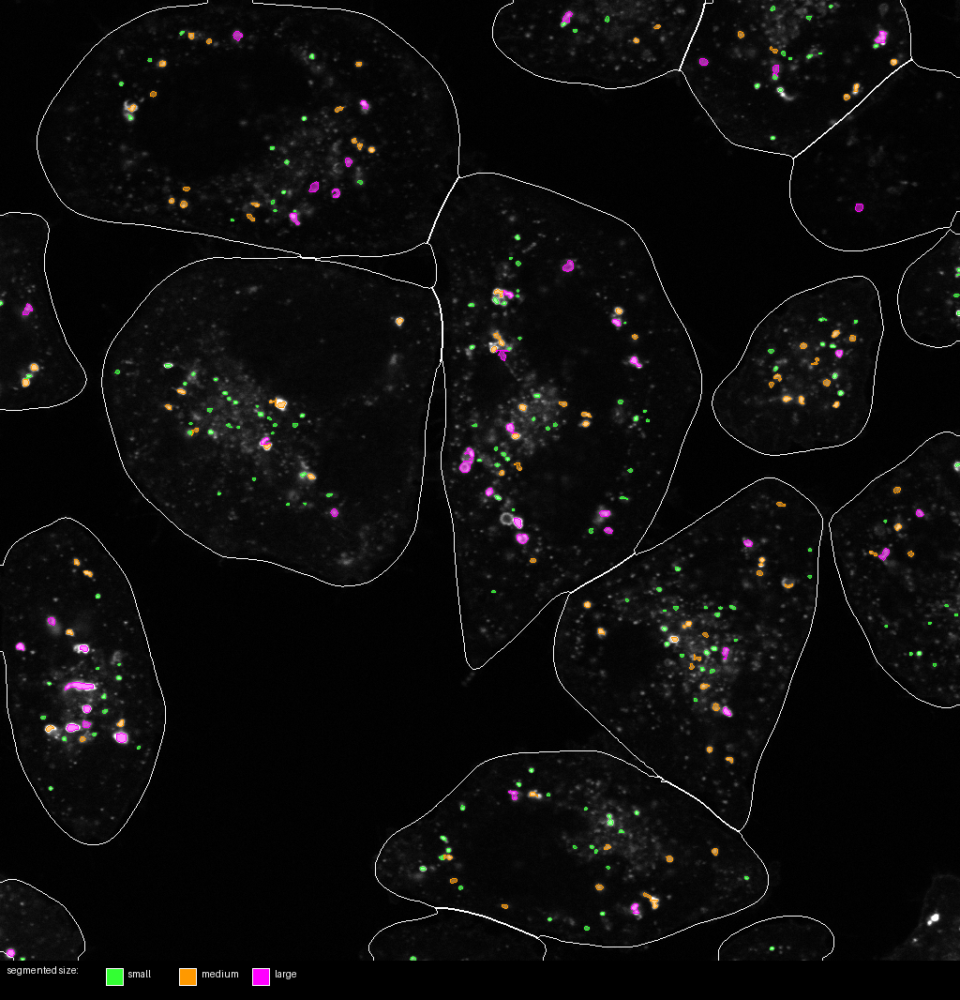

260803samples_CCCP_2hrs_rep1_cell1_all_channels_puncta_detection_scale_overlay.png


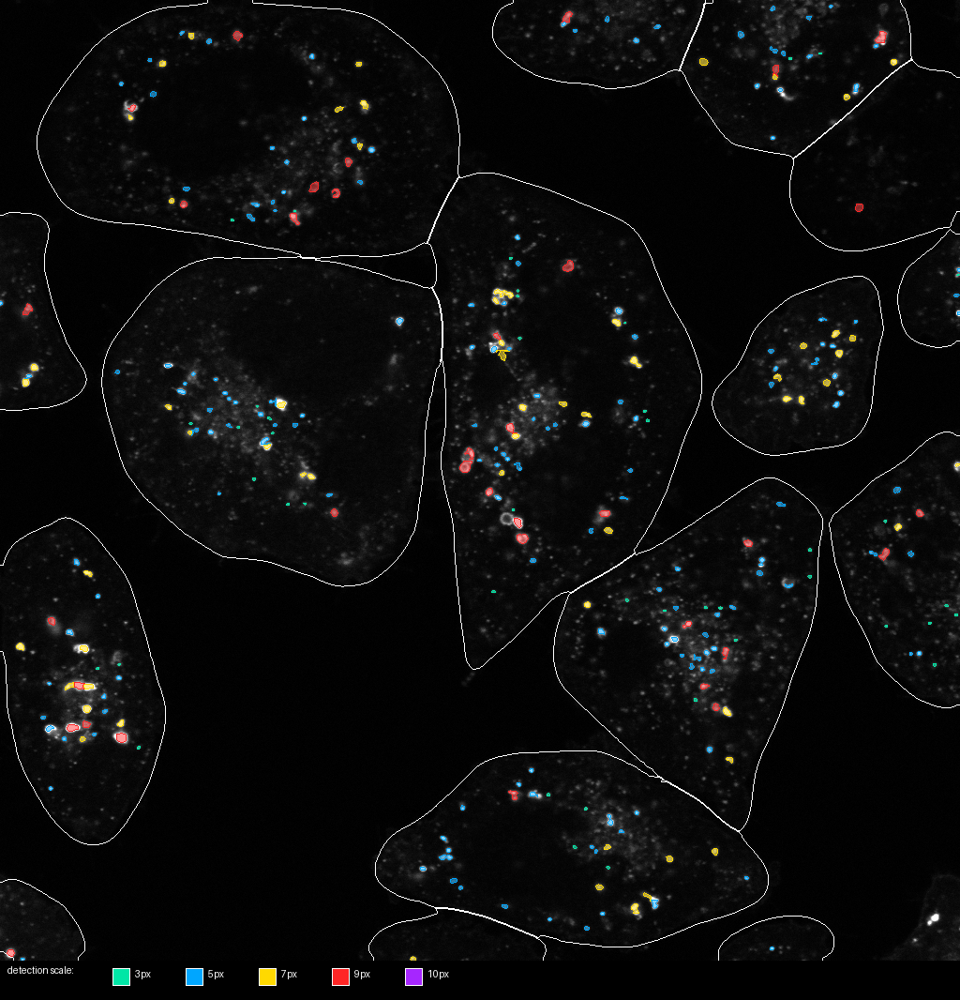

260803samples_CCCP_2hrs_rep1_cell1_all_channels_puncta_size_with_LC3_ring_flags_overlay.png


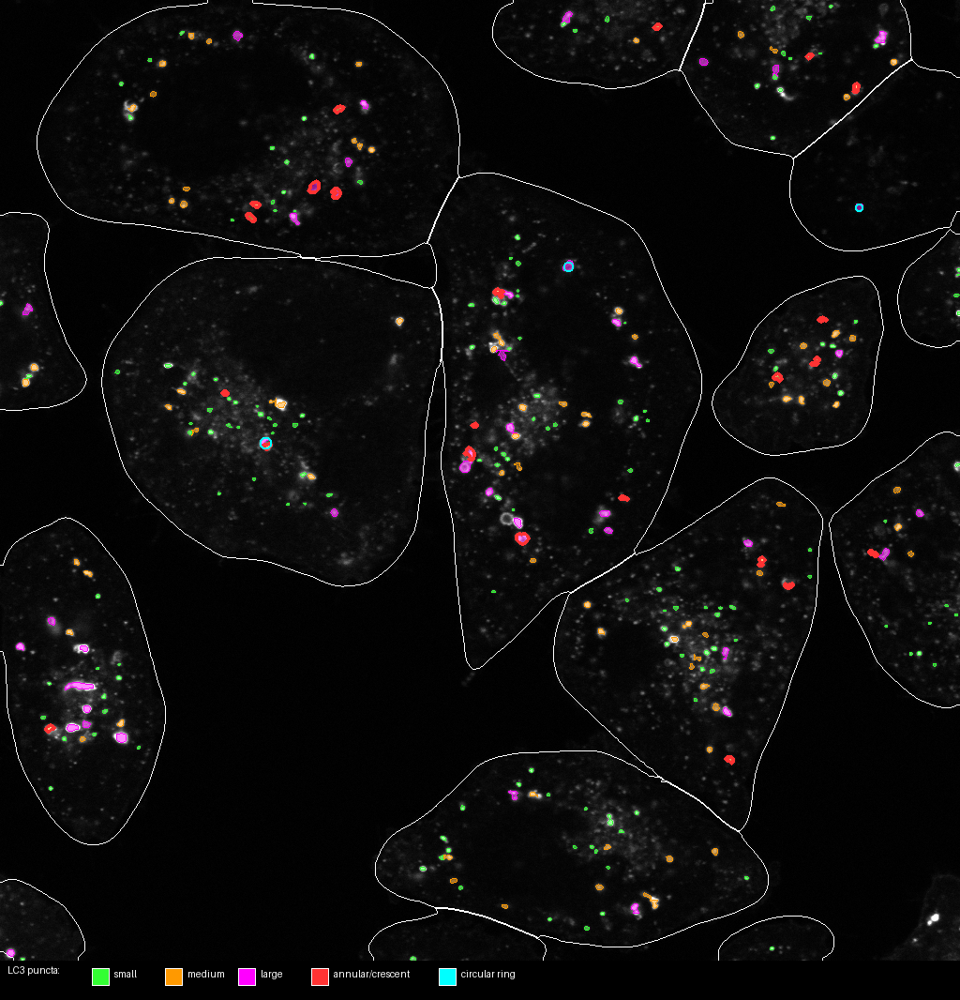

260803samples_CCCP_2hrs_rep1_cell1_all_channels_LC3_annular_circular_flag_overlay.png


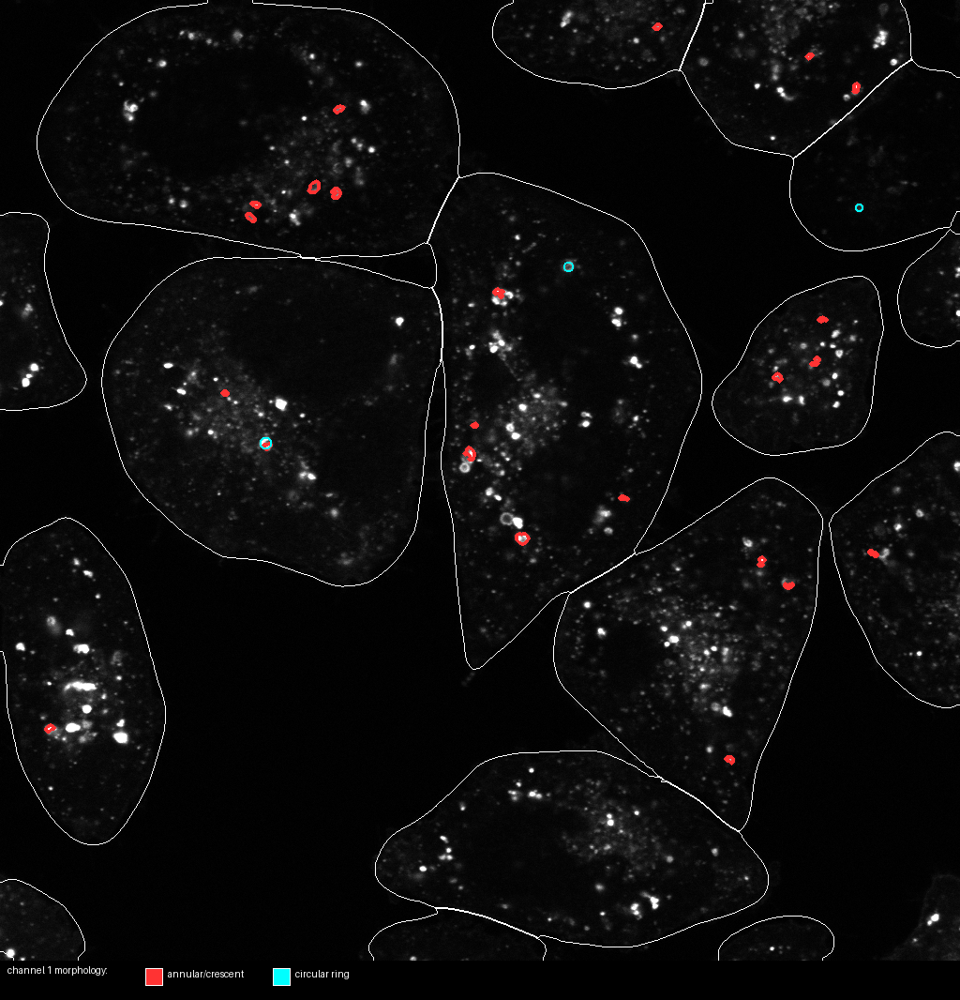

260803samples_CCCP_2hrs_rep1_cell1_all_channels_mCherry_Parkin_target_mask_overlay.png


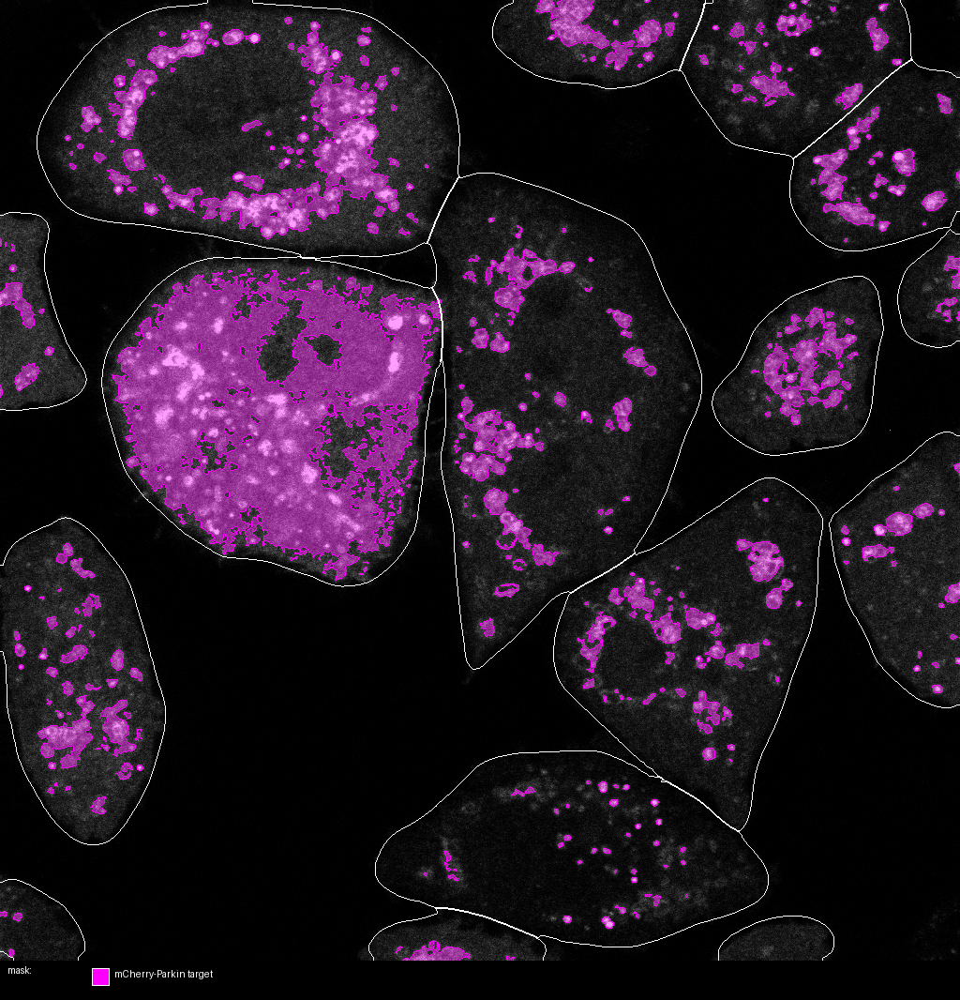

260803samples_CCCP_2hrs_rep1_cell1_all_channels_mCherry_Parkin_puncta_partition_overlay_on_ch3.png


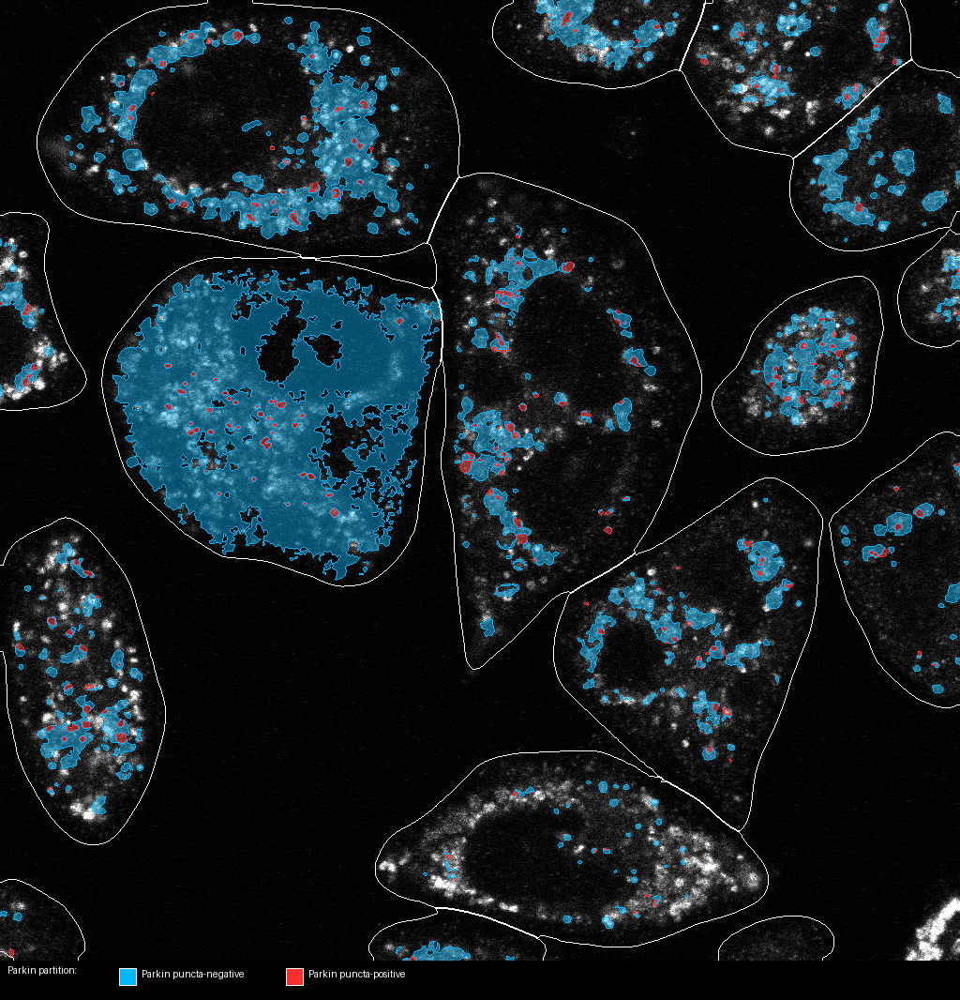

In [21]:
from IPython.display import Image as NotebookImage

print("Replicate-specific Parkin threshold calibration summary:")
display(parkin_threshold_calibration_summary)

valid_calibration_cells = parkin_threshold_calibration_cells[
    parkin_threshold_calibration_cells.get("used_for_calibration", False).fillna(False).astype(bool)
] if not parkin_threshold_calibration_cells.empty else parkin_threshold_calibration_cells
print(f"Valid replicate-matched CCCP cell-Otsu thresholds: {len(valid_calibration_cells):,}")
if not valid_calibration_cells.empty:
    display(valid_calibration_cells.head(30))

print("Field-level counts, physical density, and mCherry-Parkin recruitment:")
field_columns = [
    "group", "biological_replicate", "technical_replicate", "batch_replicate_id", "field_id",
    "puncta_count_total", "puncta_count_very_small_support_only", "puncta_count_detection_scale_3px", "puncta_count_annular_event", "puncta_count_ring", "puncta_fraction_ring", "puncta_per_um2", "puncta_per_100_um2",
    "cell_mask_area_um2", "parkin_recruited_area_um2",
    "parkin_recruited_fraction_of_total_cell_area",
    "parkin_recruited_percent_of_total_cell_area",
    "parkin_recruited_fraction_mean_across_cells",
    "parkin_recruited_fraction_median_across_cells",
    "parkin_threshold_replicate_id", "parkin_calibrated_absolute_threshold", "parkin_threshold_source",
    "parkin_puncta_positive_area_um2",
    "parkin_puncta_negative_area_um2",
    "parkin_puncta_positive_fraction_of_parkin_recruited_area",
    "ch3_MFN2_Halo_JF646_within_parkin_puncta_positive_mean",
    "ch3_MFN2_Halo_JF646_within_parkin_puncta_negative_mean",
    "ch3_MFN2_Halo_JF646_parkin_puncta_positive_vs_negative_mean_difference_positive_minus_negative",
    "ch3_MFN2_Halo_JF646_parkin_puncta_positive_vs_negative_mean_ratio_positive_to_negative",
    "parkin_puncta_partition_intensity_comparison_status",
    "ch1_ch3_pearson_r_within_parkin_mask", "ch1_ch3_correlation_pixel_count",
    "parkin_analysis_status",
]
if field_summary.empty:
    display(field_summary)
else:
    display(field_summary[[column for column in field_columns if column in field_summary.columns]])

cell_columns = [
    "group", "biological_replicate", "technical_replicate",
    "field_id", "cell_id", "cell_area_px2", "cell_area_um2",
    "puncta_per_cell", "puncta_per_um2", "puncta_per_100_um2",
    "puncta_count_small", "puncta_small_per_100_um2",
    "puncta_count_medium", "puncta_medium_per_100_um2",
    "puncta_count_large", "puncta_large_per_100_um2",
    "puncta_count_annular_event", "puncta_count_ring", "puncta_fraction_annular_event", "puncta_fraction_ring", "puncta_ring_per_100_um2",
    "parkin_recruited_area_px2", "parkin_recruited_area_um2",
    "parkin_recruited_fraction_of_cell_area",
    "parkin_recruited_percent_of_cell_area",
    "parkin_threshold_replicate_id", "parkin_calibrated_absolute_threshold", "parkin_threshold_source",
    "parkin_puncta_positive_area_px2",
    "parkin_puncta_positive_area_um2",
    "parkin_puncta_negative_area_px2",
    "parkin_puncta_negative_area_um2",
    "parkin_puncta_positive_fraction_of_parkin_recruited_area",
    "parkin_puncta_negative_fraction_of_parkin_recruited_area",
    "ch3_MFN2_Halo_JF646_within_parkin_puncta_positive_mean",
    "ch3_MFN2_Halo_JF646_within_parkin_puncta_negative_mean",
    "ch3_MFN2_Halo_JF646_parkin_puncta_positive_vs_negative_mean_difference_positive_minus_negative",
    "ch3_MFN2_Halo_JF646_parkin_puncta_positive_vs_negative_mean_ratio_positive_to_negative",
    "parkin_puncta_partition_intensity_comparison_status",
    "ch1_ch3_pearson_r_within_parkin_mask", "ch1_ch3_correlation_pixel_count",
    "puncta_count_very_small_support_only", "puncta_count_detection_scale_3px", "puncta_count_large_support_only", "status", "parkin_analysis_status",
]
print("Per-cell puncta density and Parkin-recruited area fraction:")
if cell_table.empty:
    display(cell_table)
else:
    display(cell_table[[column for column in cell_columns if column in cell_table.columns]].head(30))

print("Replicate-matched DMSO whole-cell references:")
display(replicate_control_references)
print("Dedicated mCherry-Parkin field analysis:")
display(parkin_field_analysis)
print("Dedicated mCherry-Parkin cell analysis excerpt:")
display(parkin_cell_analysis.head(30))

print("Dedicated per-cell Parkin puncta-positive/negative MFN2 comparison:")
display(parkin_puncta_partition_cell_analysis.head(30))
print("Dedicated field-level Parkin puncta partition summary:")
display(parkin_puncta_partition_field_analysis)

print("3 px very-small support summary:")
if isinstance(puncta_table, pd.DataFrame) and not puncta_table.empty:
    rescue_flag = puncta_table.get(
        "very_small_support_only",
        pd.Series(False, index=puncta_table.index),
    ).fillna(False).astype(bool)
    very_small_rescue = puncta_table[rescue_flag]
    print(f"New puncta added only by the 3 px rescue pass: {len(very_small_rescue):,}")
    display(
        very_small_rescue.reindex(
            columns=[
                "group", "image_file", "cell_id", "punctum_uid", "detection_scale_px",
                "equivalent_diameter_px", "equivalent_diameter_um", "punctum_area_px",
                "normalized_detection_score", "intensity_ratio_local",
                "intensity_ratio_overall", "punctum_cv",
            ]
        ).head(20)
    )
else:
    print("No punctum rows are available.")

if not puncta_table.empty:
    print("Combined counts by measured size class:")
    display(
        puncta_table["size_class"]
        .value_counts()
        .reindex(["small", "medium", "large"], fill_value=0)
        .rename_axis("size_class")
        .reset_index(name="puncta_count")
    )
    print("Example per-punctum measurements with physical units:")
    punctum_columns = [
        "group", "biological_replicate", "technical_replicate",
        "field_id", "cell_id", "punctum_uid", "size_class",
        "punctum_area_px", "punctum_area_um2",
        "equivalent_diameter_px", "equivalent_diameter_um",
        "detection_role", "very_small_support_only", "large_support_only", "detection_scale_px",
        "intensity_ratio_local", "intensity_ratio_overall", "punctum_cv",
        "annular_event_flag", "ring_flag", "ring_morphology_class", "ring_confidence",
        "ring_annular_score", "ring_rim_coverage_fraction", "ring_largest_gap_fraction",
        "ring_mask_rim_overlap_fraction", "ring_classification_status",
    ]
    display(puncta_table[[column for column in punctum_columns if column in puncta_table.columns]].head(25))
else:
    print("No puncta were retained. Confirm the selected channel and inspect processing_log.csv.")


print("LC3-GFP annular/circular event classification:")
if puncta_table.empty:
    display(puncta_table)
else:
    ring_columns = [
        "group", "field_id", "cell_id", "punctum_uid", "size_class",
        "detection_role", "detection_scale_px", "equivalent_diameter_px",
        "annular_event_flag", "ring_flag", "ring_morphology_class", "ring_review_flag",
        "ring_confidence", "ring_annular_score", "ring_hollow_center_z",
        "ring_rim_background_z", "ring_rim_coverage_fraction",
        "ring_largest_gap_fraction", "ring_angular_resultant",
        "ring_mask_rim_overlap_fraction", "ring_classification_status",
    ]
    display(puncta_table[[column for column in ring_columns if column in puncta_table.columns]].head(40))
    print("Ring classification counts:")
    display(pd.DataFrame({
        "category": ["all puncta", "annular/crescent-like", "strict circular ring"],
        "count": [
            len(puncta_table),
            int(puncta_table["annular_event_flag"].fillna(False).astype(bool).sum()),
            int(puncta_table["ring_flag"].fillna(False).astype(bool).sum()),
        ],
    }))

print("Candidate audit excerpt:")
display(candidate_audit.head(25))

size_overlays = sorted((OUTPUT_DIR / "overlays").glob("*_puncta_size_overlay.png"))
scale_overlays = sorted((OUTPUT_DIR / "overlays").glob("*_puncta_detection_scale_overlay.png"))
parkin_overlays = sorted((OUTPUT_DIR / "parkin_overlays").glob("*_mCherry_Parkin_target_mask_overlay.png"))
partition_overlays = sorted((OUTPUT_DIR / "parkin_puncta_partition_overlays").glob("*_mCherry_Parkin_puncta_partition_overlay_on_ch*.png"))
ring_size_overlays = sorted((OUTPUT_DIR / "ring_flag_overlays").glob("*_puncta_size_with_LC3_ring_flags_overlay.png"))
ring_only_overlays = sorted((OUTPUT_DIR / "ring_flag_overlays").glob("*_LC3_annular_circular_flag_overlay.png"))
for collection in (size_overlays, scale_overlays, ring_size_overlays, ring_only_overlays, parkin_overlays, partition_overlays):
    if collection:
        print(collection[0].name)
        display(NotebookImage(filename=str(collection[0])))
if not size_overlays and not scale_overlays and not ring_size_overlays and not ring_only_overlays and not parkin_overlays and not partition_overlays:
    print("No overlays were generated; inspect the processing logs for failures.")

Plot data source: in-memory cell_table
Per-cell summary for DMSO / CCCP / CCCPandNMS:


,treatment_group,n_cells,mean_puncta_per_cell,standard_deviation,median_puncta_per_cell,minimum,maximum,q1_puncta_per_cell,q3_puncta_per_cell,n_fields
0,DMSO,296,4.385135,3.981353,3.0,0,21,1.0,7.0,20
1,CCCP,293,18.938567,14.287279,16.0,0,66,7.0,27.0,20
2,CCCPandNMS,261,24.252874,18.192698,21.0,0,110,12.0,34.0,20


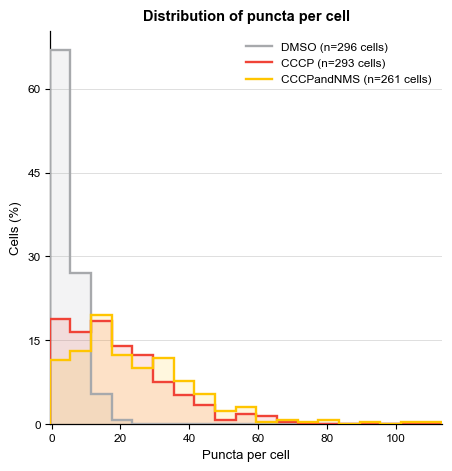

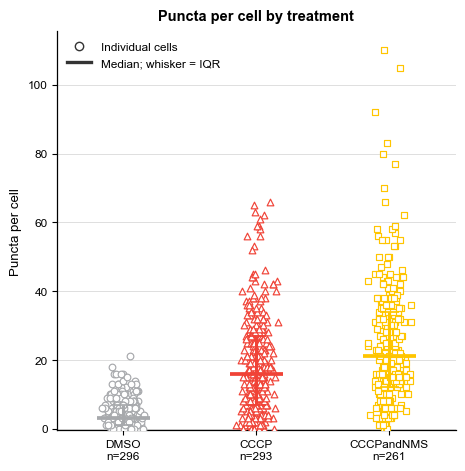

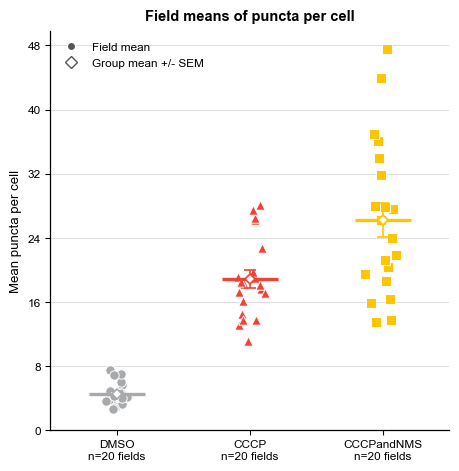

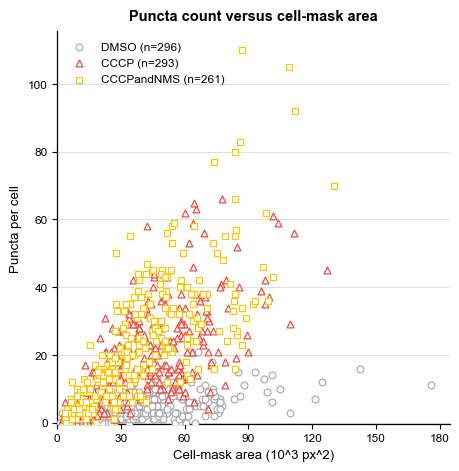

Exported editable vector files:
  group_inference_audit_csv: C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts\puncta_output_preserved_5_7_9_plus_10_3_replicate_threshold_DMSO_normalized\figures\treatment_group_inference_audit.csv
  summary_csv: C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts\puncta_output_preserved_5_7_9_plus_10_3_replicate_threshold_DMSO_normalized\figures\DMSO_vs_CCCP_vs_CCCPandNMS_puncta_per_cell_summary.csv
  field_means_csv: C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts\puncta_output_preserved_5_7_9_plus_10_3_replicate_threshold_DMSO_normalized\figures\DMSO_vs_CCCP_vs_CCCPandNMS_puncta_per_cell_field_means.csv
  plot_data_csv: C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts\puncta

In [22]:
# Multi-group per-cell puncta plots (editable vector PDFs)
#
# The group column generated by the batch is used first; filename inference remains a fallback. The PDF settings
# below preserve text as embedded TrueType text and keep all plot elements as vectors so the
# files can be edited cleanly in Adobe Illustrator. No artist is rasterized.

import math
import re
from pathlib import Path

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.ticker import MaxNLocator
import numpy as np
import pandas as pd
from IPython.display import display


# Descriptive plots use a configurable group list. The batch metadata parser is
# still the source of truth; these settings control only display order and style.
_DEFAULT_PLOT_GROUP_ORDER = ("DMSO", "CCCP", "CCCPandNMS")
_DEFAULT_PLOT_GROUP_COLORS = {
    "DMSO": "#a7a9ac",
    "CCCP": "#f04337",
    "CCCPandNMS": "#3100ff",
}
_DEFAULT_PLOT_GROUP_MARKERS = {
    "DMSO": "o",
    "CCCP": "^",
    "CCCPandNMS": "s",
}


def _pg_unique_labels(values: object) -> list[str]:
    if isinstance(values, str):
        raw = [values]
    else:
        try:
            raw = list(values)
        except TypeError:
            raw = []
    labels: list[str] = []
    for value in raw:
        text = str(value).strip()
        if text and text not in labels:
            labels.append(text)
    return labels


def _pg_preferred_groups() -> list[str]:
    return _pg_unique_labels(globals().get("PLOT_GROUP_ORDER", _DEFAULT_PLOT_GROUP_ORDER))


def _pg_known_groups() -> list[str]:
    labels = _pg_preferred_groups()
    configured = globals().get("FILENAME_GROUP_PATTERNS", ())
    items = list(configured.items()) if isinstance(configured, dict) else list(configured)
    for item in items:
        if isinstance(item, (tuple, list)) and len(item) == 2:
            canonical = str(item[0]).strip()
            if canonical and canonical not in labels:
                labels.append(canonical)
    return labels


def _pg_canonical_group(value: object) -> object:
    if pd.isna(value):
        return pd.NA
    text = str(value).strip()
    if not text:
        return pd.NA
    for canonical in _pg_known_groups():
        if text.casefold() == canonical.casefold():
            return canonical
    shared_parser = globals().get("_infer_configured_filename_group")
    if callable(shared_parser):
        group, status = shared_parser(text)
        if status == "recognized":
            return group
    return pd.NA


def _pg_group_order(observed: object) -> list[str]:
    observed_labels = _pg_unique_labels(observed)
    preferred = _pg_preferred_groups()
    ordered = [group for group in preferred if group in observed_labels]
    if bool(globals().get("PLOT_INCLUDE_UNLISTED_GROUPS", True)):
        ordered.extend(
            sorted(
                [group for group in observed_labels if group not in ordered],
                key=str.casefold,
            )
        )
    return ordered


def _pg_styles(group_order: list[str]) -> tuple[dict[str, str], dict[str, str]]:
    colors = dict(_DEFAULT_PLOT_GROUP_COLORS)
    colors.update(dict(globals().get("PLOT_GROUP_COLORS", {})))
    markers = dict(_DEFAULT_PLOT_GROUP_MARKERS)
    markers.update(dict(globals().get("PLOT_GROUP_MARKERS", {})))
    color_cycle = [mpl.colors.to_hex(plt.get_cmap("tab10")(index)) for index in range(10)]
    marker_cycle = ["o", "^", "s", "D", "P", "v", "X", "<", ">", "h"]
    for index, group in enumerate(group_order):
        colors.setdefault(group, color_cycle[index % len(color_cycle)])
        markers.setdefault(group, marker_cycle[index % len(marker_cycle)])
    return colors, markers


def _pg_safe_token(value: object) -> str:
    return re.sub(r"[^A-Za-z0-9]+", "_", str(value)).strip("_") or "group"


def _pg_file_prefix(group_order: list[str]) -> str:
    return "_vs_".join(_pg_safe_token(group) for group in group_order) or "treatment_groups"


def _pg_title(group_order: list[str]) -> str:
    return " / ".join(group_order) if group_order else "Treatment groups"


def _infer_cccp_dmso_group(image_name: object) -> tuple[object, str]:
    """Infer any configured treatment group without substring collisions."""
    text = "" if pd.isna(image_name) else str(image_name)
    shared_parser = globals().get("_infer_configured_filename_group")
    if callable(shared_parser):
        return shared_parser(text)

    remaining = text
    found: list[str] = []
    fallback_patterns = (
        ("CCCPandNMS", r"CCCP(?:[\s_-]*and[\s_-]*)NMS"),
        ("CCCP", r"CCCP"),
        ("DMSO", r"DMSO"),
    )
    for canonical, raw_pattern in fallback_patterns:
        token_pattern = rf"(?<![A-Za-z0-9])(?:{raw_pattern})(?![A-Za-z0-9])"
        if re.search(token_pattern, remaining, flags=re.IGNORECASE):
            found.append(canonical)
            remaining = re.sub(
                token_pattern,
                lambda match: " " * (match.end() - match.start()),
                remaining,
                flags=re.IGNORECASE,
            )
    unique = list(dict.fromkeys(found))
    if len(unique) == 1:
        return unique[0], "recognized"
    if len(unique) > 1:
        return pd.NA, "ambiguous_multiple_groups"
    return pd.NA, "unrecognized_group_name"


def _load_cell_table_for_group_plots() -> tuple[pd.DataFrame, str]:
    """Use the in-memory batch table when available, otherwise read a saved cell CSV."""
    in_memory = globals().get("cell_table")
    if isinstance(in_memory, pd.DataFrame) and not in_memory.empty:
        return in_memory.copy(), "in-memory cell_table"

    output_root = Path(globals().get("OUTPUT_DIR", Path.cwd())).expanduser()
    candidates = [
        output_root / "tables" / "cell_puncta_density.csv",
        output_root / "tables" / "cell_summary.csv",
    ]
    read_errors: list[str] = []
    for candidate in candidates:
        if candidate.is_file():
            try:
                return pd.read_csv(candidate), str(candidate)
            except Exception as exc:
                read_errors.append(f"{candidate}: {type(exc).__name__}: {exc}")

    if read_errors:
        print("Cell-level CSV files were found but could not be read:")
        for message in read_errors:
            print(f"  - {message}")
    return pd.DataFrame(), "no usable in-memory or saved cell table"


def _shared_integer_histogram_edges(values: np.ndarray, maximum_bins: int = 22) -> np.ndarray:
    """Create shared integer-aligned bins suitable for punctum counts."""
    finite = np.asarray(values, dtype=float)
    finite = finite[np.isfinite(finite)]
    if finite.size == 0:
        return np.array([-0.5, 0.5])

    minimum = int(np.floor(finite.min()))
    maximum = int(np.ceil(finite.max()))
    if minimum == maximum:
        return np.array([minimum - 0.5, maximum + 0.5])

    q25, q75 = np.percentile(finite, [25, 75])
    iqr = float(q75 - q25)
    fd_width = 2.0 * iqr / np.cbrt(finite.size) if iqr > 0 else 0.0
    bin_width = max(1, int(np.ceil(fd_width))) if fd_width > 0 else 1

    span = maximum - minimum + 1
    bin_width = max(bin_width, int(np.ceil(span / maximum_bins)))
    stop = maximum + bin_width + 0.5
    edges = np.arange(minimum - 0.5, stop, bin_width, dtype=float)
    if edges[-1] <= maximum:
        edges = np.append(edges, edges[-1] + bin_width)
    return edges


def _style_square_axis(ax: mpl.axes.Axes) -> None:
    """Apply a clean, editable publication style and force a square plotting region."""
    ax.set_box_aspect(1)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(0.9)
    ax.spines["bottom"].set_linewidth(0.9)
    ax.tick_params(axis="both", direction="out", length=3.5, width=0.8, pad=3)
    ax.grid(axis="y", color="#D9D9D9", linewidth=0.6, zorder=0)
    ax.set_axisbelow(True)


def _save_editable_pdf(fig: mpl.figure.Figure, path: Path, title: str) -> None:
    """Save a non-rasterized PDF with editable Type 42/TrueType text."""
    fig.savefig(
        path,
        format="pdf",
        bbox_inches="tight",
        pad_inches=0.08,
        facecolor="white",
        edgecolor="none",
        metadata={
            "Title": title,
            "Creator": "Matplotlib vector PDF; embedded TrueType text; no rasterized artists",
            "Subject": "Multi-group puncta-per-cell comparison",
        },
    )


def generate_multigroup_puncta_plots() -> dict[str, Path]:
    raw_cells, data_source = _load_cell_table_for_group_plots()
    output_root = Path(globals().get("OUTPUT_DIR", Path.cwd())).expanduser()
    figure_dir = output_root / "figures"
    figure_dir.mkdir(parents=True, exist_ok=True)

    if raw_cells.empty:
        print(
            "No cell-level measurements are available, so treatment-group plots were skipped. "
            "Run the batch-analysis cell first or provide tables/cell_puncta_density.csv."
        )
        return {}

    filename_column = next(
        (column for column in ("image_file", "field_id") if column in raw_cells.columns),
        None,
    )
    count_column = next(
        (
            column
            for column in ("puncta_per_cell", "puncta_count_total", "puncta_count", "# puncta")
            if column in raw_cells.columns
        ),
        None,
    )
    if filename_column is None or count_column is None:
        print(
            "Treatment-group plots were skipped because the cell table lacks an image-name column "
            "or a puncta-per-cell column."
        )
        print(f"Available columns: {list(raw_cells.columns)}")
        return {}

    cells = raw_cells.copy()
    cells[count_column] = pd.to_numeric(cells[count_column], errors="coerce")
    if "cell_area_px2" in cells.columns:
        cells["cell_area_px2"] = pd.to_numeric(cells["cell_area_px2"], errors="coerce")

    if "status" in cells.columns:
        cells = cells[cells["status"].fillna("").astype(str).str.strip().str.lower().str.startswith("ok")].copy()
    cells = cells[np.isfinite(cells[count_column]) & (cells[count_column] >= 0)].copy()

    if "group" in cells.columns:
        cells["treatment_group"] = cells["group"].map(_pg_canonical_group)
        cells["group_inference_status"] = np.where(
            cells["treatment_group"].notna(),
            "batch_filename_metadata",
            "batch_group_missing_or_unrecognized",
        )
        missing_group = cells["treatment_group"].isna()
        if missing_group.any():
            fallback = cells.loc[missing_group, filename_column].apply(_infer_cccp_dmso_group)
            cells.loc[missing_group, "treatment_group"] = [item[0] for item in fallback]
            cells.loc[missing_group, "group_inference_status"] = [
                f"fallback_{item[1]}" for item in fallback
            ]
    else:
        inferred = cells[filename_column].apply(_infer_cccp_dmso_group)
        cells["treatment_group"] = [item[0] for item in inferred]
        cells["group_inference_status"] = [item[1] for item in inferred]

    audit_columns = [
        column
        for column in (
            "image_file",
            "mask_file",
            "field_id",
            "cell_id",
            "status",
            count_column,
            "cell_area_px2",
            "cell_area_um2",
            "group",
            "biological_replicate",
            "technical_replicate",
            "treatment_group",
            "group_inference_status",
        )
        if column in cells.columns
    ]
    inference_audit_path = figure_dir / "treatment_group_inference_audit.csv"
    cells[audit_columns].to_csv(inference_audit_path, index=False)

    recognized = cells[cells["treatment_group"].notna()].copy()
    group_order = _pg_group_order(recognized["treatment_group"].dropna().astype(str).unique())
    recognized = recognized[recognized["treatment_group"].isin(group_order)].copy()
    excluded = cells[~cells.index.isin(recognized.index)].copy()
    if not excluded.empty:
        print(
            f"Excluded {len(excluded):,} cell rows because the image name did not uniquely "
            "identify a configured treatment group. See the group-inference audit CSV."
        )

    if recognized.empty or not group_order:
        print(
            "No cells had an unambiguous configured treatment-group token; plots were skipped."
        )
        return {"group_inference_audit_csv": inference_audit_path}

    preferred_groups = _pg_preferred_groups()
    missing_groups = [group for group in preferred_groups if group not in group_order]
    if missing_groups:
        print(
            "The following configured treatment group is absent from the recognized data: "
            + ", ".join(missing_groups)
            + ". Available groups will still be plotted."
        )

    plot_prefix = _pg_file_prefix(group_order)
    plot_group_title = _pg_title(group_order)

    field_column = "field_id" if "field_id" in recognized.columns else filename_column
    summary = (
        recognized.groupby("treatment_group", observed=True)[count_column]
        .agg(
            n_cells="size",
            mean_puncta_per_cell="mean",
            standard_deviation="std",
            median_puncta_per_cell="median",
            minimum="min",
            maximum="max",
        )
        .reindex(group_order)
        .reset_index()
    )
    q1 = recognized.groupby("treatment_group", observed=True)[count_column].quantile(0.25)
    q3 = recognized.groupby("treatment_group", observed=True)[count_column].quantile(0.75)
    n_fields = recognized.groupby("treatment_group", observed=True)[field_column].nunique()
    summary["q1_puncta_per_cell"] = summary["treatment_group"].map(q1)
    summary["q3_puncta_per_cell"] = summary["treatment_group"].map(q3)
    summary["n_fields"] = summary["treatment_group"].map(n_fields).astype("Int64")

    field_means = (
        recognized.groupby(["treatment_group", field_column], observed=True)[count_column]
        .agg(mean_puncta_per_cell="mean", median_puncta_per_cell="median", n_cells="size")
        .reset_index()
    )

    summary_path = figure_dir / f"{plot_prefix}_puncta_per_cell_summary.csv"
    field_means_path = figure_dir / f"{plot_prefix}_puncta_per_cell_field_means.csv"
    plot_data_path = figure_dir / f"{plot_prefix}_puncta_per_cell_plot_data.csv"
    summary.to_csv(summary_path, index=False)
    field_means.to_csv(field_means_path, index=False)
    recognized[audit_columns].to_csv(plot_data_path, index=False)

    print(f"Plot data source: {data_source}")
    print(f"Per-cell summary for {plot_group_title}:")
    display(summary)

    colors, markers = _pg_styles(group_order)
    vector_pdf_rc = {
        "pdf.fonttype": 42,
        "ps.fonttype": 42,
        "pdf.compression": 0,
        "text.usetex": False,
        "font.family": "sans-serif",
        "font.sans-serif": ["Arial", "Helvetica", "DejaVu Sans"],
        "font.size": 9,
        "axes.titlesize": 10.5,
        "axes.labelsize": 9.5,
        "xtick.labelsize": 8.5,
        "ytick.labelsize": 8.5,
        "legend.fontsize": 8.5,
        "axes.unicode_minus": False,
    }

    exported: dict[str, Path] = {
        "group_inference_audit_csv": inference_audit_path,
        "summary_csv": summary_path,
        "field_means_csv": field_means_path,
        "plot_data_csv": plot_data_path,
    }

    with mpl.rc_context(vector_pdf_rc):
        # 1. Shared-bin histogram. Percent normalization keeps unequal group sizes comparable.
        histogram_path = figure_dir / f"{plot_prefix}_puncta_per_cell_histogram.pdf"
        all_counts = recognized[count_column].to_numpy(dtype=float)
        histogram_edges = _shared_integer_histogram_edges(all_counts)
        fig, ax = plt.subplots(figsize=(4.6, 4.6), constrained_layout=True)
        for group in group_order:
            values = recognized.loc[recognized["treatment_group"].eq(group), count_column].to_numpy(dtype=float)
            frequency, _ = np.histogram(values, bins=histogram_edges)
            percentage = 100.0 * frequency / frequency.sum()
            ax.stairs(
                percentage,
                histogram_edges,
                fill=True,
                facecolor=colors[group],
                edgecolor="none",
                alpha=0.13,
                baseline=0,
                rasterized=False,
                zorder=1,
            )
            ax.stairs(
                percentage,
                histogram_edges,
                fill=False,
                color=colors[group],
                linewidth=1.7,
                label=f"{group} (n={len(values):,} cells)",
                rasterized=False,
                zorder=3,
            )
        _style_square_axis(ax)
        ax.set_title("Distribution of puncta per cell", pad=8, weight="semibold")
        ax.set_xlabel("Puncta per cell")
        ax.set_ylabel("Cells (%)")
        ax.set_xlim(histogram_edges[0], histogram_edges[-1])
        ax.set_ylim(bottom=0)
        ax.xaxis.set_major_locator(MaxNLocator(nbins=7, integer=True))
        ax.yaxis.set_major_locator(MaxNLocator(nbins=6))
        ax.legend(frameon=False, loc="best", handlelength=2.2)
        _save_editable_pdf(fig, histogram_path, f"{plot_group_title}: puncta-per-cell histogram")
        plt.show()
        plt.close(fig)
        exported["histogram_pdf"] = histogram_path

        # 2. Jittered per-cell scatter with median and interquartile range.
        group_scatter_path = figure_dir / f"{plot_prefix}_puncta_per_cell_group_scatter.pdf"
        fig, ax = plt.subplots(figsize=(4.6, 4.6), constrained_layout=True)
        rng = np.random.default_rng(20260802)
        for position, group in enumerate(group_order):
            values = recognized.loc[recognized["treatment_group"].eq(group), count_column].to_numpy(dtype=float)
            point_size = 23 if len(values) <= 500 else max(7, 23 * np.sqrt(500 / len(values)))
            jitter = np.clip(rng.normal(loc=0.0, scale=0.065, size=len(values)), -0.16, 0.16)
            ax.scatter(
                np.full(len(values), position, dtype=float) + jitter,
                values,
                s=point_size,
                marker=markers[group],
                facecolors="white",
                edgecolors=colors[group],
                linewidths=0.85,
                rasterized=False,
                zorder=3,
            )
            q25, median, q75 = np.percentile(values, [25, 50, 75])
            ax.vlines(position, q25, q75, color=colors[group], linewidth=2.2, zorder=5)
            ax.hlines([q25, q75], position - 0.07, position + 0.07, color=colors[group], linewidth=1.25, zorder=5)
            ax.hlines(median, position - 0.20, position + 0.20, color=colors[group], linewidth=2.7, zorder=6)

        _style_square_axis(ax)
        ax.set_title("Puncta per cell by treatment", pad=8, weight="semibold")
        ax.set_ylabel("Puncta per cell")
        ax.set_xlabel("")
        ax.set_xlim(-0.5, len(group_order) - 0.5)
        ax.set_ylim(bottom=min(-0.5, float(recognized[count_column].min()) - 0.5))
        ax.set_xticks(range(len(group_order)))
        ax.set_xticklabels(
            [
                f"{group}\nn={recognized[recognized['treatment_group'].eq(group)].shape[0]:,}"
                for group in group_order
            ]
        )
        ax.yaxis.set_major_locator(MaxNLocator(nbins=7, integer=True))
        summary_legend = [
            Line2D([0], [0], marker="o", linestyle="none", markerfacecolor="white", markeredgecolor="#333333", label="Individual cells"),
            Line2D([0], [0], color="#333333", linewidth=2.4, label="Median; whisker = IQR"),
        ]
        ax.legend(handles=summary_legend, frameon=False, loc="best", handlelength=2.0)
        _save_editable_pdf(fig, group_scatter_path, f"{plot_group_title}: per-cell puncta scatter")
        plt.show()
        plt.close(fig)
        exported["group_scatter_pdf"] = group_scatter_path

        # 3. Field-level scatter of each image/field mean, with group mean and SEM.
        field_scatter_path = figure_dir / f"{plot_prefix}_puncta_per_cell_field_mean_scatter.pdf"
        fig, ax = plt.subplots(figsize=(4.6, 4.6), constrained_layout=True)
        field_rng = np.random.default_rng(20260803)
        for position, group in enumerate(group_order):
            values = field_means.loc[
                field_means["treatment_group"].eq(group), "mean_puncta_per_cell"
            ].to_numpy(dtype=float)
            jitter = np.clip(
                field_rng.normal(loc=0.0, scale=0.055, size=len(values)),
                -0.14,
                0.14,
            )
            ax.scatter(
                np.full(len(values), position, dtype=float) + jitter,
                values,
                s=46,
                marker=markers[group],
                facecolors=colors[group],
                edgecolors="white",
                linewidths=0.7,
                rasterized=False,
                zorder=3,
            )
            group_mean = float(np.mean(values))
            ax.hlines(
                group_mean,
                position - 0.21,
                position + 0.21,
                color=colors[group],
                linewidth=2.4,
                zorder=5,
            )
            if len(values) > 1:
                sem = float(np.std(values, ddof=1) / math.sqrt(len(values)))
                ax.errorbar(
                    position,
                    group_mean,
                    yerr=sem,
                    fmt="D",
                    markersize=5.4,
                    markerfacecolor="white",
                    markeredgecolor=colors[group],
                    markeredgewidth=1.2,
                    ecolor=colors[group],
                    elinewidth=1.15,
                    capsize=4,
                    capthick=1.15,
                    rasterized=False,
                    zorder=6,
                )
            else:
                ax.scatter(
                    [position],
                    [group_mean],
                    s=38,
                    marker="D",
                    facecolors="white",
                    edgecolors=colors[group],
                    linewidths=1.2,
                    rasterized=False,
                    zorder=6,
                )

        _style_square_axis(ax)
        ax.set_title("Field means of puncta per cell", pad=8, weight="semibold")
        ax.set_ylabel("Mean puncta per cell")
        ax.set_xlabel("")
        ax.set_xlim(-0.5, len(group_order) - 0.5)
        ax.set_ylim(bottom=0)
        ax.set_xticks(range(len(group_order)))
        ax.set_xticklabels(
            [
                f"{group}\nn={field_means[field_means['treatment_group'].eq(group)].shape[0]:,} fields"
                for group in group_order
            ]
        )
        ax.yaxis.set_major_locator(MaxNLocator(nbins=7))
        field_legend = [
            Line2D(
                [0], [0], marker="o", linestyle="none",
                markerfacecolor="#555555", markeredgecolor="white",
                label="Field mean",
            ),
            Line2D(
                [0], [0], marker="D", linestyle="none",
                markerfacecolor="white", markeredgecolor="#555555",
                label="Group mean +/- SEM",
            ),
        ]
        ax.legend(handles=field_legend, frameon=False, loc="best", handlelength=1.8)
        _save_editable_pdf(
            fig,
            field_scatter_path,
            f"{plot_group_title}: field means of puncta per cell",
        )
        plt.show()
        plt.close(fig)
        exported["field_mean_scatter_pdf"] = field_scatter_path

        # 4. Cell-mask area versus puncta count, retained as an additional QC scatterplot.
        if "cell_area_px2" in recognized.columns:
            area_data = recognized[
                np.isfinite(recognized["cell_area_px2"]) & (recognized["cell_area_px2"] > 0)
            ].copy()
        else:
            area_data = pd.DataFrame()

        if not area_data.empty:
            area_scatter_path = figure_dir / f"{plot_prefix}_puncta_per_cell_vs_cell_area_scatter.pdf"
            fig, ax = plt.subplots(figsize=(4.6, 4.6), constrained_layout=True)
            for group in group_order:
                group_data = area_data[area_data["treatment_group"].eq(group)]
                point_size = 24 if len(group_data) <= 500 else max(7, 24 * np.sqrt(500 / len(group_data)))
                ax.scatter(
                    group_data["cell_area_px2"].to_numpy(dtype=float) / 1000.0,
                    group_data[count_column].to_numpy(dtype=float),
                    s=point_size,
                    marker=markers[group],
                    facecolors="white",
                    edgecolors=colors[group],
                    linewidths=0.85,
                    label=f"{group} (n={len(group_data):,})",
                    rasterized=False,
                    zorder=3,
                )
            _style_square_axis(ax)
            ax.set_title("Puncta count versus cell-mask area", pad=8, weight="semibold")
            ax.set_xlabel("Cell-mask area (10^3 px^2)")
            ax.set_ylabel("Puncta per cell")
            ax.set_xlim(left=0)
            ax.set_ylim(bottom=min(-0.5, float(area_data[count_column].min()) - 0.5))
            ax.xaxis.set_major_locator(MaxNLocator(nbins=7))
            ax.yaxis.set_major_locator(MaxNLocator(nbins=7, integer=True))
            ax.legend(frameon=False, loc="best")
            _save_editable_pdf(
                fig,
                area_scatter_path,
                f"{plot_group_title}: puncta per cell versus cell-mask area",
            )
            plt.show()
            plt.close(fig)
            exported["area_scatter_pdf"] = area_scatter_path
        else:
            print("Cell-mask area is unavailable, so the area-versus-count scatterplot was skipped.")

    print("Exported editable vector files:")
    for label, path in exported.items():
        print(f"  {label}: {path}")
    return exported


GROUP_PLOT_OUTPUTS = generate_multigroup_puncta_plots()


## Compare punctum size distributions across configured treatment groups

The pooled and independent-sample-resolved histogram cells below use `PLOT_GROUP_ORDER` and include all recognized configured groups. The inferential statistics cell remains a deliberately pairwise CCCP-versus-DMSO analysis; additional-group inference should be specified separately rather than silently changing the statistical hypothesis.

Punctum-size plot data source: in-memory puncta_table
Punctum-size summary for DMSO / CCCP / CCCPandNMS:


,treatment_group,measurement,n_puncta,n_cells,n_fields,mean,standard_deviation,median,q1,q3,minimum,maximum
0,DMSO,equivalent_diameter_um,1298,21,20,0.492918,0.111233,0.470305,0.423927,0.538802,0.262908,1.459083
1,DMSO,punctum_area_um2,1298,21,20,0.200537,0.109681,0.173720,0.141147,0.228007,0.054287,1.672051
2,CCCP,equivalent_diameter_um,5549,20,20,0.653257,0.195732,0.622155,0.498834,0.779912,0.203648,1.386203
3,CCCP,punctum_area_um2,5549,20,20,0.365249,0.221875,0.304009,0.195435,0.477729,0.032572,1.509189
4,CCCPandNMS,equivalent_diameter_um,6330,21,20,0.644095,0.201384,0.610944,0.484779,0.770999,0.203648,1.555387
5,CCCPandNMS,punctum_area_um2,6330,21,20,0.357676,0.229215,0.293152,0.184577,0.466872,0.032572,1.900059


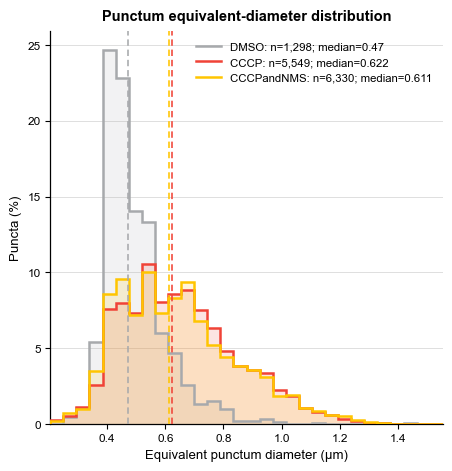

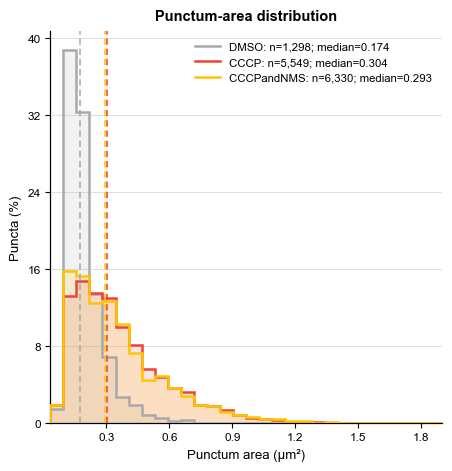

Exported editable punctum-size vector files:
  plot_data_csv: C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts\puncta_output_preserved_5_7_9_plus_10_3_replicate_threshold_DMSO_normalized\figures\DMSO_vs_CCCP_vs_CCCPandNMS_punctum_size_plot_data.csv
  summary_csv: C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts\puncta_output_preserved_5_7_9_plus_10_3_replicate_threshold_DMSO_normalized\figures\DMSO_vs_CCCP_vs_CCCPandNMS_punctum_size_summary.csv
  equivalent_diameter_um_histogram_pdf: C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts\puncta_output_preserved_5_7_9_plus_10_3_replicate_threshold_DMSO_normalized\figures\DMSO_vs_CCCP_vs_CCCPandNMS_punctum_equivalent_diameter_um_histogram.pdf
  punctum_area_um2_histogram_pdf: C:\Users\narendradp\OneDrive - National Institutes of Healt

In [23]:
# Multi-group punctum-size histograms (editable vector PDFs)

import re
from pathlib import Path

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.ticker import MaxNLocator
import numpy as np
import pandas as pd
from IPython.display import display


# Descriptive plots use a configurable group list. The batch metadata parser is
# still the source of truth; these settings control only display order and style.
_DEFAULT_SIZE_PLOT_GROUP_ORDER = ("DMSO", "CCCP", "CCCPandNMS")
_DEFAULT_SIZE_PLOT_GROUP_COLORS = {
    "DMSO": "#a7a9ac",
    "CCCP": "#f04337",
    "CCCPandNMS": "#3100ff",
}
_DEFAULT_SIZE_PLOT_GROUP_MARKERS = {
    "DMSO": "o",
    "CCCP": "^",
    "CCCPandNMS": "s",
}


def _sp_unique_labels(values: object) -> list[str]:
    if isinstance(values, str):
        raw = [values]
    else:
        try:
            raw = list(values)
        except TypeError:
            raw = []
    labels: list[str] = []
    for value in raw:
        text = str(value).strip()
        if text and text not in labels:
            labels.append(text)
    return labels


def _sp_preferred_groups() -> list[str]:
    return _sp_unique_labels(globals().get("PLOT_GROUP_ORDER", _DEFAULT_SIZE_PLOT_GROUP_ORDER))


def _sp_known_groups() -> list[str]:
    labels = _sp_preferred_groups()
    configured = globals().get("FILENAME_GROUP_PATTERNS", ())
    items = list(configured.items()) if isinstance(configured, dict) else list(configured)
    for item in items:
        if isinstance(item, (tuple, list)) and len(item) == 2:
            canonical = str(item[0]).strip()
            if canonical and canonical not in labels:
                labels.append(canonical)
    return labels


def _sp_canonical_group(value: object) -> object:
    if pd.isna(value):
        return pd.NA
    text = str(value).strip()
    if not text:
        return pd.NA
    for canonical in _sp_known_groups():
        if text.casefold() == canonical.casefold():
            return canonical
    shared_parser = globals().get("_infer_configured_filename_group")
    if callable(shared_parser):
        group, status = shared_parser(text)
        if status == "recognized":
            return group
    return pd.NA


def _sp_group_order(observed: object) -> list[str]:
    observed_labels = _sp_unique_labels(observed)
    preferred = _sp_preferred_groups()
    ordered = [group for group in preferred if group in observed_labels]
    if bool(globals().get("PLOT_INCLUDE_UNLISTED_GROUPS", True)):
        ordered.extend(
            sorted(
                [group for group in observed_labels if group not in ordered],
                key=str.casefold,
            )
        )
    return ordered


def _sp_styles(group_order: list[str]) -> tuple[dict[str, str], dict[str, str]]:
    colors = dict(_DEFAULT_SIZE_PLOT_GROUP_COLORS)
    colors.update(dict(globals().get("PLOT_GROUP_COLORS", {})))
    markers = dict(_DEFAULT_SIZE_PLOT_GROUP_MARKERS)
    markers.update(dict(globals().get("PLOT_GROUP_MARKERS", {})))
    color_cycle = [mpl.colors.to_hex(plt.get_cmap("tab10")(index)) for index in range(10)]
    marker_cycle = ["o", "^", "s", "D", "P", "v", "X", "<", ">", "h"]
    for index, group in enumerate(group_order):
        colors.setdefault(group, color_cycle[index % len(color_cycle)])
        markers.setdefault(group, marker_cycle[index % len(marker_cycle)])
    return colors, markers


def _sp_safe_token(value: object) -> str:
    return re.sub(r"[^A-Za-z0-9]+", "_", str(value)).strip("_") or "group"


def _sp_file_prefix(group_order: list[str]) -> str:
    return "_vs_".join(_sp_safe_token(group) for group in group_order) or "treatment_groups"


def _sp_title(group_order: list[str]) -> str:
    return " / ".join(group_order) if group_order else "Treatment groups"


def _load_puncta_table_for_size_plots() -> tuple[pd.DataFrame, str]:
    in_memory = globals().get("puncta_table")
    if isinstance(in_memory, pd.DataFrame) and not in_memory.empty:
        return in_memory.copy(), "in-memory puncta_table"
    output_root = Path(globals().get("OUTPUT_DIR", Path.cwd())).expanduser()
    candidate = output_root / "tables" / "puncta_measurements.csv"
    if candidate.is_file():
        try:
            return pd.read_csv(candidate), str(candidate)
        except Exception as exc:
            print(f"Could not read {candidate}: {type(exc).__name__}: {exc}")
    return pd.DataFrame(), "no usable in-memory or saved puncta table"


def _infer_size_plot_group(image_name: object) -> tuple[object, str]:
    """Infer any configured treatment group without substring collisions."""
    text = "" if pd.isna(image_name) else str(image_name)
    shared_parser = globals().get("_infer_configured_filename_group")
    if callable(shared_parser):
        return shared_parser(text)

    remaining = text
    found: list[str] = []
    fallback_patterns = (
        ("CCCPandNMS", r"CCCP(?:[\s_-]*and[\s_-]*)NMS"),
        ("CCCP", r"CCCP"),
        ("DMSO", r"DMSO"),
    )
    for canonical, raw_pattern in fallback_patterns:
        token_pattern = rf"(?<![A-Za-z0-9])(?:{raw_pattern})(?![A-Za-z0-9])"
        if re.search(token_pattern, remaining, flags=re.IGNORECASE):
            found.append(canonical)
            remaining = re.sub(
                token_pattern,
                lambda match: " " * (match.end() - match.start()),
                remaining,
                flags=re.IGNORECASE,
            )
    unique = list(dict.fromkeys(found))
    if len(unique) == 1:
        return unique[0], "recognized"
    if len(unique) > 1:
        return pd.NA, "ambiguous_multiple_groups"
    return pd.NA, "unrecognized_group_name"


def _shared_continuous_histogram_edges(
    values: np.ndarray,
    minimum_bins: int = 8,
    maximum_bins: int = 30,
) -> np.ndarray:
    finite = np.asarray(values, dtype=float)
    finite = finite[np.isfinite(finite)]
    if finite.size == 0:
        return np.array([0.0, 1.0], dtype=float)
    minimum = float(np.min(finite))
    maximum = float(np.max(finite))
    if maximum <= minimum:
        padding = max(abs(minimum) * 0.08, 0.05)
        return np.array([minimum - padding, maximum + padding], dtype=float)

    q25, q75 = np.percentile(finite, [25, 75])
    iqr = float(q75 - q25)
    fd_width = 2.0 * iqr / np.cbrt(finite.size) if iqr > 0 else 0.0
    if not np.isfinite(fd_width) or fd_width <= 0:
        n_bins = int(np.ceil(np.sqrt(finite.size)))
    else:
        n_bins = int(np.ceil((maximum - minimum) / fd_width))
    n_bins = int(np.clip(n_bins, minimum_bins, maximum_bins))
    return np.linspace(minimum, maximum, n_bins + 1, dtype=float)


def _style_size_histogram_axis(ax: mpl.axes.Axes) -> None:
    ax.set_box_aspect(1)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(0.9)
    ax.spines["bottom"].set_linewidth(0.9)
    ax.tick_params(axis="both", direction="out", length=3.5, width=0.8, pad=3)
    ax.grid(axis="y", color="#D9D9D9", linewidth=0.6, zorder=0)
    ax.set_axisbelow(True)


def _save_size_histogram_pdf(fig: mpl.figure.Figure, path: Path, title: str) -> None:
    fig.savefig(
        path,
        format="pdf",
        bbox_inches="tight",
        pad_inches=0.08,
        facecolor="white",
        edgecolor="none",
        metadata={
            "Title": title,
            "Creator": (
                "Matplotlib vector PDF; embedded TrueType text; no rasterized artists"
            ),
            "Subject": "Multi-group punctum-size distribution",
        },
    )


def generate_multigroup_punctum_size_histograms() -> dict[str, Path]:
    raw_puncta, data_source = _load_puncta_table_for_size_plots()
    output_root = Path(globals().get("OUTPUT_DIR", Path.cwd())).expanduser()
    figure_dir = output_root / "figures"
    figure_dir.mkdir(parents=True, exist_ok=True)

    if raw_puncta.empty:
        print(
            "No punctum-level measurements are available, so size histograms were skipped. "
            "Run the batch-analysis cell first or provide tables/puncta_measurements.csv."
        )
        return {}

    puncta = raw_puncta.copy()
    filename_column = next(
        (column for column in ("image_file", "field_id") if column in puncta.columns),
        None,
    )
    if filename_column is None:
        print("Punctum-size histograms were skipped because no image-name column is present.")
        return {}

    pixel_size_um = float(globals().get("PIXEL_SIZE_UM", 0.10419921875))
    if "equivalent_diameter_um" not in puncta.columns and "equivalent_diameter_px" in puncta.columns:
        puncta["equivalent_diameter_um"] = (
            pd.to_numeric(puncta["equivalent_diameter_px"], errors="coerce")
            * pixel_size_um
        )
    if "punctum_area_um2" not in puncta.columns and "punctum_area_px" in puncta.columns:
        puncta["punctum_area_um2"] = (
            pd.to_numeric(puncta["punctum_area_px"], errors="coerce")
            * pixel_size_um**2
        )

    required_metrics = ["equivalent_diameter_um", "punctum_area_um2"]
    missing_metrics = [metric for metric in required_metrics if metric not in puncta.columns]
    if missing_metrics:
        print(
            "Punctum-size histograms were skipped because these columns are unavailable: "
            + ", ".join(missing_metrics)
        )
        return {}

    for metric in required_metrics:
        puncta[metric] = pd.to_numeric(puncta[metric], errors="coerce")

    if "group" in puncta.columns:
        puncta["treatment_group"] = puncta["group"].map(_sp_canonical_group)
        puncta["size_plot_group_status"] = np.where(
            puncta["treatment_group"].notna(),
            "batch_filename_metadata",
            "batch_group_missing_or_unrecognized",
        )
        missing_group = puncta["treatment_group"].isna()
        if missing_group.any():
            fallback = puncta.loc[missing_group, filename_column].apply(_infer_size_plot_group)
            puncta.loc[missing_group, "treatment_group"] = [item[0] for item in fallback]
            puncta.loc[missing_group, "size_plot_group_status"] = [
                f"fallback_{item[1]}" for item in fallback
            ]
    else:
        inferred = puncta[filename_column].apply(_infer_size_plot_group)
        puncta["treatment_group"] = [item[0] for item in inferred]
        puncta["size_plot_group_status"] = [item[1] for item in inferred]

    observed_group_order = _sp_group_order(
        puncta["treatment_group"].dropna().astype(str).unique()
    )
    valid = puncta[
        puncta["treatment_group"].isin(observed_group_order)
        & np.isfinite(puncta["equivalent_diameter_um"])
        & (puncta["equivalent_diameter_um"] > 0)
        & np.isfinite(puncta["punctum_area_um2"])
        & (puncta["punctum_area_um2"] > 0)
    ].copy()
    excluded = puncta.loc[~puncta.index.isin(valid.index)].copy()
    if not excluded.empty:
        print(
            f"Excluded {len(excluded):,} punctum rows lacking a recognized group or valid "
            "positive size. The exported plot-data CSV contains only plotted rows."
        )
    if valid.empty:
        print("No valid puncta with a configured treatment group remained; size histograms were skipped.")
        return {}

    group_order = _sp_group_order(valid["treatment_group"].dropna().astype(str).unique())
    missing_groups = [group for group in _sp_preferred_groups() if group not in group_order]
    if missing_groups:
        print(
            "The following configured treatment group is absent: "
            + ", ".join(missing_groups)
            + ". Available groups will still be plotted."
        )
    plot_prefix = _sp_file_prefix(group_order)
    plot_group_title = _sp_title(group_order)

    plot_columns = [
        column
        for column in (
            "group",
            "biological_replicate",
            "technical_replicate",
            "image_file",
            "mask_file",
            "field_id",
            "cell_id",
            "punctum_uid",
            "size_class",
            "equivalent_diameter_px",
            "equivalent_diameter_um",
            "punctum_area_px",
            "punctum_area_um2",
            "detection_scale_px",
            "detection_role",
            "very_small_support_only",
            "large_support_only",
            "treatment_group",
            "size_plot_group_status",
        )
        if column in valid.columns
    ]
    plot_data_path = figure_dir / f"{plot_prefix}_punctum_size_plot_data.csv"
    valid[plot_columns].to_csv(plot_data_path, index=False)

    summary_rows: list[dict[str, object]] = []
    field_column = "field_id" if "field_id" in valid.columns else filename_column
    for group in group_order:
        group_data = valid[valid["treatment_group"].eq(group)]
        for metric in required_metrics:
            values = group_data[metric].to_numpy(dtype=float)
            q25, median, q75 = np.percentile(values, [25, 50, 75])
            summary_rows.append(
                {
                    "treatment_group": group,
                    "measurement": metric,
                    "n_puncta": int(values.size),
                    "n_cells": int(group_data["cell_id"].nunique()) if "cell_id" in group_data else pd.NA,
                    "n_fields": int(group_data[field_column].nunique()),
                    "mean": float(np.mean(values)),
                    "standard_deviation": float(np.std(values, ddof=1)) if values.size > 1 else float("nan"),
                    "median": float(median),
                    "q1": float(q25),
                    "q3": float(q75),
                    "minimum": float(np.min(values)),
                    "maximum": float(np.max(values)),
                }
            )
    summary = pd.DataFrame(summary_rows)
    summary_path = figure_dir / f"{plot_prefix}_punctum_size_summary.csv"
    summary.to_csv(summary_path, index=False)

    print(f"Punctum-size plot data source: {data_source}")
    print(f"Punctum-size summary for {plot_group_title}:")
    display(summary)

    colors, _ = _sp_styles(group_order)
    vector_pdf_rc = {
        "pdf.fonttype": 42,
        "ps.fonttype": 42,
        "pdf.compression": 0,
        "text.usetex": False,
        "font.family": "sans-serif",
        "font.sans-serif": ["Arial", "Helvetica", "DejaVu Sans"],
        "font.size": 9,
        "axes.titlesize": 10.5,
        "axes.labelsize": 9.5,
        "xtick.labelsize": 8.5,
        "ytick.labelsize": 8.5,
        "legend.fontsize": 8.2,
        "axes.unicode_minus": False,
    }

    plot_specs = [
        (
            "equivalent_diameter_um",
            "Equivalent punctum diameter (µm)",
            "Punctum equivalent-diameter distribution",
            f"{plot_prefix}_punctum_equivalent_diameter_um_histogram.pdf",
        ),
        (
            "punctum_area_um2",
            "Punctum area (µm²)",
            "Punctum-area distribution",
            f"{plot_prefix}_punctum_area_um2_histogram.pdf",
        ),
    ]
    exported: dict[str, Path] = {
        "plot_data_csv": plot_data_path,
        "summary_csv": summary_path,
    }

    with mpl.rc_context(vector_pdf_rc):
        for metric, x_label, title, filename in plot_specs:
            values_all = valid[metric].to_numpy(dtype=float)
            edges = _shared_continuous_histogram_edges(values_all)
            fig, ax = plt.subplots(figsize=(4.6, 4.6), constrained_layout=True)
            legend_handles: list[Line2D] = []
            for group in group_order:
                values = valid.loc[valid["treatment_group"].eq(group), metric].to_numpy(dtype=float)
                counts, _ = np.histogram(values, bins=edges)
                percentage = 100.0 * counts / counts.sum() if counts.sum() else counts.astype(float)
                median = float(np.median(values))
                ax.stairs(
                    percentage,
                    edges,
                    fill=True,
                    facecolor=colors[group],
                    edgecolor="none",
                    alpha=0.14,
                    baseline=0,
                    rasterized=False,
                    zorder=1,
                )
                ax.stairs(
                    percentage,
                    edges,
                    fill=False,
                    color=colors[group],
                    linewidth=1.8,
                    rasterized=False,
                    zorder=3,
                )
                ax.axvline(
                    median,
                    color=colors[group],
                    linestyle=(0, (4, 2.4)),
                    linewidth=1.15,
                    rasterized=False,
                    zorder=4,
                )
                legend_handles.append(
                    Line2D(
                        [0],
                        [0],
                        color=colors[group],
                        linewidth=1.8,
                        label=(
                            f"{group}: n={len(values):,}; median={median:.3g}"
                        ),
                    )
                )

            _style_size_histogram_axis(ax)
            ax.set_title(title, pad=8, weight="semibold")
            ax.set_xlabel(x_label)
            ax.set_ylabel("Puncta (%)")
            ax.set_xlim(edges[0], edges[-1])
            ax.set_ylim(bottom=0)
            ax.xaxis.set_major_locator(MaxNLocator(nbins=7))
            ax.yaxis.set_major_locator(MaxNLocator(nbins=6))
            ax.legend(
                handles=legend_handles,
                frameon=False,
                loc="best",
                handlelength=2.2,
            )
            path = figure_dir / filename
            _save_size_histogram_pdf(fig, path, f"{plot_group_title}: {title}")
            plt.show()
            plt.close(fig)
            exported[metric + "_histogram_pdf"] = path

    print("Exported editable punctum-size vector files:")
    for label, path in exported.items():
        print(f"  {label}: {path}")
    return exported


PUNCTUM_SIZE_PLOT_OUTPUTS = generate_multigroup_punctum_size_histograms()


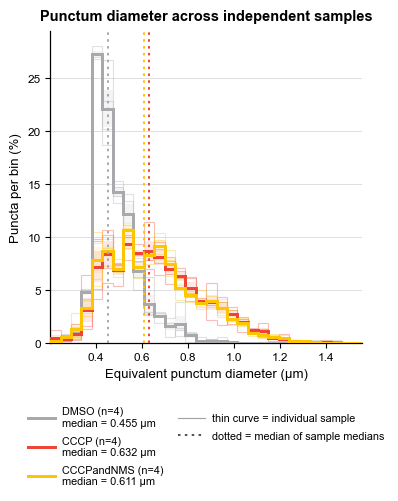

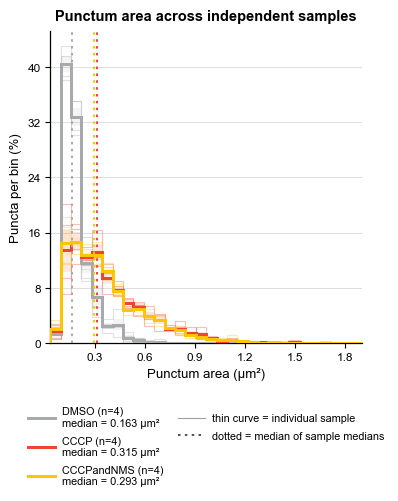

Punctum-size data source: in-memory puncta_table
Each legacy technical_replicate is treated as an independent biological sample. Group histograms are equal-weight means of the independent-sample distributions. The group-colored dotted reference line is the median of the independent-sample hierarchy-weighted medians.
Independent-replicate summary:


,measurement,treatment_group,experimental_occasion,legacy_technical_replicate,independent_replicate_id,independent_replicate_unit,n_puncta,n_cells,n_fields,hierarchy_weighted_mean,hierarchy_weighted_median,raw_punctum_median,raw_punctum_q1,raw_punctum_q3,weighting_status
0,equivalent_diameter_um,CCCP,1,NaN,occasion_1,CCCP|rep=occasion_1,1648,77,5,0.619804,0.587881,0.587881,0.470305,0.743617,equal_fields_equal_cells_equal_puncta_within_i...
1,equivalent_diameter_um,CCCP,2,NaN,occasion_2,CCCP|rep=occasion_2,1551,67,5,0.627097,0.599523,0.599523,0.484779,0.752855,equal_fields_equal_cells_equal_puncta_within_i...
2,equivalent_diameter_um,CCCP,3,NaN,occasion_3,CCCP|rep=occasion_3,983,59,5,0.692324,0.675424,0.665112,0.538802,0.806062,equal_fields_equal_cells_equal_puncta_within_i...
3,equivalent_diameter_um,CCCP,4,NaN,occasion_4,CCCP|rep=occasion_4,1367,83,5,0.698562,0.665112,0.665112,0.551481,0.831389,equal_fields_equal_cells_equal_puncta_within_i...
4,equivalent_diameter_um,CCCPandNMS,1,NaN,occasion_1,CCCPandNMS|rep=occasion_1,1855,65,5,0.631101,0.599523,0.599523,0.470305,0.743617,equal_fields_equal_cells_equal_puncta_within_i...
5,equivalent_diameter_um,CCCPandNMS,2,NaN,occasion_2,CCCPandNMS|rep=occasion_2,1749,50,5,0.629500,0.599523,0.587881,0.470305,0.743617,equal_fields_equal_cells_equal_puncta_within_i...
6,equivalent_diameter_um,CCCPandNMS,3,NaN,occasion_3,CCCPandNMS|rep=occasion_3,1270,71,5,0.661128,0.622155,0.622155,0.498834,0.788725,equal_fields_equal_cells_equal_puncta_within_i...
7,equivalent_diameter_um,CCCPandNMS,4,NaN,occasion_4,CCCPandNMS|rep=occasion_4,1456,72,5,0.681774,0.665112,0.654637,0.525817,0.814592,equal_fields_equal_cells_equal_puncta_within_i...
8,equivalent_diameter_um,DMSO,1,NaN,occasion_1,DMSO|rep=occasion_1,331,61,5,0.505294,0.455371,0.470305,0.423927,0.551481,equal_fields_equal_cells_equal_puncta_within_i...
9,equivalent_diameter_um,DMSO,2,NaN,occasion_2,DMSO|rep=occasion_2,279,47,5,0.491744,0.470305,0.470305,0.423927,0.551481,equal_fields_equal_cells_equal_puncta_within_i...


Exported files:
  plot_data_csv: C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts\puncta_output_preserved_5_7_9_plus_10_3_replicate_threshold_DMSO_normalized\figures\DMSO_vs_CCCP_vs_CCCPandNMS_punctum_size_independent_replicate_plot_data.csv
  metadata_audit_csv: C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts\puncta_output_preserved_5_7_9_plus_10_3_replicate_threshold_DMSO_normalized\figures\treatment_group_punctum_size_independent_replicate_histogram_metadata_audit.csv
  equivalent_diameter_um_independent_replicate_histogram_pdf: C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts\puncta_output_preserved_5_7_9_plus_10_3_replicate_threshold_DMSO_normalized\figures\DMSO_vs_CCCP_vs_CCCPandNMS_punctum_equivalent_diameter_um_histogram_independent_replicates.pdf
  punctum_area_um2_i

In [25]:
# Independent-biological-sample-resolved multi-group punctum-size histograms
#
# The source column named ``technical_replicate`` is intentionally treated as an
# independent biological sample. ``biological_replicate`` is retained as an
# experimental-occasion identifier.  The independent sample ID is the
# combination biological_replicate x technical_replicate.
#
# Histogram hierarchy:
#   equal puncta within cell -> equal cells within field -> equal fields within
#   independent sample -> equal independent samples within treatment.
#
# Every independent sample is shown as its own normalized curve. Treatment means
# and SEM ribbons are calculated across independent-sample distributions, so a
# sample containing more cells or puncta cannot dominate the group curve.

from __future__ import annotations

import re
from pathlib import Path

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.ticker import MaxNLocator
import numpy as np
import pandas as pd
from IPython.display import display


# -----------------------------------------------------------------------------
# User-editable display/export settings
# -----------------------------------------------------------------------------

PUNCTUM_SIZE_REPLICATE_HIST_SHOW_INDIVIDUAL_CURVES = bool(
    globals().get("PUNCTUM_SIZE_REPLICATE_HIST_SHOW_INDIVIDUAL_CURVES", True)
)
PUNCTUM_SIZE_REPLICATE_HIST_EXPORT_INDIVIDUAL_PDFS = bool(
    globals().get("PUNCTUM_SIZE_REPLICATE_HIST_EXPORT_INDIVIDUAL_PDFS", True)
)
PUNCTUM_SIZE_REPLICATE_HIST_MINIMUM_PUNCTA = int(
    globals().get("PUNCTUM_SIZE_REPLICATE_HIST_MINIMUM_PUNCTA", 1)
)
PUNCTUM_SIZE_REPLICATE_HIST_LINE_ALPHA = float(
    globals().get("PUNCTUM_SIZE_REPLICATE_HIST_LINE_ALPHA", 0.34)
)
PUNCTUM_SIZE_EXPECTED_REPLICATES_PER_GROUP = int(
    globals().get("PUNCTUM_SIZE_EXPECTED_REPLICATES_PER_GROUP", 4)
)
# The default vertical reference line is deliberately a median rather than a
# pooled-punctum mean.  First, a hierarchy-weighted median is calculated within
# every independent biological sample.  The displayed group value is then the
# median of those independent-sample medians, giving each biological sample one
# vote and remaining robust to the typically right-skewed punctum-size distribution.
PUNCTUM_SIZE_REPLICATE_HIST_CENTRAL_TENDENCY = str(
    globals().get("PUNCTUM_SIZE_REPLICATE_HIST_CENTRAL_TENDENCY", "median")
).strip().lower()  # "median" (recommended) or "mean"
PUNCTUM_SIZE_REPLICATE_HIST_CENTER_SIGNIFICANT_DIGITS = int(
    globals().get("PUNCTUM_SIZE_REPLICATE_HIST_CENTER_SIGNIFICANT_DIGITS", 3)
)
PUNCTUM_SIZE_REPLICATE_HIST_GROUP_ORDER = tuple(
    globals().get(
        "PUNCTUM_SIZE_REPLICATE_HIST_GROUP_ORDER",
        globals().get("PLOT_GROUP_ORDER", ("DMSO", "CCCP", "CCCPandNMS")),
    )
)
PUNCTUM_SIZE_REPLICATE_HIST_INCLUDE_UNLISTED_GROUPS = bool(
    globals().get(
        "PUNCTUM_SIZE_REPLICATE_HIST_INCLUDE_UNLISTED_GROUPS",
        globals().get("PLOT_INCLUDE_UNLISTED_GROUPS", True),
    )
)
PUNCTUM_SIZE_REPLICATE_HIST_GROUP_COLORS = dict(
    globals().get(
        "PUNCTUM_SIZE_REPLICATE_HIST_GROUP_COLORS",
        globals().get(
            "PLOT_GROUP_COLORS",
            {
                "DMSO": "#a7a9ac",
                "CCCP": "#f04337",
                "CCCPandNMS": "#3100ff",
            },
        ),
    )
)
if PUNCTUM_SIZE_REPLICATE_HIST_CENTRAL_TENDENCY not in {"median", "mean"}:
    raise ValueError(
        "PUNCTUM_SIZE_REPLICATE_HIST_CENTRAL_TENDENCY must be 'median' or 'mean'."
    )


# -----------------------------------------------------------------------------
# Loading and metadata parsing
# -----------------------------------------------------------------------------


def _rh_load_puncta_table() -> tuple[pd.DataFrame, str]:
    in_memory = globals().get("puncta_table")
    if isinstance(in_memory, pd.DataFrame) and not in_memory.empty:
        return in_memory.copy(), "in-memory puncta_table"
    output_root = Path(globals().get("OUTPUT_DIR", Path.cwd())).expanduser()
    candidate = output_root / "tables" / "puncta_measurements.csv"
    if candidate.is_file():
        try:
            return pd.read_csv(candidate), str(candidate)
        except Exception as exc:
            print(f"Could not read {candidate}: {type(exc).__name__}: {exc}")
    return pd.DataFrame(), "no usable in-memory or saved puncta table"


def _rh_unique_group_labels(values: object) -> list[str]:
    if isinstance(values, str):
        raw = [values]
    else:
        try:
            raw = list(values)
        except TypeError:
            raw = []
    labels: list[str] = []
    for value in raw:
        text = str(value).strip()
        if text and text not in labels:
            labels.append(text)
    return labels


def _rh_preferred_groups() -> list[str]:
    return _rh_unique_group_labels(PUNCTUM_SIZE_REPLICATE_HIST_GROUP_ORDER)


def _rh_known_groups() -> list[str]:
    labels = _rh_preferred_groups()
    configured = globals().get("FILENAME_GROUP_PATTERNS", ())
    items = list(configured.items()) if isinstance(configured, dict) else list(configured)
    for item in items:
        if isinstance(item, (tuple, list)) and len(item) == 2:
            canonical = str(item[0]).strip()
            if canonical and canonical not in labels:
                labels.append(canonical)
    return labels


def _rh_canonical_group(value: object) -> object:
    if pd.isna(value):
        return pd.NA
    text = str(value).strip()
    if not text:
        return pd.NA
    for canonical in _rh_known_groups():
        if text.casefold() == canonical.casefold():
            return canonical
    group, status = _rh_infer_group(text)
    return group if status.startswith("recognized") else pd.NA


def _rh_resolve_group_order(observed: object) -> list[str]:
    observed_labels = _rh_unique_group_labels(observed)
    ordered = [group for group in _rh_preferred_groups() if group in observed_labels]
    if PUNCTUM_SIZE_REPLICATE_HIST_INCLUDE_UNLISTED_GROUPS:
        ordered.extend(
            sorted(
                [group for group in observed_labels if group not in ordered],
                key=str.casefold,
            )
        )
    return ordered


def _rh_group_colors(group_order: list[str]) -> dict[str, str]:
    colors = {
        "DMSO": "#a7a9ac",
        "CCCP": "#f04337",
        "CCCPandNMS": "#3100ff",
    }
    colors.update(PUNCTUM_SIZE_REPLICATE_HIST_GROUP_COLORS)
    color_cycle = [mpl.colors.to_hex(plt.get_cmap("tab10")(index)) for index in range(10)]
    for index, group in enumerate(group_order):
        colors.setdefault(group, color_cycle[index % len(color_cycle)])
    return colors


def _rh_group_prefix(group_order: list[str]) -> str:
    return "_vs_".join(_rh_safe_filename(group) for group in group_order) or "treatment_groups"


def _rh_group_title(group_order: list[str]) -> str:
    return " / ".join(group_order) if group_order else "Treatment groups"


def _rh_canonical_identifier(value: object) -> object:
    if pd.isna(value):
        return pd.NA
    text = str(value).strip()
    if not text:
        return pd.NA
    try:
        numeric = float(text)
        if np.isfinite(numeric) and numeric.is_integer():
            return str(int(numeric))
    except Exception:
        pass
    return text


def _rh_infer_group(value: object) -> tuple[object, str]:
    text = "" if pd.isna(value) else str(value)
    shared_parser = globals().get("_infer_configured_filename_group")
    if callable(shared_parser):
        group, status = shared_parser(text)
        if status == "recognized":
            return group, "recognized_from_filename"
        return group, status

    remaining = text
    found: list[str] = []
    fallback_patterns = (
        ("CCCPandNMS", r"CCCP(?:[\s_-]*and[\s_-]*)NMS"),
        ("CCCP", r"CCCP"),
        ("DMSO", r"DMSO"),
    )
    for canonical, raw_pattern in fallback_patterns:
        token_pattern = rf"(?<![A-Za-z0-9])(?:{raw_pattern})(?![A-Za-z0-9])"
        if re.search(token_pattern, remaining, flags=re.IGNORECASE):
            found.append(canonical)
            remaining = re.sub(
                token_pattern,
                lambda match: " " * (match.end() - match.start()),
                remaining,
                flags=re.IGNORECASE,
            )
    unique = list(dict.fromkeys(found))
    if len(unique) == 1:
        return unique[0], "recognized_from_filename"
    if len(unique) > 1:
        return pd.NA, "ambiguous_multiple_groups"
    return pd.NA, "unrecognized_group_name"


def _rh_extract_identifier(value: object, kind: str) -> object:
    text = "" if pd.isna(value) else str(value)
    biological_pattern = (
        r"(?i)(?:^|[^A-Za-z0-9])"
        r"(?:biorep|bio[_\-\s]*rep(?:licate)?|biological[_\-\s]*rep(?:licate)?)"
        r"[_\-\s]*(\d+)(?!\d)"
    )
    technical_pattern = (
        r"(?i)(?:^|[^A-Za-z0-9])"
        r"(?:techrep|tech[_\-\s]*rep(?:licate)?|technical[_\-\s]*rep(?:licate)?)"
        r"[_\-\s]*(\d+)(?!\d)"
    )
    technical_token_with_value_pattern = (
        r"(?i)(?:^|[^A-Za-z0-9])"
        r"(?:techrep|tech[_\-\s]*rep(?:licate)?|technical[_\-\s]*rep(?:licate)?)"
        r"[_\-\s]*\d+(?!\d)"
    )

    if kind == "biological":
        match = re.search(biological_pattern, text)
        if match:
            return _rh_canonical_identifier(match.group(1))
        if bool(globals().get("ALLOW_GENERIC_REP_AS_BIOLOGICAL_REPLICATE", True)):
            generic_search_text = re.sub(technical_token_with_value_pattern, " ", text)
            match = re.search(
                r"(?i)(?:^|[^A-Za-z0-9])rep(?:licate)?[_\-\s]*(\d+)(?!\d)",
                generic_search_text,
            )
            if match:
                return _rh_canonical_identifier(match.group(1))
        return pd.NA

    if kind == "technical":
        match = re.search(technical_pattern, text)
        return _rh_canonical_identifier(match.group(1)) if match else pd.NA

    raise ValueError(f"Unknown replicate kind: {kind}")


def _rh_coalesce(
    table: pd.DataFrame,
    existing_column: str,
    filename_column: str,
    kind: str,
) -> tuple[pd.Series, pd.Series]:
    if existing_column in table.columns:
        existing = table[existing_column].map(_rh_canonical_identifier)
    else:
        existing = pd.Series(pd.NA, index=table.index, dtype="object")
    inferred = table[filename_column].map(
        lambda value: _rh_extract_identifier(value, kind)
    )
    combined = existing.where(existing.notna(), inferred)
    source = pd.Series(
        np.where(
            existing.notna(),
            f"column:{existing_column}",
            np.where(inferred.notna(), f"filename:{kind}", "missing"),
        ),
        index=table.index,
        dtype="object",
    )
    return combined, source


def _rh_replicate_id(occasion: object, legacy_technical: object) -> tuple[object, str]:
    occasion = _rh_canonical_identifier(occasion)
    legacy_technical = _rh_canonical_identifier(legacy_technical)
    if pd.notna(occasion) and pd.notna(legacy_technical):
        return f"occasion_{occasion}__sample_{legacy_technical}", "bio_x_technical"
    if pd.notna(legacy_technical):
        return f"sample_{legacy_technical}", "technical_only_fallback"
    if pd.notna(occasion):
        return f"occasion_{occasion}", "biological_only_fallback"
    return pd.NA, "missing_replicate_identifiers"


def _rh_prepare_table(raw: pd.DataFrame) -> tuple[pd.DataFrame, pd.DataFrame, str]:
    table = raw.copy()
    filename_column = next(
        (column for column in ("image_file", "field_id") if column in table.columns),
        None,
    )
    if filename_column is None:
        return pd.DataFrame(), pd.DataFrame(), "missing image_file/field_id"

    pixel_size_um = float(globals().get("PIXEL_SIZE_UM", 0.10419921875))
    if (
        "equivalent_diameter_um" not in table.columns
        and "equivalent_diameter_px" in table.columns
    ):
        table["equivalent_diameter_um"] = (
            pd.to_numeric(table["equivalent_diameter_px"], errors="coerce")
            * pixel_size_um
        )
    if "punctum_area_um2" not in table.columns:
        area_px_column = next(
            (
                column
                for column in ("punctum_area_px", "area_px2", "area_px")
                if column in table.columns
            ),
            None,
        )
        if area_px_column is not None:
            table["punctum_area_um2"] = (
                pd.to_numeric(table[area_px_column], errors="coerce")
                * pixel_size_um**2
            )
    for metric in ("equivalent_diameter_um", "punctum_area_um2"):
        if metric in table.columns:
            table[metric] = pd.to_numeric(table[metric], errors="coerce")

    if "group" in table.columns:
        table["_rh_group"] = table["group"].map(_rh_canonical_group)
        table["_rh_group_source"] = np.where(
            table["_rh_group"].notna(),
            "column:group",
            "missing_or_unrecognized_group_column",
        )
    else:
        table["_rh_group"] = pd.NA
        table["_rh_group_source"] = "missing_group_column"
    missing_group = table["_rh_group"].isna()
    if missing_group.any():
        inferred = table.loc[missing_group, filename_column].apply(_rh_infer_group)
        table.loc[missing_group, "_rh_group"] = [item[0] for item in inferred]
        table.loc[missing_group, "_rh_group_source"] = [item[1] for item in inferred]

    table["_rh_occasion"], table["_rh_occasion_source"] = _rh_coalesce(
        table, "biological_replicate", filename_column, "biological"
    )
    table["_rh_legacy_technical"], table["_rh_legacy_technical_source"] = _rh_coalesce(
        table, "technical_replicate", filename_column, "technical"
    )
    replicate_values = [
        _rh_replicate_id(occasion, legacy_technical)
        for occasion, legacy_technical in zip(
            table["_rh_occasion"], table["_rh_legacy_technical"]
        )
    ]
    table["_rh_replicate_id"] = [item[0] for item in replicate_values]
    table["_rh_replicate_id_source"] = [item[1] for item in replicate_values]

    if "image_file" in table.columns:
        field_base = table["image_file"].astype("string")
    else:
        field_base = table[filename_column].astype("string")
    table["_rh_field_id"] = field_base.fillna("field_unknown").astype(str)

    if "cell_id" in table.columns:
        cell_base = table["cell_id"].map(_rh_canonical_identifier)
    else:
        cell_base = pd.Series(pd.NA, index=table.index, dtype="object")
    table["_rh_cell_id"] = cell_base.fillna("cell_unknown").astype(str)

    group_text = table["_rh_group"].astype("string").fillna("group_unknown")
    replicate_text = table["_rh_replicate_id"].astype("string").fillna(
        "replicate_unknown"
    )
    field_text = table["_rh_field_id"].astype("string").fillna("field_unknown")
    cell_text = table["_rh_cell_id"].astype("string").fillna("cell_unknown")
    table["_rh_replicate_unit"] = group_text + "|rep=" + replicate_text
    table["_rh_field_unit"] = table["_rh_replicate_unit"] + "|field=" + field_text
    table["_rh_cell_unit"] = table["_rh_field_unit"] + "|cell=" + cell_text

    required_metrics = {"equivalent_diameter_um", "punctum_area_um2"}
    missing_metrics = sorted(required_metrics.difference(table.columns))
    if missing_metrics:
        return pd.DataFrame(), pd.DataFrame(), "missing metrics: " + ", ".join(missing_metrics)

    eligible_groups = _rh_resolve_group_order(
        table["_rh_group"].dropna().astype(str).unique()
    )
    valid_mask = (
        table["_rh_group"].isin(eligible_groups)
        & table["_rh_replicate_id"].notna()
        & np.isfinite(table["equivalent_diameter_um"])
        & (table["equivalent_diameter_um"] > 0)
        & np.isfinite(table["punctum_area_um2"])
        & (table["punctum_area_um2"] > 0)
    )
    table["_rh_analysis_status"] = np.where(valid_mask, "included", "excluded")
    reasons = []
    for _, row in table.iterrows():
        row_reasons: list[str] = []
        if row["_rh_group"] not in set(eligible_groups):
            row_reasons.append("group_missing_or_unrecognized")
        if pd.isna(row["_rh_replicate_id"]):
            row_reasons.append("independent_replicate_missing")
        if not np.isfinite(row["equivalent_diameter_um"]) or row["equivalent_diameter_um"] <= 0:
            row_reasons.append("invalid_equivalent_diameter_um")
        if not np.isfinite(row["punctum_area_um2"]) or row["punctum_area_um2"] <= 0:
            row_reasons.append("invalid_punctum_area_um2")
        reasons.append(";".join(row_reasons) if row_reasons else "included")
    table["_rh_exclusion_reason"] = reasons

    audit_columns = [
        column
        for column in (
            filename_column,
            "image_file",
            "field_id",
            "cell_id",
            "punctum_uid",
            "group",
            "biological_replicate",
            "technical_replicate",
            "_rh_group",
            "_rh_group_source",
            "_rh_occasion",
            "_rh_occasion_source",
            "_rh_legacy_technical",
            "_rh_legacy_technical_source",
            "_rh_replicate_id",
            "_rh_replicate_id_source",
            "equivalent_diameter_um",
            "punctum_area_um2",
            "_rh_analysis_status",
            "_rh_exclusion_reason",
        )
        if column in table.columns
    ]
    return table.loc[valid_mask].copy(), table[audit_columns].copy(), "ok"


# -----------------------------------------------------------------------------
# Histogram weighting and summaries
# -----------------------------------------------------------------------------


def _rh_add_weights(table: pd.DataFrame) -> pd.DataFrame:
    weighted = table.copy()
    fields = (
        weighted.groupby("_rh_replicate_unit", dropna=False)["_rh_field_unit"]
        .transform("nunique")
        .astype(float)
    )
    cells = (
        weighted.groupby(["_rh_replicate_unit", "_rh_field_unit"], dropna=False)[
            "_rh_cell_unit"
        ]
        .transform("nunique")
        .astype(float)
    )
    puncta = (
        weighted.groupby(
            ["_rh_replicate_unit", "_rh_field_unit", "_rh_cell_unit"],
            dropna=False,
        )["_rh_cell_unit"]
        .transform("size")
        .astype(float)
    )
    denominator = fields * cells * puncta
    weighted["_rh_within_replicate_weight"] = np.where(
        denominator > 0, 1.0 / denominator, np.nan
    )
    return weighted


def _rh_shared_edges(
    values: np.ndarray,
    minimum_bins: int = 8,
    maximum_bins: int = 30,
) -> np.ndarray:
    finite = np.asarray(values, dtype=float)
    finite = finite[np.isfinite(finite)]
    if finite.size == 0:
        return np.array([0.0, 1.0], dtype=float)
    minimum = float(np.min(finite))
    maximum = float(np.max(finite))
    if maximum <= minimum:
        padding = max(abs(minimum) * 0.08, 0.05)
        return np.array([minimum - padding, maximum + padding], dtype=float)
    q25, q75 = np.percentile(finite, [25, 75])
    iqr = float(q75 - q25)
    width = 2.0 * iqr / np.cbrt(finite.size) if iqr > 0 else 0.0
    if not np.isfinite(width) or width <= 0:
        n_bins = int(np.ceil(np.sqrt(finite.size)))
    else:
        n_bins = int(np.ceil((maximum - minimum) / width))
    n_bins = int(np.clip(n_bins, minimum_bins, maximum_bins))
    return np.linspace(minimum, maximum, n_bins + 1, dtype=float)


def _rh_weighted_quantile(
    values: np.ndarray,
    weights: np.ndarray,
    quantile: float,
) -> float:
    values = np.asarray(values, dtype=float)
    weights = np.asarray(weights, dtype=float)
    order = np.argsort(values)
    values = values[order]
    weights = weights[order]
    total = float(np.sum(weights))
    if total <= 0:
        return float("nan")
    cumulative = np.cumsum(weights) / total
    return float(np.interp(quantile, cumulative, values))


def _rh_histogram_tables(
    table: pd.DataFrame,
    metric: str,
    edges: np.ndarray,
) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    replicate_rows: list[dict[str, object]] = []
    summary_rows: list[dict[str, object]] = []

    group_columns = [
        "_rh_group",
        "_rh_occasion",
        "_rh_legacy_technical",
        "_rh_replicate_id",
        "_rh_replicate_unit",
    ]
    for (group, occasion, legacy_tech, rep_id, rep_unit), sample in table.groupby(
        group_columns, dropna=False, sort=True
    ):
        values = sample[metric].to_numpy(dtype=float)
        weights = sample["_rh_within_replicate_weight"].to_numpy(dtype=float)
        if values.size < PUNCTUM_SIZE_REPLICATE_HIST_MINIMUM_PUNCTA:
            continue
        if not np.all(np.isfinite(weights)) or float(np.sum(weights)) <= 0:
            weights = np.full(values.size, 1.0 / values.size)
            weighting_status = "fallback_equal_punctum_weight"
        else:
            weights = weights / np.sum(weights)
            weighting_status = (
                "equal_fields_equal_cells_equal_puncta_within_independent_sample"
            )
        percentages, _ = np.histogram(values, bins=edges, weights=100.0 * weights)
        summary_rows.append(
            {
                "measurement": metric,
                "treatment_group": group,
                "experimental_occasion": occasion,
                "legacy_technical_replicate": legacy_tech,
                "independent_replicate_id": rep_id,
                "independent_replicate_unit": rep_unit,
                "n_puncta": int(values.size),
                "n_cells": int(sample["_rh_cell_unit"].nunique()),
                "n_fields": int(sample["_rh_field_unit"].nunique()),
                "hierarchy_weighted_mean": float(np.sum(values * weights)),
                "hierarchy_weighted_median": _rh_weighted_quantile(values, weights, 0.5),
                "raw_punctum_median": float(np.median(values)),
                "raw_punctum_q1": float(np.percentile(values, 25)),
                "raw_punctum_q3": float(np.percentile(values, 75)),
                "weighting_status": weighting_status,
            }
        )
        for index, percentage in enumerate(percentages):
            replicate_rows.append(
                {
                    "measurement": metric,
                    "treatment_group": group,
                    "experimental_occasion": occasion,
                    "legacy_technical_replicate": legacy_tech,
                    "independent_replicate_id": rep_id,
                    "independent_replicate_unit": rep_unit,
                    "bin_index": int(index),
                    "bin_left": float(edges[index]),
                    "bin_right": float(edges[index + 1]),
                    "independent_replicate_percentage": float(percentage),
                    "n_puncta": int(values.size),
                    "n_cells": int(sample["_rh_cell_unit"].nunique()),
                    "n_fields": int(sample["_rh_field_unit"].nunique()),
                    "weighting_status": weighting_status,
                }
            )

    replicate_bins = pd.DataFrame(replicate_rows)
    replicate_summary = pd.DataFrame(summary_rows)
    if replicate_bins.empty:
        return replicate_bins, pd.DataFrame(), replicate_summary

    group_bins = (
        replicate_bins.groupby(
            ["measurement", "treatment_group", "bin_index", "bin_left", "bin_right"],
            dropna=False,
            as_index=False,
        )
        .agg(
            group_mean_percentage=("independent_replicate_percentage", "mean"),
            independent_replicate_sd=("independent_replicate_percentage", "std"),
            independent_replicate_sem=(
                "independent_replicate_percentage",
                lambda values: (
                    float(np.std(values, ddof=1) / np.sqrt(len(values)))
                    if len(values) > 1
                    else float("nan")
                ),
            ),
            n_independent_replicates=("independent_replicate_unit", "nunique"),
        )
    )
    return replicate_bins, group_bins, replicate_summary


# -----------------------------------------------------------------------------
# Vector plotting helpers
# -----------------------------------------------------------------------------


def _rh_style_square_axis(ax: mpl.axes.Axes) -> None:
    ax.set_box_aspect(1)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(0.9)
    ax.spines["bottom"].set_linewidth(0.9)
    ax.tick_params(axis="both", direction="out", length=3.5, width=0.8, pad=3)
    ax.grid(axis="y", color="#D9D9D9", linewidth=0.6, zorder=0)
    ax.set_axisbelow(True)


def _rh_save_pdf(fig: mpl.figure.Figure, path: Path, title: str, subject: str) -> None:
    fig.savefig(
        path,
        format="pdf",
        bbox_inches="tight",
        pad_inches=0.08,
        facecolor="white",
        edgecolor="none",
        metadata={
            "Title": title,
            "Creator": "Matplotlib vector PDF; embedded TrueType text; no rasterized artists",
            "Subject": subject,
        },
    )


def _rh_step_extend(values: np.ndarray) -> np.ndarray:
    values = np.asarray(values, dtype=float)
    if values.size == 0:
        return values
    return np.r_[values, values[-1]]


def _rh_safe_filename(value: object) -> str:
    text = "unknown" if pd.isna(value) else str(value)
    text = re.sub(r"[^A-Za-z0-9._-]+", "_", text).strip("_")
    return text or "unknown"


def _rh_metric_unit(metric: str) -> str:
    return {
        "equivalent_diameter_um": "µm",
        "punctum_area_um2": "µm²",
    }.get(metric, "")


def _rh_group_center_table(replicate_summary: pd.DataFrame) -> pd.DataFrame:
    """Return an equal-independent-sample group center for each plotted metric.

    The recommended/default statistic is the median of the hierarchy-weighted
    medians from the independent biological samples.  This deliberately avoids
    a pooled-punctum center, which would give more influence to samples with more
    detected puncta, cells, or fields.  The optional mean setting analogously
    uses the mean of the hierarchy-weighted sample means.
    """
    if replicate_summary.empty:
        return pd.DataFrame()

    if PUNCTUM_SIZE_REPLICATE_HIST_CENTRAL_TENDENCY == "median":
        replicate_column = "hierarchy_weighted_median"
        aggregate = np.median
        statistic_label = "median of independent-sample medians"
    else:
        replicate_column = "hierarchy_weighted_mean"
        aggregate = np.mean
        statistic_label = "mean of independent-sample means"

    rows: list[dict[str, object]] = []
    for (metric, group), subset in replicate_summary.groupby(
        ["measurement", "treatment_group"], dropna=False, sort=True
    ):
        values = pd.to_numeric(subset[replicate_column], errors="coerce").to_numpy(
            dtype=float
        )
        values = values[np.isfinite(values)]
        if values.size == 0:
            continue
        rows.append(
            {
                "measurement": metric,
                "treatment_group": group,
                "group_center_value": float(aggregate(values)),
                "group_center_statistic": statistic_label,
                "independent_sample_summary_column": replicate_column,
                "n_independent_replicates": int(values.size),
                "independent_sample_values": ";".join(f"{value:.12g}" for value in values),
                "measurement_unit": _rh_metric_unit(str(metric)),
            }
        )
    return pd.DataFrame(rows)


def _rh_format_center(value: float, unit: str) -> str:
    digits = max(1, PUNCTUM_SIZE_REPLICATE_HIST_CENTER_SIGNIFICANT_DIGITS)
    number = f"{float(value):.{digits}g}"
    return f"{number} {unit}".strip()


# -----------------------------------------------------------------------------
# Main export function
# -----------------------------------------------------------------------------


def generate_cccp_dmso_punctum_size_histograms_by_independent_replicate() -> dict[str, Path]:
    raw, source = _rh_load_puncta_table()
    output_root = Path(globals().get("OUTPUT_DIR", Path.cwd())).expanduser()
    figure_dir = output_root / "figures"
    figure_dir.mkdir(parents=True, exist_ok=True)
    individual_dir = figure_dir / "independent_replicate_punctum_size_histograms"
    individual_dir.mkdir(parents=True, exist_ok=True)

    if raw.empty:
        print(
            "No punctum-level table is available. Run the batch-analysis cell first or "
            "provide tables/puncta_measurements.csv."
        )
        return {}

    valid, audit, status = _rh_prepare_table(raw)
    audit_path = (
        figure_dir
        / "treatment_group_punctum_size_independent_replicate_histogram_metadata_audit.csv"
    )
    audit.to_csv(audit_path, index=False)
    if status != "ok" or valid.empty:
        print(f"Independent-replicate histograms were skipped: {status}.")
        return {"metadata_audit_csv": audit_path}

    valid = _rh_add_weights(valid)
    plot_data_columns = [
        column
        for column in (
            "group",
            "biological_replicate",
            "technical_replicate",
            "image_file",
            "field_id",
            "cell_id",
            "punctum_uid",
            "size_class",
            "equivalent_diameter_px",
            "equivalent_diameter_um",
            "punctum_area_px",
            "punctum_area_um2",
            "detection_scale_px",
            "detection_role",
            "_rh_group",
            "_rh_occasion",
            "_rh_legacy_technical",
            "_rh_replicate_id",
            "_rh_replicate_unit",
            "_rh_field_unit",
            "_rh_cell_unit",
            "_rh_within_replicate_weight",
        )
        if column in valid.columns
    ]
    group_order = _rh_resolve_group_order(valid["_rh_group"].dropna().astype(str).unique())
    colors = _rh_group_colors(group_order)
    plot_prefix = _rh_group_prefix(group_order)
    plot_group_title = _rh_group_title(group_order)

    plot_data_path = (
        figure_dir / f"{plot_prefix}_punctum_size_independent_replicate_plot_data.csv"
    )
    valid[plot_data_columns].to_csv(plot_data_path, index=False)
    vector_rc = {
        "pdf.fonttype": 42,
        "ps.fonttype": 42,
        "pdf.compression": 0,
        "text.usetex": False,
        "font.family": "sans-serif",
        "font.sans-serif": ["Arial", "Helvetica", "DejaVu Sans"],
        "font.size": 9,
        "axes.titlesize": 10.5,
        "axes.labelsize": 9.5,
        "xtick.labelsize": 8.5,
        "ytick.labelsize": 8.5,
        "legend.fontsize": 7.8,
        "axes.unicode_minus": False,
    }

    plot_specs = [
        (
            "equivalent_diameter_um",
            "Equivalent punctum diameter (µm)",
            "Punctum diameter across independent samples",
            f"{plot_prefix}_punctum_equivalent_diameter_um_histogram_independent_replicates.pdf",
        ),
        (
            "punctum_area_um2",
            "Punctum area (µm²)",
            "Punctum area across independent samples",
            f"{plot_prefix}_punctum_area_um2_histogram_independent_replicates.pdf",
        ),
    ]

    all_replicate_bins: list[pd.DataFrame] = []
    all_group_bins: list[pd.DataFrame] = []
    all_summaries: list[pd.DataFrame] = []
    all_group_centers: list[pd.DataFrame] = []
    exported: dict[str, Path] = {
        "plot_data_csv": plot_data_path,
        "metadata_audit_csv": audit_path,
    }

    with mpl.rc_context(vector_rc):
        for metric, x_label, title, filename in plot_specs:
            edges = _rh_shared_edges(valid[metric].to_numpy(dtype=float))
            replicate_bins, group_bins, replicate_summary = _rh_histogram_tables(
                valid, metric, edges
            )
            if replicate_bins.empty or group_bins.empty:
                print(f"No usable independent-replicate distributions for {metric}; skipped.")
                continue
            all_replicate_bins.append(replicate_bins)
            all_group_bins.append(group_bins)
            all_summaries.append(replicate_summary)
            group_centers = _rh_group_center_table(replicate_summary)
            all_group_centers.append(group_centers)

            fig, ax = plt.subplots(figsize=(4.9, 4.9), constrained_layout=True)
            if PUNCTUM_SIZE_REPLICATE_HIST_SHOW_INDIVIDUAL_CURVES:
                for (group, rep_id), curve in replicate_bins.groupby(
                    ["treatment_group", "independent_replicate_id"], sort=True
                ):
                    curve = curve.sort_values("bin_index")
                    ax.stairs(
                        curve["independent_replicate_percentage"].to_numpy(dtype=float),
                        edges,
                        fill=False,
                        color=colors.get(group, "#555555"),
                        linewidth=0.82,
                        alpha=PUNCTUM_SIZE_REPLICATE_HIST_LINE_ALPHA,
                        rasterized=False,
                        zorder=2,
                    )

            group_handles: list[Line2D] = []
            for group in group_order:
                curve = group_bins[group_bins["treatment_group"].eq(group)].sort_values(
                    "bin_index"
                )
                if curve.empty:
                    continue
                mean = curve["group_mean_percentage"].to_numpy(dtype=float)
                sem = curve["independent_replicate_sem"].to_numpy(dtype=float)
                sem = np.where(np.isfinite(sem), sem, 0.0)
                lower = np.clip(mean - sem, 0.0, None)
                upper = mean + sem
                ax.fill_between(
                    edges,
                    _rh_step_extend(lower),
                    _rh_step_extend(upper),
                    step="post",
                    color=colors[group],
                    alpha=0.12,
                    linewidth=0,
                    rasterized=False,
                    zorder=1,
                )
                ax.stairs(
                    mean,
                    edges,
                    fill=False,
                    color=colors[group],
                    linewidth=2.15,
                    rasterized=False,
                    zorder=4,
                )

                center_row = group_centers[
                    group_centers["treatment_group"].eq(group)
                ]
                if center_row.empty:
                    center_value = float("nan")
                    center_text = "center unavailable"
                else:
                    center_value = float(center_row.iloc[0]["group_center_value"])
                    center_text = _rh_format_center(
                        center_value,
                        str(center_row.iloc[0]["measurement_unit"]),
                    )
                    ax.axvline(
                        center_value,
                        color=colors[group],
                        linestyle=(0, (1.25, 2.15)),
                        linewidth=1.45,
                        alpha=0.98,
                        rasterized=False,
                        zorder=6,
                    )

                n_reps = int(curve["n_independent_replicates"].max())
                group_handles.append(
                    Line2D(
                        [0],
                        [0],
                        color=colors[group],
                        linewidth=2.15,
                        label=(
                            f"{group} (n={n_reps})\nmedian = {center_text}"
                            if PUNCTUM_SIZE_REPLICATE_HIST_CENTRAL_TENDENCY == "median"
                            else f"{group} (n={n_reps})\nmean = {center_text}"
                        ),
                    )
                )

            _rh_style_square_axis(ax)
            ax.set_title(title, pad=8, weight="semibold")
            ax.set_xlabel(x_label)
            ax.set_ylabel("Puncta per bin (%)")
            ax.set_xlim(edges[0], edges[-1])
            ax.set_ylim(bottom=0)
            ax.xaxis.set_major_locator(MaxNLocator(nbins=7))
            ax.yaxis.set_major_locator(MaxNLocator(nbins=6))

            explanatory_handles = [
                Line2D(
                    [0],
                    [0],
                    color="#555555",
                    linewidth=0.82,
                    alpha=0.55,
                    label="thin curve = individual sample",
                ),
                Line2D(
                    [0],
                    [0],
                    color="#555555",
                    linewidth=1.45,
                    linestyle=(0, (1.25, 2.15)),
                    label=(
                        "dotted = median of sample medians"
                        if PUNCTUM_SIZE_REPLICATE_HIST_CENTRAL_TENDENCY == "median"
                        else "dotted = mean of sample means"
                    ),
                ),
            ]
            ax.legend(
                handles=group_handles + explanatory_handles,
                frameon=False,
                loc="upper center",
                bbox_to_anchor=(0.5, -0.19),
                borderaxespad=0.0,
                ncol=2,
                columnspacing=1.35,
                handlelength=2.5,
                handletextpad=0.65,
                labelspacing=0.7,
            )

            path = figure_dir / filename
            _rh_save_pdf(
                fig,
                path,
                f"{plot_group_title}: {title}",
                (
                    "Every legacy technical replicate treated as an independent biological "
                    "sample; equal-sample treatment mean and SEM; editable vector PDF."
                ),
            )
            plt.show()
            plt.close(fig)
            exported[metric + "_independent_replicate_histogram_pdf"] = path

            if PUNCTUM_SIZE_REPLICATE_HIST_EXPORT_INDIVIDUAL_PDFS:
                for (group, rep_id), curve in replicate_bins.groupby(
                    ["treatment_group", "independent_replicate_id"], sort=True
                ):
                    curve = curve.sort_values("bin_index")
                    fig_rep, ax_rep = plt.subplots(figsize=(4.6, 4.6), constrained_layout=True)
                    percentages = curve[
                        "independent_replicate_percentage"
                    ].to_numpy(dtype=float)
                    ax_rep.stairs(
                        percentages,
                        edges,
                        fill=True,
                        facecolor=colors.get(group, "#777777"),
                        edgecolor="none",
                        alpha=0.14,
                        rasterized=False,
                        zorder=1,
                    )
                    ax_rep.stairs(
                        percentages,
                        edges,
                        fill=False,
                        color=colors.get(group, "#777777"),
                        linewidth=1.9,
                        rasterized=False,
                        zorder=3,
                    )
                    summary_row = replicate_summary[
                        replicate_summary["treatment_group"].eq(group)
                        & replicate_summary["independent_replicate_id"].eq(rep_id)
                    ]
                    if summary_row.empty:
                        subtitle = str(rep_id)
                    else:
                        row = summary_row.iloc[0]
                        if PUNCTUM_SIZE_REPLICATE_HIST_CENTRAL_TENDENCY == "median":
                            sample_center = float(row["hierarchy_weighted_median"])
                            sample_center_name = "median"
                        else:
                            sample_center = float(row["hierarchy_weighted_mean"])
                            sample_center_name = "mean"
                        ax_rep.axvline(
                            sample_center,
                            color=colors.get(group, "#777777"),
                            linestyle=(0, (1.25, 2.15)),
                            linewidth=1.35,
                            rasterized=False,
                            zorder=5,
                        )
                        subtitle = (
                            f"{rep_id}; n={int(row['n_puncta']):,} puncta, "
                            f"{int(row['n_cells'])} cells, {int(row['n_fields'])} fields; "
                            f"{sample_center_name}="
                            f"{_rh_format_center(sample_center, _rh_metric_unit(metric))}"
                        )
                    _rh_style_square_axis(ax_rep)
                    ax_rep.set_title(f"{group}: {subtitle}", pad=8, weight="semibold")
                    ax_rep.set_xlabel(x_label)
                    ax_rep.set_ylabel("Puncta per bin (%)")
                    ax_rep.set_xlim(edges[0], edges[-1])
                    ax_rep.set_ylim(bottom=0)
                    ax_rep.xaxis.set_major_locator(MaxNLocator(nbins=7))
                    ax_rep.yaxis.set_major_locator(MaxNLocator(nbins=6))
                    rep_path = (
                        individual_dir
                        / f"{_rh_safe_filename(group)}_{_rh_safe_filename(rep_id)}_{metric}.pdf"
                    )
                    _rh_save_pdf(
                        fig_rep,
                        rep_path,
                        f"{group} punctum-size distribution: {rep_id}",
                        "Single independent biological sample; editable vector PDF.",
                    )
                    plt.close(fig_rep)

    replicate_bins_all = (
        pd.concat(all_replicate_bins, ignore_index=True)
        if all_replicate_bins
        else pd.DataFrame()
    )
    group_bins_all = (
        pd.concat(all_group_bins, ignore_index=True) if all_group_bins else pd.DataFrame()
    )
    summaries_all = (
        pd.concat(all_summaries, ignore_index=True) if all_summaries else pd.DataFrame()
    )
    group_centers_all = (
        pd.concat(all_group_centers, ignore_index=True)
        if all_group_centers
        else pd.DataFrame()
    )

    replicate_bins_path = (
        figure_dir
        / f"{plot_prefix}_punctum_size_independent_replicate_histogram_bins.csv"
    )
    group_bins_path = (
        figure_dir / f"{plot_prefix}_punctum_size_equal_replicate_group_histogram_bins.csv"
    )
    summary_path = (
        figure_dir / f"{plot_prefix}_punctum_size_independent_replicate_summary.csv"
    )
    group_center_path = (
        figure_dir / f"{plot_prefix}_punctum_size_group_central_tendency.csv"
    )
    replicate_bins_all.to_csv(replicate_bins_path, index=False)
    group_bins_all.to_csv(group_bins_path, index=False)
    summaries_all.to_csv(summary_path, index=False)
    group_centers_all.to_csv(group_center_path, index=False)

    count_table = (
        summaries_all[summaries_all["measurement"].eq("equivalent_diameter_um")]
        .groupby("treatment_group")["independent_replicate_id"]
        .nunique()
        .reindex(group_order, fill_value=0)
        if not summaries_all.empty
        else pd.Series({group: 0 for group in group_order})
    )
    design_row = {
                "purpose": "punctum_size_histogram_visualization",
                "legacy_technical_replicate_role": (
                    "independent biological sample; not a nested technical subsample"
                ),
                "biological_replicate_role": (
                    "experimental occasion/batch metadata; not used to average samples together"
                ),
                "independent_replicate_id_definition": (
                    "biological_replicate x technical_replicate"
                ),
                "within_independent_replicate_weighting": (
                    "equal fields; equal cells within field; equal puncta within cell"
                ),
                "between_replicate_weighting": (
                    "equal independent samples within each treatment"
                ),
                "expected_independent_samples_per_group": (
                    PUNCTUM_SIZE_EXPECTED_REPLICATES_PER_GROUP
                ),
                "unit_of_inference_for_statistics": "independent biological sample",
                "group_center_line_statistic": (
                    "median of hierarchy-weighted independent-sample medians"
                    if PUNCTUM_SIZE_REPLICATE_HIST_CENTRAL_TENDENCY == "median"
                    else "mean of hierarchy-weighted independent-sample means"
                ),
                "group_center_line_rationale": (
                    "equal weight for each independent biological sample; median default is "
                    "robust to right-skewed punctum-size distributions and outliers"
                ),
                "group_center_line_display": (
                    "group-colored vertical dotted line with numeric value in the legend"
                ),
                "data_source": source,
    }
    for group in group_order:
        design_row[f"n_independent_samples_{_rh_safe_filename(group)}"] = int(
            count_table.get(group, 0)
        )
    design = pd.DataFrame([design_row])
    design_path = (
        figure_dir / f"{plot_prefix}_punctum_size_independent_replicate_histogram_design.csv"
    )
    design.to_csv(design_path, index=False)

    exported.update(
        {
            "independent_replicate_histogram_bins_csv": replicate_bins_path,
            "equal_replicate_group_histogram_bins_csv": group_bins_path,
            "independent_replicate_summary_csv": summary_path,
            "group_central_tendency_csv": group_center_path,
            "independent_replicate_histogram_design_csv": design_path,
            "individual_independent_replicate_pdf_directory": individual_dir,
        }
    )

    print(f"Punctum-size data source: {source}")
    print(
        "Each legacy technical_replicate is treated as an independent biological sample. "
        "Group histograms are equal-weight means of the independent-sample distributions. "
        "The group-colored dotted reference line is the "
        + (
            "median of the independent-sample hierarchy-weighted medians."
            if PUNCTUM_SIZE_REPLICATE_HIST_CENTRAL_TENDENCY == "median"
            else "mean of the independent-sample hierarchy-weighted means."
        )
    )
    print("Independent-replicate summary:")
    display(summaries_all)
    unexpected_counts = {
        group: int(count_table.get(group, 0))
        for group in group_order
        if int(count_table.get(group, 0)) != PUNCTUM_SIZE_EXPECTED_REPLICATES_PER_GROUP
    }
    if unexpected_counts:
        formatted = ", ".join(
            f"{group}={count}" for group, count in unexpected_counts.items()
        )
        print(
            "WARNING: independent-sample counts differ from the configured expectation "
            f"of {PUNCTUM_SIZE_EXPECTED_REPLICATES_PER_GROUP} per group: {formatted}."
        )
    print("Exported files:")
    for label, path in exported.items():
        print(f"  {label}: {path}")
    return exported


PUNCTUM_SIZE_INDEPENDENT_REPLICATE_HISTOGRAM_OUTPUTS = (
    generate_cccp_dmso_punctum_size_histograms_by_independent_replicate()
)

## Replicate-aware MFN2-Halo intensity versus puncta-density plots

This additional plotting cell creates three square, editable vector-PDF scatterplots using the configured treatment colors:

1. the **field arithmetic mean** of the per-cell whole-cell MFN2-Halo JF646 raw mean intensity versus total field puncta density;
2. the **field arithmetic mean** of cell-balanced MFN2-Halo raw mean intensity across all retained punctum ROIs versus total field puncta density; and
3. the corresponding field mean restricted to **medium and large punctum ROIs**.

For the two ROI outcomes, punctum-level raw means are first averaged within each cell and the resulting cell means are then averaged across the field. This gives every qualifying cell equal weight rather than allowing cells with many puncta to dominate. The x-axis remains the total LC3-puncta count per 100 µm² of analyzed cell-mask area for all three plots.

Fields are displayed as points, but they are not treated as independent observations for inference. A robust Theil-Sen slope is calculated separately within each independent biological sample across its fields. Group trends are the median of those sample-level slopes and intercepts, confidence intervals resample independent samples, and group comparisons permute sample-level slopes rather than cells, puncta, or fields.


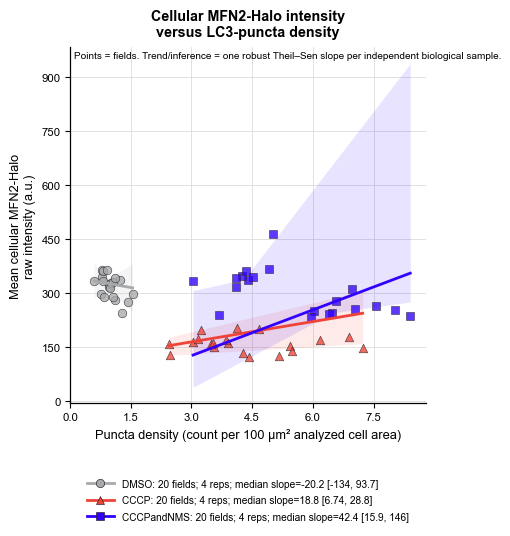

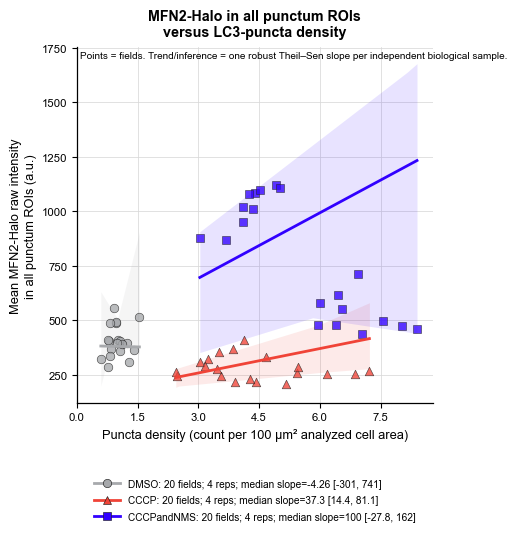

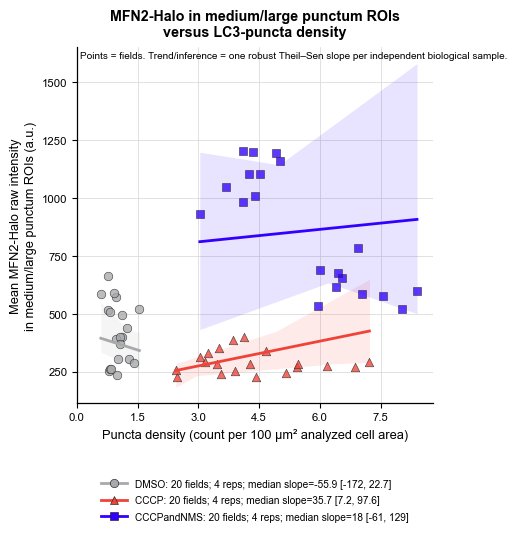

Replicate-aware MFN2-Halo versus puncta-density analysis
Cell data source: in-memory cell_table
Punctum data source: in-memory puncta_table
Fields are shown as points, but inference uses one robust slope per independent biological sample; no pooled-field p-value is reported.
Group slope summary:


,outcome,outcome_label,treatment_group,n_independent_replicate_slopes,n_fields_across_fitted_replicates,median_replicate_theil_sen_slope,bootstrap_95_ci_low_slope,bootstrap_95_ci_high_slope,median_replicate_intercept,median_replicate_spearman_rho_descriptive,sign_flip_p_value_slope_vs_zero,sign_flip_method,sign_flip_permutations,inference_status,sign_flip_p_value_holm_across_groups
0,field_mean_cellular_MFN2_raw_mean,Mean cellular MFN2-Halo\nraw intensity (a.u.),DMSO,4,20,-20.249553,-133.738339,93.698955,346.751704,-0.10,0.75,exact_sign_flip,16,replicate_aware_inference,0.75
1,field_mean_cellular_MFN2_raw_mean,Mean cellular MFN2-Halo\nraw intensity (a.u.),CCCP,4,20,18.818310,6.744141,28.815942,108.949105,0.60,0.25,exact_sign_flip,16,replicate_aware_inference,0.75
2,field_mean_cellular_MFN2_raw_mean,Mean cellular MFN2-Halo\nraw intensity (a.u.),CCCPandNMS,4,20,42.414359,15.909801,145.977524,-0.088607,0.75,0.25,exact_sign_flip,16,replicate_aware_inference,0.75
3,field_mean_cell_balanced_punctum_ROI_MFN2_raw_...,Mean MFN2-Halo raw intensity\nin all punctum R...,DMSO,4,20,-4.262528,-301.451541,740.822198,384.969615,0.15,1.00,exact_sign_flip,16,replicate_aware_inference,1.00
4,field_mean_cell_balanced_punctum_ROI_MFN2_raw_...,Mean MFN2-Halo raw intensity\nin all punctum R...,CCCP,4,20,37.283363,14.368717,81.103294,147.073491,0.70,0.25,exact_sign_flip,16,replicate_aware_inference,0.75
5,field_mean_cell_balanced_punctum_ROI_MFN2_raw_...,Mean MFN2-Halo raw intensity\nin all punctum R...,CCCPandNMS,4,20,99.987711,-27.849232,162.369226,393.047341,0.30,0.25,exact_sign_flip,16,replicate_aware_inference,0.75
6,field_mean_cell_balanced_medium_large_punctum_...,Mean MFN2-Halo raw intensity\nin medium/large ...,DMSO,4,20,-55.907945,-172.101296,22.661566,427.476792,-0.10,0.25,exact_sign_flip,16,replicate_aware_inference,0.75
7,field_mean_cell_balanced_medium_large_punctum_...,Mean MFN2-Halo raw intensity\nin medium/large ...,CCCP,4,20,35.690235,7.203273,97.588043,167.401207,0.85,0.25,exact_sign_flip,16,replicate_aware_inference,0.75
8,field_mean_cell_balanced_medium_large_punctum_...,Mean MFN2-Halo raw intensity\nin medium/large ...,CCCPandNMS,4,20,17.981960,-61.034126,128.653640,756.990734,0.00,0.75,exact_sign_flip,16,replicate_aware_inference,0.75


Pairwise replicate-slope comparisons:


,outcome,outcome_label,group_a,group_b,n_independent_replicates_group_a,n_independent_replicates_group_b,median_slope_difference_group_a_minus_group_b,bootstrap_95_ci_low_difference,bootstrap_95_ci_high_difference,replicate_label_permutation_p_value,permutation_method,permutations,inference_status,holm_adjusted_pairwise_p_value
0,field_mean_cellular_MFN2_raw_mean,Mean cellular MFN2-Halo\nraw intensity (a.u.),DMSO,CCCP,4,4,-39.067863,-152.556649,74.880645,0.485714,exact_label_permutation,70,replicate_aware_inference,0.800000
1,field_mean_cellular_MFN2_raw_mean,Mean cellular MFN2-Halo\nraw intensity (a.u.),DMSO,CCCPandNMS,4,4,-62.663912,-223.721165,60.093898,0.400000,exact_label_permutation,70,replicate_aware_inference,0.800000
2,field_mean_cellular_MFN2_raw_mean,Mean cellular MFN2-Halo\nraw intensity (a.u.),CCCP,CCCPandNMS,4,4,-23.596049,-127.159214,7.489150,0.228571,exact_label_permutation,70,replicate_aware_inference,0.685714
3,field_mean_cell_balanced_punctum_ROI_MFN2_raw_...,Mean MFN2-Halo raw intensity\nin all punctum R...,DMSO,CCCP,4,4,-41.545891,-338.734903,703.538835,0.400000,exact_label_permutation,70,replicate_aware_inference,0.857143
4,field_mean_cell_balanced_punctum_ROI_MFN2_raw_...,Mean MFN2-Halo raw intensity\nin all punctum R...,DMSO,CCCPandNMS,4,4,-104.250239,-401.439252,640.834487,0.371429,exact_label_permutation,70,replicate_aware_inference,0.857143
5,field_mean_cell_balanced_punctum_ROI_MFN2_raw_...,Mean MFN2-Halo raw intensity\nin all punctum R...,CCCP,CCCPandNMS,4,4,-62.704349,-136.497150,66.446571,0.285714,exact_label_permutation,70,replicate_aware_inference,0.857143
6,field_mean_cell_balanced_medium_large_punctum_...,Mean MFN2-Halo raw intensity\nin medium/large ...,DMSO,CCCP,4,4,-91.598179,-221.436955,-13.028669,0.085714,exact_label_permutation,70,replicate_aware_inference,0.257143
7,field_mean_cell_balanced_medium_large_punctum_...,Mean MFN2-Halo raw intensity\nin medium/large ...,DMSO,CCCPandNMS,4,4,-73.889904,-222.563359,37.602922,0.200000,exact_label_permutation,70,replicate_aware_inference,0.400000
8,field_mean_cell_balanced_medium_large_punctum_...,Mean MFN2-Halo raw intensity\nin medium/large ...,CCCP,CCCPandNMS,4,4,17.708275,-92.963406,121.314156,0.685714,exact_label_permutation,70,replicate_aware_inference,0.685714


Omnibus replicate-slope tests:


,outcome,outcome_label,omnibus_statistic_weighted_squared_deviation_of_group_median_slopes,omnibus_replicate_label_permutation_p_value,permutation_method,permutations,n_groups,n_independent_replicate_slopes
0,field_mean_cellular_MFN2_raw_mean,Mean cellular MFN2-Halo\nraw intensity (a.u.),9815.774172,0.324577,monte_carlo_replicate_label_permutation,100000,3,12
1,field_mean_cell_balanced_punctum_ROI_MFN2_raw_...,Mean MFN2-Halo raw intensity\nin all punctum R...,22122.041234,0.343107,monte_carlo_replicate_label_permutation,100000,3,12
2,field_mean_cell_balanced_medium_large_punctum_...,Mean MFN2-Halo raw intensity\nin medium/large ...,20583.682471,0.265567,monte_carlo_replicate_label_permutation,100000,3,12


Exported files:
  field_mean_cellular_MFN2_raw_mean_pdf: C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts\puncta_output_preserved_5_7_9_plus_10_3_replicate_threshold_DMSO_normalized\figures\DMSO_vs_CCCP_vs_CCCPandNMS_field_mean_cellular_MFN2_raw_vs_puncta_per_100_um2.pdf
  field_mean_cell_balanced_punctum_ROI_MFN2_raw_mean_pdf: C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts\puncta_output_preserved_5_7_9_plus_10_3_replicate_threshold_DMSO_normalized\figures\DMSO_vs_CCCP_vs_CCCPandNMS_field_mean_all_punctum_ROI_MFN2_raw_vs_puncta_per_100_um2.pdf
  field_mean_cell_balanced_medium_large_punctum_ROI_MFN2_raw_mean_pdf: C:\Users\narendradp\OneDrive - National Institutes of Health\Documents\Jennifer_Data\Cellpose_confocal_analysis_scripts\puncta_output_preserved_5_7_9_plus_10_3_replicate_threshold_DMSO_normalized\figures\DMSO_vs_CCCP_vs_CCCPandNMS_fiel

In [18]:
# Replicate-aware field-level MFN2-Halo versus puncta-density analysis
#
# This cell creates three square, Illustrator-editable vector scatterplots:
#   1) field mean of per-cell whole-cell MFN2-Halo raw mean intensity
#      versus field puncta count per 100 um^2 of analyzed cell-mask area;
#   2) field mean of cell-balanced MFN2-Halo raw mean intensity across all
#      retained punctum ROIs versus the same field puncta density;
#   3) the corresponding field mean restricted to medium and large punctum ROIs.
#
# The requested arithmetic mean is used for each plotted field-level intensity.
# To avoid cells with many puncta dominating the ROI outcomes, punctum-ROI means
# are first averaged within each cell and those cell means are then averaged within
# each field. Fields are displayed as points, but pooled fields are NOT treated as
# independent observations for inference. Each independent biological sample
# contributes one robust Theil-Sen slope calculated across its fields. Group trends
# are the median of those independent-sample slopes/intercepts. Exact sign-flip
# tests evaluate group slopes against zero; replicate-level permutation tests
# compare slopes among groups. This avoids field/cell/punctum pseudoreplication.

from __future__ import annotations

import itertools
import math
import re
from pathlib import Path
from typing import Any, Iterable

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.ticker import MaxNLocator
import numpy as np
import pandas as pd
from scipy import stats
from IPython.display import display


# -----------------------------------------------------------------------------
# User-editable settings
# -----------------------------------------------------------------------------

MFN2_DENSITY_GROUP_ORDER = tuple(
    globals().get("PLOT_GROUP_ORDER", ("DMSO", "CCCP", "CCCPandNMS"))
)
MFN2_DENSITY_INCLUDE_UNLISTED_GROUPS = bool(
    globals().get("PLOT_INCLUDE_UNLISTED_GROUPS", True)
)
MFN2_DENSITY_GROUP_COLORS = dict(
    globals().get(
        "PLOT_GROUP_COLORS",
        {
            "DMSO": "#a7a9ac",
            "CCCP": "#f04337",
            "CCCPandNMS": "#3100ff",
        },
    )
)
MFN2_DENSITY_GROUP_MARKERS = dict(
    globals().get(
        "PLOT_GROUP_MARKERS",
        {
            "DMSO": "o",
            "CCCP": "^",
            "CCCPandNMS": "s",
        },
    )
)

# At least three fields with at least two distinct puncta-density values are
# recommended for a within-sample slope. Lower this only with a documented reason.
MFN2_DENSITY_MIN_FIELDS_PER_INDEPENDENT_SAMPLE = int(
    globals().get("MFN2_DENSITY_MIN_FIELDS_PER_INDEPENDENT_SAMPLE", 3)
)
MFN2_DENSITY_MIN_INDEPENDENT_SAMPLES_FOR_INFERENCE = int(
    globals().get("MFN2_DENSITY_MIN_INDEPENDENT_SAMPLES_FOR_INFERENCE", 3)
)
MFN2_DENSITY_BOOTSTRAP_ITERATIONS = int(
    globals().get("MFN2_DENSITY_BOOTSTRAP_ITERATIONS", 20_000)
)
MFN2_DENSITY_PERMUTATION_ITERATIONS = int(
    globals().get("MFN2_DENSITY_PERMUTATION_ITERATIONS", 100_000)
)
MFN2_DENSITY_MAX_EXACT_PERMUTATIONS = int(
    globals().get("MFN2_DENSITY_MAX_EXACT_PERMUTATIONS", 100_000)
)
MFN2_DENSITY_RANDOM_SEED = int(
    globals().get("MFN2_DENSITY_RANDOM_SEED", 20260810)
)
MFN2_DENSITY_SHOW_REPLICATE_LINES = bool(
    globals().get("MFN2_DENSITY_SHOW_REPLICATE_LINES", False)
)
MFN2_DENSITY_POINT_ALPHA = float(globals().get("MFN2_DENSITY_POINT_ALPHA", 0.78))
MFN2_DENSITY_EXPORT_PNG_PREVIEWS = bool(
    globals().get("MFN2_DENSITY_EXPORT_PNG_PREVIEWS", False)
)
# These labels define the puncta included in the third plot. They are normalized
# case-insensitively and tolerate spaces, underscores, and hyphens.
MFN2_DENSITY_MEDIUM_LARGE_SIZE_CLASSES = tuple(
    globals().get("MFN2_DENSITY_MEDIUM_LARGE_SIZE_CLASSES", ("medium", "large"))
)

if MFN2_DENSITY_MIN_FIELDS_PER_INDEPENDENT_SAMPLE < 2:
    raise ValueError("MFN2_DENSITY_MIN_FIELDS_PER_INDEPENDENT_SAMPLE must be at least 2.")
if MFN2_DENSITY_MIN_INDEPENDENT_SAMPLES_FOR_INFERENCE < 2:
    raise ValueError("MFN2_DENSITY_MIN_INDEPENDENT_SAMPLES_FOR_INFERENCE must be at least 2.")
if MFN2_DENSITY_BOOTSTRAP_ITERATIONS < 1:
    raise ValueError("MFN2_DENSITY_BOOTSTRAP_ITERATIONS must be positive.")
if MFN2_DENSITY_PERMUTATION_ITERATIONS < 1:
    raise ValueError("MFN2_DENSITY_PERMUTATION_ITERATIONS must be positive.")


# -----------------------------------------------------------------------------
# Loading, metadata, and column-resolution helpers
# -----------------------------------------------------------------------------


def _mfd_output_root() -> Path:
    return Path(globals().get("OUTPUT_DIR", Path.cwd())).expanduser()


def _mfd_load_table(global_name: str, filename: str) -> tuple[pd.DataFrame, str]:
    in_memory = globals().get(global_name)
    if isinstance(in_memory, pd.DataFrame) and not in_memory.empty:
        return in_memory.copy(), f"in-memory {global_name}"
    candidate = _mfd_output_root() / "tables" / filename
    if candidate.is_file():
        try:
            return pd.read_csv(candidate), str(candidate)
        except Exception as exc:
            print(f"Could not read {candidate}: {type(exc).__name__}: {exc}")
    return pd.DataFrame(), f"no usable {global_name} or {candidate}"


def _mfd_safe_filename(value: object) -> str:
    text = "unknown" if pd.isna(value) else str(value)
    text = re.sub(r"[^A-Za-z0-9._-]+", "_", text).strip("_")
    return text or "unknown"


def _mfd_canonical_identifier(value: object) -> object:
    if pd.isna(value):
        return pd.NA
    text = str(value).strip()
    if not text:
        return pd.NA
    try:
        numeric = float(text)
        if np.isfinite(numeric) and numeric.is_integer():
            return str(int(numeric))
    except Exception:
        pass
    return text


def _mfd_group_patterns() -> list[tuple[str, str]]:
    configured = globals().get(
        "FILENAME_GROUP_PATTERNS",
        (
            ("CCCPandNMS", r"CCCP(?:[\s_-]*and[\s_-]*)NMS"),
            ("CCCP", r"CCCP"),
            ("DMSO", r"DMSO"),
        ),
    )
    items = list(configured.items()) if isinstance(configured, dict) else list(configured)
    patterns: list[tuple[str, str]] = []
    for item in items:
        if isinstance(item, (tuple, list)) and len(item) == 2:
            canonical = str(item[0]).strip()
            pattern = str(item[1])
            if canonical:
                patterns.append((canonical, pattern))
    return patterns


def _mfd_known_groups() -> list[str]:
    labels: list[str] = []
    for value in MFN2_DENSITY_GROUP_ORDER:
        text = str(value).strip()
        if text and text not in labels:
            labels.append(text)
    for canonical, _ in _mfd_group_patterns():
        if canonical not in labels:
            labels.append(canonical)
    return labels


def _mfd_infer_group(value: object) -> tuple[object, str]:
    text = "" if pd.isna(value) else str(value)
    shared = globals().get("_infer_configured_filename_group")
    if callable(shared):
        try:
            group, status = shared(text)
            if pd.notna(group):
                return group, str(status)
        except Exception:
            pass

    remaining = text
    found: list[str] = []
    for canonical, raw_pattern in _mfd_group_patterns():
        token_pattern = rf"(?<![A-Za-z0-9])(?:{raw_pattern})(?![A-Za-z0-9])"
        if re.search(token_pattern, remaining, flags=re.IGNORECASE):
            found.append(canonical)
            remaining = re.sub(
                token_pattern,
                lambda match: " " * (match.end() - match.start()),
                remaining,
                flags=re.IGNORECASE,
            )
    found = list(dict.fromkeys(found))
    if len(found) == 1:
        return found[0], "recognized_from_filename"
    if len(found) > 1:
        return pd.NA, "ambiguous_multiple_groups"
    return pd.NA, "unrecognized_group"


def _mfd_canonical_group(value: object) -> object:
    if pd.isna(value):
        return pd.NA
    text = str(value).strip()
    if not text:
        return pd.NA
    for canonical in _mfd_known_groups():
        if text.casefold() == canonical.casefold():
            return canonical
    group, status = _mfd_infer_group(text)
    return group if pd.notna(group) and str(status).startswith("recognized") else pd.NA


def _mfd_extract_replicate(value: object, kind: str) -> object:
    text = "" if pd.isna(value) else str(value)
    biological_pattern = (
        r"(?i)(?:^|[^A-Za-z0-9])"
        r"(?:biorep|bio[_\-\s]*rep(?:licate)?|biological[_\-\s]*rep(?:licate)?)"
        r"[_\-\s]*(\d+)(?!\d)"
    )
    technical_pattern = (
        r"(?i)(?:^|[^A-Za-z0-9])"
        r"(?:techrep|tech[_\-\s]*rep(?:licate)?|technical[_\-\s]*rep(?:licate)?)"
        r"[_\-\s]*(\d+)(?!\d)"
    )
    technical_token = (
        r"(?i)(?:^|[^A-Za-z0-9])"
        r"(?:techrep|tech[_\-\s]*rep(?:licate)?|technical[_\-\s]*rep(?:licate)?)"
        r"[_\-\s]*\d+(?!\d)"
    )
    if kind == "biological":
        match = re.search(biological_pattern, text)
        if match:
            return _mfd_canonical_identifier(match.group(1))
        if bool(globals().get("ALLOW_GENERIC_REP_AS_BIOLOGICAL_REPLICATE", True)):
            generic_text = re.sub(technical_token, " ", text)
            match = re.search(
                r"(?i)(?:^|[^A-Za-z0-9])rep(?:licate)?[_\-\s]*(\d+)(?!\d)",
                generic_text,
            )
            if match:
                return _mfd_canonical_identifier(match.group(1))
        return pd.NA
    if kind == "technical":
        match = re.search(technical_pattern, text)
        return _mfd_canonical_identifier(match.group(1)) if match else pd.NA
    raise ValueError(f"Unknown replicate kind: {kind}")


def _mfd_unique_nonmissing(values: Iterable[object]) -> list[object]:
    result: list[object] = []
    for value in values:
        canonical = _mfd_canonical_identifier(value)
        if pd.isna(canonical):
            continue
        if canonical not in result:
            result.append(canonical)
    return result


def _mfd_field_metadata(field: pd.DataFrame, filename_column: str) -> dict[str, object]:
    filename = str(field[filename_column].iloc[0])

    group_values = []
    if "group" in field.columns:
        group_values = [
            value for value in field["group"].map(_mfd_canonical_group).tolist() if pd.notna(value)
        ]
    group_unique = list(dict.fromkeys(group_values))
    if len(group_unique) == 1:
        group: object = group_unique[0]
        group_status = "column:group"
    elif len(group_unique) > 1:
        group = pd.NA
        group_status = "ambiguous_group_within_field"
    else:
        group, inferred_status = _mfd_infer_group(filename)
        group_status = f"filename:{inferred_status}"

    biological_values = (
        _mfd_unique_nonmissing(field["biological_replicate"].tolist())
        if "biological_replicate" in field.columns
        else []
    )
    technical_values = (
        _mfd_unique_nonmissing(field["technical_replicate"].tolist())
        if "technical_replicate" in field.columns
        else []
    )
    biological: object = biological_values[0] if len(biological_values) == 1 else pd.NA
    technical: object = technical_values[0] if len(technical_values) == 1 else pd.NA
    biological_status = (
        "column:biological_replicate"
        if len(biological_values) == 1
        else "ambiguous_biological_replicate_within_field"
        if len(biological_values) > 1
        else "missing"
    )
    technical_status = (
        "column:technical_replicate"
        if len(technical_values) == 1
        else "ambiguous_technical_replicate_within_field"
        if len(technical_values) > 1
        else "missing"
    )
    if pd.isna(biological):
        biological = _mfd_extract_replicate(filename, "biological")
        if pd.notna(biological):
            biological_status = "filename:biological"
    if pd.isna(technical):
        technical = _mfd_extract_replicate(filename, "technical")
        if pd.notna(technical):
            technical_status = "filename:technical"

    biological = _mfd_canonical_identifier(biological)
    technical = _mfd_canonical_identifier(technical)
    if pd.notna(biological) and pd.notna(technical):
        replicate_id: object = f"occasion_{biological}__sample_{technical}"
        replicate_status = "biological_x_technical"
    elif pd.notna(technical):
        replicate_id = f"sample_{technical}"
        replicate_status = "technical_only_independent_sample"
    elif pd.notna(biological):
        replicate_id = f"replicate_{biological}"
        replicate_status = "biological_only_independent_sample"
    else:
        replicate_id = pd.NA
        replicate_status = "missing_replicate_identifier"

    return {
        "treatment_group": group,
        "group_metadata_status": group_status,
        "biological_replicate": biological,
        "biological_replicate_source": biological_status,
        "technical_replicate": technical,
        "technical_replicate_source": technical_status,
        "independent_replicate_id": replicate_id,
        "independent_replicate_status": replicate_status,
    }


def _mfd_resolve_column(
    table: pd.DataFrame,
    exact_candidates: Iterable[str],
    required_tokens: Iterable[str],
    forbidden_tokens: Iterable[str] = (),
) -> tuple[object, str]:
    for column in exact_candidates:
        if column in table.columns:
            return column, "exact"
    required = [str(token).casefold() for token in required_tokens]
    forbidden = [str(token).casefold() for token in forbidden_tokens]
    matches: list[str] = []
    for column in table.columns:
        text = str(column).casefold()
        if all(token in text for token in required) and not any(token in text for token in forbidden):
            matches.append(str(column))
    if len(matches) == 1:
        return matches[0], "token_match"
    if len(matches) > 1:
        return pd.NA, "ambiguous:" + ";".join(matches)
    return pd.NA, "not_found"


def _mfd_status_ok(table: pd.DataFrame) -> pd.Series:
    if "status" not in table.columns:
        return pd.Series(True, index=table.index, dtype=bool)
    text = table["status"].fillna("").astype(str).str.strip().str.casefold()
    return text.str.startswith("ok") | text.eq("")


# -----------------------------------------------------------------------------
# Construct one record per field
# -----------------------------------------------------------------------------


def _mfd_prepare_field_table(
    cells_raw: pd.DataFrame,
    puncta_raw: pd.DataFrame,
) -> tuple[pd.DataFrame, pd.DataFrame]:
    audit_rows: list[dict[str, object]] = []
    if cells_raw.empty:
        return pd.DataFrame(), pd.DataFrame(
            [{"analysis_status": "missing_cell_table", "message": "cell_summary.csv is empty"}]
        )

    cells = cells_raw.copy()
    puncta = puncta_raw.copy()
    filename_column = next(
        (column for column in ("image_file", "field_id") if column in cells.columns),
        None,
    )
    if filename_column is None:
        return pd.DataFrame(), pd.DataFrame(
            [{"analysis_status": "missing_field_identifier", "message": "No image_file or field_id column"}]
        )

    cell_mfn2_column, cell_mfn2_status = _mfd_resolve_column(
        cells,
        exact_candidates=(
            "ch3_MFN2_Halo_JF646_within_cell_mask_raw_mean",
            "ch3_MFN2_Halo_JF646_within_cell_mask_raw_median",
        ),
        required_tokens=("ch3", "mfn2", "within_cell_mask", "raw", "mean"),
    )
    if pd.isna(cell_mfn2_column):
        return pd.DataFrame(), pd.DataFrame(
            [
                {
                    "analysis_status": "missing_whole_cell_mfn2_column",
                    "message": str(cell_mfn2_status),
                }
            ]
        )

    punctum_mfn2_column, punctum_mfn2_status = _mfd_resolve_column(
        puncta,
        exact_candidates=("ch3_mean", "ch3_MFN2_Halo_JF646_mean"),
        required_tokens=("ch3", "mean"),
        forbidden_tokens=("parkin", "within_cell_mask", "correlation"),
    )
    size_class_column, size_class_status = _mfd_resolve_column(
        puncta,
        exact_candidates=("size_class",),
        required_tokens=("size", "class"),
    )
    equivalent_diameter_column, equivalent_diameter_status = _mfd_resolve_column(
        puncta,
        exact_candidates=("equivalent_diameter_px",),
        required_tokens=("equivalent", "diameter", "px"),
    )

    count_column, count_status = _mfd_resolve_column(
        cells,
        exact_candidates=("puncta_per_cell", "puncta_count_total", "# puncta"),
        required_tokens=("puncta",),
        forbidden_tokens=("density", "per_um", "per_100", "small", "medium", "large", "ring"),
    )
    area_column, area_status = _mfd_resolve_column(
        cells,
        exact_candidates=("cell_area_um2",),
        required_tokens=("cell", "area", "um2"),
    )
    if pd.isna(count_column) or pd.isna(area_column):
        return pd.DataFrame(), pd.DataFrame(
            [
                {
                    "analysis_status": "missing_density_inputs",
                    "message": f"count={count_status}; area={area_status}",
                }
            ]
        )

    cells["_mfd_count"] = pd.to_numeric(cells[count_column], errors="coerce")
    cells["_mfd_area_um2"] = pd.to_numeric(cells[area_column], errors="coerce")
    cells["_mfd_whole_cell_mfn2"] = pd.to_numeric(cells[cell_mfn2_column], errors="coerce")
    cells["_mfd_cell_ok"] = _mfd_status_ok(cells)
    cells["_mfd_cell_id"] = (
        cells["cell_id"].map(_mfd_canonical_identifier).astype("string")
        if "cell_id" in cells.columns
        else pd.Series("cell_unknown", index=cells.index, dtype="string")
    )
    cells["_mfd_field_key"] = cells[filename_column].astype("string")

    field_rows: list[dict[str, object]] = []
    for field_key, field in cells.groupby("_mfd_field_key", dropna=False, sort=True):
        density_valid = (
            field["_mfd_cell_ok"]
            & np.isfinite(field["_mfd_count"])
            & (field["_mfd_count"] >= 0)
            & np.isfinite(field["_mfd_area_um2"])
            & (field["_mfd_area_um2"] > 0)
        )
        intensity_valid = field["_mfd_cell_ok"] & np.isfinite(field["_mfd_whole_cell_mfn2"])
        total_count = float(field.loc[density_valid, "_mfd_count"].sum())
        total_area = float(field.loc[density_valid, "_mfd_area_um2"].sum())
        density = 100.0 * total_count / total_area if total_area > 0 else float("nan")
        whole_cell_values = field.loc[intensity_valid, "_mfd_whole_cell_mfn2"].to_numpy(
            dtype=float
        )
        whole_cell_mean = (
            float(np.mean(whole_cell_values)) if whole_cell_values.size else float("nan")
        )
        # Retained as a supplementary robustness descriptor in the exported field table.
        whole_cell_median = (
            float(np.median(whole_cell_values)) if whole_cell_values.size else float("nan")
        )
        metadata = _mfd_field_metadata(field, filename_column)
        row: dict[str, object] = {
            "field_key": str(field_key),
            "image_file": (
                str(field["image_file"].iloc[0]) if "image_file" in field.columns else str(field_key)
            ),
            "field_id": (
                str(field["field_id"].iloc[0]) if "field_id" in field.columns else str(field_key)
            ),
            "puncta_count_total_recomputed": total_count,
            "analyzed_cell_area_um2_recomputed": total_area,
            "puncta_per_100_um2": density,
            "field_mean_cellular_MFN2_raw_mean": whole_cell_mean,
            "field_median_cellular_MFN2_raw_mean": whole_cell_median,
            "n_cells_total": int(len(field)),
            "n_cells_valid_for_density": int(density_valid.sum()),
            "n_cells_valid_for_whole_cell_MFN2": int(intensity_valid.sum()),
            "whole_cell_MFN2_source_column": str(cell_mfn2_column),
            "puncta_count_source_column": str(count_column),
            "cell_area_source_column": str(area_column),
        }
        row.update(metadata)
        field_rows.append(row)

    field_table = pd.DataFrame(field_rows)

    if not puncta.empty and pd.notna(punctum_mfn2_column):
        puncta_filename_column = next(
            (column for column in ("image_file", "field_id") if column in puncta.columns),
            None,
        )
        if puncta_filename_column is not None and "cell_id" in puncta.columns:
            puncta["_mfd_field_key"] = puncta[puncta_filename_column].astype("string")
            puncta["_mfd_cell_id"] = puncta["cell_id"].map(_mfd_canonical_identifier).astype("string")
            puncta["_mfd_punctum_mfn2"] = pd.to_numeric(
                puncta[punctum_mfn2_column], errors="coerce"
            )
            valid_puncta = puncta[np.isfinite(puncta["_mfd_punctum_mfn2"])].copy()

            def _mfd_summarize_roi_subset(
                subset: pd.DataFrame,
                *,
                mean_column: str,
                median_column: str,
                n_cells_column: str,
                n_puncta_column: str,
            ) -> pd.DataFrame:
                if subset.empty:
                    return pd.DataFrame(
                        columns=[
                            "field_key",
                            mean_column,
                            median_column,
                            n_cells_column,
                            n_puncta_column,
                        ]
                    )
                # Arithmetic mean at both stages, as requested. The two-stage
                # calculation gives each cell one vote regardless of punctum number.
                per_cell = (
                    subset.groupby(["_mfd_field_key", "_mfd_cell_id"], dropna=False)
                    .agg(
                        cell_mean_punctum_ROI_MFN2=("_mfd_punctum_mfn2", "mean"),
                        n_puncta_with_MFN2=("_mfd_punctum_mfn2", "size"),
                    )
                    .reset_index()
                )
                per_field = (
                    per_cell.groupby("_mfd_field_key", dropna=False)
                    .agg(
                        **{
                            mean_column: ("cell_mean_punctum_ROI_MFN2", "mean"),
                            median_column: ("cell_mean_punctum_ROI_MFN2", "median"),
                            n_cells_column: ("_mfd_cell_id", "nunique"),
                            n_puncta_column: ("n_puncta_with_MFN2", "sum"),
                        }
                    )
                    .reset_index()
                    .rename(columns={"_mfd_field_key": "field_key"})
                )
                return per_field

            all_roi_summary = _mfd_summarize_roi_subset(
                valid_puncta,
                mean_column="field_mean_cell_balanced_punctum_ROI_MFN2_raw_mean",
                median_column="field_median_cell_balanced_punctum_ROI_MFN2_raw_mean",
                n_cells_column="n_cells_with_punctum_ROI_MFN2",
                n_puncta_column="n_puncta_with_MFN2",
            )
            if not all_roi_summary.empty:
                field_table = field_table.merge(
                    all_roi_summary, on="field_key", how="left", validate="one_to_one"
                )

            normalized_targets = {
                re.sub(r"[\s_-]+", "", str(value).strip().casefold())
                for value in MFN2_DENSITY_MEDIUM_LARGE_SIZE_CLASSES
                if str(value).strip()
            }
            if pd.notna(size_class_column):
                normalized_size = (
                    valid_puncta[size_class_column]
                    .astype("string")
                    .str.strip()
                    .str.casefold()
                    .str.replace(r"[\s_-]+", "", regex=True)
                )
                medium_large_mask = normalized_size.isin(normalized_targets)
                medium_large_selection_status = "size_class_column"
            elif pd.notna(equivalent_diameter_column):
                diameter_values = pd.to_numeric(
                    valid_puncta[equivalent_diameter_column], errors="coerce"
                )
                medium_minimum_px = float(globals().get("SMALL_MEDIUM_BOUNDARY_PX", 6.0))
                medium_large_mask = np.isfinite(diameter_values) & (
                    diameter_values >= medium_minimum_px
                )
                medium_large_selection_status = (
                    f"equivalent_diameter_fallback_ge_{medium_minimum_px:g}_px"
                )
            else:
                medium_large_mask = pd.Series(False, index=valid_puncta.index, dtype=bool)
                medium_large_selection_status = "unavailable_no_size_class_or_diameter"

            medium_large_roi_summary = _mfd_summarize_roi_subset(
                valid_puncta.loc[medium_large_mask].copy(),
                mean_column=(
                    "field_mean_cell_balanced_medium_large_punctum_ROI_MFN2_raw_mean"
                ),
                median_column=(
                    "field_median_cell_balanced_medium_large_punctum_ROI_MFN2_raw_mean"
                ),
                n_cells_column="n_cells_with_medium_large_punctum_ROI_MFN2",
                n_puncta_column="n_medium_large_puncta_with_MFN2",
            )
            if not medium_large_roi_summary.empty:
                field_table = field_table.merge(
                    medium_large_roi_summary,
                    on="field_key",
                    how="left",
                    validate="one_to_one",
                )
        else:
            punctum_mfn2_status = "missing image_file/field_id or cell_id in puncta table"
            medium_large_selection_status = "unavailable_missing_field_or_cell_identifier"
    else:
        punctum_mfn2_status = str(punctum_mfn2_status)
        medium_large_selection_status = "unavailable_missing_punctum_mfn2_column"

    if "field_mean_cell_balanced_punctum_ROI_MFN2_raw_mean" not in field_table.columns:
        field_table["field_mean_cell_balanced_punctum_ROI_MFN2_raw_mean"] = np.nan
        field_table["field_median_cell_balanced_punctum_ROI_MFN2_raw_mean"] = np.nan
        field_table["n_cells_with_punctum_ROI_MFN2"] = 0
        field_table["n_puncta_with_MFN2"] = 0
    if (
        "field_mean_cell_balanced_medium_large_punctum_ROI_MFN2_raw_mean"
        not in field_table.columns
    ):
        field_table[
            "field_mean_cell_balanced_medium_large_punctum_ROI_MFN2_raw_mean"
        ] = np.nan
        field_table[
            "field_median_cell_balanced_medium_large_punctum_ROI_MFN2_raw_mean"
        ] = np.nan
        field_table["n_cells_with_medium_large_punctum_ROI_MFN2"] = 0
        field_table["n_medium_large_puncta_with_MFN2"] = 0

    field_table["punctum_ROI_MFN2_source_column"] = (
        str(punctum_mfn2_column) if pd.notna(punctum_mfn2_column) else pd.NA
    )
    field_table["medium_large_selection_status"] = medium_large_selection_status
    field_table["whole_cell_plot_status"] = np.where(
        field_table["treatment_group"].notna()
        & np.isfinite(field_table["puncta_per_100_um2"])
        & np.isfinite(field_table["field_mean_cellular_MFN2_raw_mean"]),
        "included",
        "excluded",
    )
    field_table["punctum_ROI_plot_status"] = np.where(
        field_table["treatment_group"].notna()
        & np.isfinite(field_table["puncta_per_100_um2"])
        & np.isfinite(field_table["field_mean_cell_balanced_punctum_ROI_MFN2_raw_mean"]),
        "included",
        "excluded",
    )
    field_table["medium_large_punctum_ROI_plot_status"] = np.where(
        field_table["treatment_group"].notna()
        & np.isfinite(field_table["puncta_per_100_um2"])
        & np.isfinite(
            field_table[
                "field_mean_cell_balanced_medium_large_punctum_ROI_MFN2_raw_mean"
            ]
        ),
        "included",
        "excluded",
    )

    audit_rows.append(
        {
            "analysis_status": "column_resolution",
            "whole_cell_MFN2_column": cell_mfn2_column,
            "whole_cell_MFN2_column_status": cell_mfn2_status,
            "punctum_ROI_MFN2_column": punctum_mfn2_column,
            "punctum_ROI_MFN2_column_status": punctum_mfn2_status,
            "size_class_column": size_class_column,
            "size_class_column_status": size_class_status,
            "equivalent_diameter_column": equivalent_diameter_column,
            "equivalent_diameter_column_status": equivalent_diameter_status,
            "medium_large_selection_status": medium_large_selection_status,
            "medium_large_size_classes_requested": ";".join(
                str(value) for value in MFN2_DENSITY_MEDIUM_LARGE_SIZE_CLASSES
            ),
            "puncta_count_column": count_column,
            "puncta_count_column_status": count_status,
            "cell_area_column": area_column,
            "cell_area_column_status": area_status,
        }
    )
    return field_table, pd.DataFrame(audit_rows)


# -----------------------------------------------------------------------------
# Robust, replicate-aware association statistics
# -----------------------------------------------------------------------------


def _mfd_resolve_group_order(observed: Iterable[object]) -> list[str]:
    observed_labels = [str(value) for value in observed if pd.notna(value)]
    observed_labels = list(dict.fromkeys(observed_labels))
    ordered = [str(group) for group in MFN2_DENSITY_GROUP_ORDER if str(group) in observed_labels]
    if MFN2_DENSITY_INCLUDE_UNLISTED_GROUPS:
        ordered.extend(
            sorted(
                [group for group in observed_labels if group not in ordered],
                key=str.casefold,
            )
        )
    return ordered


def _mfd_group_colors(group_order: list[str]) -> dict[str, str]:
    colors = {
        "DMSO": "#a7a9ac",
        "CCCP": "#f04337",
        "CCCPandNMS": "#3100ff",
    }
    colors.update(MFN2_DENSITY_GROUP_COLORS)
    cycle = [mpl.colors.to_hex(plt.get_cmap("tab10")(index)) for index in range(10)]
    for index, group in enumerate(group_order):
        colors.setdefault(group, cycle[index % len(cycle)])
    return colors


def _mfd_group_markers(group_order: list[str]) -> dict[str, str]:
    markers = {"DMSO": "o", "CCCP": "^", "CCCPandNMS": "s"}
    markers.update(MFN2_DENSITY_GROUP_MARKERS)
    fallback = ["o", "^", "s", "D", "P", "X", "v", "<", ">", "h"]
    for index, group in enumerate(group_order):
        markers.setdefault(group, fallback[index % len(fallback)])
    return markers


def _mfd_fit_replicate_lines(
    field_table: pd.DataFrame,
    outcome_column: str,
    outcome_label: str,
) -> pd.DataFrame:
    rows: list[dict[str, object]] = []
    valid = field_table[
        field_table["treatment_group"].notna()
        & field_table["independent_replicate_id"].notna()
        & np.isfinite(field_table["puncta_per_100_um2"])
        & np.isfinite(field_table[outcome_column])
    ].copy()

    for (group, replicate_id), subset in valid.groupby(
        ["treatment_group", "independent_replicate_id"], dropna=False, sort=True
    ):
        x = subset["puncta_per_100_um2"].to_numpy(dtype=float)
        y = subset[outcome_column].to_numpy(dtype=float)
        n_fields = int(len(subset))
        n_unique_x = int(np.unique(x).size)
        status = "ok"
        slope = intercept = low_slope = high_slope = rho = float("nan")
        if n_fields < MFN2_DENSITY_MIN_FIELDS_PER_INDEPENDENT_SAMPLE:
            status = "insufficient_fields"
        elif n_unique_x < 2:
            status = "constant_puncta_density"
        else:
            try:
                slope, intercept, low_slope, high_slope = [
                    float(value) for value in stats.theilslopes(y, x, alpha=0.95)
                ]
                rho_result = stats.spearmanr(x, y, nan_policy="omit")
                rho = float(rho_result.statistic) if np.isfinite(rho_result.statistic) else float("nan")
            except Exception as exc:
                status = f"fit_failed:{type(exc).__name__}:{exc}"
        rows.append(
            {
                "outcome": outcome_column,
                "outcome_label": outcome_label,
                "treatment_group": group,
                "independent_replicate_id": replicate_id,
                "n_fields": n_fields,
                "n_unique_puncta_density_values": n_unique_x,
                "puncta_density_min": float(np.min(x)) if x.size else float("nan"),
                "puncta_density_max": float(np.max(x)) if x.size else float("nan"),
                "mfn2_intensity_min": float(np.min(y)) if y.size else float("nan"),
                "mfn2_intensity_max": float(np.max(y)) if y.size else float("nan"),
                "theil_sen_slope_intensity_units_per_punctum_per_100_um2": slope,
                "theil_sen_intercept": intercept,
                "theil_sen_internal_low_slope": low_slope,
                "theil_sen_internal_high_slope": high_slope,
                "spearman_rho_descriptive": rho,
                "replicate_fit_status": status,
            }
        )
    return pd.DataFrame(rows)


def _mfd_bootstrap_median_ci(
    values: np.ndarray,
    iterations: int,
    rng: np.random.Generator,
) -> tuple[float, float]:
    values = np.asarray(values, dtype=float)
    values = values[np.isfinite(values)]
    if values.size == 0:
        return float("nan"), float("nan")
    draws = rng.choice(values, size=(int(iterations), values.size), replace=True)
    medians = np.median(draws, axis=1)
    return tuple(float(value) for value in np.percentile(medians, [2.5, 97.5]))


def _mfd_exact_sign_flip_p(values: np.ndarray, rng: np.random.Generator) -> tuple[float, str, int]:
    values = np.asarray(values, dtype=float)
    values = values[np.isfinite(values)]
    n = int(values.size)
    if n == 0:
        return float("nan"), "no_replicate_slopes", 0
    observed = abs(float(np.median(values)))
    total = 2**n
    if total <= MFN2_DENSITY_MAX_EXACT_PERMUTATIONS:
        exceed = 0
        for signs in itertools.product((-1.0, 1.0), repeat=n):
            statistic = abs(float(np.median(values * np.asarray(signs, dtype=float))))
            exceed += int(statistic >= observed - 1e-12)
        return float(exceed / total), "exact_sign_flip", total
    exceed = 0
    for _ in range(MFN2_DENSITY_PERMUTATION_ITERATIONS):
        signs = rng.choice(np.asarray([-1.0, 1.0]), size=n, replace=True)
        statistic = abs(float(np.median(values * signs)))
        exceed += int(statistic >= observed - 1e-12)
    p_value = (exceed + 1.0) / (MFN2_DENSITY_PERMUTATION_ITERATIONS + 1.0)
    return float(p_value), "monte_carlo_sign_flip", MFN2_DENSITY_PERMUTATION_ITERATIONS


def _mfd_pairwise_permutation_test(
    values_a: np.ndarray,
    values_b: np.ndarray,
    rng: np.random.Generator,
) -> tuple[float, str, int]:
    a = np.asarray(values_a, dtype=float)
    b = np.asarray(values_b, dtype=float)
    a = a[np.isfinite(a)]
    b = b[np.isfinite(b)]
    if a.size == 0 or b.size == 0:
        return float("nan"), "insufficient_replicate_slopes", 0
    observed = abs(float(np.median(a) - np.median(b)))
    combined = np.concatenate([a, b])
    n_a = int(a.size)
    n_total = int(combined.size)
    total = math.comb(n_total, n_a)
    if total <= MFN2_DENSITY_MAX_EXACT_PERMUTATIONS:
        exceed = 0
        all_indices = np.arange(n_total)
        for chosen in itertools.combinations(range(n_total), n_a):
            chosen_array = np.asarray(chosen, dtype=int)
            mask = np.zeros(n_total, dtype=bool)
            mask[chosen_array] = True
            statistic = abs(float(np.median(combined[mask]) - np.median(combined[~mask])))
            exceed += int(statistic >= observed - 1e-12)
        return float(exceed / total), "exact_label_permutation", total
    exceed = 0
    labels = np.r_[np.ones(n_a, dtype=bool), np.zeros(n_total - n_a, dtype=bool)]
    for _ in range(MFN2_DENSITY_PERMUTATION_ITERATIONS):
        permuted = rng.permutation(labels)
        statistic = abs(
            float(np.median(combined[permuted]) - np.median(combined[~permuted]))
        )
        exceed += int(statistic >= observed - 1e-12)
    p_value = (exceed + 1.0) / (MFN2_DENSITY_PERMUTATION_ITERATIONS + 1.0)
    return float(p_value), "monte_carlo_label_permutation", MFN2_DENSITY_PERMUTATION_ITERATIONS


def _mfd_bootstrap_difference_ci(
    values_a: np.ndarray,
    values_b: np.ndarray,
    iterations: int,
    rng: np.random.Generator,
) -> tuple[float, float]:
    a = np.asarray(values_a, dtype=float)
    b = np.asarray(values_b, dtype=float)
    a = a[np.isfinite(a)]
    b = b[np.isfinite(b)]
    if a.size == 0 or b.size == 0:
        return float("nan"), float("nan")
    draw_a = rng.choice(a, size=(int(iterations), a.size), replace=True)
    draw_b = rng.choice(b, size=(int(iterations), b.size), replace=True)
    differences = np.median(draw_a, axis=1) - np.median(draw_b, axis=1)
    return tuple(float(value) for value in np.percentile(differences, [2.5, 97.5]))


def _mfd_holm_adjust(p_values: pd.Series) -> pd.Series:
    result = pd.Series(np.nan, index=p_values.index, dtype=float)
    finite = p_values[np.isfinite(pd.to_numeric(p_values, errors="coerce"))].astype(float)
    if finite.empty:
        return result
    ordered = finite.sort_values()
    m = len(ordered)
    adjusted_ordered = []
    running = 0.0
    for rank, (index, value) in enumerate(ordered.items(), start=1):
        adjusted = min(1.0, (m - rank + 1) * float(value))
        running = max(running, adjusted)
        adjusted_ordered.append((index, running))
    for index, value in adjusted_ordered:
        result.loc[index] = value
    return result


def _mfd_omnibus_statistic(values: np.ndarray, labels: np.ndarray) -> float:
    overall = float(np.median(values))
    statistic = 0.0
    for group in np.unique(labels):
        group_values = values[labels == group]
        statistic += float(group_values.size) * (float(np.median(group_values)) - overall) ** 2
    return float(statistic)


def _mfd_omnibus_permutation_test(
    replicate_lines: pd.DataFrame,
    rng: np.random.Generator,
) -> tuple[float, float, str, int]:
    valid = replicate_lines[
        replicate_lines["replicate_fit_status"].eq("ok")
        & np.isfinite(
            replicate_lines[
                "theil_sen_slope_intensity_units_per_punctum_per_100_um2"
            ]
        )
    ].copy()
    if valid["treatment_group"].nunique() < 2:
        return float("nan"), float("nan"), "fewer_than_two_groups", 0
    group_counts = valid.groupby("treatment_group").size()
    if (group_counts < 2).any():
        return float("nan"), float("nan"), "fewer_than_two_slopes_in_a_group", 0
    values = valid[
        "theil_sen_slope_intensity_units_per_punctum_per_100_um2"
    ].to_numpy(dtype=float)
    labels = valid["treatment_group"].astype(str).to_numpy()
    observed = _mfd_omnibus_statistic(values, labels)
    exceed = 0
    for _ in range(MFN2_DENSITY_PERMUTATION_ITERATIONS):
        permuted = rng.permutation(labels)
        statistic = _mfd_omnibus_statistic(values, permuted)
        exceed += int(statistic >= observed - 1e-12)
    p_value = (exceed + 1.0) / (MFN2_DENSITY_PERMUTATION_ITERATIONS + 1.0)
    return (
        float(observed),
        float(p_value),
        "monte_carlo_replicate_label_permutation",
        MFN2_DENSITY_PERMUTATION_ITERATIONS,
    )


def _mfd_summarize_statistics(
    replicate_lines: pd.DataFrame,
    outcome_column: str,
    outcome_label: str,
    group_order: list[str],
    seed_offset: int,
) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    rng = np.random.default_rng(MFN2_DENSITY_RANDOM_SEED + int(seed_offset))
    valid = replicate_lines[
        replicate_lines["outcome"].eq(outcome_column)
        & replicate_lines["replicate_fit_status"].eq("ok")
        & np.isfinite(
            replicate_lines[
                "theil_sen_slope_intensity_units_per_punctum_per_100_um2"
            ]
        )
    ].copy()

    group_rows: list[dict[str, object]] = []
    for group in group_order:
        subset = valid[valid["treatment_group"].eq(group)]
        slopes = subset[
            "theil_sen_slope_intensity_units_per_punctum_per_100_um2"
        ].to_numpy(dtype=float)
        intercepts = subset["theil_sen_intercept"].to_numpy(dtype=float)
        rho_values = subset["spearman_rho_descriptive"].to_numpy(dtype=float)
        ci_low, ci_high = _mfd_bootstrap_median_ci(
            slopes, MFN2_DENSITY_BOOTSTRAP_ITERATIONS, rng
        )
        p_value, p_method, n_permutations = _mfd_exact_sign_flip_p(slopes, rng)
        n_replicates = int(slopes.size)
        group_rows.append(
            {
                "outcome": outcome_column,
                "outcome_label": outcome_label,
                "treatment_group": group,
                "n_independent_replicate_slopes": n_replicates,
                "n_fields_across_fitted_replicates": int(subset["n_fields"].sum()),
                "median_replicate_theil_sen_slope": (
                    float(np.median(slopes)) if slopes.size else float("nan")
                ),
                "bootstrap_95_ci_low_slope": ci_low,
                "bootstrap_95_ci_high_slope": ci_high,
                "median_replicate_intercept": (
                    float(np.median(intercepts)) if intercepts.size else float("nan")
                ),
                "median_replicate_spearman_rho_descriptive": (
                    float(np.nanmedian(rho_values)) if np.any(np.isfinite(rho_values)) else float("nan")
                ),
                "sign_flip_p_value_slope_vs_zero": p_value,
                "sign_flip_method": p_method,
                "sign_flip_permutations": n_permutations,
                "inference_status": (
                    "replicate_aware_inference"
                    if n_replicates >= MFN2_DENSITY_MIN_INDEPENDENT_SAMPLES_FOR_INFERENCE
                    else "exploratory_too_few_independent_replicates"
                ),
            }
        )
    group_summary = pd.DataFrame(group_rows)
    if not group_summary.empty:
        group_summary["sign_flip_p_value_holm_across_groups"] = _mfd_holm_adjust(
            group_summary["sign_flip_p_value_slope_vs_zero"]
        )

    pairwise_rows: list[dict[str, object]] = []
    for group_a, group_b in itertools.combinations(group_order, 2):
        values_a = valid.loc[
            valid["treatment_group"].eq(group_a),
            "theil_sen_slope_intensity_units_per_punctum_per_100_um2",
        ].to_numpy(dtype=float)
        values_b = valid.loc[
            valid["treatment_group"].eq(group_b),
            "theil_sen_slope_intensity_units_per_punctum_per_100_um2",
        ].to_numpy(dtype=float)
        effect = (
            float(np.median(values_a) - np.median(values_b))
            if values_a.size and values_b.size
            else float("nan")
        )
        ci_low, ci_high = _mfd_bootstrap_difference_ci(
            values_a, values_b, MFN2_DENSITY_BOOTSTRAP_ITERATIONS, rng
        )
        p_value, p_method, n_permutations = _mfd_pairwise_permutation_test(
            values_a, values_b, rng
        )
        pairwise_rows.append(
            {
                "outcome": outcome_column,
                "outcome_label": outcome_label,
                "group_a": group_a,
                "group_b": group_b,
                "n_independent_replicates_group_a": int(values_a.size),
                "n_independent_replicates_group_b": int(values_b.size),
                "median_slope_difference_group_a_minus_group_b": effect,
                "bootstrap_95_ci_low_difference": ci_low,
                "bootstrap_95_ci_high_difference": ci_high,
                "replicate_label_permutation_p_value": p_value,
                "permutation_method": p_method,
                "permutations": n_permutations,
                "inference_status": (
                    "replicate_aware_inference"
                    if min(values_a.size, values_b.size)
                    >= MFN2_DENSITY_MIN_INDEPENDENT_SAMPLES_FOR_INFERENCE
                    else "exploratory_too_few_independent_replicates"
                ),
            }
        )
    pairwise = pd.DataFrame(pairwise_rows)
    if not pairwise.empty:
        pairwise["holm_adjusted_pairwise_p_value"] = _mfd_holm_adjust(
            pairwise["replicate_label_permutation_p_value"]
        )

    omnibus_stat, omnibus_p, omnibus_method, omnibus_iterations = (
        _mfd_omnibus_permutation_test(valid, rng)
    )
    omnibus = pd.DataFrame(
        [
            {
                "outcome": outcome_column,
                "outcome_label": outcome_label,
                "omnibus_statistic_weighted_squared_deviation_of_group_median_slopes": omnibus_stat,
                "omnibus_replicate_label_permutation_p_value": omnibus_p,
                "permutation_method": omnibus_method,
                "permutations": omnibus_iterations,
                "n_groups": int(valid["treatment_group"].nunique()),
                "n_independent_replicate_slopes": int(len(valid)),
            }
        ]
    )
    return group_summary, pairwise, omnibus


# -----------------------------------------------------------------------------
# Vector plotting
# -----------------------------------------------------------------------------


def _mfd_style_square_axis(ax: mpl.axes.Axes) -> None:
    ax.set_box_aspect(1)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_linewidth(0.9)
    ax.spines["bottom"].set_linewidth(0.9)
    ax.tick_params(axis="both", direction="out", length=3.5, width=0.8, pad=3)
    ax.grid(color="#D9D9D9", linewidth=0.55, zorder=0)
    ax.set_axisbelow(True)


def _mfd_save_vector_pdf(fig: mpl.figure.Figure, path: Path, title: str) -> None:
    fig.savefig(
        path,
        format="pdf",
        bbox_inches="tight",
        pad_inches=0.08,
        facecolor="white",
        edgecolor="none",
        metadata={
            "Title": title,
            "Creator": "Matplotlib vector PDF; embedded TrueType text; no rasterized artists",
            "Subject": (
                "Field-level MFN2-Halo intensity versus puncta density; replicate-aware robust slopes"
            ),
        },
    )


def _mfd_bootstrap_line_band(
    replicate_subset: pd.DataFrame,
    x_grid: np.ndarray,
    seed_offset: int,
) -> tuple[np.ndarray, np.ndarray]:
    slopes = replicate_subset[
        "theil_sen_slope_intensity_units_per_punctum_per_100_um2"
    ].to_numpy(dtype=float)
    intercepts = replicate_subset["theil_sen_intercept"].to_numpy(dtype=float)
    valid = np.isfinite(slopes) & np.isfinite(intercepts)
    slopes = slopes[valid]
    intercepts = intercepts[valid]
    if slopes.size < 2:
        return np.full(x_grid.shape, np.nan), np.full(x_grid.shape, np.nan)
    rng = np.random.default_rng(MFN2_DENSITY_RANDOM_SEED + int(seed_offset))
    indices = rng.integers(
        0,
        slopes.size,
        size=(MFN2_DENSITY_BOOTSTRAP_ITERATIONS, slopes.size),
    )
    boot_slopes = np.median(slopes[indices], axis=1)
    boot_intercepts = np.median(intercepts[indices], axis=1)
    predictions = boot_intercepts[:, None] + boot_slopes[:, None] * x_grid[None, :]
    low, high = np.percentile(predictions, [2.5, 97.5], axis=0)
    return low.astype(float), high.astype(float)


def _mfd_plot_outcome(
    field_table: pd.DataFrame,
    replicate_lines: pd.DataFrame,
    group_summary: pd.DataFrame,
    outcome_column: str,
    y_label: str,
    title: str,
    path: Path,
    group_order: list[str],
    colors: dict[str, str],
    markers: dict[str, str],
    seed_offset: int,
) -> None:
    valid = field_table[
        field_table["treatment_group"].isin(group_order)
        & np.isfinite(field_table["puncta_per_100_um2"])
        & np.isfinite(field_table[outcome_column])
    ].copy()
    fig, ax = plt.subplots(figsize=(5.25, 5.25), constrained_layout=True)
    handles: list[Line2D] = []

    for group_index, group in enumerate(group_order):
        subset = valid[valid["treatment_group"].eq(group)].copy()
        if subset.empty:
            continue
        ax.scatter(
            subset["puncta_per_100_um2"],
            subset[outcome_column],
            s=38,
            marker=markers[group],
            facecolor=colors[group],
            edgecolor="#202020",
            linewidth=0.45,
            alpha=MFN2_DENSITY_POINT_ALPHA,
            rasterized=False,
            zorder=4,
        )

        fitted = replicate_lines[
            replicate_lines["outcome"].eq(outcome_column)
            & replicate_lines["treatment_group"].eq(group)
            & replicate_lines["replicate_fit_status"].eq("ok")
        ].copy()
        if MFN2_DENSITY_SHOW_REPLICATE_LINES and not fitted.empty:
            x_min = float(subset["puncta_per_100_um2"].min())
            x_max = float(subset["puncta_per_100_um2"].max())
            x_line = np.linspace(x_min, x_max, 100)
            for row in fitted.itertuples(index=False):
                y_line = float(row.theil_sen_intercept) + float(
                    row.theil_sen_slope_intensity_units_per_punctum_per_100_um2
                ) * x_line
                ax.plot(
                    x_line,
                    y_line,
                    color=colors[group],
                    linewidth=0.65,
                    alpha=0.22,
                    rasterized=False,
                    zorder=2,
                )

        summary_row = group_summary[group_summary["treatment_group"].eq(group)]
        line_status = "no replicate-aware line"
        if not summary_row.empty and int(summary_row.iloc[0]["n_independent_replicate_slopes"]) > 0:
            slope = float(summary_row.iloc[0]["median_replicate_theil_sen_slope"])
            intercept = float(summary_row.iloc[0]["median_replicate_intercept"])
            ci_low = float(summary_row.iloc[0]["bootstrap_95_ci_low_slope"])
            ci_high = float(summary_row.iloc[0]["bootstrap_95_ci_high_slope"])
            n_reps = int(summary_row.iloc[0]["n_independent_replicate_slopes"])
            x_min = float(subset["puncta_per_100_um2"].min())
            x_max = float(subset["puncta_per_100_um2"].max())
            x_grid = np.linspace(x_min, x_max, 180)
            y_grid = intercept + slope * x_grid
            low_band, high_band = _mfd_bootstrap_line_band(
                fitted, x_grid, seed_offset + group_index * 101
            )
            if np.all(np.isfinite(low_band)) and np.all(np.isfinite(high_band)):
                ax.fill_between(
                    x_grid,
                    low_band,
                    high_band,
                    color=colors[group],
                    alpha=0.11,
                    linewidth=0,
                    rasterized=False,
                    zorder=1,
                )
            ax.plot(
                x_grid,
                y_grid,
                color=colors[group],
                linewidth=2.0,
                rasterized=False,
                zorder=5,
            )
            line_status = (
                f"{n_reps} reps; median slope={slope:.3g} "
                f"[{ci_low:.3g}, {ci_high:.3g}]"
            )
        else:
            n_reps = 0

        handles.append(
            Line2D(
                [0],
                [0],
                marker=markers[group],
                color=colors[group],
                markerfacecolor=colors[group],
                markeredgecolor="#202020",
                markeredgewidth=0.45,
                linewidth=2.0 if n_reps else 0,
                markersize=6.0,
                label=f"{group}: {len(subset)} fields; {line_status}",
            )
        )

    _mfd_style_square_axis(ax)
    ax.set_title(title, pad=8, weight="semibold")
    ax.set_xlabel("Puncta density (count per 100 µm² analyzed cell area)")
    ax.set_ylabel(y_label)
    ax.set_xlim(left=0)
    ax.xaxis.set_major_locator(MaxNLocator(nbins=7))
    ax.yaxis.set_major_locator(MaxNLocator(nbins=7))
    ax.text(
        0.01,
        0.99,
        (
            "Points = fields. Trend/inference = one robust Theil–Sen slope per "
            "independent biological sample."
        ),
        transform=ax.transAxes,
        ha="left",
        va="top",
        fontsize=7.2,
    )
    ax.legend(
        handles=handles,
        frameon=False,
        loc="upper center",
        bbox_to_anchor=(0.5, -0.20),
        borderaxespad=0.0,
        ncol=1,
        handlelength=2.6,
        labelspacing=0.65,
    )
    _mfd_save_vector_pdf(fig, path, title)
    if MFN2_DENSITY_EXPORT_PNG_PREVIEWS:
        fig.savefig(path.with_suffix(".png"), dpi=300, bbox_inches="tight", facecolor="white")
    plt.show()
    plt.close(fig)


# -----------------------------------------------------------------------------
# Main function
# -----------------------------------------------------------------------------


def generate_replicate_aware_MFN2_vs_puncta_density_plots() -> dict[str, Path]:
    cells, cell_source = _mfd_load_table("cell_table", "cell_summary.csv")
    puncta, puncta_source = _mfd_load_table("puncta_table", "puncta_measurements.csv")
    output_root = _mfd_output_root()
    figure_dir = output_root / "figures"
    figure_dir.mkdir(parents=True, exist_ok=True)

    field_data, column_audit = _mfd_prepare_field_table(cells, puncta)
    if field_data.empty:
        audit_path = figure_dir / "MFN2_vs_puncta_density_column_resolution_audit.csv"
        column_audit.to_csv(audit_path, index=False)
        print("MFN2-versus-puncta-density plots were skipped because field data could not be prepared.")
        display(column_audit)
        return {"column_resolution_audit_csv": audit_path}

    group_order = _mfd_resolve_group_order(
        field_data["treatment_group"].dropna().astype(str).unique()
    )
    if not group_order:
        print("No recognized treatment groups were available for MFN2-versus-density plots.")
        return {}
    colors = _mfd_group_colors(group_order)
    markers = _mfd_group_markers(group_order)
    prefix = "_vs_".join(_mfd_safe_filename(group) for group in group_order)

    plot_specs = [
        (
            "field_mean_cellular_MFN2_raw_mean",
            "Mean cellular MFN2-Halo\nraw intensity (a.u.)",
            "Cellular MFN2-Halo intensity\nversus LC3-puncta density",
            f"{prefix}_field_mean_cellular_MFN2_raw_vs_puncta_per_100_um2.pdf",
        ),
        (
            "field_mean_cell_balanced_punctum_ROI_MFN2_raw_mean",
            "Mean MFN2-Halo raw intensity\nin all punctum ROIs (a.u.)",
            "MFN2-Halo in all punctum ROIs\nversus LC3-puncta density",
            f"{prefix}_field_mean_all_punctum_ROI_MFN2_raw_vs_puncta_per_100_um2.pdf",
        ),
        (
            "field_mean_cell_balanced_medium_large_punctum_ROI_MFN2_raw_mean",
            "Mean MFN2-Halo raw intensity\nin medium/large punctum ROIs (a.u.)",
            "MFN2-Halo in medium/large punctum ROIs\nversus LC3-puncta density",
            (
                f"{prefix}_field_mean_medium_large_punctum_ROI_MFN2_raw_"
                "vs_puncta_per_100_um2.pdf"
            ),
        ),
    ]

    vector_rc = {
        "pdf.fonttype": 42,
        "ps.fonttype": 42,
        "pdf.compression": 0,
        "text.usetex": False,
        "font.family": "sans-serif",
        "font.sans-serif": ["Arial", "Helvetica", "DejaVu Sans"],
        "font.size": 8.7,
        "axes.titlesize": 10.3,
        "axes.labelsize": 9.2,
        "xtick.labelsize": 8.2,
        "ytick.labelsize": 8.2,
        "legend.fontsize": 7.3,
        "axes.unicode_minus": False,
    }

    all_replicate_lines: list[pd.DataFrame] = []
    all_group_summaries: list[pd.DataFrame] = []
    all_pairwise: list[pd.DataFrame] = []
    all_omnibus: list[pd.DataFrame] = []
    exported: dict[str, Path] = {}

    with mpl.rc_context(vector_rc):
        for index, (outcome, y_label, title, filename) in enumerate(plot_specs):
            replicate_lines = _mfd_fit_replicate_lines(field_data, outcome, y_label)
            group_summary, pairwise, omnibus = _mfd_summarize_statistics(
                replicate_lines,
                outcome,
                y_label,
                group_order,
                seed_offset=10_000 * (index + 1),
            )
            all_replicate_lines.append(replicate_lines)
            all_group_summaries.append(group_summary)
            all_pairwise.append(pairwise)
            all_omnibus.append(omnibus)
            path = figure_dir / filename
            _mfd_plot_outcome(
                field_data,
                replicate_lines,
                group_summary,
                outcome,
                y_label,
                title,
                path,
                group_order,
                colors,
                markers,
                seed_offset=20_000 * (index + 1),
            )
            exported[outcome + "_pdf"] = path

    replicate_lines_all = (
        pd.concat(all_replicate_lines, ignore_index=True, sort=False)
        if all_replicate_lines
        else pd.DataFrame()
    )
    group_summary_all = (
        pd.concat(all_group_summaries, ignore_index=True, sort=False)
        if all_group_summaries
        else pd.DataFrame()
    )
    pairwise_all = (
        pd.concat(all_pairwise, ignore_index=True, sort=False)
        if all_pairwise
        else pd.DataFrame()
    )
    omnibus_all = (
        pd.concat(all_omnibus, ignore_index=True, sort=False)
        if all_omnibus
        else pd.DataFrame()
    )

    field_path = figure_dir / f"{prefix}_MFN2_vs_puncta_density_field_plot_data.csv"
    replicate_path = figure_dir / f"{prefix}_MFN2_vs_puncta_density_replicate_slopes.csv"
    group_path = figure_dir / f"{prefix}_MFN2_vs_puncta_density_group_slope_summary.csv"
    pairwise_path = figure_dir / f"{prefix}_MFN2_vs_puncta_density_pairwise_slope_comparisons.csv"
    omnibus_path = figure_dir / f"{prefix}_MFN2_vs_puncta_density_omnibus_slope_tests.csv"
    audit_path = figure_dir / f"{prefix}_MFN2_vs_puncta_density_column_resolution_audit.csv"
    design_path = figure_dir / f"{prefix}_MFN2_vs_puncta_density_analysis_design.csv"

    field_data.to_csv(field_path, index=False)
    replicate_lines_all.to_csv(replicate_path, index=False)
    group_summary_all.to_csv(group_path, index=False)
    pairwise_all.to_csv(pairwise_path, index=False)
    omnibus_all.to_csv(omnibus_path, index=False)
    column_audit.to_csv(audit_path, index=False)

    design = pd.DataFrame(
        [
            {
                "analysis": "field-level MFN2-Halo raw intensity versus puncta density",
                "field_x_definition": (
                    "100 * sum(cell puncta count) / sum(analyzed cell-mask area in um2)"
                ),
                "whole_cell_y_definition": (
                    "arithmetic mean across cells of each cell's raw channel-3 mean intensity within the complete cell mask"
                ),
                "all_punctum_ROI_y_definition": (
                    "arithmetic mean across cells of each cell's arithmetic mean of raw channel-3 mean intensity across all retained punctum ROIs"
                ),
                "medium_large_punctum_ROI_y_definition": (
                    "arithmetic mean across cells of each cell's arithmetic mean of raw channel-3 mean intensity across retained medium and large punctum ROIs only"
                ),
                "punctum_ROI_cell_weighting": (
                    "each cell with at least one qualifying ROI contributes one cell-level mean; cells are equally weighted within a field"
                ),
                "punctum_ROI_zero_puncta_fields": (
                    "excluded from the corresponding punctum-ROI outcome because no ROI intensity is defined"
                ),
                "display_unit": "field",
                "inferential_unit": "independent biological sample",
                "independent_replicate_definition": (
                    "biological_replicate x technical_replicate when both exist; otherwise the available replicate identifier"
                ),
                "within_replicate_model": "Theil-Sen robust slope across fields",
                "group_trend": "median of independent-replicate Theil-Sen slopes and intercepts",
                "group_confidence_interval": (
                    "percentile bootstrap resampling independent-replicate slopes/intercepts"
                ),
                "slope_vs_zero_test": "exact sign-flip test of independent-replicate slopes",
                "omnibus_group_test": (
                    "Monte Carlo permutation of group labels at the independent-replicate slope level"
                ),
                "pairwise_group_tests": (
                    "exact or Monte Carlo independent-replicate label permutation; Holm adjusted"
                ),
                "minimum_fields_per_independent_sample": (
                    MFN2_DENSITY_MIN_FIELDS_PER_INDEPENDENT_SAMPLE
                ),
                "minimum_independent_samples_for_nonexploratory_status": (
                    MFN2_DENSITY_MIN_INDEPENDENT_SAMPLES_FOR_INFERENCE
                ),
                "bootstrap_iterations": MFN2_DENSITY_BOOTSTRAP_ITERATIONS,
                "permutation_iterations": MFN2_DENSITY_PERMUTATION_ITERATIONS,
                "random_seed": MFN2_DENSITY_RANDOM_SEED,
                "multiple_comparison_control": (
                    "Holm adjustment within each outcome for pairwise group comparisons and slope-vs-zero group tests"
                ),
                "interpretation_limitations": (
                    "Raw fluorescence assumes comparable acquisition settings; arithmetic means are sensitive to extreme intensities, while Theil-Sen sample-level slopes retain robustness to unusual fields; punctum-ROI outcomes are conditional on at least one qualifying detected punctum; small independent-sample counts yield coarse permutation p-values."
                ),
                "cell_table_source": cell_source,
                "puncta_table_source": puncta_source,
                "groups_plotted": ";".join(group_order),
                "group_colors": ";".join(f"{group}:{colors[group]}" for group in group_order),
            }
        ]
    )
    design.to_csv(design_path, index=False)

    exported.update(
        {
            "field_plot_data_csv": field_path,
            "replicate_slopes_csv": replicate_path,
            "group_slope_summary_csv": group_path,
            "pairwise_slope_comparisons_csv": pairwise_path,
            "omnibus_slope_tests_csv": omnibus_path,
            "column_resolution_audit_csv": audit_path,
            "analysis_design_csv": design_path,
        }
    )

    print("Replicate-aware MFN2-Halo versus puncta-density analysis")
    print(f"Cell data source: {cell_source}")
    print(f"Punctum data source: {puncta_source}")
    print(
        "Fields are shown as points, but inference uses one robust slope per independent "
        "biological sample; no pooled-field p-value is reported."
    )
    print("Group slope summary:")
    display(group_summary_all)
    print("Pairwise replicate-slope comparisons:")
    display(pairwise_all)
    print("Omnibus replicate-slope tests:")
    display(omnibus_all)
    print("Exported files:")
    for label, path in exported.items():
        print(f"  {label}: {path}")
    return exported


MFN2_VS_PUNCTA_DENSITY_OUTPUTS = generate_replicate_aware_MFN2_vs_puncta_density_plots()


## Tuning, interpretation, and robustness guidance

### 3 px very-small support pass

The default rescue configuration is:

```python
VERY_SMALL_SUPPORT_MIN_DIAMETER_PX = 2.0
VERY_SMALL_SUPPORT_MAX_DIAMETER_PX = 4.5

SCALE_SETTINGS[3] = {
    "threshold_ratio_local": 1.50,
    "threshold_ratio_overall": 2.00,
    "threshold_cv": 0.75,
    "detection_role": "very_small_support",
    "merge_priority": 2,
    "minimum_segmented_equivalent_diameter_px": 2.0,
    "maximum_segmented_equivalent_diameter_px": 4.5,
}
```

This pass is intentionally evaluated after the 5/7/9 standard searches and the 10 px large-support search. It cannot replace those events. A new 3 px event must pass the intensity-ratio/CV criteria, survive segmentation, remain within the configured measured-diameter interval, and not duplicate an existing mask or seed.

The 3 px window contains only nine pixels, so isolated shot noise and hot pixels can be more influential than at larger scales. Validate the added events in the detection-scale overlay and `candidate_audit.csv`. For a more conservative rescue, increase `threshold_ratio_local` to approximately `1.65` or `threshold_ratio_overall` to approximately `2.20`, or lower `threshold_cv` toward `0.65`. For greater sensitivity, adjust one threshold at a time and retain the hard measured-size maximum. All reported intensities continue to come from the original unsmoothed image.

The added events remain in the measured `small` class because measured-size categories are unchanged. They are separately identifiable through:

- `detection_scale_px = 3`;
- `detection_role = very_small_support`;
- `very_small_support_only = True`;
- `puncta_count_very_small_support_only` at cell and field level;
- `puncta_count_detection_scale_3px` at cell and field level.

### Physical calibration

`PIXEL_SIZE_UM = 0.10419921875` is the default isotropic XY calibration. The notebook reports:

- `cell_area_um2 = cell_area_px2 * PIXEL_SIZE_UM**2`;
- `puncta_per_um2 = puncta_per_cell / cell_area_um2`;
- `puncta_per_100_um2 = 100 * puncta_per_cell / cell_area_um2`;
- punctum area in micrometers squared and equivalent diameter in micrometers.

Change the configured pixel size when the acquisition calibration differs. Pixel-based columns are retained for traceability.

### Filename metadata

The configured group parser recognizes `DMSO`, `CCCP`, and the distinct compound group
`CCCPandNMS`; the latter may also be written with separators, for example
`CCCP_and_NMS` or `CCCP-and-NMS`. Specific compound patterns are evaluated before
shorter group names, so `CCCPandNMS` is not collapsed into `CCCP`.

Both explicit and compact biological-replicate designations are supported. For example:

```text
CCCP_2hrs_biorep1_techrep2_field3_all_channels.tif
    group = CCCP
    biological_replicate = 1
    technical_replicate = 2

260803samples_DMSO_2hrs_rep1_cell1_all_channels.tif
    group = DMSO
    biological_replicate = 1
    technical_replicate = blank
```

A standalone `rep1`, `rep_1`, `replicate1`, or `replicate_1` token is treated as a
biological replicate only when an explicit biological token is absent. Technical tokens
are removed before that fallback is evaluated, so `tech_rep1` is not double-counted as a
biological replicate. Unrecognized or ambiguous tokens remain blank and are documented
in `filename_metadata_audit.csv`; they do not stop the batch.

### One absolute mCherry-Parkin recruitment threshold

The default procedure is:

```python
PARKIN_THRESHOLD_CALIBRATION_GROUP = "CCCP"
PARKIN_THRESHOLD_CALIBRATION_AGGREGATION = "median"
PARKIN_MASK_GAUSSIAN_SIGMA_PX = 1.0
PARKIN_MASK_THRESHOLD_SCALE = 1.0
PARKIN_MASK_THRESHOLD_OFFSET = 0.0
```

Every eligible CCCP cell contributes one Otsu threshold. The median of valid raw cell thresholds is multiplied by the configured scale and then given the configured offset. The resulting scalar is saved in `parkin_threshold_calibration_summary.csv`, `run_parameters.csv`, every Parkin cell row, and every Parkin field row. It is applied unchanged to the identically smoothed channel-2 image for all CCCP and DMSO samples. No per-field or per-cell threshold is recalculated during application.

`PARKIN_THRESHOLD_CALIBRATION_AGGREGATION = "mean"` is available, but the median is the more robust default. `PARKIN_THRESHOLD_MANUAL_ABSOLUTE_OVERRIDE` can supply a validated fixed threshold while retaining the CCCP cell-Otsu audit. Uniform absolute thresholds assume that acquisition gain, exposure, bit depth, and upstream intensity scaling are comparable across the batch.

The final mask is cleaned independently within each cell. Reported recruitment fractions are based on the cleaned mask:

- cell: `parkin_recruited_fraction_of_cell_area = recruited pixels / cell-mask pixels`;
- field: `parkin_recruited_fraction_of_total_cell_area = all recruited pixels / all cell-mask pixels`;
- field mean and median per-cell fractions are also reported so the area-weighted and cell-weighted summaries can be distinguished.

Intensity statistics and the LC3-GFP/MFN2-Halo JF646 Pearson correlation are calculated from raw pixels inside the final binary recruitment mask. Correlation is descriptive at the pixel level; spatially adjacent pixels are not statistically independent, so the notebook reports `r`, pixel count, and status rather than a nominal p-value.

### Missing replicate-matched CCCP calibration data

With `PARKIN_THRESHOLD_CALIBRATION_ERROR_POLICY = "skip"`, no valid CCCP pairs or no valid CCCP cell-Otsu values will not terminate punctum analysis. The calibration summary records `no_valid_calibration_threshold`, and Parkin-mask analysis is skipped with an explicit processing-log entry. Use `"raise"` for strict finalized runs.

### Missing channels or invalid fields

A field lacking channel 3 can still retain its punctum and other intensity results. Its channel-1/channel-3 correlation is recorded as unavailable. Parkin-mask errors are written to `parkin_mask_processing_log.csv` and do not erase valid punctum detection outputs.

### Missing or unmatched inputs

With `PAIRING_ERROR_POLICY = "skip"` and `CREATE_MISSING_INPUT_FOLDERS = True`, missing directories are created, empty inputs write correctly headed CSVs, and unmatched/ambiguous images are logged in `pairing_audit.csv` instead of raising an exception. Set `PROJECT_DIR_OVERRIDE` explicitly when Jupyter was launched outside the intended project folder.

### Parkin puncta-positive versus puncta-negative MFN2 comparison

The comparison uses the final saved masks without additional thresholding:

```text
positive = cell AND cleaned Parkin recruitment mask AND final punctum mask
negative = cell AND cleaned Parkin recruitment mask AND NOT final punctum mask
```

The two masks are disjoint and exhaustive within the Parkin-recruited area. The primary per-cell columns are the raw channel-3 means in each mask, their difference (`positive - negative`), their positive-to-negative ratio, and the log2 ratio. Median-based comparisons and full descriptive statistics are also reported. Cells lacking either compartment remain in the table with an explicit status and undefined comparison values; they are not silently removed.

The dedicated masks are saved both as binary TIFFs and as cell-labeled TIFFs. The latter use the original cell IDs, which allows the masks to be traced back to `cell_summary.csv`. The two-color overlay is drawn on channel 3 when available; a missing channel 3 does not discard the compartment areas, but intensity comparison is marked unavailable.

Because pixels within a cell are spatially correlated, the notebook does not assign a pixel-level p-value. Biological comparisons should use the per-cell summary values, with biological replicate structure retained from the filename-derived metadata.


### Raw whole-cell channel intensity measurements

For each available image channel, the notebook measures the original unsmoothed pixels inside each complete labeled cell mask. The dedicated `raw_channel_cell_analysis.csv` contains one row per cell. The same columns are merged into `cell_summary.csv` with names such as:

```text
ch1_LC3_GFP_within_cell_mask_raw_mean
ch1_LC3_GFP_within_cell_mask_raw_median
ch1_LC3_GFP_within_cell_mask_raw_std
ch1_LC3_GFP_within_cell_mask_raw_min
ch1_LC3_GFP_within_cell_mask_raw_max
ch1_LC3_GFP_within_cell_mask_raw_sum
```

The field table distinguishes two summaries. `within_all_cell_masks_raw_*` pools all pixels inside any labeled cell in the field and is therefore area/pixel weighted. `cell_mean_across_cells_raw_*` summarizes the per-cell mean intensities and weights every cell equally. Both are included in `raw_channel_field_analysis.csv` and merged into `field_summary.csv`.

### CCCP versus DMSO punctum-size histograms

The equivalent-diameter and area histograms use the same bin edges for both groups and normalize each group to its own total number of puncta. Consequently, the y-axis represents the percentage of puncta within each treatment rather than raw counts. The PDFs use embedded Type 42/TrueType text and vector histogram patches; no artist is rasterized. Every plotting axis uses `set_box_aspect(1)`, so the plotting area is square even after labels and legends are added.


### Preserved-detector and ring-flag interpretation

- The baseline puncta are still produced by the 5/7/9 px searches, followed by the 10 px and 3 px rescue branches. The ring-analysis cell reads the saved final labels and asserts that punctum identifiers are unchanged.
- `annular_event_flag` is the broader LC3-GFP category and can include crescents or incomplete rings. `ring_flag` is the stricter complete-circle category used for cyan fitted outlines.
- Events below `RING_FLAG_MINIMUM_EVENT_DIAMETER_PX` are retained as puncta but are not assigned a ring because a center and rim are not reliably resolvable at that size.
- Zero-based channel 1 is used for punctum detection, standard punctum overlays, and annular/circular classification. Zero-based channel 2 remains dedicated to mCherry-Parkin recruitment masking.
- The ring thresholds are review-oriented starting values. The CSV retains the component metrics so thresholds can be audited or changed without altering the punctum detector.


### Replicate-specific Parkin thresholds

`batch_replicate_id` is generated from the combination of `biological_replicate` and `technical_replicate`, or from the one available replicate token such as `rep1`. Exact filename/stem overrides can be supplied in `BATCH_REPLICATE_ID_OVERRIDES`.

Within each replicate, valid CCCP cell Otsu thresholds are aggregated using `PARKIN_THRESHOLD_CALIBRATION_AGGREGATION`. The resulting absolute threshold is used for all groups in that replicate. `parkin_threshold_calibration_summary.csv` contains one row per replicate plus an explicitly labeled global-fallback row. `PARKIN_THRESHOLD_MISSING_REPLICATE_POLICY = "skip"` is the default and leaves only the affected replicate's Parkin analysis blank when no matched threshold exists. Set it to `"global_replicate_median"` to use an explicitly flagged equal-replicate fallback, or to `"raise"` for fatal strict behavior.

### DMSO normalization of raw mean intensity

For every channel and replicate, the notebook averages the complete-cell raw mean intensities across DMSO cells. Each channel-specific raw mean measured in a whole-cell or punctate mask is reported as:

\[
100	imes
rac{	ext{raw mean intensity in the indicated ROI}}{	ext{mean DMSO whole-cell raw mean in the matched replicate}}.
\]

The reference values are written to `replicate_control_whole_cell_intensity_references.csv`. Normalized values remain blank when the replicate identifier or matched DMSO reference is unavailable. Raw values are always retained. Integrated sums are not divided by a mean-intensity reference because their area dependence gives them different units.
